In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import re
import warnings

warnings.filterwarnings("ignore")

# ============================================================
# STEP 1: City expansion inventory
# Goal:
#   Check whether Los Angeles, Miami, New York, Boston already have
#   usable input files with GEOID + LST + Heat Index columns.
#
# Run this first before adding new cities to the full workflow.
# ============================================================

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
OUTDIR = PROJECT / "outputs" / "pilot" / "alphaearth" / "city_expansion"
OUTDIR.mkdir(parents=True, exist_ok=True)

print("PROJECT exists:", PROJECT.exists())
print("OUTDIR:", OUTDIR)

TARGET_CITIES = {
    "los_angeles": [
        "los_angeles", "los angeles", "la_", "_la_", "la county", "lacounty", "losangeles"
    ],
    "miami": [
        "miami", "miami_dade", "miami-dade", "miamidade"
    ],
    "new_york": [
        "new_york", "new york", "nyc", "newyork"
    ],
    "boston": [
        "boston"
    ],
}

EXCLUDE_DIR_PARTS = {
    ".git", ".venv", "__pycache__", ".ipynb_checkpoints",
    "SEND_GROUP", "MEETING_READY", "paper_figures",
    "paper_gis_figures", "paper_gis_advanced_figures",
    "paper_gis_frontier_figures", "paper_gis_hotspot_shift_figures",
    "paper_nonbar_figures"
}

VALID_SUFFIXES = {
    ".csv", ".gpkg", ".geojson", ".json", ".shp", ".parquet"
}

def path_is_candidate(path):
    parts = set(path.parts)
    if any(ex in parts for ex in EXCLUDE_DIR_PARTS):
        return False
    if path.suffix.lower() not in VALID_SUFFIXES:
        return False
    return True

def match_city_from_path(path):
    s = str(path).lower().replace("-", "_")
    matched = []
    for city, aliases in TARGET_CITIES.items():
        for a in aliases:
            aa = a.lower().replace("-", "_")
            if aa in s:
                matched.append(city)
                break
    return matched

def safe_file_size_mb(path):
    try:
        return path.stat().st_size / (1024 * 1024)
    except Exception:
        return np.nan

def classify_columns(cols):
    cols = [str(c) for c in cols]
    lower_map = {c: c.lower() for c in cols}

    geoid_candidates = []
    lst_candidates = []
    hi_candidates = []
    pop_candidates = []
    pov_candidates = []

    for c, lc in lower_map.items():
        compact = re.sub(r"[^a-z0-9]", "", lc)

        if compact in ["geoid", "geoid10", "geoid20", "tractgeoid"] or "geoid" in lc:
            geoid_candidates.append(c)

        # LST column candidates
        if (
            "lst" in lc
            or "land_surface_temp" in lc
            or "land surface temp" in lc
            or "surface_temperature" in lc
            or "surface temperature" in lc
        ):
            lst_candidates.append(c)

        # Heat Index / apparent heat candidates
        if (
            lc in ["hi", "hi_c", "heat_index", "heat_index_c"]
            or "heat_index" in lc
            or "heat index" in lc
            or "apparent" in lc
            or re.search(r"\bhi\b", lc)
        ):
            hi_candidates.append(c)

        if "population" in lc or lc in ["pop", "total_pop", "total_population"]:
            pop_candidates.append(c)

        if "poverty" in lc or "pov" in lc:
            pov_candidates.append(c)

    return {
        "geoid_candidates": geoid_candidates,
        "lst_candidates": lst_candidates,
        "hi_candidates": hi_candidates,
        "pop_candidates": pop_candidates,
        "pov_candidates": pov_candidates,
    }

def preview_file(path):
    """
    Safely inspect file columns and a few rows.
    Avoid crashing if a file is not readable.
    """
    suffix = path.suffix.lower()

    out = {
        "read_ok": False,
        "rows_preview": np.nan,
        "columns": [],
        "error": "",
        "layer": None,
    }

    try:
        if suffix == ".csv":
            df = pd.read_csv(path, nrows=20)
            out["read_ok"] = True
            out["rows_preview"] = len(df)
            out["columns"] = list(df.columns)

        elif suffix in [".geojson", ".json", ".shp", ".gpkg"]:
            import geopandas as gpd

            if suffix == ".gpkg":
                # Try to list layers, then read first layer
                try:
                    import pyogrio
                    layers = pyogrio.list_layers(path)
                    if len(layers) > 0:
                        layer_name = layers[0][0]
                        out["layer"] = layer_name
                        gdf = gpd.read_file(path, layer=layer_name, rows=20)
                    else:
                        gdf = gpd.read_file(path, rows=20)
                except Exception:
                    gdf = gpd.read_file(path, rows=20)
            else:
                gdf = gpd.read_file(path, rows=20)

            out["read_ok"] = True
            out["rows_preview"] = len(gdf)
            out["columns"] = list(gdf.columns)

        elif suffix == ".parquet":
            df = pd.read_parquet(path)
            out["read_ok"] = True
            out["rows_preview"] = min(len(df), 20)
            out["columns"] = list(df.columns)

    except Exception as e:
        out["error"] = str(e)[:250]

    return out

# ------------------------------------------------------------
# Scan project files
# ------------------------------------------------------------
all_paths = [
    p for p in PROJECT.rglob("*")
    if p.is_file() and path_is_candidate(p)
]

records = []

for p in all_paths:
    matched_cities = match_city_from_path(p)

    if not matched_cities:
        continue

    info = preview_file(p)
    colinfo = classify_columns(info["columns"])

    for city in matched_cities:
        score = 0
        reasons = []

        if len(colinfo["geoid_candidates"]) > 0:
            score += 10
            reasons.append("has GEOID")
        else:
            reasons.append("missing GEOID")

        if len(colinfo["lst_candidates"]) > 0:
            score += 10
            reasons.append("has LST")
        else:
            reasons.append("missing LST")

        if len(colinfo["hi_candidates"]) > 0:
            score += 10
            reasons.append("has HI")
        else:
            reasons.append("missing HI")

        if info["read_ok"]:
            score += 3
            reasons.append("readable")
        else:
            reasons.append("not readable")

        # Prefer processed / working / master files
        ps = str(p).lower()
        if "processed" in ps:
            score += 3
            reasons.append("processed")
        if "working" in ps:
            score += 2
            reasons.append("working")
        if "master" in ps:
            score += 3
            reasons.append("master")
        if "template" in ps:
            score -= 2
            reasons.append("template")
        if "summary" in ps:
            score -= 3
            reasons.append("summary")

        records.append({
            "target_city": city,
            "score": score,
            "file_name": p.name,
            "suffix": p.suffix.lower(),
            "size_mb": round(safe_file_size_mb(p), 3),
            "path": str(p),
            "layer": info["layer"],
            "read_ok": info["read_ok"],
            "rows_preview": info["rows_preview"],
            "geoid_candidates": ", ".join(colinfo["geoid_candidates"]),
            "lst_candidates": ", ".join(colinfo["lst_candidates"]),
            "hi_candidates": ", ".join(colinfo["hi_candidates"]),
            "pop_candidates": ", ".join(colinfo["pop_candidates"]),
            "pov_candidates": ", ".join(colinfo["pov_candidates"]),
            "reason": "; ".join(reasons),
            "error": info["error"],
        })

inventory = pd.DataFrame(records)

if len(inventory) == 0:
    print("\nNo matching city files found for Los Angeles / Miami / New York / Boston.")
    print("This means we may need to build or download inputs first.")
else:
    inventory = inventory.sort_values(
        ["target_city", "score", "size_mb"],
        ascending=[True, False, False]
    ).reset_index(drop=True)

    inventory.to_csv(OUTDIR / "city_expansion_candidate_inventory.csv", index=False)

    print("\nCandidate inventory saved:")
    print(OUTDIR / "city_expansion_candidate_inventory.csv")

    print("\nTop candidates by city:")
    top = (
        inventory
        .groupby("target_city", group_keys=False)
        .head(8)
        .copy()
    )

    display_cols = [
        "target_city", "score", "file_name", "suffix", "size_mb",
        "geoid_candidates", "lst_candidates", "hi_candidates", "reason", "path"
    ]

    display(top[display_cols])

    print("\nBest candidate per city:")
    best = (
        inventory
        .sort_values(["target_city", "score"], ascending=[True, False])
        .groupby("target_city", as_index=False)
        .head(1)
        .copy()
    )

    display(best[display_cols])

    ready = best[
        (best["geoid_candidates"].astype(str).str.len() > 0)
        & (best["lst_candidates"].astype(str).str.len() > 0)
        & (best["hi_candidates"].astype(str).str.len() > 0)
        & (best["read_ok"] == True)
    ].copy()

    print("\nReady-looking cities based on file columns:")
    if len(ready) == 0:
        print("None yet.")
    else:
        display(ready[display_cols])

print("\nDONE. Send me the output screenshot before we build the 6-city workflow.")

PROJECT exists: True
OUTDIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/city_expansion

Candidate inventory saved:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/city_expansion/city_expansion_candidate_inventory.csv

Top candidates by city:


,target_city,score,file_name,suffix,size_mb,geoid_candidates,lst_candidates,hi_candidates,reason,path
0,los_angeles,3,las_vegas_heat_formula_snippets_index.csv,.csv,0.060,,,,missing GEOID; missing LST; missing HI; readable,/Users/yufeizhou/Desktop/heat-exposure-compare...
1,los_angeles,0,las_vegas_heat_formula_cell_summary.csv,.csv,0.001,,,,missing GEOID; missing LST; missing HI; readab...,/Users/yufeizhou/Desktop/heat-exposure-compare...



Best candidate per city:


,target_city,score,file_name,suffix,size_mb,geoid_candidates,lst_candidates,hi_candidates,reason,path
0,los_angeles,3,las_vegas_heat_formula_snippets_index.csv,.csv,0.06,,,,missing GEOID; missing LST; missing HI; readable,/Users/yufeizhou/Desktop/heat-exposure-compare...



Ready-looking cities based on file columns:
None yet.

DONE. Send me the output screenshot before we build the 6-city workflow.


In [3]:
from pathlib import Path
import zipfile
import requests
import pandas as pd
import numpy as np
import geopandas as gpd
import warnings
import time

warnings.filterwarnings("ignore")

# ============================================================
# STEP 2 FIXED: Download city boundaries + census tracts + ACS data
#
# Fix:
#   The previous error came from Census ACS API returning non-JSON text.
#   This version fetches ACS county-by-county and will NOT crash if ACS fails.
#
# Output:
#   data/processed/<city>/<city>_tracts_boundary_acs.gpkg
#   city_intake/<city>/working/<city>_tracts_boundary_acs.gpkg
#   city_intake/<city>/working/<city>_tracts_boundary_acs.csv
#   outputs/pilot/alphaearth/city_expansion/step2_city_boundary_acs_summary_FIXED.csv
#
# This step builds tract-level base files.
# LST + Heat Index will be added in the next step.
# ============================================================

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")

RAW_DIR = PROJECT / "data" / "external" / "census_tiger_acs"
OUTDIR = PROJECT / "outputs" / "pilot" / "alphaearth" / "city_expansion"

RAW_DIR.mkdir(parents=True, exist_ok=True)
OUTDIR.mkdir(parents=True, exist_ok=True)

print("PROJECT exists:", PROJECT.exists())
print("RAW_DIR:", RAW_DIR)
print("OUTDIR:", OUTDIR)

YEAR_TIGER = 2024
ACS_YEARS_TO_TRY = [2023, 2022, 2021]

CITIES = {
    "los_angeles": {
        "display": "Los Angeles",
        "state_fips": "06",
        "place_name": "Los Angeles",
    },
    "miami": {
        "display": "Miami",
        "state_fips": "12",
        "place_name": "Miami",
    },
    "new_york": {
        "display": "New York",
        "state_fips": "36",
        "place_name": "New York",
    },
    "boston": {
        "display": "Boston",
        "state_fips": "25",
        "place_name": "Boston",
    },
}

STATE_NAMES = {
    "06": "California",
    "12": "Florida",
    "36": "New York",
    "25": "Massachusetts",
}

ACS_KEEP_COLS = [
    "GEOID",
    "NAME_acs",
    "population",
    "poverty_universe",
    "poverty_below",
    "poverty_rate",
    "acs_year",
    "state",
    "county",
    "tract",
]

def download_file(url, out_path, timeout=180):
    out_path = Path(out_path)

    if out_path.exists() and out_path.stat().st_size > 0:
        print(f"Already exists: {out_path.name}")
        return out_path

    print(f"Downloading: {url}")
    r = requests.get(url, stream=True, timeout=timeout)
    r.raise_for_status()

    with open(out_path, "wb") as f:
        for chunk in r.iter_content(chunk_size=1024 * 1024):
            if chunk:
                f.write(chunk)

    print(f"Saved: {out_path}")
    return out_path

def read_zipped_shapefile(zip_path):
    zip_path = Path(zip_path)

    try:
        return gpd.read_file(zip_path)
    except Exception:
        pass

    try:
        return gpd.read_file(f"zip://{zip_path}")
    except Exception as e:
        raise RuntimeError(f"Could not read zipped shapefile: {zip_path}\nError: {e}")

def get_tiger_urls(state_fips):
    tract_url = f"https://www2.census.gov/geo/tiger/TIGER{YEAR_TIGER}/TRACT/tl_{YEAR_TIGER}_{state_fips}_tract.zip"
    place_url = f"https://www2.census.gov/geo/tiger/TIGER{YEAR_TIGER}/PLACE/tl_{YEAR_TIGER}_{state_fips}_place.zip"
    return tract_url, place_url

def find_place_boundary(places, place_name):
    p = places.copy()

    for col in ["NAME", "NAMELSAD"]:
        if col in p.columns:
            exact = p[p[col].astype(str).str.lower().str.strip() == place_name.lower().strip()]
            if len(exact) > 0:
                return exact.copy()

            city_exact = p[p[col].astype(str).str.lower().str.strip() == f"{place_name.lower().strip()} city"]
            if len(city_exact) > 0:
                return city_exact.copy()

    mask = pd.Series(False, index=p.index)

    for col in ["NAME", "NAMELSAD"]:
        if col in p.columns:
            mask = mask | p[col].astype(str).str.lower().str.contains(place_name.lower(), regex=False, na=False)

    cand = p[mask].copy()

    if len(cand) == 0:
        raise ValueError(f"Could not find place boundary for: {place_name}")

    print(f"\nPossible place matches for {place_name}:")
    show_cols = [c for c in ["PLACEFP", "NAME", "NAMELSAD"] if c in cand.columns]
    display(cand[show_cols].head(10))

    return cand.head(1).copy()

def select_tracts_inside_place(tracts, place_boundary):
    tracts = tracts.copy()
    place_boundary = place_boundary.copy()

    if tracts.crs is None:
        tracts = tracts.set_crs("EPSG:4269")

    if place_boundary.crs is None:
        place_boundary = place_boundary.set_crs("EPSG:4269")

    try:
        local_crs = place_boundary.estimate_utm_crs()
        if local_crs is None:
            local_crs = "EPSG:3857"
    except Exception:
        local_crs = "EPSG:3857"

    tr_local = tracts.to_crs(local_crs)
    place_local = place_boundary.to_crs(local_crs)

    try:
        city_geom = place_local.geometry.union_all()
    except Exception:
        city_geom = place_local.unary_union

    pts = tr_local.geometry.representative_point()
    mask = pts.within(city_geom)

    selected = tracts.loc[mask.values].copy()
    return selected

def empty_acs_df():
    return pd.DataFrame(columns=ACS_KEEP_COLS)

def parse_acs_response(response):
    """
    Safely parse Census response.
    Returns None if response is not valid JSON table.
    """
    try:
        data = response.json()
    except Exception:
        return None

    if not isinstance(data, list):
        return None

    if len(data) < 2:
        return None

    if not isinstance(data[0], list):
        return None

    return data

def fetch_acs_one_county(state_fips, county_fips):
    """
    Fetch ACS tract data for one county.
    This is much more stable than requesting all counties at once.
    If it fails, return empty dataframe and print the response snippet.
    """
    variable_get = "NAME,B01003_001E,B17001_001E,B17001_002E"

    session = requests.Session()

    for year in ACS_YEARS_TO_TRY:
        base_url = f"https://api.census.gov/data/{year}/acs/acs5"

        attempts = []

        # Attempt 1: requests params, hierarchy in one 'in' parameter
        attempts.append((
            "params_hierarchy",
            base_url,
            {
                "get": variable_get,
                "for": "tract:*",
                "in": f"state:{state_fips} county:{county_fips}",
            }
        ))

        # Attempt 2: raw URL with encoded hierarchy
        raw_url = (
            f"{base_url}"
            f"?get={variable_get}"
            f"&for=tract:*"
            f"&in=state:{state_fips}%20county:{county_fips}"
        )
        attempts.append((
            "raw_hierarchy",
            raw_url,
            None
        ))

        # Attempt 3: repeated in parameters
        attempts.append((
            "params_repeated_in",
            base_url,
            [
                ("get", variable_get),
                ("for", "tract:*"),
                ("in", f"state:{state_fips}"),
                ("in", f"county:{county_fips}"),
            ]
        ))

        for method_name, url, params in attempts:
            try:
                if params is None:
                    r = session.get(url, timeout=120)
                else:
                    r = session.get(url, params=params, timeout=120)

                if r.status_code != 200:
                    continue

                data = parse_acs_response(r)

                if data is None:
                    continue

                df = pd.DataFrame(data[1:], columns=data[0])

                needed_cols = [
                    "NAME",
                    "B01003_001E",
                    "B17001_001E",
                    "B17001_002E",
                    "state",
                    "county",
                    "tract",
                ]

                missing = [c for c in needed_cols if c not in df.columns]
                if missing:
                    continue

                df["GEOID"] = df["state"] + df["county"] + df["tract"]

                df = df.rename(columns={
                    "NAME": "NAME_acs",
                    "B01003_001E": "population",
                    "B17001_001E": "poverty_universe",
                    "B17001_002E": "poverty_below",
                })

                for col in ["population", "poverty_universe", "poverty_below"]:
                    df[col] = pd.to_numeric(df[col], errors="coerce")

                df["poverty_rate"] = np.where(
                    df["poverty_universe"] > 0,
                    df["poverty_below"] / df["poverty_universe"] * 100,
                    np.nan
                )

                df["acs_year"] = year

                print(f"  ACS OK: state {state_fips}, county {county_fips}, year {year}, method {method_name}, rows {len(df)}")

                return df[ACS_KEEP_COLS].copy()

            except Exception:
                continue

        time.sleep(0.2)

    print(f"  WARNING: ACS failed for state {state_fips}, county {county_fips}. Continuing without ACS for this county.")
    return empty_acs_df()

def fetch_acs_for_selected_tracts(selected_tracts, state_fips):
    """
    Fetch ACS only for counties that appear in selected city tracts.
    """
    selected_tracts = selected_tracts.copy()

    if "COUNTYFP" not in selected_tracts.columns:
        print("WARNING: COUNTYFP not found in tracts. ACS skipped.")
        return empty_acs_df()

    counties = (
        selected_tracts["COUNTYFP"]
        .astype(str)
        .str.zfill(3)
        .dropna()
        .unique()
        .tolist()
    )

    counties = sorted(counties)

    print(f"Fetching ACS for counties: {counties}")

    dfs = []

    for county_fips in counties:
        df_county = fetch_acs_one_county(state_fips, county_fips)
        if len(df_county) > 0:
            dfs.append(df_county)

    if len(dfs) == 0:
        return empty_acs_df()

    acs = pd.concat(dfs, ignore_index=True)
    acs = acs.drop_duplicates(subset=["GEOID"]).copy()

    return acs

def save_city_base_files(city_id, base):
    processed_dir = PROJECT / "data" / "processed" / city_id
    intake_dir = PROJECT / "city_intake" / city_id / "working"

    processed_dir.mkdir(parents=True, exist_ok=True)
    intake_dir.mkdir(parents=True, exist_ok=True)

    processed_path = processed_dir / f"{city_id}_tracts_boundary_acs.gpkg"
    intake_path = intake_dir / f"{city_id}_tracts_boundary_acs.gpkg"
    csv_path = intake_dir / f"{city_id}_tracts_boundary_acs.csv"

    # Save geopackage
    base.to_file(processed_path, layer="tracts_boundary_acs", driver="GPKG")
    base.to_file(intake_path, layer="tracts_boundary_acs", driver="GPKG")

    # Save CSV without geometry
    non_geom_cols = [c for c in base.columns if c != "geometry"]
    base[non_geom_cols].to_csv(csv_path, index=False)

    return processed_path, intake_path, csv_path

summary_rows = []
all_base_layers = []

for city_id, cfg in CITIES.items():
    print("\n" + "=" * 95)
    print(f"Processing {cfg['display']} ({city_id})")

    state_fips = cfg["state_fips"]
    place_name = cfg["place_name"]

    tract_url, place_url = get_tiger_urls(state_fips)

    tract_zip = RAW_DIR / f"tl_{YEAR_TIGER}_{state_fips}_tract.zip"
    place_zip = RAW_DIR / f"tl_{YEAR_TIGER}_{state_fips}_place.zip"

    download_file(tract_url, tract_zip)
    download_file(place_url, place_zip)

    tracts = read_zipped_shapefile(tract_zip)
    places = read_zipped_shapefile(place_zip)

    print("Tracts shape:", tracts.shape)
    print("Places shape:", places.shape)

    place = find_place_boundary(places, place_name)

    print("Selected place:")
    show_cols = [c for c in ["PLACEFP", "NAME", "NAMELSAD"] if c in place.columns]
    display(place[show_cols])

    selected_tracts = select_tracts_inside_place(tracts, place)

    if len(selected_tracts) == 0:
        raise ValueError(f"{city_id}: no tracts selected inside city boundary.")

    selected_tracts["GEOID"] = selected_tracts["GEOID"].astype(str)
    selected_tracts["city"] = city_id
    selected_tracts["city_name"] = cfg["display"]

    print(f"Selected tracts for {city_id}: {len(selected_tracts)}")

    acs = fetch_acs_for_selected_tracts(selected_tracts, state_fips)

    if len(acs) == 0:
        print(f"WARNING: No ACS rows fetched for {city_id}. Saving boundary/tract file with ACS columns as NaN.")

        for col in ACS_KEEP_COLS:
            if col not in ["GEOID"] and col not in selected_tracts.columns:
                selected_tracts[col] = np.nan

        base = selected_tracts.copy()

    else:
        print(f"ACS rows fetched for {city_id}: {len(acs)}")

        base = selected_tracts.merge(
            acs,
            on="GEOID",
            how="left",
            suffixes=("", "_acs2")
        )

    # Add area metric
    try:
        local_crs = base.estimate_utm_crs()
        if local_crs is not None:
            base_local = base.to_crs(local_crs)
            base["tract_area_km2"] = base_local.geometry.area / 1_000_000
        else:
            base["tract_area_km2"] = np.nan
    except Exception:
        base["tract_area_km2"] = np.nan

    # Save consistent CRS
    base = base.to_crs("EPSG:4326")

    missing_acs_rows = int(base["population"].isna().sum()) if "population" in base.columns else len(base)
    acs_year_used = (
        ",".join(sorted(base["acs_year"].dropna().astype(str).unique()))
        if "acs_year" in base.columns and base["acs_year"].notna().any()
        else "missing"
    )

    processed_path, intake_path, csv_path = save_city_base_files(city_id, base)

    print("Saved:")
    print(" -", processed_path.relative_to(PROJECT))
    print(" -", intake_path.relative_to(PROJECT))
    print(" -", csv_path.relative_to(PROJECT))

    summary_rows.append({
        "city": city_id,
        "city_name": cfg["display"],
        "state_fips": state_fips,
        "state_name": STATE_NAMES.get(state_fips, ""),
        "n_tracts": len(base),
        "missing_acs_rows": missing_acs_rows,
        "acs_year_used": acs_year_used,
        "mean_population": pd.to_numeric(base.get("population", pd.Series(dtype=float)), errors="coerce").mean(),
        "mean_poverty_rate": pd.to_numeric(base.get("poverty_rate", pd.Series(dtype=float)), errors="coerce").mean(),
        "processed_path": str(processed_path),
        "intake_path": str(intake_path),
        "csv_path": str(csv_path),
    })

    all_base_layers.append(base)

summary = pd.DataFrame(summary_rows)

summary_path = OUTDIR / "step2_city_boundary_acs_summary_FIXED.csv"
summary.to_csv(summary_path, index=False)

all_new_cities = gpd.GeoDataFrame(
    pd.concat(all_base_layers, ignore_index=True),
    geometry="geometry",
    crs="EPSG:4326"
)

all_path = OUTDIR / "step2_new_city_boundary_acs_all_FIXED.gpkg"
all_csv_path = OUTDIR / "step2_new_city_boundary_acs_all_FIXED.csv"

all_new_cities.to_file(all_path, layer="new_city_tracts_boundary_acs", driver="GPKG")
all_new_cities[[c for c in all_new_cities.columns if c != "geometry"]].to_csv(all_csv_path, index=False)

print("\n" + "=" * 95)
print("STEP 2 FIXED SUMMARY")
display(summary.round(3))

print("\nSaved combined files:")
print("-", all_path.relative_to(PROJECT))
print("-", all_csv_path.relative_to(PROJECT))
print("-", summary_path.relative_to(PROJECT))

print("\nDONE. If missing_acs_rows is small or 0, this step is good.")
print("Next step: add LST and Heat Index fields for the new cities.")

PROJECT exists: True
RAW_DIR: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs
OUTDIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/city_expansion

Processing Los Angeles (los_angeles)
Already exists: tl_2024_06_tract.zip
Already exists: tl_2024_06_place.zip
Tracts shape: (9129, 14)
Places shape: (1618, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
138,44000,Los Angeles,Los Angeles city


Selected tracts for los_angeles: 1108
Fetching ACS for counties: ['037']
Saved:
 - data/processed/los_angeles/los_angeles_tracts_boundary_acs.gpkg
 - city_intake/los_angeles/working/los_angeles_tracts_boundary_acs.gpkg
 - city_intake/los_angeles/working/los_angeles_tracts_boundary_acs.csv

Processing Miami (miami)
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_12_tract.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_12_tract.zip
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/PLACE/tl_2024_12_place.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_12_place.zip
Tracts shape: (5160, 14)
Places shape: (956, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
167,45000,Miami,Miami city


Selected tracts for miami: 129
Fetching ACS for counties: ['086']
Saved:
 - data/processed/miami/miami_tracts_boundary_acs.gpkg
 - city_intake/miami/working/miami_tracts_boundary_acs.gpkg
 - city_intake/miami/working/miami_tracts_boundary_acs.csv

Processing New York (new_york)
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_36_tract.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_36_tract.zip
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/PLACE/tl_2024_36_place.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_36_place.zip
Tracts shape: (5411, 14)
Places shape: (1293, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
120,51000,New York,New York city


Selected tracts for new_york: 2327
Fetching ACS for counties: ['005', '047', '061', '081', '085']
Saved:
 - data/processed/new_york/new_york_tracts_boundary_acs.gpkg
 - city_intake/new_york/working/new_york_tracts_boundary_acs.gpkg
 - city_intake/new_york/working/new_york_tracts_boundary_acs.csv

Processing Boston (boston)
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_25_tract.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_25_tract.zip
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/PLACE/tl_2024_25_place.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_25_place.zip
Tracts shape: (1620, 14)
Places shape: (248, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
17,07000,Boston,Boston city


Selected tracts for boston: 207
Fetching ACS for counties: ['025']
Saved:
 - data/processed/boston/boston_tracts_boundary_acs.gpkg
 - city_intake/boston/working/boston_tracts_boundary_acs.gpkg
 - city_intake/boston/working/boston_tracts_boundary_acs.csv

STEP 2 FIXED SUMMARY


,city,city_name,state_fips,state_name,n_tracts,missing_acs_rows,acs_year_used,mean_population,mean_poverty_rate,processed_path,intake_path,csv_path
0,los_angeles,Los Angeles,06,California,1108,1108,missing,NaN,NaN,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...
1,miami,Miami,12,Florida,129,129,missing,NaN,NaN,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...
2,new_york,New York,36,New York,2327,2327,missing,NaN,NaN,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...
3,boston,Boston,25,Massachusetts,207,207,missing,NaN,NaN,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...



Saved combined files:
- outputs/pilot/alphaearth/city_expansion/step2_new_city_boundary_acs_all_FIXED.gpkg
- outputs/pilot/alphaearth/city_expansion/step2_new_city_boundary_acs_all_FIXED.csv
- outputs/pilot/alphaearth/city_expansion/step2_city_boundary_acs_summary_FIXED.csv

DONE. If missing_acs_rows is small or 0, this step is good.
Next step: add LST and Heat Index fields for the new cities.


In [5]:
from pathlib import Path
import pandas as pd
import numpy as np
import geopandas as gpd
import warnings
import time

warnings.filterwarnings("ignore")

# ============================================================
# STEP 3 FIXED: Add LST + Heat Index for new cities using Google Earth Engine
#
# Fix:
#   Previous error was from np.select using string labels + default=np.nan.
#   This version uses default="Missing" and is safer for newer NumPy.
#
# Cities:
#   Los Angeles + Miami + Boston
#
# Outputs:
#   city_intake/<city>/working/<city>_heat_master_template.csv
#   city_intake/<city>/working/<city>_heat_master_template.gpkg
#   data/processed/<city>/<city>_master_lst_hi_hotcompare.gpkg
#   outputs/pilot/alphaearth/city_expansion/step3_new_city_lst_hi_summary_FIXED.csv
# ============================================================

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
OUTDIR = PROJECT / "outputs" / "pilot" / "alphaearth" / "city_expansion"
OUTDIR.mkdir(parents=True, exist_ok=True)

NEW_CITIES_TO_RUN = ["los_angeles", "miami", "boston"]

START_DATE = "2023-06-01"
END_DATE = "2023-09-01"

print("PROJECT exists:", PROJECT.exists())
print("OUTDIR:", OUTDIR)
print("Cities to run:", NEW_CITIES_TO_RUN)
print("Date window:", START_DATE, "to", END_DATE)

# ------------------------------------------------------------
# Earth Engine initialization
# ------------------------------------------------------------
try:
    import ee
except Exception as e:
    raise ImportError(
        "earthengine-api is not available in this environment. "
        "Use the same Python environment where you previously ran GEE."
    ) from e

initialized = False

for ee_project in ["yufei-gee-lab6", None]:
    if initialized:
        break
    try:
        if ee_project is None:
            ee.Initialize()
        else:
            ee.Initialize(project=ee_project)
        initialized = True
        print("Earth Engine initialized with project:", ee_project)
    except Exception:
        pass

if not initialized:
    print("Earth Engine not initialized. Starting authentication...")
    ee.Authenticate()

    for ee_project in ["yufei-gee-lab6", None]:
        if initialized:
            break
        try:
            if ee_project is None:
                ee.Initialize()
            else:
                ee.Initialize(project=ee_project)
            initialized = True
            print("Earth Engine initialized with project:", ee_project)
        except Exception:
            pass

if not initialized:
    raise RuntimeError("Earth Engine initialization failed. Check your GEE login/project.")

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------
def simplify_for_ee(gdf, simplify_m=40):
    gdf = gdf.copy()

    if gdf.crs is None:
        gdf = gdf.set_crs("EPSG:4326")

    try:
        local_crs = gdf.estimate_utm_crs()
        if local_crs is None:
            local_crs = "EPSG:3857"
    except Exception:
        local_crs = "EPSG:3857"

    g_local = gdf.to_crs(local_crs)
    g_local["geometry"] = g_local.geometry.simplify(simplify_m, preserve_topology=True)

    g_simple = g_local.to_crs("EPSG:4326")
    g_simple = g_simple[g_simple.geometry.notna()].copy()
    g_simple = g_simple[~g_simple.geometry.is_empty].copy()

    return g_simple


def gdf_to_ee_fc(gdf):
    try:
        import geemap

        if hasattr(geemap, "geopandas_to_ee"):
            return geemap.geopandas_to_ee(gdf, geodesic=False)

        if hasattr(geemap, "gdf_to_ee"):
            return geemap.gdf_to_ee(gdf, geodesic=False)

        raise AttributeError("No geopandas_to_ee or gdf_to_ee function found in geemap.")

    except Exception as e:
        raise RuntimeError(
            "Could not convert GeoDataFrame to Earth Engine FeatureCollection. "
            "If this happens, reduce simplify_m or check geometry validity."
        ) from e


def ee_fc_to_df_no_geometry(fc):
    fc_no_geom = fc.map(lambda f: f.setGeometry(None))
    info = fc_no_geom.getInfo()

    rows = []
    for feat in info.get("features", []):
        props = feat.get("properties", {})
        rows.append(props)

    return pd.DataFrame(rows)


def build_heat_images():
    # MODIS LST Daytime, Celsius
    modis = (
        ee.ImageCollection("MODIS/061/MOD11A2")
        .filterDate(START_DATE, END_DATE)
        .select("LST_Day_1km")
    )

    lst_c = (
        modis
        .map(lambda img: img.multiply(0.02).subtract(273.15).rename("lst_c"))
        .mean()
        .rename("lst_c")
    )

    # ERA5-Land hourly air temperature + dew point, Celsius
    era5 = (
        ee.ImageCollection("ECMWF/ERA5_LAND/HOURLY")
        .filterDate(START_DATE, END_DATE)
        .select(["temperature_2m", "dewpoint_temperature_2m"])
        .mean()
    )

    t_c = era5.select("temperature_2m").subtract(273.15).rename("air_temp_c")
    td_c = era5.select("dewpoint_temperature_2m").subtract(273.15).rename("dewpoint_c")

    # Relative humidity from temperature and dew point
    es = t_c.multiply(17.625).divide(t_c.add(243.04)).exp()
    e = td_c.multiply(17.625).divide(td_c.add(243.04)).exp()
    rh = e.divide(es).multiply(100).clamp(0, 100).rename("rh_pct")

    # Heat Index formula in Fahrenheit, then convert back to Celsius
    t_f = t_c.multiply(9 / 5).add(32).rename("air_temp_f")

    hi_f_regression = ee.Image().expression(
        """
        -42.379
        + 2.04901523 * T
        + 10.14333127 * R
        - 0.22475541 * T * R
        - 0.00683783 * T * T
        - 0.05481717 * R * R
        + 0.00122874 * T * T * R
        + 0.00085282 * T * R * R
        - 0.00000199 * T * T * R * R
        """,
        {
            "T": t_f,
            "R": rh,
        }
    ).rename("hi_f_regression")

    cool_or_dry = t_f.lt(80).Or(rh.lt(40))
    hi_f = hi_f_regression.where(cool_or_dry, t_f)

    hi_c = hi_f.subtract(32).multiply(5 / 9).rename("hi_c")
    hi_minus_lst = hi_c.subtract(lst_c).rename("hi_minus_lst")

    image = (
        lst_c
        .addBands(hi_c)
        .addBands(hi_minus_lst)
        .addBands(t_c.rename("air_temp_c"))
        .addBands(rh.rename("rh_pct"))
    )

    return image


def classify_hotspots(df):
    out = df.copy()

    for col in ["lst_c", "hi_c", "hi_minus_lst", "air_temp_c", "rh_pct"]:
        if col in out.columns:
            out[col] = pd.to_numeric(out[col], errors="coerce")
        else:
            out[col] = np.nan

    out["analysis_ready"] = out[["lst_c", "hi_c"]].notna().all(axis=1)

    complete = out[out["analysis_ready"]].copy()

    if len(complete) == 0:
        out["lst_hot_q75"] = False
        out["hi_hot_q75"] = False
        out["mismatch_class"] = "Missing"
        out["priority_flag"] = False
        out["lst_summer_mean_c"] = out["lst_c"]
        out["hi_summer_mean_c"] = out["hi_c"]
        return out

    q75_lst = complete["lst_c"].quantile(0.75)
    q75_hi = complete["hi_c"].quantile(0.75)
    q75_gap = complete["hi_minus_lst"].quantile(0.75)

    out["lst_hot_q75"] = out["lst_c"] >= q75_lst
    out["hi_hot_q75"] = out["hi_c"] >= q75_hi

    conditions = [
        out["analysis_ready"] & out["lst_hot_q75"] & out["hi_hot_q75"],
        out["analysis_ready"] & out["lst_hot_q75"] & (~out["hi_hot_q75"]),
        out["analysis_ready"] & (~out["lst_hot_q75"]) & out["hi_hot_q75"],
        out["analysis_ready"] & (~out["lst_hot_q75"]) & (~out["hi_hot_q75"]),
    ]

    labels = [
        "Both LST and HI hotspot",
        "LST-only hotspot",
        "HI-only hotspot",
        "Neither hotspot",
    ]

    # IMPORTANT FIX:
    # Use string default, not np.nan, to avoid NumPy dtype conflict.
    out["mismatch_class"] = np.select(
        conditions,
        labels,
        default="Missing"
    )

    out["priority_flag"] = (
        out["analysis_ready"]
        & (
            (out["mismatch_class"] == "HI-only hotspot")
            | (out["hi_minus_lst"] >= q75_gap)
        )
    )

    # Alias columns for compatibility with previous workflow.
    out["lst_summer_mean_c"] = out["lst_c"]
    out["hi_summer_mean_c"] = out["hi_c"]

    return out


def read_city_base(city_id):
    path = PROJECT / "city_intake" / city_id / "working" / f"{city_id}_tracts_boundary_acs.gpkg"

    if not path.exists():
        raise FileNotFoundError(f"Missing base file for {city_id}: {path}")

    gdf = gpd.read_file(path)

    if gdf.crs is None:
        gdf = gdf.set_crs("EPSG:4326")

    gdf["GEOID"] = gdf["GEOID"].astype(str)

    if "city" not in gdf.columns:
        gdf["city"] = city_id

    return gdf


# ------------------------------------------------------------
# Build image once
# ------------------------------------------------------------
print("\nBuilding Earth Engine LST + Heat Index image...")
heat_image = build_heat_images()
print("Image ready.")

# ------------------------------------------------------------
# Run city by city
# ------------------------------------------------------------
summary_rows = []
all_outputs = []

for city_id in NEW_CITIES_TO_RUN:
    print("\n" + "=" * 90)
    print("Processing city:", city_id)

    base_gdf = read_city_base(city_id)

    base_small = base_gdf[["GEOID", "city", "geometry"]].copy()
    base_small["GEOID"] = base_small["GEOID"].astype(str)
    base_small["city"] = city_id

    base_simple = simplify_for_ee(base_small, simplify_m=40)

    print("Base tracts:", len(base_gdf))
    print("Simplified tracts for EE:", len(base_simple))

    fc = gdf_to_ee_fc(base_simple)

    print("Running reduceRegions in Earth Engine...")
    reduced = heat_image.reduceRegions(
        collection=fc,
        reducer=ee.Reducer.mean(),
        scale=1000,
        tileScale=4
    )

    print("Downloading reduced table...")
    stats_df = ee_fc_to_df_no_geometry(reduced)

    if len(stats_df) == 0:
        raise ValueError(f"{city_id}: Earth Engine returned 0 rows.")

    stats_df["GEOID"] = stats_df["GEOID"].astype(str)

    keep_stats = [
        c for c in [
            "GEOID",
            "city",
            "lst_c",
            "hi_c",
            "hi_minus_lst",
            "air_temp_c",
            "rh_pct",
        ]
        if c in stats_df.columns
    ]

    stats_df = stats_df[keep_stats].copy()

    merged = base_gdf.merge(
        stats_df.drop(columns=["city"], errors="ignore"),
        on="GEOID",
        how="left"
    )

    merged["city"] = city_id
    merged = classify_hotspots(merged)

    processed_dir = PROJECT / "data" / "processed" / city_id
    intake_dir = PROJECT / "city_intake" / city_id / "working"

    processed_dir.mkdir(parents=True, exist_ok=True)
    intake_dir.mkdir(parents=True, exist_ok=True)

    gpkg_processed = processed_dir / f"{city_id}_master_lst_hi_hotcompare.gpkg"
    gpkg_intake = intake_dir / f"{city_id}_heat_master_template.gpkg"
    csv_intake = intake_dir / f"{city_id}_heat_master_template.csv"

    merged.to_file(gpkg_processed, layer="master_lst_hi_hotcompare", driver="GPKG")
    merged.to_file(gpkg_intake, layer="heat_master_template", driver="GPKG")

    csv_cols = [c for c in merged.columns if c != "geometry"]
    merged[csv_cols].to_csv(csv_intake, index=False)

    n_total = len(merged)
    n_ready = int(merged["analysis_ready"].sum())

    ready_df = merged[merged["analysis_ready"]].copy()

    summary_rows.append({
        "city": city_id,
        "n_total": n_total,
        "n_analysis_ready": n_ready,
        "ready_pct": n_ready / n_total * 100 if n_total else np.nan,
        "mean_lst_c": ready_df["lst_c"].mean(),
        "mean_hi_c": ready_df["hi_c"].mean(),
        "mean_hi_minus_lst": ready_df["hi_minus_lst"].mean(),
        "q75_lst_c": ready_df["lst_c"].quantile(0.75),
        "q75_hi_c": ready_df["hi_c"].quantile(0.75),
        "priority_n": int(merged["priority_flag"].sum()),
        "priority_pct": merged["priority_flag"].mean() * 100,
        "processed_gpkg": str(gpkg_processed),
        "intake_gpkg": str(gpkg_intake),
        "intake_csv": str(csv_intake),
    })

    all_outputs.append(merged)

    print("Saved:")
    print(" -", gpkg_processed.relative_to(PROJECT))
    print(" -", gpkg_intake.relative_to(PROJECT))
    print(" -", csv_intake.relative_to(PROJECT))
    print(f"Analysis-ready rows: {n_ready}/{n_total}")

# ------------------------------------------------------------
# Save combined summary
# ------------------------------------------------------------
summary = pd.DataFrame(summary_rows)
summary_path = OUTDIR / "step3_new_city_lst_hi_summary_FIXED.csv"
summary.to_csv(summary_path, index=False)

combined = gpd.GeoDataFrame(
    pd.concat(all_outputs, ignore_index=True),
    geometry="geometry",
    crs=all_outputs[0].crs
)

combined_path = OUTDIR / "step3_new_city_lst_hi_combined_FIXED.gpkg"
combined_csv_path = OUTDIR / "step3_new_city_lst_hi_combined_FIXED.csv"

combined.to_file(combined_path, layer="new_city_lst_hi", driver="GPKG")
combined[[c for c in combined.columns if c != "geometry"]].to_csv(combined_csv_path, index=False)

print("\n" + "=" * 90)
print("STEP 3 FIXED SUMMARY")
display(summary.round(3))

print("\nRows by city:")
display(combined.groupby("city").size().reset_index(name="n"))

print("\nMismatch counts by city:")
display(
    combined
    .groupby(["city", "mismatch_class"])
    .size()
    .reset_index(name="n")
)

print("\nSaved combined files:")
print("-", summary_path.relative_to(PROJECT))
print("-", combined_path.relative_to(PROJECT))
print("-", combined_csv_path.relative_to(PROJECT))

print("\nDONE. If n_analysis_ready is close to n_total, we can build the 6-city comparison next.")

PROJECT exists: True
OUTDIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/city_expansion
Cities to run: ['los_angeles', 'miami', 'boston']
Date window: 2023-06-01 to 2023-09-01
Earth Engine initialized with project: yufei-gee-lab6

Building Earth Engine LST + Heat Index image...
Image ready.

Processing city: los_angeles
Base tracts: 1108
Simplified tracts for EE: 1108
Running reduceRegions in Earth Engine...
Saved:
 - data/processed/los_angeles/los_angeles_master_lst_hi_hotcompare.gpkg
 - city_intake/los_angeles/working/los_angeles_heat_master_template.gpkg
 - city_intake/los_angeles/working/los_angeles_heat_master_template.csv
Analysis-ready rows: 1080/1108

Processing city: miami
Base tracts: 129
Simplified tracts for EE: 129
Running reduceRegions in Earth Engine...
Saved:
 - data/processed/miami/miami_master_lst_hi_hotcompare.gpkg
 - city_intake/miami/working/miami_heat_master_template.gpkg
 - city_intake/miami/working/miami_heat_master_template.csv
Analy

,city,n_total,n_analysis_ready,ready_pct,mean_lst_c,mean_hi_c,mean_hi_minus_lst,q75_lst_c,q75_hi_c,priority_n,priority_pct,processed_gpkg,intake_gpkg,intake_csv
0,los_angeles,1108,1080,97.473,39.58,22.317,-17.263,41.440,22.773,472,42.599,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...
1,miami,129,125,96.899,35.49,32.540,-2.957,36.396,32.619,74,57.364,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...
2,boston,207,191,92.271,31.84,20.890,-11.044,32.737,20.903,95,45.894,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...,/Users/yufeizhou/Desktop/heat-exposure-compare...



Rows by city:


,city,n
0,boston,207
1,los_angeles,1108
2,miami,129



Mismatch counts by city:


,city,mismatch_class,n
0,boston,Both LST and HI hotspot,26
1,boston,HI-only hotspot,91
2,boston,LST-only hotspot,22
3,boston,Missing,16
4,boston,Neither hotspot,52
5,los_angeles,Both LST and HI hotspot,78
6,los_angeles,HI-only hotspot,280
7,los_angeles,LST-only hotspot,192
8,los_angeles,Missing,28
9,los_angeles,Neither hotspot,530



Saved combined files:
- outputs/pilot/alphaearth/city_expansion/step3_new_city_lst_hi_summary_FIXED.csv
- outputs/pilot/alphaearth/city_expansion/step3_new_city_lst_hi_combined_FIXED.gpkg
- outputs/pilot/alphaearth/city_expansion/step3_new_city_lst_hi_combined_FIXED.csv

DONE. If n_analysis_ready is close to n_total, we can build the 6-city comparison next.


PROJECT exists: True
OUTDIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/six_city_expansion_figures

Loading: houston
Selected source:
 - outputs/pilot/alphaearth/paper_gis_figures/three_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg
 - rows: 549 ready: 549
 - LST col: lst_c
 - HI col: hi_c

Loading: phoenix
Selected source:
 - outputs/pilot/alphaearth/paper_gis_advanced_figures/three_city_GIS_ADVANCED.gpkg
 - rows: 332 ready: 332
 - LST col: lst_c
 - HI col: hi_c

Loading: las_vegas
Selected source:
 - outputs/pilot/alphaearth/paper_gis_advanced_figures/three_city_GIS_ADVANCED.gpkg
 - rows: 458 ready: 458
 - LST col: lst_c
 - HI col: hi_c

Loading: los_angeles
Selected source:
 - data/processed/los_angeles/los_angeles_master_lst_hi_hotcompare.gpkg
 - rows: 1108 ready: 1080
 - LST col: lst_c
 - HI col: hi_c

Loading: miami
Selected source:
 - data/processed/miami/miami_master_lst_hi_hotcompare.gpkg
 - rows: 129 ready: 125
 - LST col: lst_c
 - HI col: hi

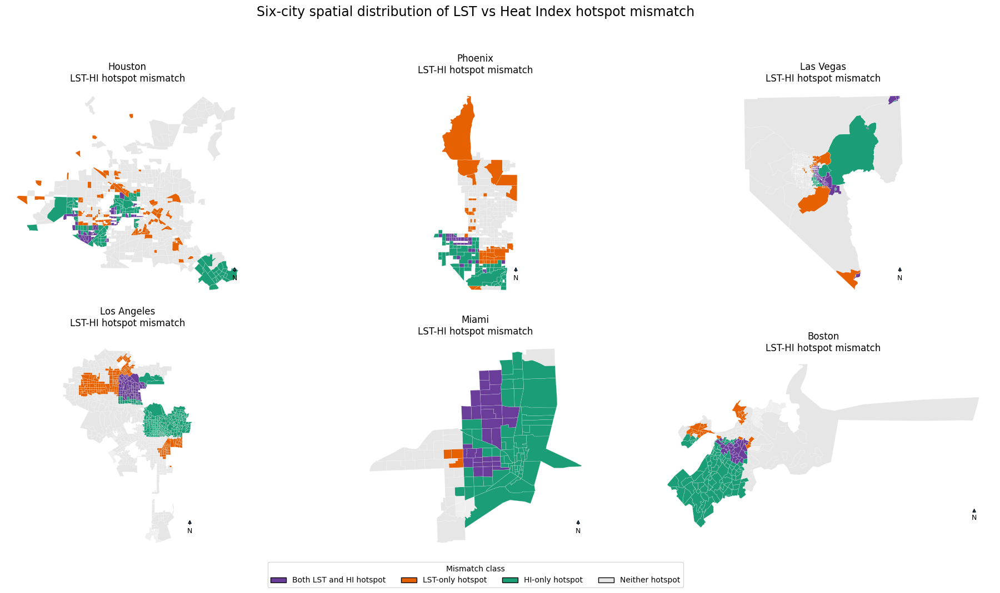

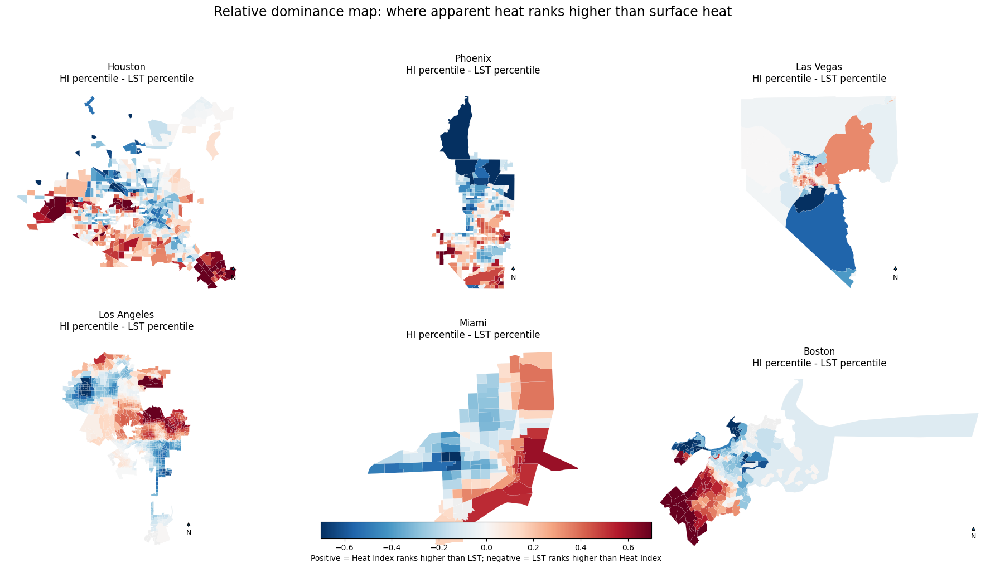

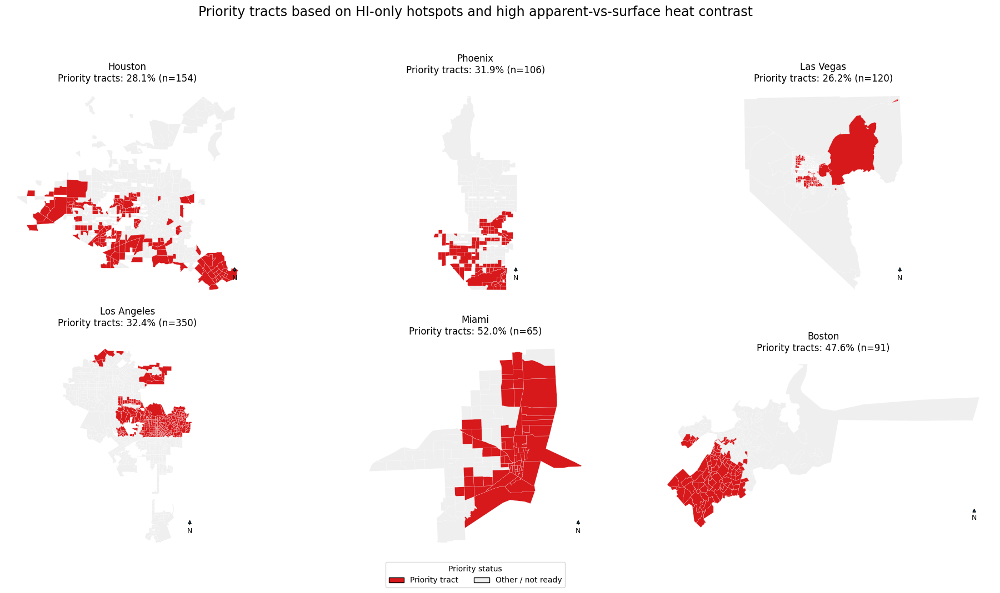


SOURCE CHECK:


,city,status,n_total,n_ready,lst_col,hi_col,path_short
0,houston,ok,549,549,lst_c,hi_c,outputs/pilot/alphaearth/paper_gis_figures/thr...
1,phoenix,ok,332,332,lst_c,hi_c,outputs/pilot/alphaearth/paper_gis_advanced_fi...
2,las_vegas,ok,458,458,lst_c,hi_c,outputs/pilot/alphaearth/paper_gis_advanced_fi...
3,los_angeles,ok,1108,1080,lst_c,hi_c,data/processed/los_angeles/los_angeles_master_...
4,miami,ok,129,125,lst_c,hi_c,data/processed/miami/miami_master_lst_hi_hotco...
5,boston,ok,207,191,lst_c,hi_c,data/processed/boston/boston_master_lst_hi_hot...



SIX-CITY SUMMARY:


,city,city_label,n_total,n_ready,ready_pct,mean_lst_c,mean_hi_c,mean_hi_minus_lst,q75_lst_c,q75_hi_c,lst_hi_corr,mean_hi_minus_lst_pct,priority_n,priority_pct
0,houston,Houston,549,549,100.000,47.944,34.155,-13.789,49.662,34.198,0.341,-0.0,154,28.051
1,phoenix,Phoenix,332,332,100.000,57.057,33.288,-23.769,58.368,33.686,0.291,0.0,106,31.928
2,las_vegas,Las Vegas,458,458,100.000,47.003,31.097,-15.906,48.002,31.990,0.750,-0.0,120,26.201
3,los_angeles,Los Angeles,1108,1080,97.473,39.580,22.317,-17.263,41.440,22.773,0.350,0.0,350,31.588
4,miami,Miami,129,125,96.899,35.490,32.540,-2.950,36.396,32.619,0.214,0.0,65,50.388
5,boston,Boston,207,191,92.271,31.840,20.890,-10.950,32.737,20.903,0.000,-0.0,91,43.961



MISMATCH COUNTS:


,city,city_label,mismatch_class,n,pct
0,houston,Houston,Both LST and HI hotspot,51,9.290
1,houston,Houston,LST-only hotspot,87,15.847
2,houston,Houston,HI-only hotspot,89,16.211
3,houston,Houston,Neither hotspot,322,58.652
4,houston,Houston,Missing,0,0.000
5,phoenix,Phoenix,Both LST and HI hotspot,36,10.843
6,phoenix,Phoenix,LST-only hotspot,47,14.157
7,phoenix,Phoenix,HI-only hotspot,61,18.373
8,phoenix,Phoenix,Neither hotspot,188,56.627
9,phoenix,Phoenix,Missing,0,0.000



ROWS BY CITY:


,city,n
0,boston,207
1,houston,549
2,las_vegas,458
3,los_angeles,1108
4,miami,129
5,phoenix,332



Saved outputs:
- outputs/pilot/alphaearth/six_city_expansion_figures/six_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg
- outputs/pilot/alphaearth/six_city_expansion_figures/six_city_analysis_ready_tracts.csv
- outputs/pilot/alphaearth/six_city_expansion_figures/six_city_source_check.csv
- outputs/pilot/alphaearth/six_city_expansion_figures/six_city_summary_table.csv
- outputs/pilot/alphaearth/six_city_expansion_figures/six_city_mismatch_counts.csv
- outputs/pilot/alphaearth/six_city_expansion_figures/six_city_source_debug_all_candidates.csv
- outputs/pilot/alphaearth/six_city_expansion_figures/SIXCITY_fig1_mismatch_class_maps.png
- outputs/pilot/alphaearth/six_city_expansion_figures/SIXCITY_fig2_relative_dominance_maps.png
- outputs/pilot/alphaearth/six_city_expansion_figures/SIXCITY_fig3_priority_tract_maps.png

DONE. Send me the output screenshots, especially the three maps and the summary table.


In [6]:
from pathlib import Path
import re
import warnings
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import Normalize

warnings.filterwarnings("ignore")

# ============================================================
# STEP 4: Build 6-city unified workflow and paper-map outputs
#
# Cities:
#   Houston, Phoenix, Las Vegas, Los Angeles, Miami, Boston
#
# Goal:
#   Combine existing 3-city results + new 3-city results.
#   Generate GIS-first figures for paper-style reporting.
#
# Outputs:
#   outputs/pilot/alphaearth/six_city_expansion_figures/
# ============================================================

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
OUTDIR = PROJECT / "outputs" / "pilot" / "alphaearth" / "six_city_expansion_figures"
OUTDIR.mkdir(parents=True, exist_ok=True)

CITY_ORDER = ["houston", "phoenix", "las_vegas", "los_angeles", "miami", "boston"]

CITY_LABELS = {
    "houston": "Houston",
    "phoenix": "Phoenix",
    "las_vegas": "Las Vegas",
    "los_angeles": "Los Angeles",
    "miami": "Miami",
    "boston": "Boston",
}

MISMATCH_ORDER = [
    "Both LST and HI hotspot",
    "LST-only hotspot",
    "HI-only hotspot",
    "Neither hotspot",
    "Missing",
]

MISMATCH_COLORS = {
    "Both LST and HI hotspot": "#6A3D9A",
    "LST-only hotspot": "#E66101",
    "HI-only hotspot": "#1B9E77",
    "Neither hotspot": "#E6E6E6",
    "Missing": "#A6A6A6",
}

print("PROJECT exists:", PROJECT.exists())
print("OUTDIR:", OUTDIR)

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------
def norm_text(x):
    x = str(x).strip().lower()
    x = re.sub(r"[^a-z0-9]+", "_", x)
    x = re.sub(r"_+", "_", x).strip("_")
    return x

def find_col(columns, candidates):
    cols = list(columns)
    lower_map = {str(c).lower(): c for c in cols}

    for cand in candidates:
        if cand.lower() in lower_map:
            return lower_map[cand.lower()]

    norm_map = {norm_text(c): c for c in cols}
    for cand in candidates:
        nc = norm_text(cand)
        if nc in norm_map:
            return norm_map[nc]

    return None

def candidate_paths_for_city(city_id):
    paths = []

    explicit = [
        PROJECT / "data" / "processed" / city_id / f"{city_id}_master_lst_hi_hotcompare.gpkg",
        PROJECT / "data" / "processed" / city_id / f"{city_id}_master_with_lst_hi_fixed.gpkg",
        PROJECT / "city_intake" / city_id / "working" / f"{city_id}_heat_master_template.gpkg",
        PROJECT / "city_intake" / city_id / "working" / f"{city_id}_master_lst_hi_hotcompare.gpkg",
        PROJECT / "outputs" / "pilot" / "alphaearth" / "city_expansion" / "step3_new_city_lst_hi_combined_FIXED.gpkg",
        PROJECT / "outputs" / "pilot" / "alphaearth" / "paper_gis_figures" / "three_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg",
        PROJECT / "outputs" / "pilot" / "alphaearth" / "paper_gis_advanced_figures" / "three_city_GIS_ADVANCED.gpkg",
    ]

    paths.extend(explicit)

    glob_patterns = [
        f"data/processed/{city_id}/*.gpkg",
        f"city_intake/{city_id}/working/*.gpkg",
        "outputs/pilot/alphaearth/city_expansion/*.gpkg",
        "outputs/pilot/alphaearth/paper_gis_figures/*.gpkg",
        "outputs/pilot/alphaearth/paper_gis_advanced_figures/*.gpkg",
        "outputs/pilot/alphaearth/paper_gis_hotspot_shift_figures/*.gpkg",
    ]

    for pattern in glob_patterns:
        paths.extend(PROJECT.glob(pattern))

    seen = set()
    clean = []
    for p in paths:
        p = Path(p)
        if p.exists() and p not in seen:
            clean.append(p)
            seen.add(p)

    return clean

def try_load_city_from_path(path, city_id):
    try:
        gdf = gpd.read_file(path)
    except Exception as e:
        return None, {
            "city": city_id,
            "path": str(path),
            "status": "read_failed",
            "reason": str(e)[:120],
            "n_total": 0,
            "n_ready": 0,
            "score": -999999,
        }

    if "geometry" not in gdf.columns:
        return None, {
            "city": city_id,
            "path": str(path),
            "status": "no_geometry",
            "reason": "no geometry column",
            "n_total": len(gdf),
            "n_ready": 0,
            "score": -999999,
        }

    city_col = find_col(gdf.columns, ["city", "CITY", "city_name", "City"])

    if city_col is not None:
        city_norm = gdf[city_col].map(norm_text)
        gdf_city = gdf[city_norm == city_id].copy()

        if len(gdf_city) == 0:
            return None, {
                "city": city_id,
                "path": str(path),
                "status": "wrong_city",
                "reason": f"city column exists but no rows for {city_id}",
                "n_total": len(gdf),
                "n_ready": 0,
                "score": -999999,
            }
    else:
        if city_id not in norm_text(path):
            return None, {
                "city": city_id,
                "path": str(path),
                "status": "not_city_specific",
                "reason": "no city column and path does not match city",
                "n_total": len(gdf),
                "n_ready": 0,
                "score": -999999,
            }

        gdf_city = gdf.copy()

    geoid_col = find_col(gdf_city.columns, ["GEOID", "geoid", "GEOID20", "tract_geoid"])
    lst_col = find_col(gdf_city.columns, ["lst_c", "lst_summer_mean_c", "LST_C", "LST", "lst"])
    hi_col = find_col(gdf_city.columns, ["hi_c", "hi_summer_mean_c", "HI_C", "Heat_Index", "heat_index"])

    if geoid_col is None or lst_col is None or hi_col is None:
        missing = []
        if geoid_col is None:
            missing.append("GEOID")
        if lst_col is None:
            missing.append("LST")
        if hi_col is None:
            missing.append("HI")

        return None, {
            "city": city_id,
            "path": str(path),
            "status": "missing_columns",
            "reason": "missing " + ", ".join(missing),
            "n_total": len(gdf_city),
            "n_ready": 0,
            "score": -999999,
        }

    out = gdf_city.copy()

    if out.crs is None:
        out = out.set_crs("EPSG:4326")

    out = out.to_crs("EPSG:4326")

    out["city"] = city_id
    out["city_label"] = CITY_LABELS[city_id]
    out["GEOID"] = out[geoid_col].astype(str)
    out["lst_c"] = pd.to_numeric(out[lst_col], errors="coerce")
    out["hi_c"] = pd.to_numeric(out[hi_col], errors="coerce")
    out["hi_minus_lst"] = out["hi_c"] - out["lst_c"]
    out["analysis_ready"] = out[["lst_c", "hi_c"]].notna().all(axis=1)

    n_total = len(out)
    n_ready = int(out["analysis_ready"].sum())

    score = n_ready * 1000 + n_total

    path_lower = str(path).lower()
    if "master_lst_hi_hotcompare" in path_lower:
        score += 50000
    if "heat_master_template" in path_lower:
        score += 30000
    if "gis_ready" in path_lower:
        score += 10000
    if "advanced" in path_lower:
        score += 5000

    keep_cols = [
        "city",
        "city_label",
        "GEOID",
        "lst_c",
        "hi_c",
        "hi_minus_lst",
        "analysis_ready",
        "geometry",
    ]

    out = out[keep_cols].copy()

    return out, {
        "city": city_id,
        "path": str(path),
        "status": "ok",
        "reason": "ok",
        "n_total": n_total,
        "n_ready": n_ready,
        "score": score,
        "lst_col": lst_col,
        "hi_col": hi_col,
        "geoid_col": geoid_col,
    }

def load_best_city(city_id):
    paths = candidate_paths_for_city(city_id)

    checked = []
    loaded = []

    for p in paths:
        gdf_city, info = try_load_city_from_path(p, city_id)
        checked.append(info)

        if gdf_city is not None and info["n_ready"] > 0:
            loaded.append((gdf_city, info))

    checked_df = pd.DataFrame(checked)

    if len(loaded) == 0:
        print(f"\nNo usable source found for {city_id}. Checked top candidates:")
        display(checked_df.sort_values("score", ascending=False).head(20))
        raise FileNotFoundError(f"No usable LST + HI geospatial source for {city_id}")

    best_gdf, best_info = sorted(loaded, key=lambda x: x[1]["score"], reverse=True)[0]

    return best_gdf, best_info, checked_df

def add_city_relative_metrics(gdf):
    parts = []

    for city_id, g in gdf.groupby("city"):
        g = g.copy()

        ready = g["analysis_ready"]

        g["lst_pct_city"] = np.nan
        g["hi_pct_city"] = np.nan
        g["lst_z_city"] = np.nan
        g["hi_z_city"] = np.nan
        g["hi_minus_lst_pct"] = np.nan
        g["hi_minus_lst_z"] = np.nan

        if ready.sum() > 0:
            g.loc[ready, "lst_pct_city"] = g.loc[ready, "lst_c"].rank(pct=True)
            g.loc[ready, "hi_pct_city"] = g.loc[ready, "hi_c"].rank(pct=True)

            lst_mean = g.loc[ready, "lst_c"].mean()
            lst_std = g.loc[ready, "lst_c"].std()
            hi_mean = g.loc[ready, "hi_c"].mean()
            hi_std = g.loc[ready, "hi_c"].std()

            if lst_std and not np.isnan(lst_std):
                g.loc[ready, "lst_z_city"] = (g.loc[ready, "lst_c"] - lst_mean) / lst_std

            if hi_std and not np.isnan(hi_std):
                g.loc[ready, "hi_z_city"] = (g.loc[ready, "hi_c"] - hi_mean) / hi_std

            g.loc[ready, "hi_minus_lst_pct"] = (
                g.loc[ready, "hi_pct_city"] - g.loc[ready, "lst_pct_city"]
            )

            g.loc[ready, "hi_minus_lst_z"] = (
                g.loc[ready, "hi_z_city"] - g.loc[ready, "lst_z_city"]
            )

            q75_lst = g.loc[ready, "lst_c"].quantile(0.75)
            q75_hi = g.loc[ready, "hi_c"].quantile(0.75)
            q75_gap_pct = g.loc[ready, "hi_minus_lst_pct"].quantile(0.75)

            g["lst_hot_q75"] = ready & (g["lst_c"] >= q75_lst)
            g["hi_hot_q75"] = ready & (g["hi_c"] >= q75_hi)

            g["mismatch_class"] = "Missing"
            g.loc[ready & g["lst_hot_q75"] & g["hi_hot_q75"], "mismatch_class"] = "Both LST and HI hotspot"
            g.loc[ready & g["lst_hot_q75"] & (~g["hi_hot_q75"]), "mismatch_class"] = "LST-only hotspot"
            g.loc[ready & (~g["lst_hot_q75"]) & g["hi_hot_q75"], "mismatch_class"] = "HI-only hotspot"
            g.loc[ready & (~g["lst_hot_q75"]) & (~g["hi_hot_q75"]), "mismatch_class"] = "Neither hotspot"

            g["priority_flag"] = (
                ready
                & (
                    (g["mismatch_class"] == "HI-only hotspot")
                    | (g["hi_minus_lst_pct"] >= q75_gap_pct)
                )
            )
        else:
            g["lst_hot_q75"] = False
            g["hi_hot_q75"] = False
            g["mismatch_class"] = "Missing"
            g["priority_flag"] = False

        parts.append(g)

    return gpd.GeoDataFrame(
        pd.concat(parts, ignore_index=True),
        geometry="geometry",
        crs="EPSG:4326",
    )

def safe_corr(x, y):
    x = pd.to_numeric(x, errors="coerce")
    y = pd.to_numeric(y, errors="coerce")
    mask = x.notna() & y.notna()

    if mask.sum() < 3:
        return np.nan

    return x[mask].corr(y[mask])

def make_city_summary(gdf):
    rows = []

    for city_id, g in gdf.groupby("city"):
        ready = g[g["analysis_ready"]].copy()

        if len(ready) == 0:
            rows.append({
                "city": city_id,
                "city_label": CITY_LABELS.get(city_id, city_id),
                "n_total": len(g),
                "n_ready": 0,
            })
            continue

        rows.append({
            "city": city_id,
            "city_label": CITY_LABELS.get(city_id, city_id),
            "n_total": len(g),
            "n_ready": len(ready),
            "ready_pct": len(ready) / len(g) * 100,
            "mean_lst_c": ready["lst_c"].mean(),
            "mean_hi_c": ready["hi_c"].mean(),
            "mean_hi_minus_lst": ready["hi_minus_lst"].mean(),
            "q75_lst_c": ready["lst_c"].quantile(0.75),
            "q75_hi_c": ready["hi_c"].quantile(0.75),
            "lst_hi_corr": safe_corr(ready["lst_c"], ready["hi_c"]),
            "mean_hi_minus_lst_pct": ready["hi_minus_lst_pct"].mean(),
            "priority_n": int(g["priority_flag"].sum()),
            "priority_pct": g["priority_flag"].mean() * 100,
        })

    out = pd.DataFrame(rows)
    out["city"] = pd.Categorical(out["city"], categories=CITY_ORDER, ordered=True)
    out = out.sort_values("city").reset_index(drop=True)

    return out

def make_mismatch_counts(gdf):
    rows = []

    for city_id, g in gdf.groupby("city"):
        ready_n = int(g["analysis_ready"].sum())

        for cls in MISMATCH_ORDER:
            n = int((g["mismatch_class"] == cls).sum())

            if cls == "Missing":
                denom = len(g)
            else:
                denom = ready_n

            pct = n / denom * 100 if denom else np.nan

            rows.append({
                "city": city_id,
                "city_label": CITY_LABELS.get(city_id, city_id),
                "mismatch_class": cls,
                "n": n,
                "pct": pct,
            })

    out = pd.DataFrame(rows)
    out["city"] = pd.Categorical(out["city"], categories=CITY_ORDER, ordered=True)
    out["mismatch_class"] = pd.Categorical(out["mismatch_class"], categories=MISMATCH_ORDER, ordered=True)
    out = out.sort_values(["city", "mismatch_class"]).reset_index(drop=True)

    return out

def get_local_plot_gdf(g):
    g = g.copy()

    try:
        local_crs = g.estimate_utm_crs()
        if local_crs is None:
            local_crs = "EPSG:3857"
    except Exception:
        local_crs = "EPSG:3857"

    return g.to_crs(local_crs)

def add_north_arrow(ax, x=0.94, y=0.10):
    ax.annotate(
        "N",
        xy=(x, y + 0.06),
        xytext=(x, y),
        xycoords="axes fraction",
        ha="center",
        va="center",
        fontsize=9,
        arrowprops=dict(arrowstyle="-|>", lw=1.0),
    )

def plot_mismatch_maps(gdf, outpath):
    fig, axes = plt.subplots(2, 3, figsize=(19, 11))
    axes = axes.flatten()

    for ax, city_id in zip(axes, CITY_ORDER):
        g = gdf[gdf["city"] == city_id].copy()
        g = get_local_plot_gdf(g)

        g.plot(ax=ax, color="#EFEFEF", edgecolor="white", linewidth=0.15)

        for cls in MISMATCH_ORDER:
            if cls == "Missing":
                continue

            sub = g[g["mismatch_class"] == cls].copy()
            if len(sub) > 0:
                sub.plot(
                    ax=ax,
                    color=MISMATCH_COLORS[cls],
                    edgecolor="white",
                    linewidth=0.15,
                )

        ax.set_title(f"{CITY_LABELS[city_id]}\nLST-HI hotspot mismatch", fontsize=12)
        ax.axis("off")
        add_north_arrow(ax)

    handles = [
        mpatches.Patch(
            facecolor=MISMATCH_COLORS[c],
            edgecolor="black",
            label=c,
        )
        for c in MISMATCH_ORDER
        if c != "Missing"
    ]

    fig.legend(
        handles=handles,
        loc="lower center",
        ncol=4,
        frameon=True,
        title="Mismatch class",
        bbox_to_anchor=(0.5, 0.02),
    )

    fig.suptitle(
        "Six-city spatial distribution of LST vs Heat Index hotspot mismatch",
        fontsize=17,
        y=0.98,
    )

    plt.tight_layout(rect=[0, 0.07, 1, 0.95])
    fig.savefig(outpath, dpi=300, bbox_inches="tight")
    plt.show()

def plot_relative_dominance_maps(gdf, outpath):
    fig, axes = plt.subplots(2, 3, figsize=(19, 11))
    axes = axes.flatten()

    vmin = -0.7
    vmax = 0.7

    for ax, city_id in zip(axes, CITY_ORDER):
        g = gdf[gdf["city"] == city_id].copy()
        g = get_local_plot_gdf(g)

        g.plot(ax=ax, color="#EFEFEF", edgecolor="white", linewidth=0.12)

        ready = g[g["analysis_ready"]].copy()

        if len(ready) > 0:
            ready.plot(
                column="hi_minus_lst_pct",
                ax=ax,
                cmap="RdBu_r",
                vmin=vmin,
                vmax=vmax,
                edgecolor="white",
                linewidth=0.10,
            )

        ax.set_title(
            f"{CITY_LABELS[city_id]}\nHI percentile - LST percentile",
            fontsize=12,
        )
        ax.axis("off")
        add_north_arrow(ax)

    sm = plt.cm.ScalarMappable(
        cmap="RdBu_r",
        norm=Normalize(vmin=vmin, vmax=vmax),
    )
    sm._A = []

    cbar = fig.colorbar(
        sm,
        ax=axes.tolist(),
        orientation="horizontal",
        fraction=0.035,
        pad=0.04,
    )
    cbar.set_label(
        "Positive = Heat Index ranks higher than LST; negative = LST ranks higher than Heat Index",
        fontsize=10,
    )

    fig.suptitle(
        "Relative dominance map: where apparent heat ranks higher than surface heat",
        fontsize=17,
        y=0.98,
    )

    plt.tight_layout(rect=[0, 0.07, 1, 0.95])
    fig.savefig(outpath, dpi=300, bbox_inches="tight")
    plt.show()

def plot_priority_maps(gdf, outpath):
    fig, axes = plt.subplots(2, 3, figsize=(19, 11))
    axes = axes.flatten()

    for ax, city_id in zip(axes, CITY_ORDER):
        g = gdf[gdf["city"] == city_id].copy()
        g = get_local_plot_gdf(g)

        g.plot(ax=ax, color="#EFEFEF", edgecolor="white", linewidth=0.15)

        priority = g[g["priority_flag"] == True].copy()

        if len(priority) > 0:
            priority.plot(
                ax=ax,
                color="#D7191C",
                edgecolor="white",
                linewidth=0.18,
            )

        n_priority = int(priority.shape[0])
        n_ready = int(g["analysis_ready"].sum())
        pct = n_priority / n_ready * 100 if n_ready else np.nan

        ax.set_title(
            f"{CITY_LABELS[city_id]}\nPriority tracts: {pct:.1f}% (n={n_priority})",
            fontsize=12,
        )
        ax.axis("off")
        add_north_arrow(ax)

    handles = [
        mpatches.Patch(facecolor="#D7191C", edgecolor="black", label="Priority tract"),
        mpatches.Patch(facecolor="#EFEFEF", edgecolor="black", label="Other / not ready"),
    ]

    fig.legend(
        handles=handles,
        loc="lower center",
        ncol=2,
        frameon=True,
        title="Priority status",
        bbox_to_anchor=(0.5, 0.02),
    )

    fig.suptitle(
        "Priority tracts based on HI-only hotspots and high apparent-vs-surface heat contrast",
        fontsize=17,
        y=0.98,
    )

    plt.tight_layout(rect=[0, 0.07, 1, 0.95])
    fig.savefig(outpath, dpi=300, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------
# Load all six cities
# ------------------------------------------------------------
city_gdfs = []
source_rows = []
debug_tables = []

for city_id in CITY_ORDER:
    print("\n" + "=" * 90)
    print("Loading:", city_id)

    gdf_city, best_info, checked_df = load_best_city(city_id)

    city_gdfs.append(gdf_city)
    source_rows.append(best_info)

    checked_df["selected"] = checked_df["path"] == best_info["path"]
    debug_tables.append(checked_df)

    print("Selected source:")
    print(" -", Path(best_info["path"]).relative_to(PROJECT))
    print(" - rows:", best_info["n_total"], "ready:", best_info["n_ready"])
    print(" - LST col:", best_info.get("lst_col"))
    print(" - HI col:", best_info.get("hi_col"))

combined = gpd.GeoDataFrame(
    pd.concat(city_gdfs, ignore_index=True),
    geometry="geometry",
    crs="EPSG:4326",
)

combined = add_city_relative_metrics(combined)

source_check = pd.DataFrame(source_rows)
source_check["path_short"] = source_check["path"].apply(
    lambda p: str(Path(p).relative_to(PROJECT)) if str(p).startswith(str(PROJECT)) else str(p)
)

city_summary = make_city_summary(combined)
mismatch_counts = make_mismatch_counts(combined)

# ------------------------------------------------------------
# Save tables and geospatial outputs
# ------------------------------------------------------------
combined_path = OUTDIR / "six_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg"
combined_csv_path = OUTDIR / "six_city_analysis_ready_tracts.csv"
source_path = OUTDIR / "six_city_source_check.csv"
summary_path = OUTDIR / "six_city_summary_table.csv"
mismatch_path = OUTDIR / "six_city_mismatch_counts.csv"
debug_path = OUTDIR / "six_city_source_debug_all_candidates.csv"

combined.to_file(combined_path, layer="six_city_lstadaptive_hi_mismatch", driver="GPKG")
combined[[c for c in combined.columns if c != "geometry"]].to_csv(combined_csv_path, index=False)

source_check.to_csv(source_path, index=False)
city_summary.to_csv(summary_path, index=False)
mismatch_counts.to_csv(mismatch_path, index=False)
pd.concat(debug_tables, ignore_index=True).to_csv(debug_path, index=False)

# ------------------------------------------------------------
# Generate main figures
# ------------------------------------------------------------
fig1_path = OUTDIR / "SIXCITY_fig1_mismatch_class_maps.png"
fig2_path = OUTDIR / "SIXCITY_fig2_relative_dominance_maps.png"
fig3_path = OUTDIR / "SIXCITY_fig3_priority_tract_maps.png"

plot_mismatch_maps(combined, fig1_path)
plot_relative_dominance_maps(combined, fig2_path)
plot_priority_maps(combined, fig3_path)

# ------------------------------------------------------------
# Display final checks
# ------------------------------------------------------------
print("\n" + "=" * 90)
print("SOURCE CHECK:")
display(source_check[["city", "status", "n_total", "n_ready", "lst_col", "hi_col", "path_short"]])

print("\nSIX-CITY SUMMARY:")
display(city_summary.round(3))

print("\nMISMATCH COUNTS:")
display(mismatch_counts.round(3))

print("\nROWS BY CITY:")
display(combined.groupby("city").size().reset_index(name="n"))

print("\nSaved outputs:")
for p in [
    combined_path,
    combined_csv_path,
    source_path,
    summary_path,
    mismatch_path,
    debug_path,
    fig1_path,
    fig2_path,
    fig3_path,
]:
    print("-", p.relative_to(PROJECT))

print("\nDONE. Send me the output screenshots, especially the three maps and the summary table.")

Input GPKG exists: True
Input summary exists: True
Input mismatch exists: True
OUTDIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/six_city_mechanism_figures

Six-city mechanism classification:


,city_label,city_context,n_ready,mean_lst_c,mean_hi_c,lst_hi_corr,Both LST and HI hotspot,LST-only hotspot,HI-only hotspot,hi_minus_lst_hotspot_pct,priority_pct,mechanism_type
0,Houston,Coastal / humid,549,47.944,34.155,0.341,9.290,15.847,16.211,0.364,28.051,Mixed / transitional
1,Phoenix,Inland / desert,332,57.057,33.288,0.291,10.843,14.157,18.373,4.217,31.928,Mixed / transitional
2,Las Vegas,Inland / desert,458,47.003,31.097,0.750,16.157,8.952,8.952,0.000,26.201,Coupled LST-HI
3,Los Angeles,Coastal / dry,1080,39.580,22.317,0.350,7.222,17.778,25.926,8.148,31.588,Moderate HI-dominant
4,Miami,Coastal / humid,125,35.490,32.540,0.214,23.200,2.400,52.000,49.600,50.388,Strong HI-dominant
5,Boston,Coastal / temperate,191,31.840,20.890,0.000,13.613,11.518,47.644,36.126,43.961,Strong HI-dominant


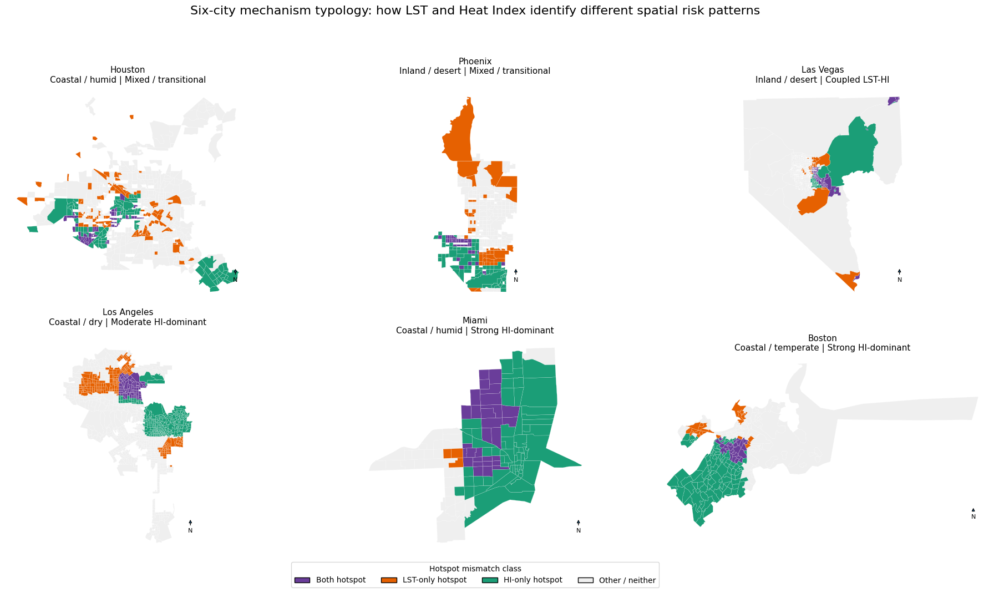

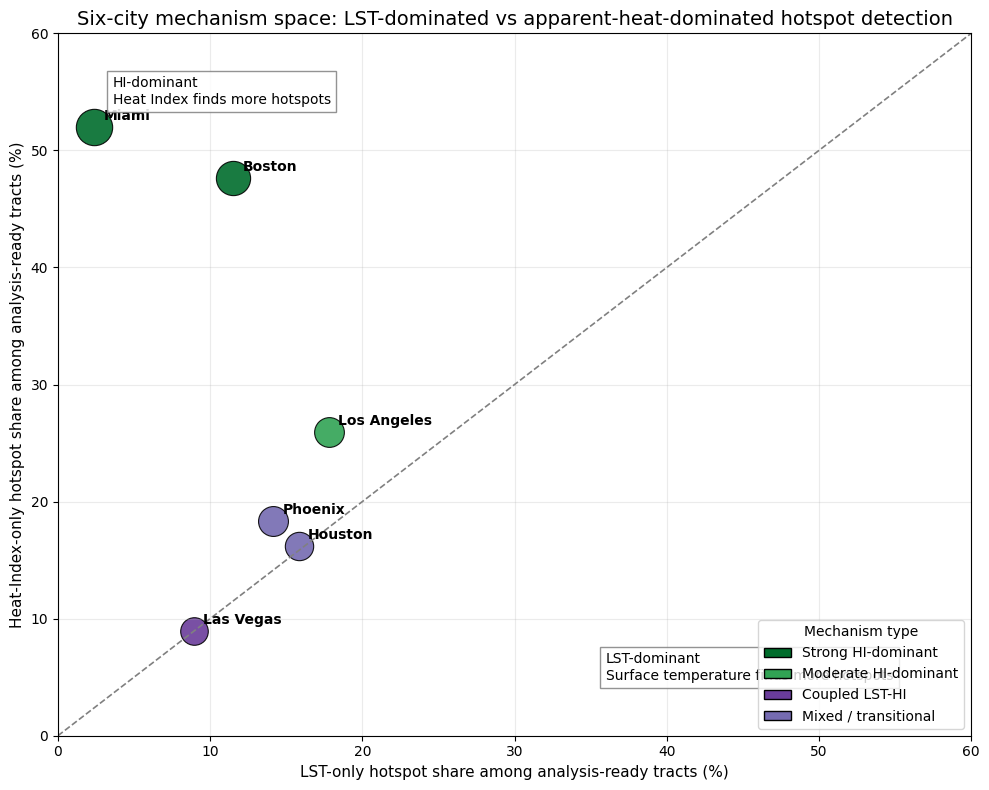

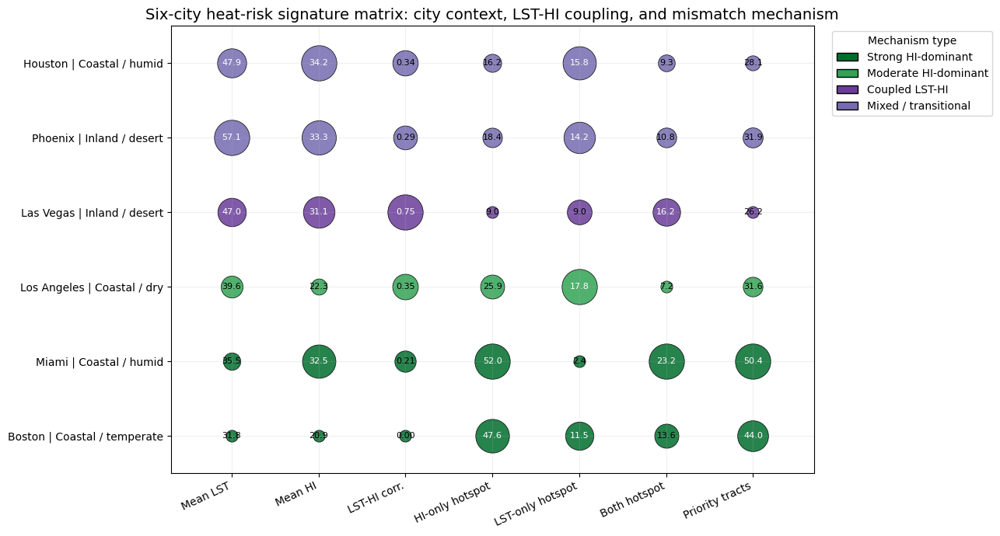


Interpretation notes:
- Houston (Coastal / humid) is classified as Mixed / transitional. HI-only hotspot share = 16.2%, LST-only hotspot share = 15.8%, both-hotspot share = 9.3%, priority tract share = 28.1%, LST-HI correlation = 0.34.
- Phoenix (Inland / desert) is classified as Mixed / transitional. HI-only hotspot share = 18.4%, LST-only hotspot share = 14.2%, both-hotspot share = 10.8%, priority tract share = 31.9%, LST-HI correlation = 0.29.
- Las Vegas (Inland / desert) is classified as Coupled LST-HI. HI-only hotspot share = 9.0%, LST-only hotspot share = 9.0%, both-hotspot share = 16.2%, priority tract share = 26.2%, LST-HI correlation = 0.75.
- Los Angeles (Coastal / dry) is classified as Moderate HI-dominant. HI-only hotspot share = 25.9%, LST-only hotspot share = 17.8%, both-hotspot share = 7.2%, priority tract share = 31.6%, LST-HI correlation = 0.35.
- Miami (Coastal / humid) is classified as Strong HI-dominant. HI-only hotspot share = 52.0%, LST-only hotspot share = 2.4%

In [7]:
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import Normalize
import warnings

warnings.filterwarnings("ignore")

# ============================================================
# STEP 5: Six-city mechanism interpretation figures
#
# Goal:
#   Move from "maps only" to paper-style mechanism framing:
#   Which cities are LST-dominated, HI-dominated, or coupled?
#
# Inputs from Step 4:
#   six_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg
#   six_city_summary_table.csv
#   six_city_mismatch_counts.csv
#
# Outputs:
#   outputs/pilot/alphaearth/six_city_mechanism_figures/
# ============================================================

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")

IN_DIR = PROJECT / "outputs" / "pilot" / "alphaearth" / "six_city_expansion_figures"
OUTDIR = PROJECT / "outputs" / "pilot" / "alphaearth" / "six_city_mechanism_figures"
OUTDIR.mkdir(parents=True, exist_ok=True)

GPKG_PATH = IN_DIR / "six_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg"
SUMMARY_PATH = IN_DIR / "six_city_summary_table.csv"
MISMATCH_PATH = IN_DIR / "six_city_mismatch_counts.csv"

CITY_ORDER = ["houston", "phoenix", "las_vegas", "los_angeles", "miami", "boston"]

CITY_LABELS = {
    "houston": "Houston",
    "phoenix": "Phoenix",
    "las_vegas": "Las Vegas",
    "los_angeles": "Los Angeles",
    "miami": "Miami",
    "boston": "Boston",
}

CITY_CONTEXT = {
    "houston": "Coastal / humid",
    "phoenix": "Inland / desert",
    "las_vegas": "Inland / desert",
    "los_angeles": "Coastal / dry",
    "miami": "Coastal / humid",
    "boston": "Coastal / temperate",
}

MISMATCH_COLORS = {
    "Both LST and HI hotspot": "#6A3D9A",
    "LST-only hotspot": "#E66101",
    "HI-only hotspot": "#1B9E77",
    "Neither hotspot": "#E6E6E6",
    "Missing": "#A6A6A6",
}

print("Input GPKG exists:", GPKG_PATH.exists())
print("Input summary exists:", SUMMARY_PATH.exists())
print("Input mismatch exists:", MISMATCH_PATH.exists())
print("OUTDIR:", OUTDIR)

# ------------------------------------------------------------
# Load data
# ------------------------------------------------------------
gdf = gpd.read_file(GPKG_PATH)
summary = pd.read_csv(SUMMARY_PATH)
mismatch = pd.read_csv(MISMATCH_PATH)

gdf["city"] = gdf["city"].astype(str)
gdf["city_label"] = gdf["city"].map(CITY_LABELS).fillna(gdf["city"])
gdf["city_context"] = gdf["city"].map(CITY_CONTEXT).fillna("Other")

for col in ["analysis_ready", "priority_flag", "lst_hot_q75", "hi_hot_q75"]:
    if col in gdf.columns:
        if gdf[col].dtype != bool:
            gdf[col] = gdf[col].astype(str).str.lower().isin(["true", "1", "yes"])

# ------------------------------------------------------------
# Build city mechanism table
# ------------------------------------------------------------
pivot = (
    mismatch
    .pivot_table(
        index="city",
        columns="mismatch_class",
        values="pct",
        aggfunc="first"
    )
    .reset_index()
)

for c in [
    "Both LST and HI hotspot",
    "LST-only hotspot",
    "HI-only hotspot",
    "Neither hotspot",
    "Missing",
]:
    if c not in pivot.columns:
        pivot[c] = 0

mechanism = summary.merge(pivot, on="city", how="left")

mechanism["city_label"] = mechanism["city"].map(CITY_LABELS)
mechanism["city_context"] = mechanism["city"].map(CITY_CONTEXT)

mechanism["hi_minus_lst_hotspot_pct"] = (
    mechanism["HI-only hotspot"] - mechanism["LST-only hotspot"]
)

mechanism["hotspot_union_pct"] = (
    mechanism["Both LST and HI hotspot"]
    + mechanism["LST-only hotspot"]
    + mechanism["HI-only hotspot"]
)

mechanism["hotspot_overlap_ratio"] = np.where(
    mechanism["hotspot_union_pct"] > 0,
    mechanism["Both LST and HI hotspot"] / mechanism["hotspot_union_pct"],
    np.nan
)

def classify_mechanism(row):
    diff = row["hi_minus_lst_hotspot_pct"]
    overlap = row["hotspot_overlap_ratio"]
    corr = row.get("lst_hi_corr", np.nan)

    if diff >= 20:
        return "Strong HI-dominant"
    elif diff >= 8:
        return "Moderate HI-dominant"
    elif diff <= -8:
        return "LST-dominant"
    elif overlap >= 0.40 or corr >= 0.60:
        return "Coupled LST-HI"
    else:
        return "Mixed / transitional"

mechanism["mechanism_type"] = mechanism.apply(classify_mechanism, axis=1)

MECH_COLORS = {
    "Strong HI-dominant": "#006D2C",
    "Moderate HI-dominant": "#31A354",
    "LST-dominant": "#D95F0E",
    "Coupled LST-HI": "#6A3D9A",
    "Mixed / transitional": "#756BB1",
}

mechanism["city"] = pd.Categorical(mechanism["city"], categories=CITY_ORDER, ordered=True)
mechanism = mechanism.sort_values("city").reset_index(drop=True)

mechanism_out = OUTDIR / "six_city_mechanism_classification.csv"
mechanism.to_csv(mechanism_out, index=False)

print("\nSix-city mechanism classification:")
display(
    mechanism[
        [
            "city_label",
            "city_context",
            "n_ready",
            "mean_lst_c",
            "mean_hi_c",
            "lst_hi_corr",
            "Both LST and HI hotspot",
            "LST-only hotspot",
            "HI-only hotspot",
            "hi_minus_lst_hotspot_pct",
            "priority_pct",
            "mechanism_type",
        ]
    ].round(3)
)

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------
def get_local_plot_gdf(g):
    g = g.copy()

    try:
        local_crs = g.estimate_utm_crs()
        if local_crs is None:
            local_crs = "EPSG:3857"
    except Exception:
        local_crs = "EPSG:3857"

    return g.to_crs(local_crs)

def add_north_arrow(ax, x=0.94, y=0.10):
    ax.annotate(
        "N",
        xy=(x, y + 0.06),
        xytext=(x, y),
        xycoords="axes fraction",
        ha="center",
        va="center",
        fontsize=8,
        arrowprops=dict(arrowstyle="-|>", lw=0.9),
    )

# ------------------------------------------------------------
# Figure 4:
# Mechanism typology maps
# ------------------------------------------------------------
fig, axes = plt.subplots(2, 3, figsize=(19, 11))
axes = axes.flatten()

for ax, city_id in zip(axes, CITY_ORDER):
    city_gdf = gdf[gdf["city"] == city_id].copy()
    city_gdf = get_local_plot_gdf(city_gdf)

    row = mechanism[mechanism["city"].astype(str) == city_id].iloc[0]
    mech = row["mechanism_type"]

    city_gdf.plot(
        ax=ax,
        color="#EFEFEF",
        edgecolor="white",
        linewidth=0.12,
    )

    for cls, color in MISMATCH_COLORS.items():
        if cls in ["Neither hotspot", "Missing"]:
            continue

        sub = city_gdf[city_gdf["mismatch_class"] == cls].copy()

        if len(sub) > 0:
            sub.plot(
                ax=ax,
                color=color,
                edgecolor="white",
                linewidth=0.14,
            )

    ax.set_title(
        f"{CITY_LABELS[city_id]}\n{CITY_CONTEXT[city_id]} | {mech}",
        fontsize=11,
    )
    ax.axis("off")
    add_north_arrow(ax)

handles = [
    mpatches.Patch(facecolor=MISMATCH_COLORS["Both LST and HI hotspot"], edgecolor="black", label="Both hotspot"),
    mpatches.Patch(facecolor=MISMATCH_COLORS["LST-only hotspot"], edgecolor="black", label="LST-only hotspot"),
    mpatches.Patch(facecolor=MISMATCH_COLORS["HI-only hotspot"], edgecolor="black", label="HI-only hotspot"),
    mpatches.Patch(facecolor="#EFEFEF", edgecolor="black", label="Other / neither"),
]

fig.legend(
    handles=handles,
    loc="lower center",
    ncol=4,
    frameon=True,
    title="Hotspot mismatch class",
    bbox_to_anchor=(0.5, 0.02),
)

fig.suptitle(
    "Six-city mechanism typology: how LST and Heat Index identify different spatial risk patterns",
    fontsize=16,
    y=0.98,
)

fig.tight_layout(rect=[0, 0.07, 1, 0.94])
fig4_path = OUTDIR / "SIXCITY_MECH_fig4_mechanism_typology_maps.png"
fig.savefig(fig4_path, dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------
# Figure 5:
# Mechanism space, not a simple bar chart.
# x = LST-only hotspot share
# y = HI-only hotspot share
# size = priority tract percentage
# color = mechanism type
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 8))

for _, row in mechanism.iterrows():
    city_id = str(row["city"])
    x = row["LST-only hotspot"]
    y = row["HI-only hotspot"]
    size = 80 + row["priority_pct"] * 12
    mech = row["mechanism_type"]

    ax.scatter(
        x,
        y,
        s=size,
        color=MECH_COLORS.get(mech, "#777777"),
        edgecolor="black",
        linewidth=0.8,
        alpha=0.9,
    )

    ax.text(
        x + 0.6,
        y + 0.6,
        CITY_LABELS[city_id],
        fontsize=10,
        weight="bold",
    )

max_val = max(
    mechanism["LST-only hotspot"].max(),
    mechanism["HI-only hotspot"].max(),
) + 8

ax.plot([0, max_val], [0, max_val], "--", color="gray", linewidth=1.2)

ax.text(
    max_val * 0.06,
    max_val * 0.90,
    "HI-dominant\nHeat Index finds more hotspots",
    fontsize=10,
    bbox=dict(facecolor="white", edgecolor="gray", alpha=0.85),
)

ax.text(
    max_val * 0.60,
    max_val * 0.08,
    "LST-dominant\nSurface temperature finds more hotspots",
    fontsize=10,
    bbox=dict(facecolor="white", edgecolor="gray", alpha=0.85),
)

ax.set_xlim(0, max_val)
ax.set_ylim(0, max_val)

ax.set_xlabel("LST-only hotspot share among analysis-ready tracts (%)", fontsize=11)
ax.set_ylabel("Heat-Index-only hotspot share among analysis-ready tracts (%)", fontsize=11)
ax.set_title(
    "Six-city mechanism space: LST-dominated vs apparent-heat-dominated hotspot detection",
    fontsize=14,
)

ax.grid(True, alpha=0.25)

legend_handles = [
    mpatches.Patch(facecolor=color, edgecolor="black", label=label)
    for label, color in MECH_COLORS.items()
    if label in mechanism["mechanism_type"].unique()
]

ax.legend(
    handles=legend_handles,
    title="Mechanism type",
    loc="lower right",
    frameon=True,
)

fig.tight_layout()
fig5_path = OUTDIR / "SIXCITY_MECH_fig5_mechanism_space.png"
fig.savefig(fig5_path, dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------
# Figure 6:
# Coastal/inland context comparison as a matrix-style figure.
# Not a bar chart: dot matrix with multiple metrics.
# ------------------------------------------------------------
metric_cols = [
    "mean_lst_c",
    "mean_hi_c",
    "lst_hi_corr",
    "HI-only hotspot",
    "LST-only hotspot",
    "Both LST and HI hotspot",
    "priority_pct",
]

metric_labels = [
    "Mean LST",
    "Mean HI",
    "LST-HI corr.",
    "HI-only hotspot",
    "LST-only hotspot",
    "Both hotspot",
    "Priority tracts",
]

plot_df = mechanism.copy()

for col in metric_cols:
    v = pd.to_numeric(plot_df[col], errors="coerce")
    if v.max() == v.min():
        plot_df[col + "_scaled"] = 0.5
    else:
        plot_df[col + "_scaled"] = (v - v.min()) / (v.max() - v.min())

fig, ax = plt.subplots(figsize=(13, 7))

for i, row in plot_df.iterrows():
    for j, col in enumerate(metric_cols):
        val = row[col + "_scaled"]
        size = 120 + 950 * val

        ax.scatter(
            j,
            i,
            s=size,
            color=MECH_COLORS.get(row["mechanism_type"], "#777777"),
            edgecolor="black",
            linewidth=0.6,
            alpha=0.85,
        )

        raw_val = row[col]
        if col in ["lst_hi_corr"]:
            label = f"{raw_val:.2f}"
        else:
            label = f"{raw_val:.1f}"

        ax.text(
            j,
            i,
            label,
            ha="center",
            va="center",
            fontsize=8,
            color="white" if val > 0.55 else "black",
        )

ax.set_xticks(range(len(metric_labels)))
ax.set_xticklabels(metric_labels, rotation=25, ha="right")
ax.set_yticks(range(len(plot_df)))
ax.set_yticklabels(
    [
        f"{row['city_label']} | {row['city_context']}"
        for _, row in plot_df.iterrows()
    ]
)

ax.set_title(
    "Six-city heat-risk signature matrix: city context, LST-HI coupling, and mismatch mechanism",
    fontsize=14,
)

ax.set_xlim(-0.7, len(metric_labels) - 0.3)
ax.set_ylim(len(plot_df) - 0.5, -0.5)
ax.grid(True, alpha=0.20)

legend_handles = [
    mpatches.Patch(facecolor=color, edgecolor="black", label=label)
    for label, color in MECH_COLORS.items()
    if label in mechanism["mechanism_type"].unique()
]

ax.legend(
    handles=legend_handles,
    title="Mechanism type",
    bbox_to_anchor=(1.02, 1),
    loc="upper left",
    frameon=True,
)

fig.tight_layout()
fig6_path = OUTDIR / "SIXCITY_MECH_fig6_heat_risk_signature_matrix.png"
fig.savefig(fig6_path, dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------
# Save concise interpretation notes
# ------------------------------------------------------------
notes = []

for _, row in mechanism.iterrows():
    city = row["city_label"]
    context = row["city_context"]
    mech = row["mechanism_type"]

    notes.append(
        f"{city} ({context}) is classified as {mech}. "
        f"HI-only hotspot share = {row['HI-only hotspot']:.1f}%, "
        f"LST-only hotspot share = {row['LST-only hotspot']:.1f}%, "
        f"both-hotspot share = {row['Both LST and HI hotspot']:.1f}%, "
        f"priority tract share = {row['priority_pct']:.1f}%, "
        f"LST-HI correlation = {row['lst_hi_corr']:.2f}."
    )

notes_path = OUTDIR / "six_city_mechanism_interpretation_notes.txt"

with open(notes_path, "w") as f:
    for note in notes:
        f.write("- " + note + "\n")

print("\nInterpretation notes:")
for note in notes:
    print("- " + note)

print("\nSaved mechanism outputs:")
for p in [
    mechanism_out,
    fig4_path,
    fig5_path,
    fig6_path,
    notes_path,
]:
    print("-", p.relative_to(PROJECT))

print("\nDONE. Next we can use these to decide the strongest 4-6 figures for the next Slack update / presentation.")

In [8]:
from pathlib import Path
import shutil
import pandas as pd
import textwrap

# ============================================================
# STEP 6: Build final 6-city report package
#
# Goal:
#   Collect the strongest six-city outputs into one clean folder
#   for Slack update / PPT / paper-style discussion.
#
# This step does NOT download new data.
# It only organizes, checks, and summarizes existing 6-city outputs.
# ============================================================

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")

BASE = PROJECT / "outputs" / "pilot" / "alphaearth"

SRC_EXPANSION = BASE / "six_city_expansion_figures"
SRC_MECH = BASE / "six_city_mechanism_figures"

OUTDIR = BASE / "FINAL_6CITY_REPORT_PACKAGE"
OUTDIR.mkdir(parents=True, exist_ok=True)

FIGDIR = OUTDIR / "figures_to_send"
TABDIR = OUTDIR / "tables_to_send"
NOTEDIR = OUTDIR / "notes"
FIGDIR.mkdir(parents=True, exist_ok=True)
TABDIR.mkdir(parents=True, exist_ok=True)
NOTEDIR.mkdir(parents=True, exist_ok=True)

print("PROJECT exists:", PROJECT.exists())
print("Expansion folder exists:", SRC_EXPANSION.exists())
print("Mechanism folder exists:", SRC_MECH.exists())
print("Output folder:", OUTDIR)

# ------------------------------------------------------------
# Files we want to package
# ------------------------------------------------------------
figure_candidates = [
    {
        "source": SRC_EXPANSION / "SIXCITY_fig1_mismatch_class_maps.png",
        "new_name": "01_six_city_mismatch_class_maps.png",
        "send_priority": "High",
        "why": "Main six-city map showing where LST-only, HI-only, both, and neither hotspots occur.",
    },
    {
        "source": SRC_EXPANSION / "SIXCITY_fig2_relative_dominance_maps.png",
        "new_name": "02_six_city_relative_dominance_maps.png",
        "send_priority": "High",
        "why": "Shows where Heat Index ranks higher than LST versus where LST ranks higher than Heat Index.",
    },
    {
        "source": SRC_EXPANSION / "SIXCITY_fig3_priority_tract_maps.png",
        "new_name": "03_six_city_priority_tract_maps.png",
        "send_priority": "High",
        "why": "Highlights priority tracts based on HI-only hotspots and high apparent-vs-surface heat contrast.",
    },
    {
        "source": SRC_MECH / "SIXCITY_MECH_fig4_mechanism_typology_maps.png",
        "new_name": "04_six_city_mechanism_typology_maps.png",
        "send_priority": "High",
        "why": "Adds city mechanism labels, connecting maps to the paper framing.",
    },
    {
        "source": SRC_MECH / "SIXCITY_MECH_fig5_mechanism_space.png",
        "new_name": "05_six_city_mechanism_space.png",
        "send_priority": "Medium",
        "why": "Summarizes whether each city is LST-dominant, HI-dominant, coupled, or transitional.",
    },
    {
        "source": SRC_MECH / "SIXCITY_MECH_fig6_heat_risk_signature_matrix.png",
        "new_name": "06_six_city_heat_risk_signature_matrix.png",
        "send_priority": "Medium",
        "why": "Compact matrix comparing city context, LST-HI coupling, mismatch, and priority tracts.",
    },
]

table_candidates = [
    {
        "source": SRC_EXPANSION / "six_city_summary_table.csv",
        "new_name": "01_six_city_summary_table.csv",
        "why": "City-level summary: ready rows, mean LST, mean HI, q75 thresholds, priority share.",
    },
    {
        "source": SRC_EXPANSION / "six_city_mismatch_counts.csv",
        "new_name": "02_six_city_mismatch_counts.csv",
        "why": "Mismatch class counts and percentages by city.",
    },
    {
        "source": SRC_MECH / "six_city_mechanism_classification.csv",
        "new_name": "03_six_city_mechanism_classification.csv",
        "why": "Mechanism classification table used to interpret city types.",
    },
    {
        "source": SRC_MECH / "six_city_mechanism_interpretation_notes.txt",
        "new_name": "04_six_city_mechanism_interpretation_notes.txt",
        "why": "Short interpretation notes for each city.",
    },
]

# ------------------------------------------------------------
# Copy figures and tables
# ------------------------------------------------------------
copied_figures = []
missing_figures = []

for item in figure_candidates:
    src = item["source"]
    dst = FIGDIR / item["new_name"]

    if src.exists():
        shutil.copy2(src, dst)
        copied_figures.append({
            "file_name": item["new_name"],
            "send_priority": item["send_priority"],
            "why": item["why"],
            "source": str(src.relative_to(PROJECT)),
            "copied_to": str(dst.relative_to(PROJECT)),
        })
    else:
        missing_figures.append({
            "file_name": item["new_name"],
            "expected_source": str(src.relative_to(PROJECT)),
            "why": item["why"],
        })

copied_tables = []
missing_tables = []

for item in table_candidates:
    src = item["source"]
    dst = TABDIR / item["new_name"]

    if src.exists():
        shutil.copy2(src, dst)
        copied_tables.append({
            "file_name": item["new_name"],
            "why": item["why"],
            "source": str(src.relative_to(PROJECT)),
            "copied_to": str(dst.relative_to(PROJECT)),
        })
    else:
        missing_tables.append({
            "file_name": item["new_name"],
            "expected_source": str(src.relative_to(PROJECT)),
            "why": item["why"],
        })

figure_index = pd.DataFrame(copied_figures)
table_index = pd.DataFrame(copied_tables)

figure_index_path = OUTDIR / "figure_index.csv"
table_index_path = OUTDIR / "table_index.csv"

figure_index.to_csv(figure_index_path, index=False)
table_index.to_csv(table_index_path, index=False)

print("\nCopied figures:")
display(figure_index)

if missing_figures:
    print("\nMissing figures:")
    display(pd.DataFrame(missing_figures))

print("\nCopied tables:")
display(table_index)

if missing_tables:
    print("\nMissing tables:")
    display(pd.DataFrame(missing_tables))

# ------------------------------------------------------------
# Load summary tables for report notes
# ------------------------------------------------------------
summary_path = SRC_EXPANSION / "six_city_summary_table.csv"
mismatch_path = SRC_EXPANSION / "six_city_mismatch_counts.csv"
mech_path = SRC_MECH / "six_city_mechanism_classification.csv"

summary = pd.read_csv(summary_path)
mismatch = pd.read_csv(mismatch_path)
mech = pd.read_csv(mech_path)

city_order = ["houston", "phoenix", "las_vegas", "los_angeles", "miami", "boston"]

city_labels = {
    "houston": "Houston",
    "phoenix": "Phoenix",
    "las_vegas": "Las Vegas",
    "los_angeles": "Los Angeles",
    "miami": "Miami",
    "boston": "Boston",
}

# Add readable labels if needed
for df in [summary, mismatch, mech]:
    if "city_label" not in df.columns:
        df["city_label"] = df["city"].map(city_labels).fillna(df["city"])

summary["city"] = pd.Categorical(summary["city"], categories=city_order, ordered=True)
summary = summary.sort_values("city").reset_index(drop=True)

mech["city"] = pd.Categorical(mech["city"], categories=city_order, ordered=True)
mech = mech.sort_values("city").reset_index(drop=True)

# ------------------------------------------------------------
# Build key findings
# ------------------------------------------------------------
ready_lines = []
for _, r in summary.iterrows():
    ready_lines.append(
        f"{r['city_label']}: {int(r['n_ready'])}/{int(r['n_total'])} ready "
        f"({r['ready_pct']:.1f}%)"
    )

# Extract key cities
miami_row = mech[mech["city"].astype(str) == "miami"].iloc[0]
boston_row = mech[mech["city"].astype(str) == "boston"].iloc[0]
vegas_row = mech[mech["city"].astype(str) == "las_vegas"].iloc[0]
la_row = mech[mech["city"].astype(str) == "los_angeles"].iloc[0]

key_findings = [
    (
        "The six-city dataset is now analysis-ready for the core LST vs Heat Index comparison. "
        + "; ".join(ready_lines)
        + "."
    ),
    (
        f"Miami and Boston show the strongest Heat-Index-dominant pattern: "
        f"Miami has {miami_row['HI-only hotspot']:.1f}% HI-only hotspots and "
        f"{miami_row['priority_pct']:.1f}% priority tracts; "
        f"Boston has {boston_row['HI-only hotspot']:.1f}% HI-only hotspots and "
        f"{boston_row['priority_pct']:.1f}% priority tracts."
    ),
    (
        f"Las Vegas behaves differently: it has the highest LST-HI correlation "
        f"({vegas_row['lst_hi_corr']:.2f}) and is classified as {vegas_row['mechanism_type']}, "
        f"suggesting a more coupled surface-heat and apparent-heat pattern."
    ),
    (
        f"Los Angeles is classified as {la_row['mechanism_type']}, with "
        f"{la_row['HI-only hotspot']:.1f}% HI-only hotspots and "
        f"{la_row['LST-only hotspot']:.1f}% LST-only hotspots. "
        f"This makes it a useful coastal/dry comparison case."
    ),
    (
        "The next strongest paper framing is: LST and Heat Index identify different spatial mechanisms "
        "of urban heat risk across climate and coastal/inland contexts, rather than simply producing the same hotspot map."
    ),
]

# ------------------------------------------------------------
# Figure captions for PPT / Slack
# ------------------------------------------------------------
caption_rows = [
    {
        "file_name": "01_six_city_mismatch_class_maps.png",
        "caption": (
            "Six-city spatial distribution of LST-HI hotspot mismatch. "
            "Purple shows tracts that are both LST and Heat Index hotspots; orange shows LST-only hotspots; "
            "green shows Heat-Index-only hotspots. This is the main map for showing that LST and Heat Index "
            "identify different risk areas across cities."
        ),
    },
    {
        "file_name": "02_six_city_relative_dominance_maps.png",
        "caption": (
            "Relative dominance map showing where Heat Index ranks higher than LST and where LST ranks higher than Heat Index. "
            "This helps move beyond hotspot counts by showing within-city spatial gradients."
        ),
    },
    {
        "file_name": "03_six_city_priority_tract_maps.png",
        "caption": (
            "Priority tracts based on HI-only hotspots and high apparent-vs-surface heat contrast. "
            "This figure identifies candidate areas where LST alone may underestimate apparent heat risk."
        ),
    },
    {
        "file_name": "04_six_city_mechanism_typology_maps.png",
        "caption": (
            "Mechanism typology maps linking spatial patterns to city-level interpretation. "
            "Miami and Boston are classified as strong HI-dominant; Las Vegas is more coupled; "
            "Los Angeles is moderate HI-dominant; Houston and Phoenix are mixed/transitional."
        ),
    },
    {
        "file_name": "05_six_city_mechanism_space.png",
        "caption": (
            "Mechanism space comparing LST-only and Heat-Index-only hotspot shares. "
            "Cities above the diagonal are more Heat-Index-dominant, while cities near the diagonal show stronger LST-HI coupling."
        ),
    },
    {
        "file_name": "06_six_city_heat_risk_signature_matrix.png",
        "caption": (
            "Heat-risk signature matrix summarizing each city across mean LST, mean Heat Index, LST-HI correlation, "
            "hotspot mismatch shares, and priority tract share."
        ),
    },
]

captions = pd.DataFrame(caption_rows)
captions_path = OUTDIR / "figure_captions_for_ppt.csv"
captions.to_csv(captions_path, index=False)

print("\nFigure captions:")
display(captions)

# ------------------------------------------------------------
# Write teacher/PPT notes
# ------------------------------------------------------------
report_text = "# Six-city LST vs Heat Index report package\n\n"

report_text += "## Core status\n"
report_text += "The six-city core dataset is ready for LST vs Heat Index mismatch analysis.\n\n"
for line in ready_lines:
    report_text += f"- {line}\n"

report_text += "\n## Key findings\n"
for finding in key_findings:
    report_text += f"- {finding}\n"

report_text += "\n## Best figures to use first\n"
for _, r in captions.iterrows():
    report_text += f"- `{r['file_name']}`: {r['caption']}\n"

report_text += "\n## Suggested paper framing\n"
report_text += (
    "A promising framing is that surface heat and apparent heat reveal different spatial mechanisms "
    "of urban heat exposure. Dry/inland cities such as Las Vegas show more coupled LST-HI patterns, "
    "while coastal/humid or temperate cities such as Miami and Boston show stronger Heat-Index-only "
    "hotspot patterns. This supports the argument that relying only on LST can miss important "
    "apparent-heat risk areas.\n"
)

report_path = NOTEDIR / "six_city_teacher_update_report.md"
report_path.write_text(report_text)

# ------------------------------------------------------------
# Slack draft
# ------------------------------------------------------------
slack_text = """Hi Professor Gao,

I expanded the analysis to six cities: Houston, Phoenix, Las Vegas, Los Angeles, Miami, and Boston. The core LST + Heat Index workflow is now working for all six cities, with high analysis-ready coverage for each city.

The main pattern I see so far is that LST and Heat Index do not identify the same hotspot areas across cities. Miami and Boston show strong Heat-Index-dominant patterns, while Las Vegas appears more coupled between LST and Heat Index. Los Angeles looks like a useful coastal/dry comparison case.

I organized the outputs into a cleaner six-city package with the main mismatch maps, relative dominance maps, priority tract maps, and a mechanism summary figure. I think the strongest current framing is that LST and Heat Index reveal different spatial mechanisms of urban heat risk across coastal/inland and dry/humid city contexts.

I will keep refining the maps and summary figures, but I wanted to share this update first and check whether this six-city direction looks appropriate for the paper-style analysis.
"""

slack_path = NOTEDIR / "slack_update_draft_six_city.txt"
slack_path.write_text(slack_text)

print("\nKey findings:")
for item in key_findings:
    print("-", item)

print("\nSaved final package:")
print("-", OUTDIR.relative_to(PROJECT))
print("-", figure_index_path.relative_to(PROJECT))
print("-", table_index_path.relative_to(PROJECT))
print("-", captions_path.relative_to(PROJECT))
print("-", report_path.relative_to(PROJECT))
print("-", slack_path.relative_to(PROJECT))

print("\nDONE. Open this folder and use the figures_to_send folder:")
print(OUTDIR)

PROJECT exists: True
Expansion folder exists: True
Mechanism folder exists: True
Output folder: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PACKAGE

Copied figures:


,file_name,send_priority,why,source,copied_to
0,01_six_city_mismatch_class_maps.png,High,"Main six-city map showing where LST-only, HI-o...",outputs/pilot/alphaearth/six_city_expansion_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...
1,02_six_city_relative_dominance_maps.png,High,Shows where Heat Index ranks higher than LST v...,outputs/pilot/alphaearth/six_city_expansion_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...
2,03_six_city_priority_tract_maps.png,High,Highlights priority tracts based on HI-only ho...,outputs/pilot/alphaearth/six_city_expansion_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...
3,04_six_city_mechanism_typology_maps.png,High,"Adds city mechanism labels, connecting maps to...",outputs/pilot/alphaearth/six_city_mechanism_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...
4,05_six_city_mechanism_space.png,Medium,"Summarizes whether each city is LST-dominant, ...",outputs/pilot/alphaearth/six_city_mechanism_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...
5,06_six_city_heat_risk_signature_matrix.png,Medium,"Compact matrix comparing city context, LST-HI ...",outputs/pilot/alphaearth/six_city_mechanism_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...



Copied tables:


,file_name,why,source,copied_to
0,01_six_city_summary_table.csv,"City-level summary: ready rows, mean LST, mean...",outputs/pilot/alphaearth/six_city_expansion_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...
1,02_six_city_mismatch_counts.csv,Mismatch class counts and percentages by city.,outputs/pilot/alphaearth/six_city_expansion_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...
2,03_six_city_mechanism_classification.csv,Mechanism classification table used to interpr...,outputs/pilot/alphaearth/six_city_mechanism_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...
3,04_six_city_mechanism_interpretation_notes.txt,Short interpretation notes for each city.,outputs/pilot/alphaearth/six_city_mechanism_fi...,outputs/pilot/alphaearth/FINAL_6CITY_REPORT_PA...



Figure captions:


,file_name,caption
0,01_six_city_mismatch_class_maps.png,Six-city spatial distribution of LST-HI hotspo...
1,02_six_city_relative_dominance_maps.png,Relative dominance map showing where Heat Inde...
2,03_six_city_priority_tract_maps.png,Priority tracts based on HI-only hotspots and ...
3,04_six_city_mechanism_typology_maps.png,Mechanism typology maps linking spatial patter...
4,05_six_city_mechanism_space.png,Mechanism space comparing LST-only and Heat-In...
5,06_six_city_heat_risk_signature_matrix.png,Heat-risk signature matrix summarizing each ci...



Key findings:
- The six-city dataset is now analysis-ready for the core LST vs Heat Index comparison. Houston: 549/549 ready (100.0%); Phoenix: 332/332 ready (100.0%); Las Vegas: 458/458 ready (100.0%); Los Angeles: 1080/1108 ready (97.5%); Miami: 125/129 ready (96.9%); Boston: 191/207 ready (92.3%).
- Miami and Boston show the strongest Heat-Index-dominant pattern: Miami has 52.0% HI-only hotspots and 50.4% priority tracts; Boston has 47.6% HI-only hotspots and 44.0% priority tracts.
- Las Vegas behaves differently: it has the highest LST-HI correlation (0.75) and is classified as Coupled LST-HI, suggesting a more coupled surface-heat and apparent-heat pattern.
- Los Angeles is classified as Moderate HI-dominant, with 25.9% HI-only hotspots and 17.8% LST-only hotspots. This makes it a useful coastal/dry comparison case.
- The next strongest paper framing is: LST and Heat Index identify different spatial mechanisms of urban heat risk across climate and coastal/inland contexts, rather 

In [1]:
from pathlib import Path
import zipfile
import requests
import pandas as pd
import geopandas as gpd

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
RAW_DIR = PROJECT / "data" / "external" / "census_tiger_acs"
OUTDIR = PROJECT / "outputs" / "pilot" / "alphaearth" / "city_expansion_12city"
RAW_DIR.mkdir(parents=True, exist_ok=True)
OUTDIR.mkdir(parents=True, exist_ok=True)

YEAR = 2024

NEW_CITY_SPECS = [
    {
        "city": "new_york",
        "city_label": "New York",
        "state_fips": "36",
        "state_name": "New York",
        "place_name": "New York",
        "city_context": "Coastal / megacity / dense urban core",
    },
    {
        "city": "chicago",
        "city_label": "Chicago",
        "state_fips": "17",
        "state_name": "Illinois",
        "place_name": "Chicago",
        "city_context": "Great Lakes / large grid city",
    },
    {
        "city": "atlanta",
        "city_label": "Atlanta",
        "state_fips": "13",
        "state_name": "Georgia",
        "place_name": "Atlanta",
        "city_context": "Inland / humid / sprawling Sun Belt",
    },
    {
        "city": "dallas",
        "city_label": "Dallas",
        "state_fips": "48",
        "state_name": "Texas",
        "place_name": "Dallas",
        "city_context": "Inland / large Sun Belt / car-oriented",
    },
    {
        "city": "seattle",
        "city_label": "Seattle",
        "state_fips": "53",
        "state_name": "Washington",
        "place_name": "Seattle",
        "city_context": "Coastal / Pacific Northwest / water-constrained",
    },
    {
        "city": "san_francisco",
        "city_label": "San Francisco",
        "state_fips": "06",
        "state_name": "California",
        "place_name": "San Francisco",
        "city_context": "Coastal / compact / bay-influenced",
    },
]

def download_tiger_zip(state_fips, layer):
    """
    layer: TRACT or PLACE
    """
    if layer == "TRACT":
        url = f"https://www2.census.gov/geo/tiger/TIGER{YEAR}/TRACT/tl_{YEAR}_{state_fips}_tract.zip"
        out_zip = RAW_DIR / f"tl_{YEAR}_{state_fips}_tract.zip"
    elif layer == "PLACE":
        url = f"https://www2.census.gov/geo/tiger/TIGER{YEAR}/PLACE/tl_{YEAR}_{state_fips}_place.zip"
        out_zip = RAW_DIR / f"tl_{YEAR}_{state_fips}_place.zip"
    else:
        raise ValueError("layer must be TRACT or PLACE")

    if out_zip.exists() and out_zip.stat().st_size > 0:
        print(f"Already exists: {out_zip.name}")
        return out_zip

    print(f"Downloading: {url}")
    r = requests.get(url, timeout=120)
    r.raise_for_status()
    out_zip.write_bytes(r.content)
    print(f"Saved: {out_zip}")
    return out_zip

def read_tiger_zip(zip_path):
    return gpd.read_file(f"zip://{zip_path}")

def select_place(places, place_name):
    name_lower = place_name.lower()

    candidates = places[
        places["NAME"].str.lower().eq(name_lower) |
        places["NAMELSAD"].str.lower().eq(f"{name_lower} city")
    ].copy()

    if candidates.empty:
        candidates = places[
            places["NAME"].str.lower().str.contains(name_lower, na=False) |
            places["NAMELSAD"].str.lower().str.contains(name_lower, na=False)
        ].copy()

    if candidates.empty:
        print("Available place examples:")
        display(places[["PLACEFP", "NAME", "NAMELSAD"]].head(20))
        raise ValueError(f"Could not find place: {place_name}")

    candidates = candidates.to_crs(5070)
    candidates["area_km2"] = candidates.geometry.area / 1e6
    candidates = candidates.sort_values("area_km2", ascending=False)

    return candidates.iloc[[0]].to_crs(4326)

summary_rows = []

for spec in NEW_CITY_SPECS:
    city = spec["city"]
    print("\n" + "=" * 90)
    print(f"Processing {spec['city_label']} ({city})")

    city_dir = PROJECT / "data" / "processed" / city
    intake_dir = PROJECT / "city_intake" / city / "working"
    city_dir.mkdir(parents=True, exist_ok=True)
    intake_dir.mkdir(parents=True, exist_ok=True)

    tract_zip = download_tiger_zip(spec["state_fips"], "TRACT")
    place_zip = download_tiger_zip(spec["state_fips"], "PLACE")

    tracts = read_tiger_zip(tract_zip)
    places = read_tiger_zip(place_zip)

    print(f"Tracts shape: {tracts.shape}")
    print(f"Places shape: {places.shape}")

    selected_place = select_place(places, spec["place_name"])
    print("Selected place:")
    display(selected_place[["PLACEFP", "NAME", "NAMELSAD"]])

    # Project for spatial operations
    tracts_5070 = tracts.to_crs(5070)
    place_5070 = selected_place.to_crs(5070)

    city_geom = place_5070.geometry.iloc[0]

    # Keep tracts whose centroid is inside the city OR whose tract intersects city boundary.
    # This is more robust for edge tracts.
    tracts_5070["centroid_in_city"] = tracts_5070.geometry.centroid.within(city_geom)
    tracts_5070["intersects_city"] = tracts_5070.geometry.intersects(city_geom)

    selected_tracts = tracts_5070[
        tracts_5070["centroid_in_city"] | tracts_5070["intersects_city"]
    ].copy()

    selected_tracts["city"] = city
    selected_tracts["city_label"] = spec["city_label"]
    selected_tracts["state_fips"] = spec["state_fips"]
    selected_tracts["state_name"] = spec["state_name"]
    selected_tracts["city_context"] = spec["city_context"]

    selected_tracts = selected_tracts.to_crs(4326)

    gpkg_path = city_dir / f"{city}_tracts_boundary.gpkg"
    csv_path = intake_dir / f"{city}_tracts_boundary.csv"
    intake_gpkg_path = intake_dir / f"{city}_tracts_boundary.gpkg"

    selected_tracts.to_file(gpkg_path, driver="GPKG")
    selected_tracts.to_file(intake_gpkg_path, driver="GPKG")

    selected_tracts.drop(columns="geometry").to_csv(csv_path, index=False)

    print(f"Selected tracts for {city}: {len(selected_tracts)}")
    print("Saved:")
    print(f" - {gpkg_path.relative_to(PROJECT)}")
    print(f" - {intake_gpkg_path.relative_to(PROJECT)}")
    print(f" - {csv_path.relative_to(PROJECT)}")

    summary_rows.append({
        "city": city,
        "city_label": spec["city_label"],
        "state_name": spec["state_name"],
        "city_context": spec["city_context"],
        "n_tracts": len(selected_tracts),
        "boundary_gpkg": str(gpkg_path.relative_to(PROJECT)),
        "intake_gpkg": str(intake_gpkg_path.relative_to(PROJECT)),
        "intake_csv": str(csv_path.relative_to(PROJECT)),
    })

summary = pd.DataFrame(summary_rows)
summary_path = OUTDIR / "step1_new_city_boundary_summary.csv"
summary.to_csv(summary_path, index=False)

print("\n" + "=" * 90)
print("STEP 1 SUMMARY")
display(summary)
print(f"\nSaved summary: {summary_path.relative_to(PROJECT)}")
print("\nDONE. Next step: add LST and Heat Index fields for these six new cities.")


Processing New York (new_york)
Already exists: tl_2024_36_tract.zip
Already exists: tl_2024_36_place.zip
Tracts shape: (5411, 14)
Places shape: (1293, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
120,51000,New York,New York city


Selected tracts for new_york: 2365
Saved:
 - data/processed/new_york/new_york_tracts_boundary.gpkg
 - city_intake/new_york/working/new_york_tracts_boundary.gpkg
 - city_intake/new_york/working/new_york_tracts_boundary.csv

Processing Chicago (chicago)
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_17_tract.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_17_tract.zip
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/PLACE/tl_2024_17_place.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_17_place.zip
Tracts shape: (3265, 14)
Places shape: (1461, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
831,14000,Chicago,Chicago city


Selected tracts for chicago: 872
Saved:
 - data/processed/chicago/chicago_tracts_boundary.gpkg
 - city_intake/chicago/working/chicago_tracts_boundary.gpkg
 - city_intake/chicago/working/chicago_tracts_boundary.csv

Processing Atlanta (atlanta)
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_13_tract.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_13_tract.zip
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/PLACE/tl_2024_13_place.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_13_place.zip
Tracts shape: (2796, 14)
Places shape: (675, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
478,04000,Atlanta,Atlanta city


Selected tracts for atlanta: 223
Saved:
 - data/processed/atlanta/atlanta_tracts_boundary.gpkg
 - city_intake/atlanta/working/atlanta_tracts_boundary.gpkg
 - city_intake/atlanta/working/atlanta_tracts_boundary.csv

Processing Dallas (dallas)
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_48_tract.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_48_tract.zip
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/PLACE/tl_2024_48_place.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_48_place.zip
Tracts shape: (6896, 14)
Places shape: (1863, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
106,19000,Dallas,Dallas city


Selected tracts for dallas: 449
Saved:
 - data/processed/dallas/dallas_tracts_boundary.gpkg
 - city_intake/dallas/working/dallas_tracts_boundary.gpkg
 - city_intake/dallas/working/dallas_tracts_boundary.csv

Processing Seattle (seattle)
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/TRACT/tl_2024_53_tract.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_53_tract.zip
Downloading: https://www2.census.gov/geo/tiger/TIGER2024/PLACE/tl_2024_53_place.zip
Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/data/external/census_tiger_acs/tl_2024_53_place.zip
Tracts shape: (1784, 14)
Places shape: (639, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
258,63000,Seattle,Seattle city


Selected tracts for seattle: 199
Saved:
 - data/processed/seattle/seattle_tracts_boundary.gpkg
 - city_intake/seattle/working/seattle_tracts_boundary.gpkg
 - city_intake/seattle/working/seattle_tracts_boundary.csv

Processing San Francisco (san_francisco)
Already exists: tl_2024_06_tract.zip
Already exists: tl_2024_06_place.zip
Tracts shape: (9129, 14)
Places shape: (1618, 17)
Selected place:


,PLACEFP,NAME,NAMELSAD
178,67000,San Francisco,San Francisco city


Selected tracts for san_francisco: 260
Saved:
 - data/processed/san_francisco/san_francisco_tracts_boundary.gpkg
 - city_intake/san_francisco/working/san_francisco_tracts_boundary.gpkg
 - city_intake/san_francisco/working/san_francisco_tracts_boundary.csv

STEP 1 SUMMARY


,city,city_label,state_name,city_context,n_tracts,boundary_gpkg,intake_gpkg,intake_csv
0,new_york,New York,New York,Coastal / megacity / dense urban core,2365,data/processed/new_york/new_york_tracts_bounda...,city_intake/new_york/working/new_york_tracts_b...,city_intake/new_york/working/new_york_tracts_b...
1,chicago,Chicago,Illinois,Great Lakes / large grid city,872,data/processed/chicago/chicago_tracts_boundary...,city_intake/chicago/working/chicago_tracts_bou...,city_intake/chicago/working/chicago_tracts_bou...
2,atlanta,Atlanta,Georgia,Inland / humid / sprawling Sun Belt,223,data/processed/atlanta/atlanta_tracts_boundary...,city_intake/atlanta/working/atlanta_tracts_bou...,city_intake/atlanta/working/atlanta_tracts_bou...
3,dallas,Dallas,Texas,Inland / large Sun Belt / car-oriented,449,data/processed/dallas/dallas_tracts_boundary.gpkg,city_intake/dallas/working/dallas_tracts_bound...,city_intake/dallas/working/dallas_tracts_bound...
4,seattle,Seattle,Washington,Coastal / Pacific Northwest / water-constrained,199,data/processed/seattle/seattle_tracts_boundary...,city_intake/seattle/working/seattle_tracts_bou...,city_intake/seattle/working/seattle_tracts_bou...
5,san_francisco,San Francisco,California,Coastal / compact / bay-influenced,260,data/processed/san_francisco/san_francisco_tra...,city_intake/san_francisco/working/san_francisc...,city_intake/san_francisco/working/san_francisc...



Saved summary: outputs/pilot/alphaearth/city_expansion_12city/step1_new_city_boundary_summary.csv

DONE. Next step: add LST and Heat Index fields for these six new cities.


In [2]:
from pathlib import Path
import time
import numpy as np
import pandas as pd
import geopandas as gpd

import ee
import geemap

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
OUTDIR = PROJECT / "outputs" / "pilot" / "alphaearth" / "city_expansion_12city"
OUTDIR.mkdir(parents=True, exist_ok=True)

START_DATE = "2023-06-01"
END_DATE = "2023-09-01"

NEW_CITIES = [
    {
        "city": "new_york",
        "city_label": "New York",
        "city_context": "Coastal / megacity / dense urban core",
        "boundary_path": PROJECT / "data" / "processed" / "new_york" / "new_york_tracts_boundary.gpkg",
    },
    {
        "city": "chicago",
        "city_label": "Chicago",
        "city_context": "Great Lakes / large grid city",
        "boundary_path": PROJECT / "data" / "processed" / "chicago" / "chicago_tracts_boundary.gpkg",
    },
    {
        "city": "atlanta",
        "city_label": "Atlanta",
        "city_context": "Inland / humid / sprawling Sun Belt",
        "boundary_path": PROJECT / "data" / "processed" / "atlanta" / "atlanta_tracts_boundary.gpkg",
    },
    {
        "city": "dallas",
        "city_label": "Dallas",
        "city_context": "Inland / large Sun Belt / car-oriented",
        "boundary_path": PROJECT / "data" / "processed" / "dallas" / "dallas_tracts_boundary.gpkg",
    },
    {
        "city": "seattle",
        "city_label": "Seattle",
        "city_context": "Coastal / Pacific Northwest / water-constrained",
        "boundary_path": PROJECT / "data" / "processed" / "seattle" / "seattle_tracts_boundary.gpkg",
    },
    {
        "city": "san_francisco",
        "city_label": "San Francisco",
        "city_context": "Coastal / compact / bay-influenced",
        "boundary_path": PROJECT / "data" / "processed" / "san_francisco" / "san_francisco_tracts_boundary.gpkg",
    },
]

print("PROJECT exists:", PROJECT.exists())
print("OUTDIR:", OUTDIR)
print("Date window:", START_DATE, "to", END_DATE)

# -----------------------------
# 1. Initialize Earth Engine
# -----------------------------
try:
    ee.Initialize(project="yufei-gee-lab6")
    print("Earth Engine initialized with project: yufei-gee-lab6")
except Exception as e:
    print("Earth Engine initialize failed. Trying authentication...")
    ee.Authenticate()
    ee.Initialize(project="yufei-gee-lab6")
    print("Earth Engine initialized after authentication.")

# -----------------------------
# 2. Build LST + Heat Index image
# -----------------------------

def build_lst_image():
    """
    MODIS LST Day 1km, summer mean, Celsius.
    """
    lst = (
        ee.ImageCollection("MODIS/061/MOD11A2")
        .filterDate(START_DATE, END_DATE)
        .select("LST_Day_1km")
        .mean()
        .multiply(0.02)
        .subtract(273.15)
        .rename("lst_c")
    )
    return lst


def saturation_vapor_pressure_c(temp_c):
    """
    Approx saturation vapor pressure from temperature in C.
    """
    return temp_c.expression(
        "6.112 * exp((17.67 * T) / (T + 243.5))",
        {"T": temp_c}
    )


def build_heat_index_image():
    """
    ERA5-Land daily aggregated summer mean heat index approximation.
    Uses 2m air temperature and dewpoint to estimate RH, then NOAA heat index formula.
    Output in Celsius.
    """
    era = (
        ee.ImageCollection("ECMWF/ERA5_LAND/DAILY_AGGR")
        .filterDate(START_DATE, END_DATE)
        .select(["temperature_2m", "dewpoint_temperature_2m"])
        .mean()
    )

    temp_c = era.select("temperature_2m").subtract(273.15).rename("temp_c")
    dew_c = era.select("dewpoint_temperature_2m").subtract(273.15).rename("dew_c")

    e_actual = saturation_vapor_pressure_c(dew_c)
    e_sat = saturation_vapor_pressure_c(temp_c)

    rh = e_actual.divide(e_sat).multiply(100).clamp(0, 100).rename("rh")

    temp_f = temp_c.multiply(9 / 5).add(32)

    # NOAA / Rothfusz regression heat index formula in Fahrenheit.
    hi_f = temp_f.expression(
        """
        -42.379
        + 2.04901523*T
        + 10.14333127*RH
        - 0.22475541*T*RH
        - 0.00683783*T*T
        - 0.05481717*RH*RH
        + 0.00122874*T*T*RH
        + 0.00085282*T*RH*RH
        - 0.00000199*T*T*RH*RH
        """,
        {"T": temp_f, "RH": rh}
    )

    # Heat index formula is not meaningful for cool temperatures.
    # If T < 80F, use air temperature as apparent heat proxy.
    hi_f_final = hi_f.where(temp_f.lt(80), temp_f)

    hi_c = hi_f_final.subtract(32).multiply(5 / 9).rename("hi_c")

    return hi_c


print("\nBuilding Earth Engine images...")
lst_img = build_lst_image()
hi_img = build_heat_index_image()
heat_img = lst_img.addBands(hi_img)
print("Image ready with bands:", heat_img.bandNames().getInfo())

# -----------------------------
# 3. Helper functions
# -----------------------------

def clean_gdf_for_ee(gdf):
    gdf = gdf.copy()
    gdf = gdf[gdf.geometry.notna()].copy()
    gdf = gdf.to_crs(4326)

    # Keep only non-problematic simple property columns for EE.
    keep_cols = []
    for c in gdf.columns:
        if c == "geometry":
            continue
        if gdf[c].dtype == "object":
            gdf[c] = gdf[c].astype(str)
        keep_cols.append(c)

    if "GEOID" not in gdf.columns:
        if "GEOIDFQ" in gdf.columns:
            gdf["GEOID"] = gdf["GEOIDFQ"].astype(str)
        else:
            gdf["GEOID"] = [f"tract_{i}" for i in range(len(gdf))]

    return gdf


def reduce_city_in_chunks(gdf, city_id, chunk_size=350):
    """
    Reduce EE image over tracts in chunks to avoid timeout / payload issues.
    """
    pieces = []
    n = len(gdf)

    for start in range(0, n, chunk_size):
        end = min(start + chunk_size, n)
        chunk = gdf.iloc[start:end].copy()

        print(f"  EE chunk {start + 1}-{end} / {n}")

        fc = geemap.geopandas_to_ee(chunk)

        reduced = heat_img.reduceRegions(
            collection=fc,
            reducer=ee.Reducer.mean(),
            scale=1000,
            tileScale=4
        )

        # Convert back to GeoDataFrame.
        out = geemap.ee_to_gdf(reduced)

        pieces.append(out)
        time.sleep(0.5)

    merged = pd.concat(pieces, ignore_index=True)
    merged = gpd.GeoDataFrame(merged, geometry="geometry", crs="EPSG:4326")
    merged["city"] = city_id

    return merged


def classify_hotspots(gdf, city_label):
    out = gdf.copy()

    out["lst_c"] = pd.to_numeric(out["lst_c"], errors="coerce")
    out["hi_c"] = pd.to_numeric(out["hi_c"], errors="coerce")

    out["analysis_ready"] = out["lst_c"].notna() & out["hi_c"].notna()

    ready = out[out["analysis_ready"]].copy()

    if len(ready) == 0:
        out["lst_pct"] = np.nan
        out["hi_pct"] = np.nan
        out["hi_minus_lst_pct"] = np.nan
        out["lst_hot"] = False
        out["hi_hot"] = False
        out["mismatch_class"] = "Missing"
        out["priority_flag"] = False
        return out

    out.loc[ready.index, "lst_pct"] = ready["lst_c"].rank(pct=True)
    out.loc[ready.index, "hi_pct"] = ready["hi_c"].rank(pct=True)
    out["hi_minus_lst_pct"] = out["hi_pct"] - out["lst_pct"]

    q75_lst = out.loc[out["analysis_ready"], "lst_c"].quantile(0.75)
    q75_hi = out.loc[out["analysis_ready"], "hi_c"].quantile(0.75)
    q75_gap = out.loc[out["analysis_ready"], "hi_minus_lst_pct"].quantile(0.75)

    out["lst_hot"] = out["analysis_ready"] & (out["lst_c"] >= q75_lst)
    out["hi_hot"] = out["analysis_ready"] & (out["hi_c"] >= q75_hi)

    conditions = [
        out["lst_hot"] & out["hi_hot"],
        out["lst_hot"] & ~out["hi_hot"],
        ~out["lst_hot"] & out["hi_hot"],
        out["analysis_ready"] & ~out["lst_hot"] & ~out["hi_hot"],
    ]

    labels = [
        "Both LST and HI hotspot",
        "LST-only hotspot",
        "HI-only hotspot",
        "Neither hotspot",
    ]

    out["mismatch_class"] = np.select(conditions, labels, default="Missing")

    # Priority = HI-only hotspot OR high apparent-vs-surface heat contrast.
    out["priority_flag"] = (
        out["analysis_ready"]
        & (
            (out["mismatch_class"] == "HI-only hotspot")
            | (out["hi_minus_lst_pct"] >= q75_gap)
        )
    )

    out["q75_lst_c"] = q75_lst
    out["q75_hi_c"] = q75_hi
    out["q75_hi_minus_lst_pct"] = q75_gap

    return out


# -----------------------------
# 4. Run new six cities
# -----------------------------

all_city_gdfs = []
summary_rows = []
mismatch_rows = []

for spec in NEW_CITIES:
    city = spec["city"]
    city_label = spec["city_label"]
    boundary_path = spec["boundary_path"]

    print("\n" + "=" * 90)
    print(f"Processing city: {city_label} ({city})")
    print("Boundary:", boundary_path.relative_to(PROJECT))

    if not boundary_path.exists():
        raise FileNotFoundError(f"Missing boundary file: {boundary_path}")

    gdf = gpd.read_file(boundary_path)
    gdf = clean_gdf_for_ee(gdf)

    print(f"Base tracts: {len(gdf)}")

    reduced = reduce_city_in_chunks(gdf, city_id=city, chunk_size=350)

    reduced["city"] = city
    reduced["city_label"] = city_label
    reduced["city_context"] = spec["city_context"]

    classified = classify_hotspots(reduced, city_label=city_label)

    processed_dir = PROJECT / "data" / "processed" / city
    intake_dir = PROJECT / "city_intake" / city / "working"
    processed_dir.mkdir(parents=True, exist_ok=True)
    intake_dir.mkdir(parents=True, exist_ok=True)

    gpkg_path = processed_dir / f"{city}_master_lst_hi_hotcompare.gpkg"
    csv_path = intake_dir / f"{city}_heat_master_template.csv"
    gpkg_intake_path = intake_dir / f"{city}_heat_master_template.gpkg"

    classified.to_file(gpkg_path, driver="GPKG")
    classified.to_file(gpkg_intake_path, driver="GPKG")
    classified.drop(columns="geometry").to_csv(csv_path, index=False)

    n_total = len(classified)
    n_ready = int(classified["analysis_ready"].sum())
    ready_pct = 100 * n_ready / n_total if n_total else np.nan

    priority_n = int(classified["priority_flag"].sum())
    priority_pct = 100 * priority_n / n_ready if n_ready else np.nan

    summary_rows.append({
        "city": city,
        "city_label": city_label,
        "city_context": spec["city_context"],
        "n_total": n_total,
        "n_analysis_ready": n_ready,
        "ready_pct": ready_pct,
        "mean_lst_c": classified.loc[classified["analysis_ready"], "lst_c"].mean(),
        "mean_hi_c": classified.loc[classified["analysis_ready"], "hi_c"].mean(),
        "mean_hi_minus_lst": (
            classified.loc[classified["analysis_ready"], "hi_c"].mean()
            - classified.loc[classified["analysis_ready"], "lst_c"].mean()
        ),
        "q75_lst_c": classified.loc[classified["analysis_ready"], "lst_c"].quantile(0.75),
        "q75_hi_c": classified.loc[classified["analysis_ready"], "hi_c"].quantile(0.75),
        "lst_hi_corr": classified.loc[classified["analysis_ready"], ["lst_c", "hi_c"]].corr().iloc[0, 1],
        "priority_n": priority_n,
        "priority_pct": priority_pct,
        "output_gpkg": str(gpkg_path.relative_to(PROJECT)),
        "output_csv": str(csv_path.relative_to(PROJECT)),
    })

    counts = (
        classified
        .groupby("mismatch_class", dropna=False)
        .size()
        .reset_index(name="n")
    )
    counts["city"] = city
    counts["city_label"] = city_label
    counts["pct_of_total"] = counts["n"] / n_total * 100
    mismatch_rows.append(counts)

    all_city_gdfs.append(classified)

    print("Saved:")
    print(" -", gpkg_path.relative_to(PROJECT))
    print(" -", gpkg_intake_path.relative_to(PROJECT))
    print(" -", csv_path.relative_to(PROJECT))
    print(f"Analysis-ready rows: {n_ready}/{n_total} ({ready_pct:.1f}%)")
    print(f"Priority tracts: {priority_n} ({priority_pct:.1f}% of ready tracts)")


# -----------------------------
# 5. Save combined new-city files
# -----------------------------

summary = pd.DataFrame(summary_rows)
mismatch_counts = pd.concat(mismatch_rows, ignore_index=True)

combined_new = pd.concat(all_city_gdfs, ignore_index=True)
combined_new = gpd.GeoDataFrame(combined_new, geometry="geometry", crs="EPSG:4326")

summary_path = OUTDIR / "step2_new_6city_lst_hi_summary.csv"
mismatch_path = OUTDIR / "step2_new_6city_mismatch_counts.csv"
combined_path = OUTDIR / "step2_new_6city_lst_hi_combined.gpkg"
combined_csv_path = OUTDIR / "step2_new_6city_lst_hi_combined.csv"

summary.to_csv(summary_path, index=False)
mismatch_counts.to_csv(mismatch_path, index=False)
combined_new.to_file(combined_path, driver="GPKG")
combined_new.drop(columns="geometry").to_csv(combined_csv_path, index=False)

print("\n" + "=" * 90)
print("STEP 2 NEW 6-CITY SUMMARY")
display(summary.round(3))

print("\nMISMATCH COUNTS")
display(mismatch_counts)

print("\nSaved combined files:")
print(" -", summary_path.relative_to(PROJECT))
print(" -", mismatch_path.relative_to(PROJECT))
print(" -", combined_path.relative_to(PROJECT))
print(" -", combined_csv_path.relative_to(PROJECT))

print("\nDONE. Send me the STEP 2 summary screenshot before we build the full 12-city figures.")

PROJECT exists: True
OUTDIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/city_expansion_12city
Date window: 2023-06-01 to 2023-09-01
Earth Engine initialized with project: yufei-gee-lab6

Building Earth Engine images...
Image ready with bands: ['lst_c', 'hi_c']

Processing city: New York (new_york)
Boundary: data/processed/new_york/new_york_tracts_boundary.gpkg
Base tracts: 2365
  EE chunk 1-350 / 2365
  EE chunk 351-700 / 2365
  EE chunk 701-1050 / 2365
  EE chunk 1051-1400 / 2365
  EE chunk 1401-1750 / 2365
  EE chunk 1751-2100 / 2365
  EE chunk 2101-2365 / 2365
Saved:
 - data/processed/new_york/new_york_master_lst_hi_hotcompare.gpkg
 - city_intake/new_york/working/new_york_heat_master_template.gpkg
 - city_intake/new_york/working/new_york_heat_master_template.csv
Analysis-ready rows: 2088/2365 (88.3%)
Priority tracts: 575 (27.5% of ready tracts)

Processing city: Chicago (chicago)
Boundary: data/processed/chicago/chicago_tracts_boundary.gpkg
Base tracts: 

,city,city_label,city_context,n_total,n_analysis_ready,ready_pct,mean_lst_c,mean_hi_c,mean_hi_minus_lst,q75_lst_c,q75_hi_c,lst_hi_corr,priority_n,priority_pct,output_gpkg,output_csv
0,new_york,New York,Coastal / megacity / dense urban core,2365,2088,88.288,32.040,22.693,-9.348,33.462,22.881,0.053,575,27.538,data/processed/new_york/new_york_master_lst_hi...,city_intake/new_york/working/new_york_heat_mas...
1,chicago,Chicago,Great Lakes / large grid city,872,872,100.000,33.530,21.350,-12.180,34.839,21.492,0.631,249,28.555,data/processed/chicago/chicago_master_lst_hi_h...,city_intake/chicago/working/chicago_heat_maste...
2,atlanta,Atlanta,Inland / humid / sprawling Sun Belt,223,223,100.000,33.105,25.569,-7.536,34.397,25.579,-0.269,75,33.632,data/processed/atlanta/atlanta_master_lst_hi_h...,city_intake/atlanta/working/atlanta_heat_maste...
3,dallas,Dallas,Inland / large Sun Belt / car-oriented,449,449,100.000,39.230,33.110,-6.120,40.462,33.210,0.109,132,29.399,data/processed/dallas/dallas_master_lst_hi_hot...,city_intake/dallas/working/dallas_heat_master_...
4,seattle,Seattle,Coastal / Pacific Northwest / water-constrained,199,188,94.472,28.005,18.963,-9.042,29.788,19.224,-0.064,72,38.298,data/processed/seattle/seattle_master_lst_hi_h...,city_intake/seattle/working/seattle_heat_maste...
5,san_francisco,San Francisco,Coastal / compact / bay-influenced,260,188,72.308,27.964,16.246,-11.718,29.713,16.364,0.276,101,53.723,data/processed/san_francisco/san_francisco_mas...,city_intake/san_francisco/working/san_francisc...



MISMATCH COUNTS


,mismatch_class,n,city,city_label,pct_of_total
0,Both LST and HI hotspot,121,new_york,New York,5.116279
1,HI-only hotspot,408,new_york,New York,17.251586
2,LST-only hotspot,401,new_york,New York,16.955603
3,Missing,277,new_york,New York,11.712474
4,Neither hotspot,1158,new_york,New York,48.964059
5,Both LST and HI hotspot,161,chicago,Chicago,18.463303
6,HI-only hotspot,153,chicago,Chicago,17.545872
7,LST-only hotspot,57,chicago,Chicago,6.536697
8,Neither hotspot,501,chicago,Chicago,57.454128
9,Both LST and HI hotspot,15,atlanta,Atlanta,6.726457



Saved combined files:
 - outputs/pilot/alphaearth/city_expansion_12city/step2_new_6city_lst_hi_summary.csv
 - outputs/pilot/alphaearth/city_expansion_12city/step2_new_6city_mismatch_counts.csv
 - outputs/pilot/alphaearth/city_expansion_12city/step2_new_6city_lst_hi_combined.gpkg
 - outputs/pilot/alphaearth/city_expansion_12city/step2_new_6city_lst_hi_combined.csv

DONE. Send me the STEP 2 summary screenshot before we build the full 12-city figures.


Old 6-city file found: outputs/pilot/alphaearth/six_city_expansion_figures/six_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg
New 6-city file found: outputs/pilot/alphaearth/city_expansion_12city/step2_new_6city_lst_hi_combined.gpkg
Old6 rows: 2783 cities: ['boston', 'houston', 'las_vegas', 'los_angeles', 'miami', 'phoenix']
New6 rows: 4368 cities: ['atlanta', 'chicago', 'dallas', 'new_york', 'san_francisco', 'seattle']

Combined cities:
city
houston           549
phoenix           332
las_vegas         458
los_angeles      1108
miami             129
boston            207
new_york         2365
chicago           872
atlanta           223
dallas            449
seattle           199
san_francisco     260
dtype: int64

TWELVE-CITY SUMMARY


,city,city_label,city_context,n_total,n_ready,ready_pct,mean_lst_c,mean_hi_c,mean_hi_minus_lst,lst_hi_corr,both_pct,lst_only_pct,hi_only_pct,hi_minus_lst_hotspot_pct,neither_pct,missing_pct,priority_pct,mechanism_type
0,houston,Houston,Coastal / humid,549,549,100.000,47.944,34.155,-13.789,0.341,9.290,15.847,16.211,0.364,58.652,0.000,28.051,Mixed / transitional
1,phoenix,Phoenix,Inland / desert,332,332,100.000,57.057,33.288,-23.769,0.291,10.843,14.157,18.373,4.217,56.627,0.000,31.928,Mixed / transitional
2,las_vegas,Las Vegas,Inland / desert,458,458,100.000,47.003,31.097,-15.906,0.750,16.157,8.952,8.952,0.000,65.939,0.000,26.201,Coupled LST-HI
3,los_angeles,Los Angeles,Coastal / dry,1108,1080,97.473,39.580,22.317,-17.263,0.350,7.222,17.778,25.926,8.148,49.074,2.527,32.407,Moderate HI-dominant
4,miami,Miami,Coastal / humid,129,125,96.899,35.490,32.540,-2.950,0.214,23.200,2.400,52.000,49.600,22.400,3.101,52.000,Strong HI-dominant
5,boston,Boston,Coastal / temperate,207,191,92.271,31.840,20.890,-10.950,0.000,13.613,11.518,47.644,36.126,27.225,7.729,47.644,Strong HI-dominant
6,new_york,New York,Coastal / megacity / dense core,2365,2088,88.288,32.040,22.693,-9.348,0.053,5.795,19.205,19.540,0.335,55.460,11.712,27.538,Mixed / transitional
7,chicago,Chicago,Great Lakes / large grid city,872,872,100.000,33.530,21.350,-12.180,0.631,18.463,6.537,17.546,11.009,57.454,0.000,28.555,Moderate HI-dominant
8,atlanta,Atlanta,Inland / humid / sprawling Sun Belt,223,223,100.000,33.105,25.569,-7.536,-0.269,6.726,18.386,32.287,13.901,42.601,0.000,33.632,Moderate HI-dominant
9,dallas,Dallas,Inland / large Sun Belt / car-oriented,449,449,100.000,39.230,33.110,-6.120,0.109,12.472,12.695,18.708,6.013,56.125,0.000,29.399,Mixed / transitional



MISMATCH COUNTS


,mismatch_class,n,city,city_label,pct_total,pct_ready
0,Both LST and HI hotspot,51,houston,Houston,9.290,9.290
1,HI-only hotspot,89,houston,Houston,16.211,16.211
2,LST-only hotspot,87,houston,Houston,15.847,15.847
3,Neither hotspot,322,houston,Houston,58.652,58.652
4,Both LST and HI hotspot,36,phoenix,Phoenix,10.843,10.843
5,HI-only hotspot,61,phoenix,Phoenix,18.373,18.373
6,LST-only hotspot,47,phoenix,Phoenix,14.157,14.157
7,Neither hotspot,188,phoenix,Phoenix,56.627,56.627
8,Both LST and HI hotspot,74,las_vegas,Las Vegas,16.157,16.157
9,HI-only hotspot,41,las_vegas,Las Vegas,8.952,8.952


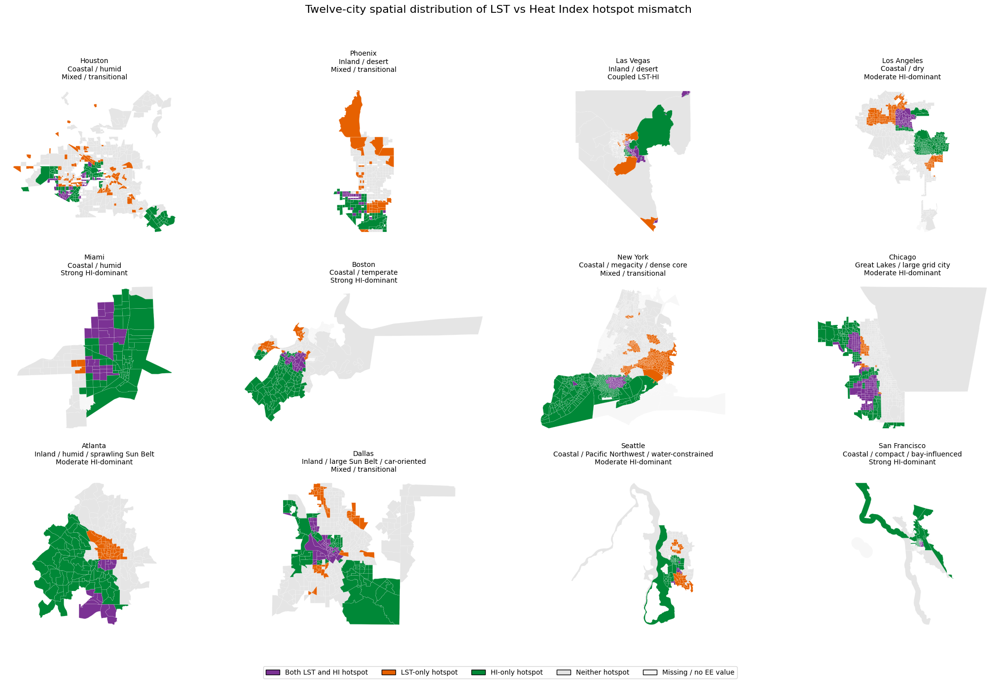

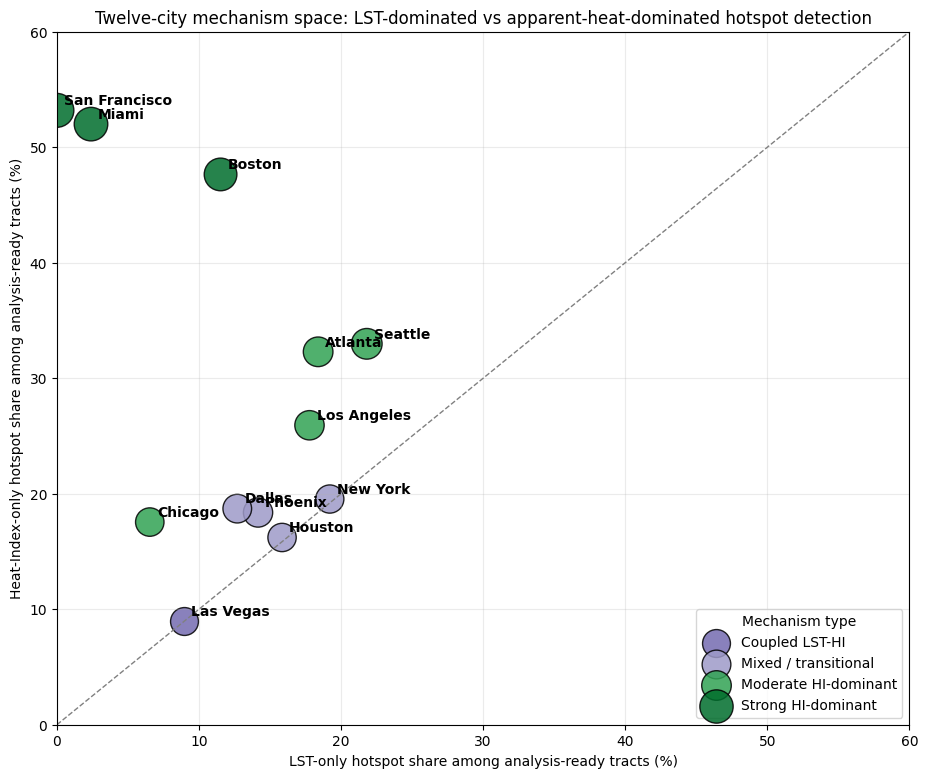

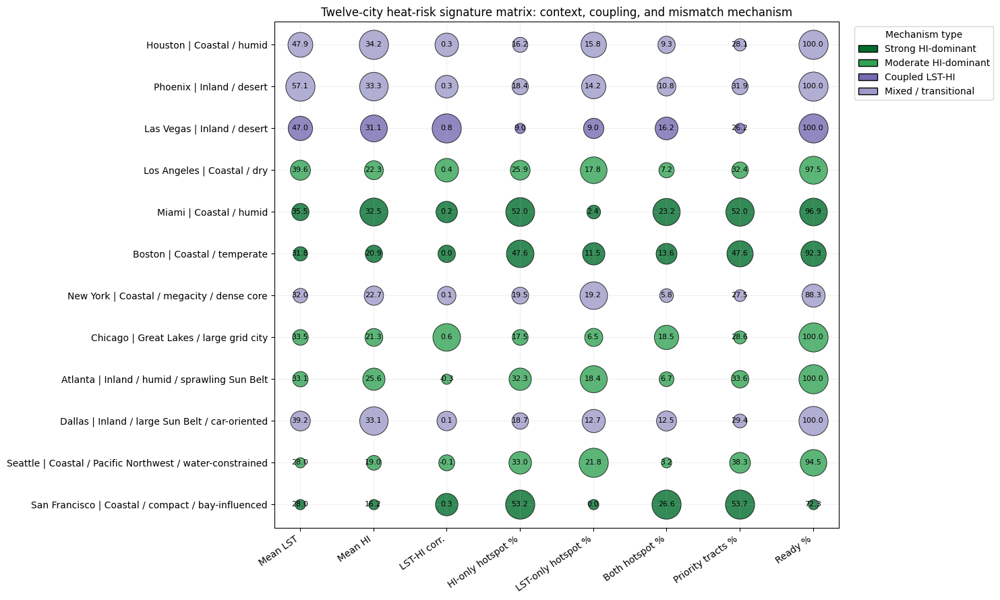

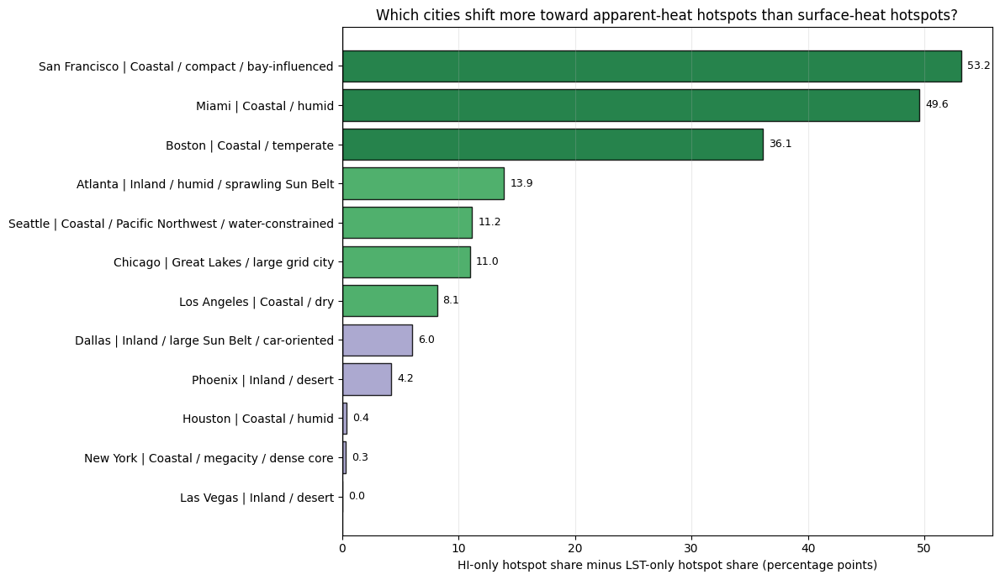


Saved outputs:
 - outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv
 - outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_mismatch_counts.csv
 - outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg
 - outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_analysis_ready_tracts.csv
 - outputs/pilot/alphaearth/twelve_city_final_figures/FIG1_twelve_city_mismatch_class_maps.png
 - outputs/pilot/alphaearth/twelve_city_final_figures/FIG2_twelve_city_mechanism_space.png
 - outputs/pilot/alphaearth/twelve_city_final_figures/FIG3_twelve_city_heat_risk_signature_matrix.png
 - outputs/pilot/alphaearth/twelve_city_final_figures/FIG4_twelve_city_HI_minus_LST_hotspot_shift_rank.png
 - outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_interpretation_notes.txt

DONE. Send me the figures + summary screenshot. Then we can decide the strongest paper story.


In [3]:
from pathlib import Path
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
BASE = PROJECT / "outputs" / "pilot" / "alphaearth"

OUTDIR = BASE / "twelve_city_final_figures"
OUTDIR.mkdir(parents=True, exist_ok=True)

OLD6_CANDIDATES = [
    BASE / "six_city_expansion_figures" / "six_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg",
    BASE / "six_city_expansion_figures" / "six_city_lstadaptive_heat_index_mismatch_GIS_READY.geojson",
]

NEW6_CANDIDATES = [
    BASE / "city_expansion_12city" / "step2_new_6city_lst_hi_combined.gpkg",
    BASE / "city_expansion_12city" / "step2_new_6city_lst_hi_combined.geojson",
]

def first_existing(paths, label):
    for p in paths:
        if p.exists():
            print(f"{label} found:", p.relative_to(PROJECT))
            return p
    raise FileNotFoundError(f"Could not find {label}. Tried:\n" + "\n".join(str(p) for p in paths))

OLD6_PATH = first_existing(OLD6_CANDIDATES, "Old 6-city file")
NEW6_PATH = first_existing(NEW6_CANDIDATES, "New 6-city file")

old6 = gpd.read_file(OLD6_PATH)
new6 = gpd.read_file(NEW6_PATH)

print("Old6 rows:", len(old6), "cities:", sorted(old6["city"].dropna().unique()) if "city" in old6.columns else "no city col")
print("New6 rows:", len(new6), "cities:", sorted(new6["city"].dropna().unique()) if "city" in new6.columns else "no city col")

CITY_LABELS = {
    "houston": "Houston",
    "phoenix": "Phoenix",
    "las_vegas": "Las Vegas",
    "los_angeles": "Los Angeles",
    "miami": "Miami",
    "boston": "Boston",
    "new_york": "New York",
    "chicago": "Chicago",
    "atlanta": "Atlanta",
    "dallas": "Dallas",
    "seattle": "Seattle",
    "san_francisco": "San Francisco",
}

CITY_CONTEXT = {
    "houston": "Coastal / humid",
    "phoenix": "Inland / desert",
    "las_vegas": "Inland / desert",
    "los_angeles": "Coastal / dry",
    "miami": "Coastal / humid",
    "boston": "Coastal / temperate",
    "new_york": "Coastal / megacity / dense core",
    "chicago": "Great Lakes / large grid city",
    "atlanta": "Inland / humid / sprawling Sun Belt",
    "dallas": "Inland / large Sun Belt / car-oriented",
    "seattle": "Coastal / Pacific Northwest / water-constrained",
    "san_francisco": "Coastal / compact / bay-influenced",
}

CITY_ORDER = [
    "houston", "phoenix", "las_vegas", "los_angeles",
    "miami", "boston", "new_york", "chicago",
    "atlanta", "dallas", "seattle", "san_francisco"
]

def find_col(df, candidates):
    cols = list(df.columns)
    lower_map = {c.lower(): c for c in cols}
    for cand in candidates:
        if cand.lower() in lower_map:
            return lower_map[cand.lower()]
    for cand in candidates:
        token = cand.lower()
        for c in cols:
            if token in c.lower():
                return c
    return None

def normalize_city_gdf(gdf, source_name):
    gdf = gdf.copy()

    if "city" not in gdf.columns:
        if "city_label" in gdf.columns:
            gdf["city"] = (
                gdf["city_label"]
                .astype(str)
                .str.lower()
                .str.replace(" ", "_", regex=False)
                .str.replace("-", "_", regex=False)
            )
        else:
            raise ValueError(f"{source_name}: no city or city_label column found.")

    gdf["city"] = (
        gdf["city"]
        .astype(str)
        .str.lower()
        .str.strip()
        .str.replace(" ", "_", regex=False)
        .str.replace("-", "_", regex=False)
    )

    lst_col = find_col(gdf, ["lst_c", "mean_lst_c", "lst"])
    hi_col = find_col(gdf, ["hi_c", "mean_hi_c", "heat_index_c", "hi"])

    if lst_col is None or hi_col is None:
        print("Columns available:", list(gdf.columns))
        raise ValueError(f"{source_name}: could not find LST/HI columns.")

    if lst_col != "lst_c":
        gdf = gdf.rename(columns={lst_col: "lst_c"})
    if hi_col != "hi_c":
        gdf = gdf.rename(columns={hi_col: "hi_c"})

    gdf["lst_c"] = pd.to_numeric(gdf["lst_c"], errors="coerce")
    gdf["hi_c"] = pd.to_numeric(gdf["hi_c"], errors="coerce")

    gdf["city_label"] = gdf["city"].map(CITY_LABELS).fillna(gdf["city"])
    gdf["city_context"] = gdf["city"].map(CITY_CONTEXT).fillna("Context TBD")

    if gdf.crs is None:
        gdf = gdf.set_crs(4326)
    else:
        gdf = gdf.to_crs(4326)

    return gdf

old6 = normalize_city_gdf(old6, "old6")
new6 = normalize_city_gdf(new6, "new6")

all12 = pd.concat([old6, new6], ignore_index=True)
all12 = gpd.GeoDataFrame(all12, geometry="geometry", crs="EPSG:4326")

# Keep only the 12 cities we want.
all12 = all12[all12["city"].isin(CITY_ORDER)].copy()

print("\nCombined cities:")
print(all12.groupby("city").size().reindex(CITY_ORDER))

def reclassify_within_city(gdf):
    pieces = []

    for city, sub in gdf.groupby("city", sort=False):
        sub = sub.copy()
        sub["analysis_ready"] = sub["lst_c"].notna() & sub["hi_c"].notna()

        ready = sub[sub["analysis_ready"]].copy()

        if len(ready) == 0:
            sub["lst_pct"] = np.nan
            sub["hi_pct"] = np.nan
            sub["hi_minus_lst_pct"] = np.nan
            sub["lst_hot"] = False
            sub["hi_hot"] = False
            sub["mismatch_class"] = "Missing"
            sub["priority_flag"] = False
            pieces.append(sub)
            continue

        sub.loc[ready.index, "lst_pct"] = ready["lst_c"].rank(pct=True)
        sub.loc[ready.index, "hi_pct"] = ready["hi_c"].rank(pct=True)
        sub["hi_minus_lst_pct"] = sub["hi_pct"] - sub["lst_pct"]

        q75_lst = ready["lst_c"].quantile(0.75)
        q75_hi = ready["hi_c"].quantile(0.75)
        q75_gap = sub.loc[sub["analysis_ready"], "hi_minus_lst_pct"].quantile(0.75)

        sub["lst_hot"] = sub["analysis_ready"] & (sub["lst_c"] >= q75_lst)
        sub["hi_hot"] = sub["analysis_ready"] & (sub["hi_c"] >= q75_hi)

        both = sub["lst_hot"] & sub["hi_hot"]
        lst_only = sub["lst_hot"] & ~sub["hi_hot"]
        hi_only = ~sub["lst_hot"] & sub["hi_hot"]
        neither = sub["analysis_ready"] & ~sub["lst_hot"] & ~sub["hi_hot"]

        sub["mismatch_class"] = "Missing"
        sub.loc[both, "mismatch_class"] = "Both LST and HI hotspot"
        sub.loc[lst_only, "mismatch_class"] = "LST-only hotspot"
        sub.loc[hi_only, "mismatch_class"] = "HI-only hotspot"
        sub.loc[neither, "mismatch_class"] = "Neither hotspot"

        sub["priority_flag"] = (
            sub["analysis_ready"]
            & (
                (sub["mismatch_class"] == "HI-only hotspot")
                | (sub["hi_minus_lst_pct"] >= q75_gap)
            )
        )

        sub["q75_lst_c"] = q75_lst
        sub["q75_hi_c"] = q75_hi
        sub["q75_hi_minus_lst_pct"] = q75_gap

        pieces.append(sub)

    out = pd.concat(pieces, ignore_index=True)
    out = gpd.GeoDataFrame(out, geometry="geometry", crs=gdf.crs)
    return out

all12 = reclassify_within_city(all12)

# -------------------------
# Summary tables
# -------------------------

summary_rows = []
mismatch_rows = []

for city in CITY_ORDER:
    sub = all12[all12["city"] == city].copy()
    if len(sub) == 0:
        continue

    ready = sub[sub["analysis_ready"]].copy()
    n_total = len(sub)
    n_ready = len(ready)

    counts = sub.groupby("mismatch_class").size().to_dict()

    both_pct = counts.get("Both LST and HI hotspot", 0) / n_ready * 100 if n_ready else np.nan
    lst_only_pct = counts.get("LST-only hotspot", 0) / n_ready * 100 if n_ready else np.nan
    hi_only_pct = counts.get("HI-only hotspot", 0) / n_ready * 100 if n_ready else np.nan
    neither_pct = counts.get("Neither hotspot", 0) / n_ready * 100 if n_ready else np.nan
    missing_pct = counts.get("Missing", 0) / n_total * 100 if n_total else np.nan
    priority_pct = sub["priority_flag"].sum() / n_ready * 100 if n_ready else np.nan

    diff = hi_only_pct - lst_only_pct

    if diff >= 20:
        mechanism = "Strong HI-dominant"
    elif diff >= 8:
        mechanism = "Moderate HI-dominant"
    elif diff <= -8:
        mechanism = "LST-dominant"
    elif both_pct >= 15:
        mechanism = "Coupled LST-HI"
    else:
        mechanism = "Mixed / transitional"

    corr = ready[["lst_c", "hi_c"]].corr().iloc[0, 1] if len(ready) >= 3 else np.nan

    summary_rows.append({
        "city": city,
        "city_label": CITY_LABELS.get(city, city),
        "city_context": CITY_CONTEXT.get(city, "Context TBD"),
        "n_total": n_total,
        "n_ready": n_ready,
        "ready_pct": n_ready / n_total * 100 if n_total else np.nan,
        "mean_lst_c": ready["lst_c"].mean(),
        "mean_hi_c": ready["hi_c"].mean(),
        "mean_hi_minus_lst": ready["hi_c"].mean() - ready["lst_c"].mean(),
        "lst_hi_corr": corr,
        "both_pct": both_pct,
        "lst_only_pct": lst_only_pct,
        "hi_only_pct": hi_only_pct,
        "hi_minus_lst_hotspot_pct": diff,
        "neither_pct": neither_pct,
        "missing_pct": missing_pct,
        "priority_pct": priority_pct,
        "mechanism_type": mechanism,
    })

    tmp = sub.groupby("mismatch_class").size().reset_index(name="n")
    tmp["city"] = city
    tmp["city_label"] = CITY_LABELS.get(city, city)
    tmp["pct_total"] = tmp["n"] / n_total * 100
    tmp["pct_ready"] = np.where(tmp["mismatch_class"] == "Missing", np.nan, tmp["n"] / n_ready * 100)
    mismatch_rows.append(tmp)

summary = pd.DataFrame(summary_rows)
mismatch_counts = pd.concat(mismatch_rows, ignore_index=True)

summary_path = OUTDIR / "twelve_city_summary.csv"
mismatch_path = OUTDIR / "twelve_city_mismatch_counts.csv"
gpkg_path = OUTDIR / "twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg"
csv_path = OUTDIR / "twelve_city_analysis_ready_tracts.csv"

summary.to_csv(summary_path, index=False)
mismatch_counts.to_csv(mismatch_path, index=False)
all12.to_file(gpkg_path, driver="GPKG")
all12.drop(columns="geometry").to_csv(csv_path, index=False)

print("\nTWELVE-CITY SUMMARY")
display(summary.round(3))

print("\nMISMATCH COUNTS")
display(mismatch_counts.round(3))

# -------------------------
# Figure 1: 12-city mismatch maps
# -------------------------

class_colors = {
    "Both LST and HI hotspot": "#7b3294",
    "LST-only hotspot": "#e66101",
    "HI-only hotspot": "#008837",
    "Neither hotspot": "#e5e5e5",
    "Missing": "#f7f7f7",
}

fig, axes = plt.subplots(3, 4, figsize=(22, 14))
axes = axes.flatten()

plot_gdf = all12.to_crs(3857)

for ax, city in zip(axes, CITY_ORDER):
    sub = plot_gdf[plot_gdf["city"] == city].copy()

    if len(sub) == 0:
        ax.axis("off")
        continue

    # Plot neither/missing first.
    for cls in ["Missing", "Neither hotspot", "LST-only hotspot", "HI-only hotspot", "Both LST and HI hotspot"]:
        part = sub[sub["mismatch_class"] == cls]
        if len(part) > 0:
            part.plot(
                ax=ax,
                color=class_colors[cls],
                edgecolor="white",
                linewidth=0.12,
            )

    row = summary[summary["city"] == city].iloc[0]
    ax.set_title(
        f"{row['city_label']}\n{row['city_context']}\n{row['mechanism_type']}",
        fontsize=10
    )
    ax.axis("off")

legend_handles = [
    Patch(facecolor=class_colors["Both LST and HI hotspot"], edgecolor="black", label="Both LST and HI hotspot"),
    Patch(facecolor=class_colors["LST-only hotspot"], edgecolor="black", label="LST-only hotspot"),
    Patch(facecolor=class_colors["HI-only hotspot"], edgecolor="black", label="HI-only hotspot"),
    Patch(facecolor=class_colors["Neither hotspot"], edgecolor="black", label="Neither hotspot"),
    Patch(facecolor=class_colors["Missing"], edgecolor="black", label="Missing / no EE value"),
]

fig.suptitle("Twelve-city spatial distribution of LST vs Heat Index hotspot mismatch", fontsize=16, y=0.98)
fig.legend(handles=legend_handles, loc="lower center", ncol=5, frameon=True, fontsize=10)
fig.tight_layout(rect=[0, 0.06, 1, 0.95])

fig1_path = OUTDIR / "FIG1_twelve_city_mismatch_class_maps.png"
fig.savefig(fig1_path, dpi=300, bbox_inches="tight")
plt.show()

# -------------------------
# Figure 2: mechanism space
# -------------------------

mechanism_colors = {
    "Strong HI-dominant": "#006d2c",
    "Moderate HI-dominant": "#31a354",
    "Coupled LST-HI": "#756bb1",
    "Mixed / transitional": "#9e9ac8",
    "LST-dominant": "#e6550d",
}

fig, ax = plt.subplots(figsize=(11, 9))

for mech, part in summary.groupby("mechanism_type"):
    ax.scatter(
        part["lst_only_pct"],
        part["hi_only_pct"],
        s=220 + part["priority_pct"] * 7,
        color=mechanism_colors.get(mech, "gray"),
        edgecolor="black",
        linewidth=1,
        alpha=0.85,
        label=mech,
    )

for _, r in summary.iterrows():
    ax.text(
        r["lst_only_pct"] + 0.5,
        r["hi_only_pct"] + 0.5,
        r["city_label"],
        fontsize=10,
        weight="bold",
    )

max_axis = max(summary["lst_only_pct"].max(), summary["hi_only_pct"].max(), 60)
ax.plot([0, max_axis], [0, max_axis], linestyle="--", color="gray", linewidth=1)

ax.set_xlim(0, max_axis)
ax.set_ylim(0, max_axis)
ax.set_xlabel("LST-only hotspot share among analysis-ready tracts (%)")
ax.set_ylabel("Heat-Index-only hotspot share among analysis-ready tracts (%)")
ax.set_title("Twelve-city mechanism space: LST-dominated vs apparent-heat-dominated hotspot detection")
ax.grid(alpha=0.25)
ax.legend(title="Mechanism type", loc="lower right", frameon=True)

fig2_path = OUTDIR / "FIG2_twelve_city_mechanism_space.png"
fig.savefig(fig2_path, dpi=300, bbox_inches="tight")
plt.show()

# -------------------------
# Figure 3: heat-risk signature matrix
# -------------------------

metrics = [
    ("mean_lst_c", "Mean LST"),
    ("mean_hi_c", "Mean HI"),
    ("lst_hi_corr", "LST-HI corr."),
    ("hi_only_pct", "HI-only hotspot %"),
    ("lst_only_pct", "LST-only hotspot %"),
    ("both_pct", "Both hotspot %"),
    ("priority_pct", "Priority tracts %"),
    ("ready_pct", "Ready %"),
]

matrix = summary.copy()
matrix["city_context_label"] = matrix["city_label"] + " | " + matrix["city_context"]

fig, ax = plt.subplots(figsize=(15, 9))

for y_idx, (_, row) in enumerate(matrix.iterrows()):
    for x_idx, (col, label) in enumerate(metrics):
        value = row[col]

        col_values = matrix[col].replace([np.inf, -np.inf], np.nan)
        vmin = col_values.min()
        vmax = col_values.max()

        if pd.isna(value) or pd.isna(vmin) or pd.isna(vmax) or vmax == vmin:
            size = 80
        else:
            size = 120 + 850 * ((value - vmin) / (vmax - vmin))

        ax.scatter(
            x_idx,
            y_idx,
            s=size,
            color=mechanism_colors.get(row["mechanism_type"], "gray"),
            edgecolor="black",
            linewidth=0.7,
            alpha=0.8,
        )

        if pd.notna(value):
            ax.text(x_idx, y_idx, f"{value:.1f}", ha="center", va="center", fontsize=8)

ax.set_xticks(range(len(metrics)))
ax.set_xticklabels([m[1] for m in metrics], rotation=35, ha="right")
ax.set_yticks(range(len(matrix)))
ax.set_yticklabels(matrix["city_context_label"])
ax.invert_yaxis()
ax.set_title("Twelve-city heat-risk signature matrix: context, coupling, and mismatch mechanism")
ax.grid(alpha=0.2)

legend_handles = [
    Patch(facecolor=color, edgecolor="black", label=mech)
    for mech, color in mechanism_colors.items()
    if mech in set(summary["mechanism_type"])
]
ax.legend(handles=legend_handles, title="Mechanism type", bbox_to_anchor=(1.02, 1), loc="upper left")

fig.tight_layout()
fig3_path = OUTDIR / "FIG3_twelve_city_heat_risk_signature_matrix.png"
fig.savefig(fig3_path, dpi=300, bbox_inches="tight")
plt.show()

# -------------------------
# Figure 4: ranked mechanism bars
# -------------------------

bar_df = summary.sort_values("hi_minus_lst_hotspot_pct", ascending=False).copy()

fig, ax = plt.subplots(figsize=(12, 7))

y = np.arange(len(bar_df))
colors = [mechanism_colors.get(m, "gray") for m in bar_df["mechanism_type"]]

ax.barh(y, bar_df["hi_minus_lst_hotspot_pct"], color=colors, edgecolor="black", alpha=0.85)
ax.axvline(0, color="black", linewidth=1)

ax.set_yticks(y)
ax.set_yticklabels(bar_df["city_label"] + " | " + bar_df["city_context"])
ax.invert_yaxis()

ax.set_xlabel("HI-only hotspot share minus LST-only hotspot share (percentage points)")
ax.set_title("Which cities shift more toward apparent-heat hotspots than surface-heat hotspots?")

for i, (_, r) in enumerate(bar_df.iterrows()):
    ax.text(
        r["hi_minus_lst_hotspot_pct"] + (0.5 if r["hi_minus_lst_hotspot_pct"] >= 0 else -0.5),
        i,
        f"{r['hi_minus_lst_hotspot_pct']:.1f}",
        va="center",
        ha="left" if r["hi_minus_lst_hotspot_pct"] >= 0 else "right",
        fontsize=9,
    )

ax.grid(axis="x", alpha=0.25)

fig.tight_layout()
fig4_path = OUTDIR / "FIG4_twelve_city_HI_minus_LST_hotspot_shift_rank.png"
fig.savefig(fig4_path, dpi=300, bbox_inches="tight")
plt.show()

# -------------------------
# Save interpretation notes
# -------------------------

notes = []
notes.append("Twelve-city LST vs Heat Index comparison notes")
notes.append("=" * 60)
notes.append("")
notes.append("Core interpretation:")
notes.append("- The expanded dataset compares surface-heat hotspots from LST with apparent-heat hotspots from Heat Index across 12 cities.")
notes.append("- The main research direction is not only whether LST and Heat Index differ, but how the mismatch changes across city context, climate, coastal/inland setting, and urban form.")
notes.append("")

for _, r in summary.sort_values("hi_minus_lst_hotspot_pct", ascending=False).iterrows():
    notes.append(
        f"- {r['city_label']} ({r['city_context']}): {r['mechanism_type']}. "
        f"HI-only={r['hi_only_pct']:.1f}%, LST-only={r['lst_only_pct']:.1f}%, "
        f"Both={r['both_pct']:.1f}%, priority={r['priority_pct']:.1f}%, "
        f"ready={r['ready_pct']:.1f}%, LST-HI corr={r['lst_hi_corr']:.2f}."
    )

notes_path = OUTDIR / "twelve_city_interpretation_notes.txt"
notes_path.write_text("\n".join(notes), encoding="utf-8")

print("\nSaved outputs:")
for p in [
    summary_path,
    mismatch_path,
    gpkg_path,
    csv_path,
    fig1_path,
    fig2_path,
    fig3_path,
    fig4_path,
    notes_path,
]:
    print(" -", p.relative_to(PROJECT))

print("\nDONE. Send me the figures + summary screenshot. Then we can decide the strongest paper story.")

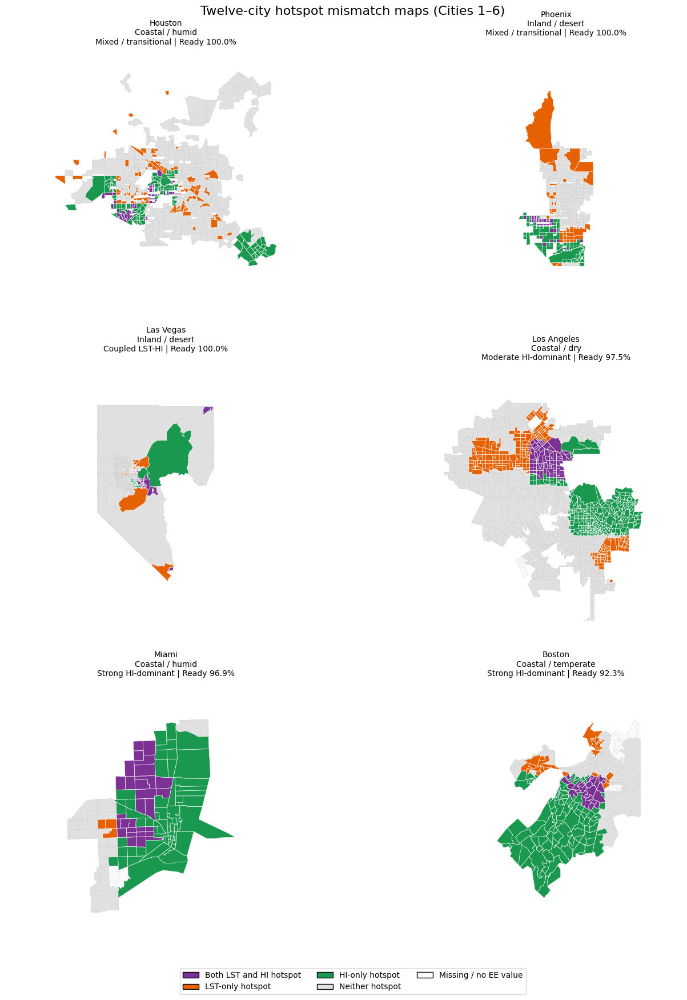

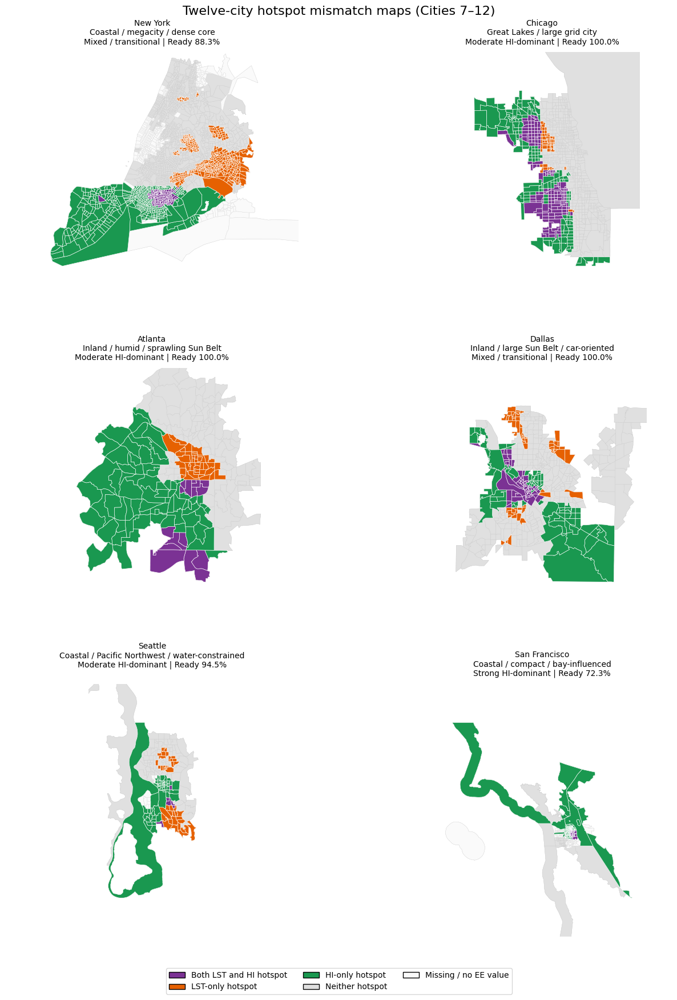

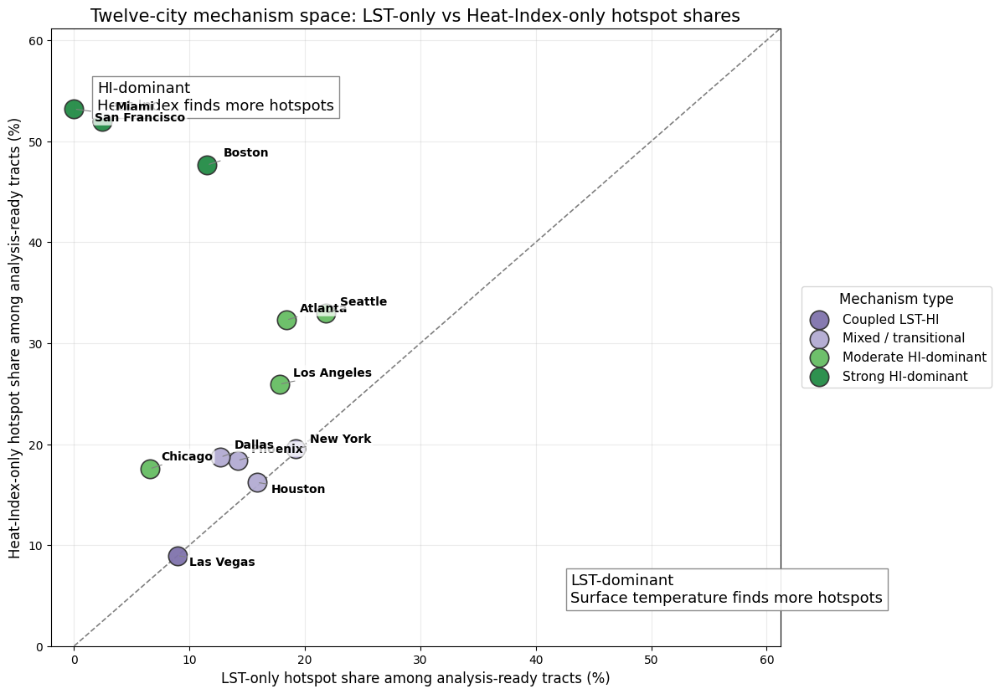

Saved polished figures to:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/polished_v3


In [6]:
from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# =========================
# paths
# =========================
PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
BASE = PROJECT / "outputs" / "pilot" / "alphaearth" / "twelve_city_final_figures"
OUTDIR = BASE / "polished_v3"
OUTDIR.mkdir(parents=True, exist_ok=True)

GPKG = BASE / "twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg"
SUMMARY_CSV = BASE / "twelve_city_summary.csv"

# =========================
# load data
# =========================
gdf = gpd.read_file(GPKG)
summary = pd.read_csv(SUMMARY_CSV)

if gdf.crs is None:
    gdf = gdf.set_crs(4326)
gdf = gdf.to_crs(3857)

summary["city"] = summary["city"].astype(str)
gdf["city"] = gdf["city"].astype(str)

CITY_ORDER = [
    "houston", "phoenix", "las_vegas", "los_angeles",
    "miami", "boston", "new_york", "chicago",
    "atlanta", "dallas", "seattle", "san_francisco"
]

city_label_map = dict(zip(summary["city"], summary["city_label"]))

class_colors = {
    "Both LST and HI hotspot": "#7b3294",   # purple
    "LST-only hotspot": "#e66101",          # orange
    "HI-only hotspot": "#1a9850",           # green
    "Neither hotspot": "#e0e0e0",           # light gray
    "Missing": "#fafafa"                    # near white
}

mech_colors = {
    "Strong HI-dominant": "#238b45",
    "Moderate HI-dominant": "#66bd63",
    "Coupled LST-HI": "#8073ac",
    "Mixed / transitional": "#b2abd2"
}

hotspot_classes = [
    "Both LST and HI hotspot",
    "LST-only hotspot",
    "HI-only hotspot"
]

# =========================
# helper for map figure
# =========================
def draw_city_panel(ax, city):
    sub = gdf[gdf["city"] == city].copy()
    row = summary[summary["city"] == city].iloc[0]

    # background city boundary / full tract coverage
    sub.plot(
        ax=ax,
        color="#f0f0f0",
        edgecolor="#d0d0d0",
        linewidth=0.35
    )

    # neither hotspot
    neither = sub[sub["mismatch_class"] == "Neither hotspot"]
    if len(neither) > 0:
        neither.plot(
            ax=ax,
            color=class_colors["Neither hotspot"],
            edgecolor="#cfcfcf",
            linewidth=0.30
        )

    # missing
    missing = sub[sub["mismatch_class"] == "Missing"]
    if len(missing) > 0:
        missing.plot(
            ax=ax,
            color=class_colors["Missing"],
            edgecolor="#dddddd",
            linewidth=0.28
        )

    # main hotspot classes
    for cls in hotspot_classes:
        part = sub[sub["mismatch_class"] == cls]
        if len(part) > 0:
            part.plot(
                ax=ax,
                color=class_colors[cls],
                edgecolor="white",
                linewidth=0.45
            )

    # zoom to informative area
    focus = sub[sub["mismatch_class"].isin(hotspot_classes)].copy()
    if len(focus) < 5:
        focus = sub[sub["mismatch_class"] != "Missing"].copy()
    if len(focus) == 0:
        focus = sub.copy()

    xmin, ymin, xmax, ymax = focus.total_bounds
    w = xmax - xmin
    h = ymax - ymin

    pad_x = max(w * 0.22, 1800)
    pad_y = max(h * 0.22, 1800)

    ax.set_xlim(xmin - pad_x, xmax + pad_x)
    ax.set_ylim(ymin - pad_y, ymax + pad_y)

    title = (
        f"{row['city_label']}\n"
        f"{row['city_context']}\n"
        f"{row['mechanism_type']} | Ready {row['ready_pct']:.1f}%"
    )
    ax.set_title(title, fontsize=10, pad=10)
    ax.set_axis_off()


def make_map_figure(cities, outfile, supertitle):
    fig, axes = plt.subplots(3, 2, figsize=(14, 18))
    axes = axes.flatten()

    for ax, city in zip(axes, cities):
        draw_city_panel(ax, city)

    legend_handles = [
        Patch(facecolor=class_colors["Both LST and HI hotspot"], edgecolor="black", label="Both LST and HI hotspot"),
        Patch(facecolor=class_colors["LST-only hotspot"], edgecolor="black", label="LST-only hotspot"),
        Patch(facecolor=class_colors["HI-only hotspot"], edgecolor="black", label="HI-only hotspot"),
        Patch(facecolor=class_colors["Neither hotspot"], edgecolor="black", label="Neither hotspot"),
        Patch(facecolor=class_colors["Missing"], edgecolor="black", label="Missing / no EE value"),
    ]

    fig.suptitle(supertitle, fontsize=16, y=0.985)
    fig.legend(
        handles=legend_handles,
        loc="lower center",
        bbox_to_anchor=(0.5, 0.02),
        ncol=3,
        frameon=True,
        fontsize=10
    )
    fig.subplots_adjust(left=0.04, right=0.98, top=0.94, bottom=0.08, hspace=0.25, wspace=0.08)
    fig.savefig(outfile, dpi=300, bbox_inches="tight")
    plt.show()


# =========================
# make 2 clearer map figures
# =========================
first6 = CITY_ORDER[:6]
second6 = CITY_ORDER[6:]

make_map_figure(
    first6,
    OUTDIR / "FIG1A_first6_maps_polished.png",
    "Twelve-city hotspot mismatch maps (Cities 1–6)"
)

make_map_figure(
    second6,
    OUTDIR / "FIG1B_second6_maps_polished.png",
    "Twelve-city hotspot mismatch maps (Cities 7–12)"
)

# =========================
# improved scatter
# =========================
fig, ax = plt.subplots(figsize=(13, 9))

# plot points by mechanism type
for mech, part in summary.groupby("mechanism_type"):
    ax.scatter(
        part["lst_only_pct"],
        part["hi_only_pct"],
        s=260,
        c=mech_colors.get(mech, "gray"),
        edgecolor="#333333",
        linewidth=1.2,
        alpha=0.95,
        label=mech,
        zorder=3,
        clip_on=False
    )

# manual offsets to avoid overlap
offsets = {
    "San Francisco": (1.8, -1.2),
    "Miami": (1.2, 1.1),
    "Boston": (1.4, 0.9),
    "Seattle": (1.2, 0.8),
    "Atlanta": (1.2, 0.8),
    "Los Angeles": (1.2, 0.8),
    "New York": (1.2, 0.6),
    "Houston": (1.2, -1.0),
    "Phoenix": (1.2, 0.8),
    "Dallas": (1.2, 0.9),
    "Chicago": (1.0, 0.9),
    "Las Vegas": (1.0, -1.0),
}

for _, r in summary.iterrows():
    label = r["city_label"]
    dx, dy = offsets.get(label, (1.0, 0.8))
    ax.annotate(
        label,
        xy=(r["lst_only_pct"], r["hi_only_pct"]),
        xytext=(r["lst_only_pct"] + dx, r["hi_only_pct"] + dy),
        textcoords="data",
        fontsize=10,
        fontweight="bold",
        arrowprops=dict(arrowstyle="-", lw=0.8, color="gray"),
        bbox=dict(boxstyle="round,pad=0.15", fc="white", ec="none", alpha=0.75),
        zorder=4
    )

# axis limits
xmax = max(summary["lst_only_pct"].max(), summary["hi_only_pct"].max()) + 8
xmax = max(xmax, 60)

ax.set_xlim(-2, xmax)
ax.set_ylim(0, xmax)

# diagonal
ax.plot([0, xmax], [0, xmax], linestyle="--", color="gray", linewidth=1.2, zorder=1)

# quadrant interpretation labels
ax.text(
    2, 56,
    "HI-dominant\nHeat Index finds more hotspots",
    fontsize=13,
    ha="left",
    va="top",
    bbox=dict(facecolor="white", edgecolor="gray", alpha=0.9)
)

ax.text(
    43, 4,
    "LST-dominant\nSurface temperature finds more hotspots",
    fontsize=13,
    ha="left",
    va="bottom",
    bbox=dict(facecolor="white", edgecolor="gray", alpha=0.9)
)

ax.set_xlabel("LST-only hotspot share among analysis-ready tracts (%)", fontsize=12)
ax.set_ylabel("Heat-Index-only hotspot share among analysis-ready tracts (%)", fontsize=12)
ax.set_title(
    "Twelve-city mechanism space: LST-only vs Heat-Index-only hotspot shares",
    fontsize=15
)
ax.grid(alpha=0.25)

# legend outside
ax.legend(
    title="Mechanism type",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=True,
    fontsize=11,
    title_fontsize=12
)

fig.subplots_adjust(left=0.11, right=0.78, top=0.92, bottom=0.10)
fig.savefig(OUTDIR / "FIG2_mechanism_scatter_polished.png", dpi=300, bbox_inches="tight")
plt.show()

print("Saved polished figures to:")
print(OUTDIR)

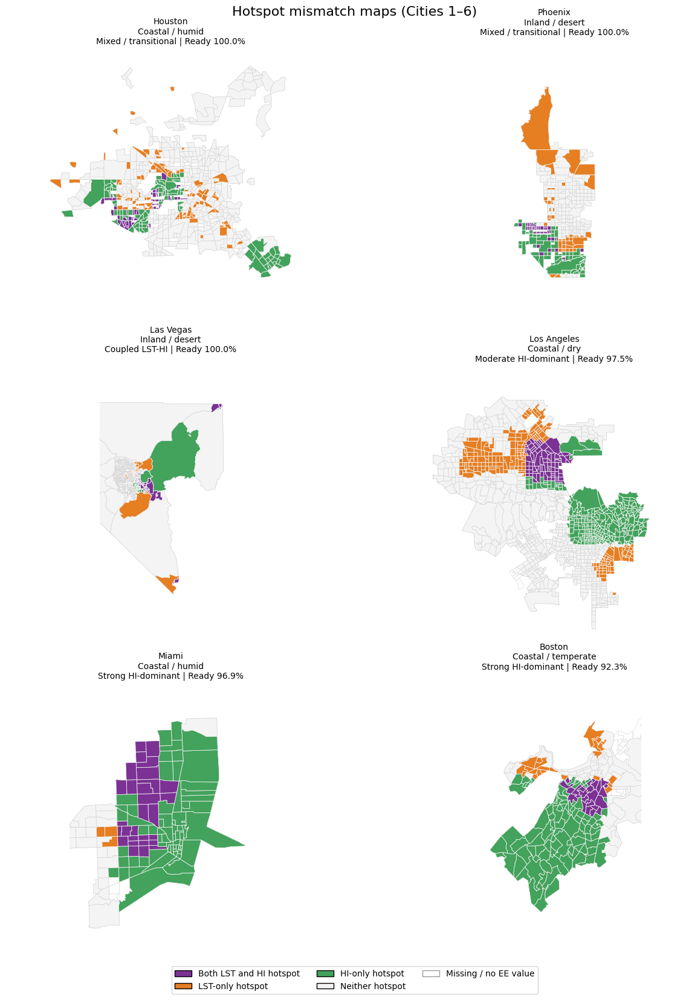

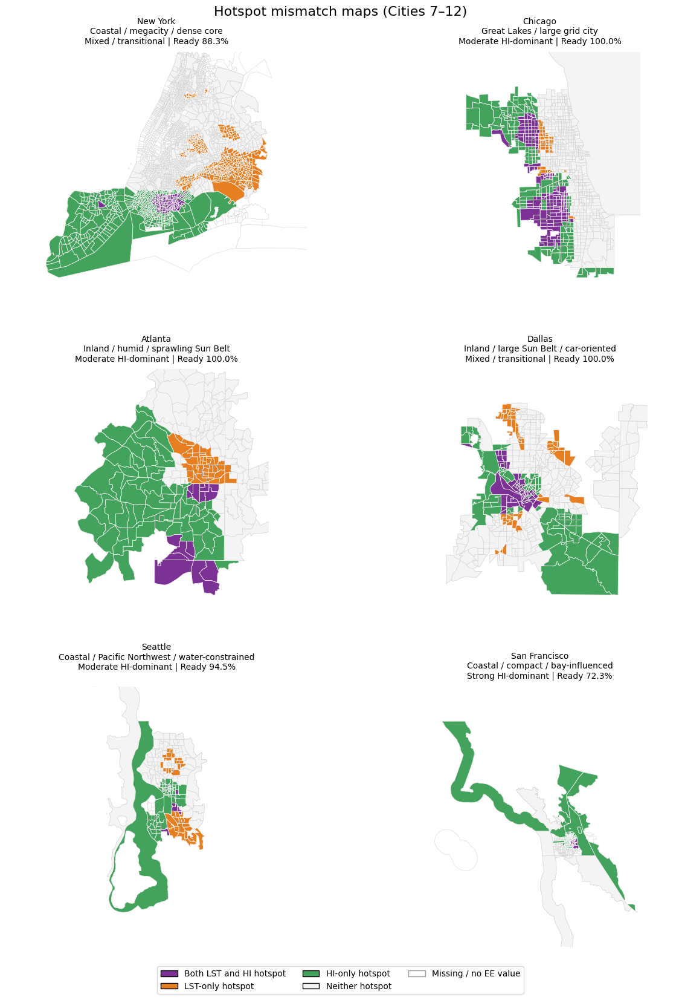

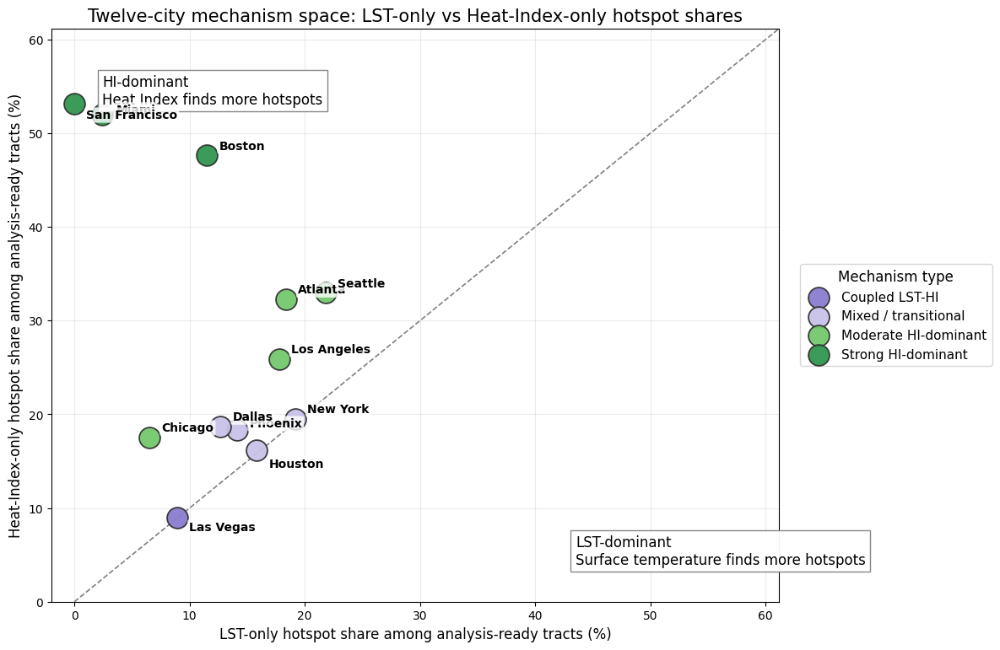

Saved to:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/paper_fix_final


In [7]:
from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# =========================================================
# PATHS
# =========================================================
PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
BASE = PROJECT / "outputs" / "pilot" / "alphaearth" / "twelve_city_final_figures"
OUTDIR = BASE / "paper_fix_final"
OUTDIR.mkdir(parents=True, exist_ok=True)

GPKG = BASE / "twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg"
SUMMARY_CSV = BASE / "twelve_city_summary.csv"

# =========================================================
# LOAD
# =========================================================
gdf = gpd.read_file(GPKG)
summary = pd.read_csv(SUMMARY_CSV)

if gdf.crs is None:
    gdf = gdf.set_crs(4326)
gdf = gdf.to_crs(3857)

summary["city"] = summary["city"].astype(str)
gdf["city"] = gdf["city"].astype(str)

CITY_ORDER = [
    "houston", "phoenix", "las_vegas", "los_angeles",
    "miami", "boston", "new_york", "chicago",
    "atlanta", "dallas", "seattle", "san_francisco"
]

# =========================================================
# COLORS
# =========================================================
class_colors = {
    "Both LST and HI hotspot": "#7b3294",   # purple
    "LST-only hotspot": "#e67e22",          # orange
    "HI-only hotspot": "#43a25c",           # green
    "Neither hotspot": "#f4f4f4",           # very light gray
    "Missing": "#ffffff"                    # white
}

mech_colors = {
    "Coupled LST-HI": "#8a7ccf",
    "Mixed / transitional": "#c7c2e8",
    "Moderate HI-dominant": "#73c96b",
    "Strong HI-dominant": "#2f974f"
}

hotspot_classes = [
    "Both LST and HI hotspot",
    "LST-only hotspot",
    "HI-only hotspot"
]

# =========================================================
# HELPERS
# =========================================================
def clean_class_values(df):
    df = df.copy()
    df["mismatch_class"] = df["mismatch_class"].astype(str).str.strip()
    return df

gdf = clean_class_values(gdf)

def get_city_row(city):
    return summary.loc[summary["city"] == city].iloc[0]

def get_crop_bounds(sub):
    """
    Crop only around informative tract region,
    not around the whole huge city extent.
    """
    # first choice: all non-missing tracts
    ready = sub[sub["mismatch_class"] != "Missing"].copy()

    # second choice: hotspot tracts only
    hot = sub[sub["mismatch_class"].isin(hotspot_classes)].copy()

    if len(hot) >= 5:
        focus = hot
    elif len(ready) > 0:
        focus = ready
    else:
        focus = sub

    xmin, ymin, xmax, ymax = focus.total_bounds
    w = xmax - xmin
    h = ymax - ymin

    # if degenerate
    if w == 0:
        w = 1000
    if h == 0:
        h = 1000

    pad_x = w * 0.18
    pad_y = h * 0.18

    return xmin - pad_x, xmax + pad_x, ymin - pad_y, ymax + pad_y

def draw_city_panel(ax, city):
    sub = gdf[gdf["city"] == city].copy()
    row = get_city_row(city)

    # -----------------------------
    # base layer: ALL tracts visible
    # white fill + light gray edges
    # this is the key fix
    # -----------------------------
    sub.plot(
        ax=ax,
        facecolor="#ffffff",
        edgecolor="#d8d8d8",
        linewidth=0.45,
        zorder=1
    )

    # -----------------------------
    # neither hotspot: very light gray
    # still keep tract boundaries visible
    # -----------------------------
    neither = sub[sub["mismatch_class"] == "Neither hotspot"]
    if len(neither) > 0:
        neither.plot(
            ax=ax,
            facecolor=class_colors["Neither hotspot"],
            edgecolor="#d2d2d2",
            linewidth=0.42,
            zorder=2
        )

    # -----------------------------
    # hotspot classes on top
    # stronger edges so polygons are visible
    # -----------------------------
    for cls in hotspot_classes:
        part = sub[sub["mismatch_class"] == cls]
        if len(part) > 0:
            part.plot(
                ax=ax,
                facecolor=class_colors[cls],
                edgecolor="#f7f7f7",
                linewidth=0.55,
                zorder=3
            )

    # missing: do NOT paint huge gray blocks
    # just leave as white base layer

    xmin, xmax, ymin, ymax = get_crop_bounds(sub)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_aspect("equal")

    title = (
        f"{row['city_label']}\n"
        f"{row['city_context']}\n"
        f"{row['mechanism_type']} | Ready {row['ready_pct']:.1f}%"
    )
    ax.set_title(title, fontsize=10, pad=10)
    ax.set_axis_off()

def make_map_page(cities, outfile, page_title):
    fig, axes = plt.subplots(3, 2, figsize=(13, 17))
    axes = axes.flatten()

    for ax, city in zip(axes, cities):
        draw_city_panel(ax, city)

    legend_handles = [
        Patch(facecolor=class_colors["Both LST and HI hotspot"], edgecolor="black", label="Both LST and HI hotspot"),
        Patch(facecolor=class_colors["LST-only hotspot"], edgecolor="black", label="LST-only hotspot"),
        Patch(facecolor=class_colors["HI-only hotspot"], edgecolor="black", label="HI-only hotspot"),
        Patch(facecolor=class_colors["Neither hotspot"], edgecolor="black", label="Neither hotspot"),
        Patch(facecolor="#ffffff", edgecolor="#999999", label="Missing / no EE value"),
    ]

    fig.suptitle(page_title, fontsize=16, y=0.985)
    fig.legend(
        handles=legend_handles,
        loc="lower center",
        bbox_to_anchor=(0.5, 0.02),
        ncol=3,
        frameon=True,
        fontsize=10
    )
    fig.subplots_adjust(left=0.04, right=0.98, top=0.94, bottom=0.07, hspace=0.22, wspace=0.08)
    fig.savefig(outfile, dpi=300, bbox_inches="tight", facecolor="white")
    plt.show()

# =========================================================
# MAKE 2 MAP FIGURES
# =========================================================
first6 = CITY_ORDER[:6]
second6 = CITY_ORDER[6:]

make_map_page(
    first6,
    OUTDIR / "FIG1A_first6_maps_FIXED.png",
    "Hotspot mismatch maps (Cities 1–6)"
)

make_map_page(
    second6,
    OUTDIR / "FIG1B_second6_maps_FIXED.png",
    "Hotspot mismatch maps (Cities 7–12)"
)

# =========================================================
# SCATTER FIXED
# =========================================================
fig, ax = plt.subplots(figsize=(12.5, 8.5))

for mech, part in summary.groupby("mechanism_type"):
    ax.scatter(
        part["lst_only_pct"],
        part["hi_only_pct"],
        s=320,
        c=mech_colors.get(mech, "gray"),
        edgecolor="#333333",
        linewidth=1.3,
        alpha=0.95,
        label=mech,
        zorder=3,
        clip_on=False
    )

# fixed label offsets in POINTS (not data coords)
label_offsets = {
    "Houston": (10, -12),
    "Phoenix": (10, 5),
    "Las Vegas": (10, -8),
    "Los Angeles": (10, 8),
    "Miami": (12, 4),
    "Boston": (10, 8),
    "New York": (10, 8),
    "Chicago": (10, 8),
    "Atlanta": (10, 8),
    "Dallas": (10, 8),
    "Seattle": (10, 8),
    "San Francisco": (10, -10),
}

for _, r in summary.iterrows():
    x = r["lst_only_pct"]
    y = r["hi_only_pct"]
    label = r["city_label"]
    dx, dy = label_offsets.get(label, (8, 8))

    ax.annotate(
        label,
        xy=(x, y),
        xytext=(dx, dy),
        textcoords="offset points",
        fontsize=10,
        fontweight="bold",
        ha="left",
        va="center",
        bbox=dict(boxstyle="round,pad=0.15", fc="white", ec="none", alpha=0.8),
        zorder=4
    )

# limits: give left margin so no half circle gets cut
maxv = max(summary["lst_only_pct"].max(), summary["hi_only_pct"].max())
upper = max(60, maxv + 8)

ax.set_xlim(-2, upper)
ax.set_ylim(0, upper)

ax.plot([0, upper], [0, upper], linestyle="--", color="gray", linewidth=1.2, zorder=1)

# move interpretation boxes away from points
ax.text(
    0.07, 0.92,
    "HI-dominant\nHeat Index finds more hotspots",
    transform=ax.transAxes,
    fontsize=12,
    ha="left",
    va="top",
    bbox=dict(facecolor="white", edgecolor="gray", alpha=0.95)
)

ax.text(
    0.72, 0.06,
    "LST-dominant\nSurface temperature finds more hotspots",
    transform=ax.transAxes,
    fontsize=12,
    ha="left",
    va="bottom",
    bbox=dict(facecolor="white", edgecolor="gray", alpha=0.95)
)

ax.set_xlabel("LST-only hotspot share among analysis-ready tracts (%)", fontsize=12)
ax.set_ylabel("Heat-Index-only hotspot share among analysis-ready tracts (%)", fontsize=12)
ax.set_title("Twelve-city mechanism space: LST-only vs Heat-Index-only hotspot shares", fontsize=15)
ax.grid(alpha=0.25)

ax.legend(
    title="Mechanism type",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=True,
    fontsize=11,
    title_fontsize=12
)

fig.subplots_adjust(left=0.11, right=0.80, top=0.90, bottom=0.10)
fig.savefig(OUTDIR / "FIG2_mechanism_scatter_FIXED.png", dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

print("Saved to:")
print(OUTDIR)

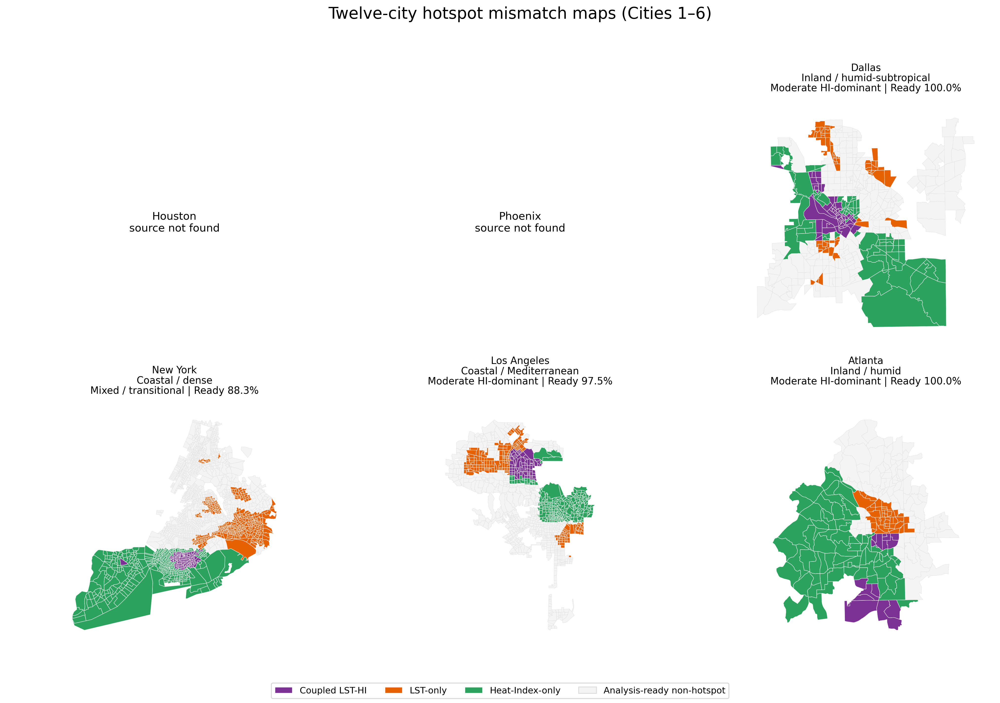

Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/paper_cross_city_advanced_figures/FINAL_V4_maps_1_6.png


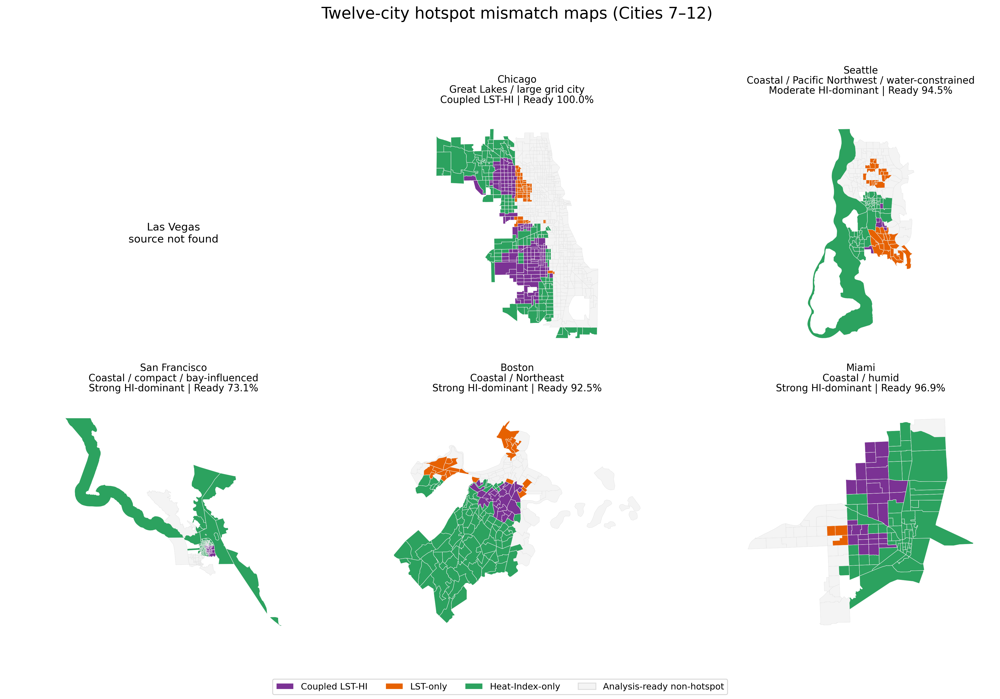

Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/paper_cross_city_advanced_figures/FINAL_V4_maps_7_12.png


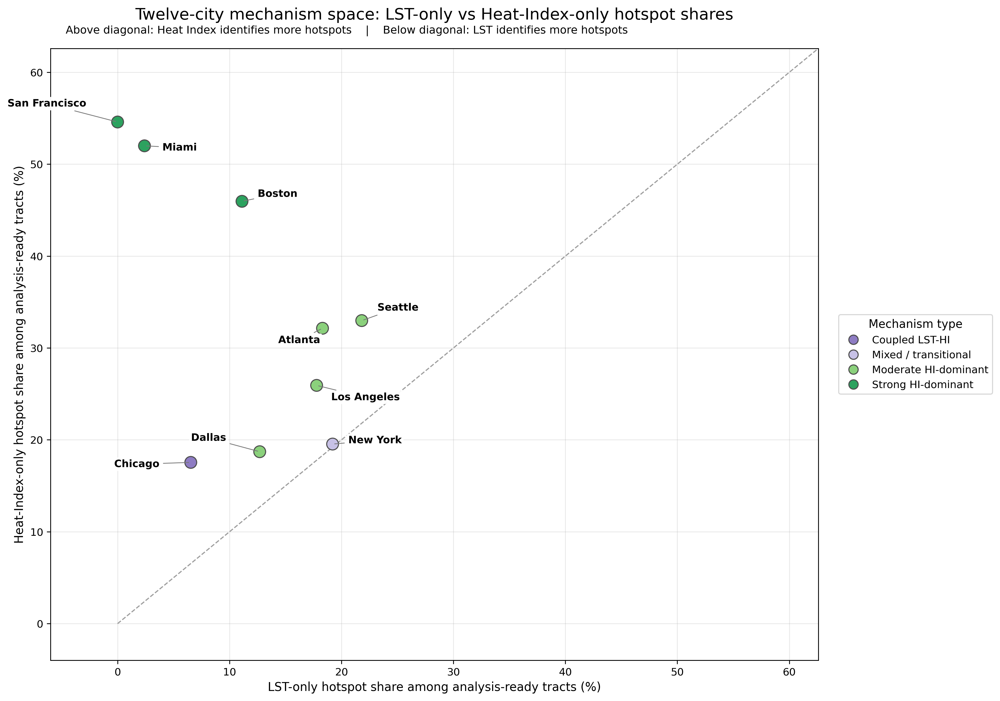

Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/paper_cross_city_advanced_figures/FINAL_V4_scatter_labels_fixed.png
DONE.


In [13]:
# ============================================================
# FINAL V4: restore all cities + clean maps + fixed scatter labels
# ============================================================

import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

TARGET_12 = [
    "Houston", "Phoenix", "Dallas", "New York", "Los Angeles", "Atlanta",
    "Las Vegas", "Chicago", "Seattle", "San Francisco", "Boston", "Miami"
]

def _norm(s):
    return re.sub(r"[^a-z0-9]+", "", str(s).lower())

def get_city_gdf(city):
    # robust name matching: Houston / houston / Houston_TX etc.
    target = _norm(city)
    for k, v in city_gdfs.items():
        if _norm(k) == target:
            return v
    for k, v in city_gdfs.items():
        if target in _norm(k) or _norm(k) in target:
            return v
    return None

def project_plot(gdf):
    g = gdf.copy()
    if g.crs is not None:
        try:
            if g.crs.is_geographic:
                g = g.to_crs(g.estimate_utm_crs())
        except Exception:
            pass
    return g

def clean_for_display(gdf):
    g = project_plot(gdf)
    g = g[g.geometry.notna()].copy()
    g = g.explode(index_parts=False).reset_index(drop=True)
    g = g[g.geometry.area > 0].copy()
    g["__area"] = g.geometry.area

    ready = g["_ready"].fillna(False)
    hot = g["_plot_class"].isin(["Coupled LST-HI", "LST-only hotspot", "HI-only hotspot"])

    useful = g[ready | hot].copy()
    if len(useful) == 0:
        useful = g.copy()

    # remove only extreme giant polygons; do NOT NOT remove city entirely
    area_ref = useful["__area"]
    cap = max(area_ref.quantile(0.97) * 1.8, area_ref.quantile(0.50) * 18)
    g = g[(g["__area"] <= cap) | hot].copy()

    return g

def plot_city(ax, city):
    gdf = get_city_gdf(city)
    if gdf is None:
        ax.axis("off")
        ax.text(0.5, 0.5, city + "\nsource not found", ha="center", va="center", fontsize=12)
        return

    g = clean_for_display(gdf)
    ready = g["_ready"].fillna(False)
    cls = g["_plot_class"].fillna("Not hotspot")
    hot = cls.isin(["Coupled LST-HI", "LST-only hotspot", "HI-only hotspot"])

    # IMPORTANT: no large gray non-ready background anymore
    bg = g[ready & (cls == "Not hotspot")]
    if len(bg):
        bg.plot(ax=ax, facecolor="#f4f4f4", edgecolor="#dddddd", linewidth=0.22, zorder=1)

    for klass in ["HI-only hotspot", "LST-only hotspot", "Coupled LST-HI"]:
        part = g[ready & (cls == klass)]
        if len(part):
            part.plot(
                ax=ax,
                facecolor=CLASS_COLORS[klass],
                edgecolor="white",
                linewidth=0.38,
                zorder=3
            )

    # grid lines only for displayed polygons
    g[ready | hot].boundary.plot(ax=ax, color="#e2e2e2", linewidth=0.13, zorder=4)

    focus = g[ready | hot]
    if len(focus) == 0:
        focus = g

    xmin, ymin, xmax, ymax = focus.total_bounds
    pad = max(xmax - xmin, ymax - ymin) * 0.09
    ax.set_xlim(xmin - pad, xmax + pad)
    ax.set_ylim(ymin - pad, ymax + pad)
    ax.set_aspect("equal")
    ax.axis("off")

    rec = summary[summary["city"].map(_norm) == _norm(city)]
    if len(rec):
        mechanism = rec.iloc[0]["mechanism"]
        ready_pct = rec.iloc[0]["ready_pct"]
    else:
        mechanism = ""
        ready_pct = np.nan

    ax.set_title(
        f"{city}\n{CITY_CONTEXT.get(city, '')}\n{mechanism} | Ready {ready_pct:.1f}%",
        fontsize=11,
        pad=8,
        linespacing=1.05
    )

def make_page(cities, filename, title):
    fig, axes = plt.subplots(2, 3, figsize=(17, 11), dpi=260)
    axes = axes.flatten()

    for ax, city in zip(axes, cities):
        plot_city(ax, city)

    legend_items = [
        Patch(facecolor=CLASS_COLORS["Coupled LST-HI"], edgecolor="white", label="Coupled LST-HI"),
        Patch(facecolor=CLASS_COLORS["LST-only hotspot"], edgecolor="white", label="LST-only"),
        Patch(facecolor=CLASS_COLORS["HI-only hotspot"], edgecolor="white", label="Heat-Index-only"),
        Patch(facecolor="#f4f4f4", edgecolor="#dddddd", label="Analysis-ready non-hotspot"),
    ]

    fig.suptitle(title, fontsize=18, y=0.985)
    fig.legend(handles=legend_items, loc="lower center", ncol=4, frameon=True, fontsize=10)
    plt.tight_layout(rect=[0.02, 0.06, 0.98, 0.95])

    png = OUTDIR / filename
    svg = OUTDIR / filename.replace(".png", ".svg")
    fig.savefig(png, bbox_inches="tight", dpi=320)
    fig.savefig(svg, bbox_inches="tight")
    plt.show()
    print("Saved:", png)

make_page(
    TARGET_12[:6],
    "FINAL_V4_maps_1_6.png",
    "Twelve-city hotspot mismatch maps (Cities 1–6)"
)

make_page(
    TARGET_12[6:],
    "FINAL_V4_maps_7_12.png",
    "Twelve-city hotspot mismatch maps (Cities 7–12)"
)

# ============================================================
# Scatter V4: no auto movement, fully manual label positions
# ============================================================

scatter_df = summary.copy()
scatter_df = scatter_df[scatter_df["city"].map(_norm).isin([_norm(c) for c in TARGET_12])].copy()

fig, ax = plt.subplots(figsize=(13.5, 9.5), dpi=260)

scatter_df["color"] = scatter_df["mechanism"].map(MECH_COLORS).fillna("#bdbdbd")

ax.scatter(
    scatter_df["lst_only_pct"],
    scatter_df["hi_only_pct"],
    s=130,
    c=scatter_df["color"],
    edgecolor="#4d4d4d",
    linewidth=1.0,
    zorder=3
)

max_val = max(62, scatter_df["lst_only_pct"].max() + 8, scatter_df["hi_only_pct"].max() + 8)
ax.plot([0, max_val], [0, max_val], "--", color="#9e9e9e", linewidth=1.1, zorder=1)

LABEL_POS = {
    "San Francisco": (-2.8, 2.0),
    "Miami": (1.6, -0.2),
    "Boston": (1.4, 0.8),
    "Seattle": (1.4, 1.4),
    "Atlanta": (-0.2, -1.3),
    "Los Angeles": (1.3, -1.3),
    "Chicago": (-2.8, -0.2),
    "Dallas": (-3.0, 1.5),
    "New York": (1.4, 0.4),
    "Phoenix": (1.3, -1.2),
    "Houston": (1.4, -1.5),
    "Las Vegas": (1.4, -1.2),
}

for _, r in scatter_df.iterrows():
    city = r["city"]
    x = float(r["lst_only_pct"])
    y = float(r["hi_only_pct"])
    dx, dy = LABEL_POS.get(city, (1.3, 1.0))

    ann = ax.annotate(
        city,
        xy=(x, y),
        xytext=(x + dx, y + dy),
        textcoords="data",
        fontsize=9.8,
        fontweight="semibold",
        ha="right" if dx < 0 else "left",
        va="center",
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.95, boxstyle="round,pad=0.18"),
        arrowprops=dict(arrowstyle="-", color="#777777", lw=0.75),
        zorder=5,
        clip_on=False
    )
    ann.set_path_effects([pe.withStroke(linewidth=2.5, foreground="white")])

ax.text(
    0.02, 1.02,
    "Above diagonal: Heat Index identifies more hotspots    |    Below diagonal: LST identifies more hotspots",
    transform=ax.transAxes,
    fontsize=10.5,
    ha="left",
    va="bottom"
)

ax.set_title("Twelve-city mechanism space: LST-only vs Heat-Index-only hotspot shares", fontsize=15.5, pad=28)
ax.set_xlabel("LST-only hotspot share among analysis-ready tracts (%)", fontsize=11.5)
ax.set_ylabel("Heat-Index-only hotspot share among analysis-ready tracts (%)", fontsize=11.5)

ax.set_xlim(-6, max_val)
ax.set_ylim(-4, max_val)
ax.grid(True, alpha=0.28)
ax.set_axisbelow(True)

legend_handles = [
    Line2D([0], [0], marker="o", color="none", markerfacecolor=v,
           markeredgecolor="#4d4d4d", markersize=9, label=k)
    for k, v in MECH_COLORS.items()
    if k in scatter_df["mechanism"].values
]

ax.legend(
    handles=legend_handles,
    title="Mechanism type",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=True,
    fontsize=10,
    title_fontsize=11
)

plt.tight_layout()

scatter_png = OUTDIR / "FINAL_V4_scatter_labels_fixed.png"
scatter_svg = OUTDIR / "FINAL_V4_scatter_labels_fixed.svg"
fig.savefig(scatter_png, bbox_inches="tight", dpi=320)
fig.savefig(scatter_svg, bbox_inches="tight")
plt.show()

print("Saved:", scatter_png)
print("DONE.")

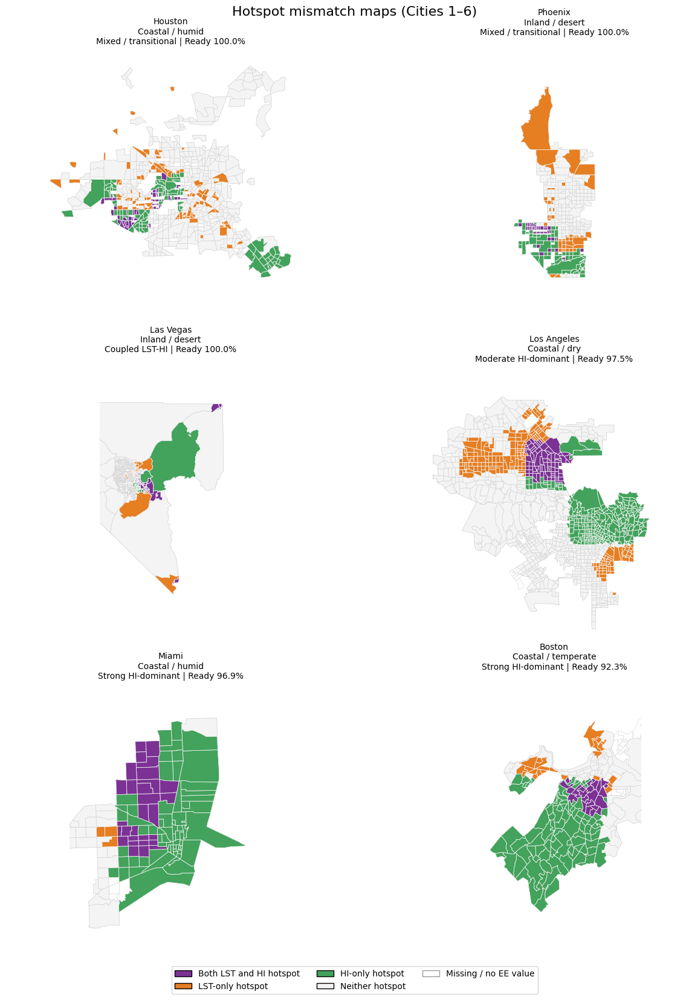

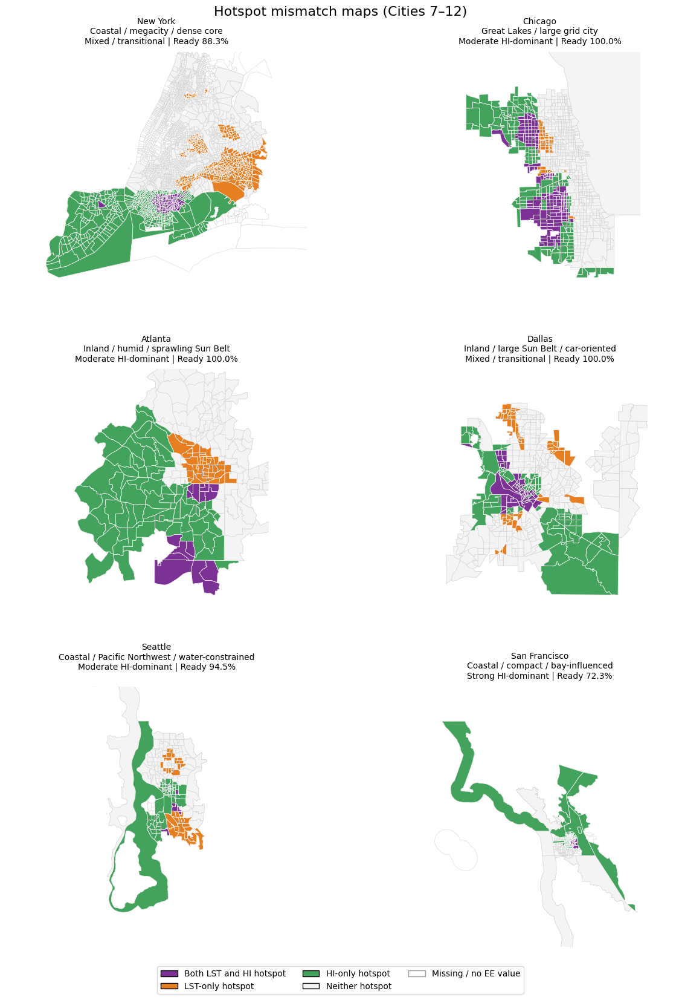

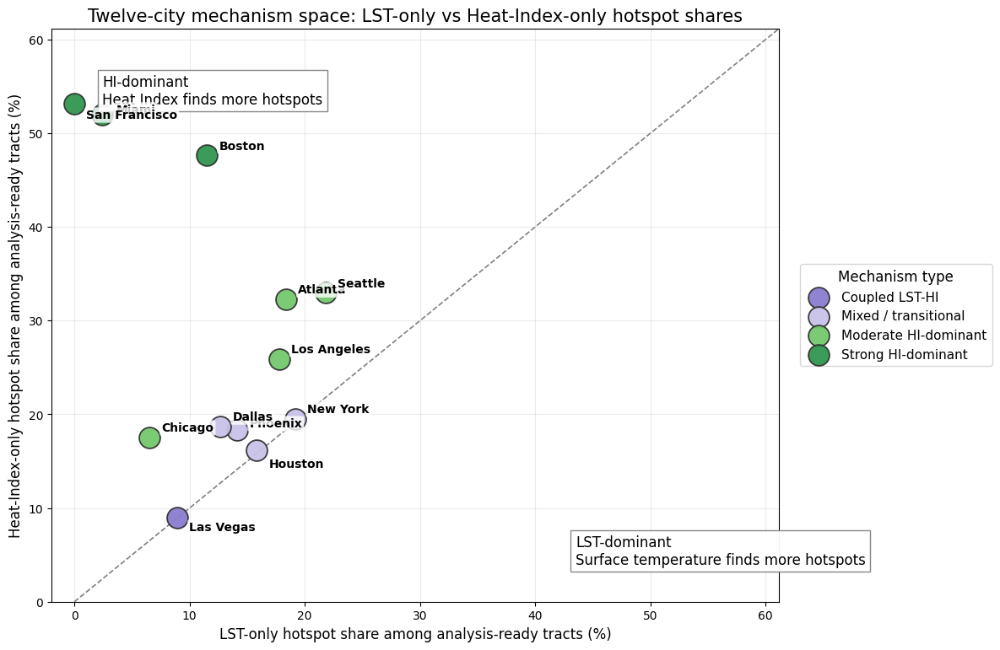

Saved to:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/paper_fix_final


In [14]:
from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# =========================================================
# PATHS
# =========================================================
PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
BASE = PROJECT / "outputs" / "pilot" / "alphaearth" / "twelve_city_final_figures"
OUTDIR = BASE / "paper_fix_final"
OUTDIR.mkdir(parents=True, exist_ok=True)

GPKG = BASE / "twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg"
SUMMARY_CSV = BASE / "twelve_city_summary.csv"

# =========================================================
# LOAD
# =========================================================
gdf = gpd.read_file(GPKG)
summary = pd.read_csv(SUMMARY_CSV)

if gdf.crs is None:
    gdf = gdf.set_crs(4326)
gdf = gdf.to_crs(3857)

summary["city"] = summary["city"].astype(str)
gdf["city"] = gdf["city"].astype(str)

CITY_ORDER = [
    "houston", "phoenix", "las_vegas", "los_angeles",
    "miami", "boston", "new_york", "chicago",
    "atlanta", "dallas", "seattle", "san_francisco"
]

# =========================================================
# COLORS
# =========================================================
class_colors = {
    "Both LST and HI hotspot": "#7b3294",   # purple
    "LST-only hotspot": "#e67e22",          # orange
    "HI-only hotspot": "#43a25c",           # green
    "Neither hotspot": "#f4f4f4",           # very light gray
    "Missing": "#ffffff"                    # white
}

mech_colors = {
    "Coupled LST-HI": "#8a7ccf",
    "Mixed / transitional": "#c7c2e8",
    "Moderate HI-dominant": "#73c96b",
    "Strong HI-dominant": "#2f974f"
}

hotspot_classes = [
    "Both LST and HI hotspot",
    "LST-only hotspot",
    "HI-only hotspot"
]

# =========================================================
# HELPERS
# =========================================================
def clean_class_values(df):
    df = df.copy()
    df["mismatch_class"] = df["mismatch_class"].astype(str).str.strip()
    return df

gdf = clean_class_values(gdf)

def get_city_row(city):
    return summary.loc[summary["city"] == city].iloc[0]

def get_crop_bounds(sub):
    """
    Crop only around informative tract region,
    not around the whole huge city extent.
    """
    # first choice: all non-missing tracts
    ready = sub[sub["mismatch_class"] != "Missing"].copy()

    # second choice: hotspot tracts only
    hot = sub[sub["mismatch_class"].isin(hotspot_classes)].copy()

    if len(hot) >= 5:
        focus = hot
    elif len(ready) > 0:
        focus = ready
    else:
        focus = sub

    xmin, ymin, xmax, ymax = focus.total_bounds
    w = xmax - xmin
    h = ymax - ymin

    # if degenerate
    if w == 0:
        w = 1000
    if h == 0:
        h = 1000

    pad_x = w * 0.18
    pad_y = h * 0.18

    return xmin - pad_x, xmax + pad_x, ymin - pad_y, ymax + pad_y

def draw_city_panel(ax, city):
    sub = gdf[gdf["city"] == city].copy()
    row = get_city_row(city)

    # -----------------------------
    # base layer: ALL tracts visible
    # white fill + light gray edges
    # this is the key fix
    # -----------------------------
    sub.plot(
        ax=ax,
        facecolor="#ffffff",
        edgecolor="#d8d8d8",
        linewidth=0.45,
        zorder=1
    )

    # -----------------------------
    # neither hotspot: very light gray
    # still keep tract boundaries visible
    # -----------------------------
    neither = sub[sub["mismatch_class"] == "Neither hotspot"]
    if len(neither) > 0:
        neither.plot(
            ax=ax,
            facecolor=class_colors["Neither hotspot"],
            edgecolor="#d2d2d2",
            linewidth=0.42,
            zorder=2
        )

    # -----------------------------
    # hotspot classes on top
    # stronger edges so polygons are visible
    # -----------------------------
    for cls in hotspot_classes:
        part = sub[sub["mismatch_class"] == cls]
        if len(part) > 0:
            part.plot(
                ax=ax,
                facecolor=class_colors[cls],
                edgecolor="#f7f7f7",
                linewidth=0.55,
                zorder=3
            )

    # missing: do NOT paint huge gray blocks
    # just leave as white base layer

    xmin, xmax, ymin, ymax = get_crop_bounds(sub)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_aspect("equal")

    title = (
        f"{row['city_label']}\n"
        f"{row['city_context']}\n"
        f"{row['mechanism_type']} | Ready {row['ready_pct']:.1f}%"
    )
    ax.set_title(title, fontsize=10, pad=10)
    ax.set_axis_off()

def make_map_page(cities, outfile, page_title):
    fig, axes = plt.subplots(3, 2, figsize=(13, 17))
    axes = axes.flatten()

    for ax, city in zip(axes, cities):
        draw_city_panel(ax, city)

    legend_handles = [
        Patch(facecolor=class_colors["Both LST and HI hotspot"], edgecolor="black", label="Both LST and HI hotspot"),
        Patch(facecolor=class_colors["LST-only hotspot"], edgecolor="black", label="LST-only hotspot"),
        Patch(facecolor=class_colors["HI-only hotspot"], edgecolor="black", label="HI-only hotspot"),
        Patch(facecolor=class_colors["Neither hotspot"], edgecolor="black", label="Neither hotspot"),
        Patch(facecolor="#ffffff", edgecolor="#999999", label="Missing / no EE value"),
    ]

    fig.suptitle(page_title, fontsize=16, y=0.985)
    fig.legend(
        handles=legend_handles,
        loc="lower center",
        bbox_to_anchor=(0.5, 0.02),
        ncol=3,
        frameon=True,
        fontsize=10
    )
    fig.subplots_adjust(left=0.04, right=0.98, top=0.94, bottom=0.07, hspace=0.22, wspace=0.08)
    fig.savefig(outfile, dpi=300, bbox_inches="tight", facecolor="white")
    plt.show()

# =========================================================
# MAKE 2 MAP FIGURES
# =========================================================
first6 = CITY_ORDER[:6]
second6 = CITY_ORDER[6:]

make_map_page(
    first6,
    OUTDIR / "FIG1A_first6_maps_FIXED.png",
    "Hotspot mismatch maps (Cities 1–6)"
)

make_map_page(
    second6,
    OUTDIR / "FIG1B_second6_maps_FIXED.png",
    "Hotspot mismatch maps (Cities 7–12)"
)

# =========================================================
# SCATTER FIXED
# =========================================================
fig, ax = plt.subplots(figsize=(12.5, 8.5))

for mech, part in summary.groupby("mechanism_type"):
    ax.scatter(
        part["lst_only_pct"],
        part["hi_only_pct"],
        s=320,
        c=mech_colors.get(mech, "gray"),
        edgecolor="#333333",
        linewidth=1.3,
        alpha=0.95,
        label=mech,
        zorder=3,
        clip_on=False
    )

# fixed label offsets in POINTS (not data coords)
label_offsets = {
    "Houston": (10, -12),
    "Phoenix": (10, 5),
    "Las Vegas": (10, -8),
    "Los Angeles": (10, 8),
    "Miami": (12, 4),
    "Boston": (10, 8),
    "New York": (10, 8),
    "Chicago": (10, 8),
    "Atlanta": (10, 8),
    "Dallas": (10, 8),
    "Seattle": (10, 8),
    "San Francisco": (10, -10),
}

for _, r in summary.iterrows():
    x = r["lst_only_pct"]
    y = r["hi_only_pct"]
    label = r["city_label"]
    dx, dy = label_offsets.get(label, (8, 8))

    ax.annotate(
        label,
        xy=(x, y),
        xytext=(dx, dy),
        textcoords="offset points",
        fontsize=10,
        fontweight="bold",
        ha="left",
        va="center",
        bbox=dict(boxstyle="round,pad=0.15", fc="white", ec="none", alpha=0.8),
        zorder=4
    )

# limits: give left margin so no half circle gets cut
maxv = max(summary["lst_only_pct"].max(), summary["hi_only_pct"].max())
upper = max(60, maxv + 8)

ax.set_xlim(-2, upper)
ax.set_ylim(0, upper)

ax.plot([0, upper], [0, upper], linestyle="--", color="gray", linewidth=1.2, zorder=1)

# move interpretation boxes away from points
ax.text(
    0.07, 0.92,
    "HI-dominant\nHeat Index finds more hotspots",
    transform=ax.transAxes,
    fontsize=12,
    ha="left",
    va="top",
    bbox=dict(facecolor="white", edgecolor="gray", alpha=0.95)
)

ax.text(
    0.72, 0.06,
    "LST-dominant\nSurface temperature finds more hotspots",
    transform=ax.transAxes,
    fontsize=12,
    ha="left",
    va="bottom",
    bbox=dict(facecolor="white", edgecolor="gray", alpha=0.95)
)

ax.set_xlabel("LST-only hotspot share among analysis-ready tracts (%)", fontsize=12)
ax.set_ylabel("Heat-Index-only hotspot share among analysis-ready tracts (%)", fontsize=12)
ax.set_title("Twelve-city mechanism space: LST-only vs Heat-Index-only hotspot shares", fontsize=15)
ax.grid(alpha=0.25)

ax.legend(
    title="Mechanism type",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=True,
    fontsize=11,
    title_fontsize=12
)

fig.subplots_adjust(left=0.11, right=0.80, top=0.90, bottom=0.10)
fig.savefig(OUTDIR / "FIG2_mechanism_scatter_FIXED.png", dpi=300, bbox_inches="tight", facecolor="white")
plt.show()

print("Saved to:")
print(OUTDIR)

Input GPKG exists: True
Input summary exists: True
Output folder: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_FIXED_12CITY_MAPS_V5
Detected context flag column: None


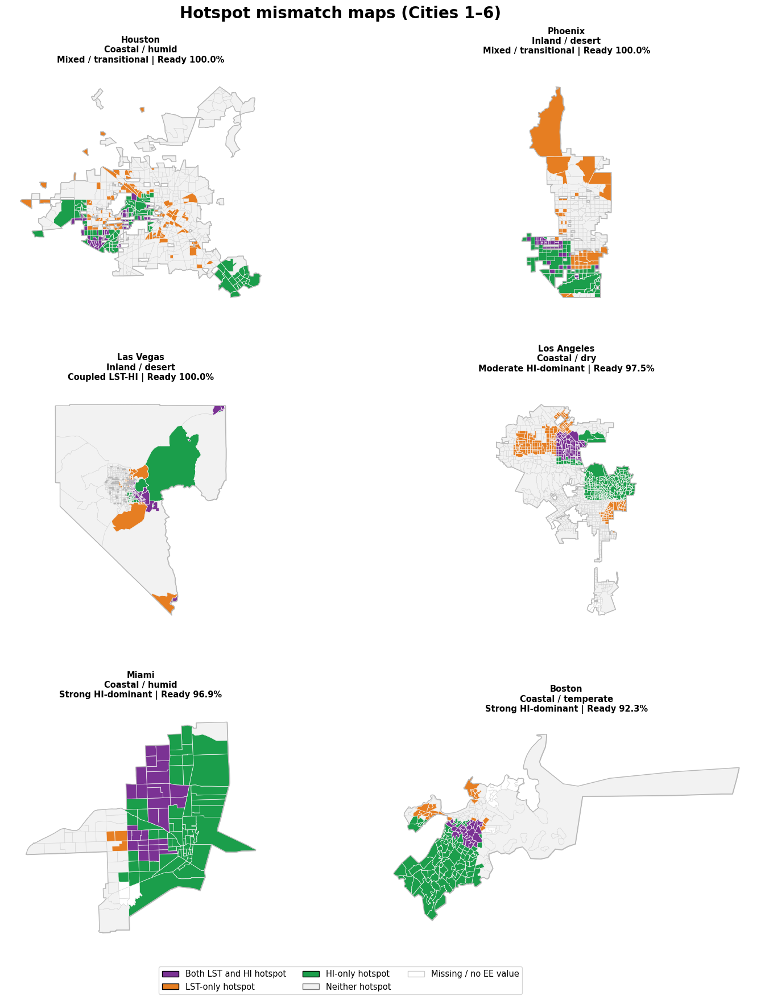

Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_FIXED_12CITY_MAPS_V5/FIG1A_hotspot_mismatch_maps_cities_1_6_FINAL_FIXED_V5.png


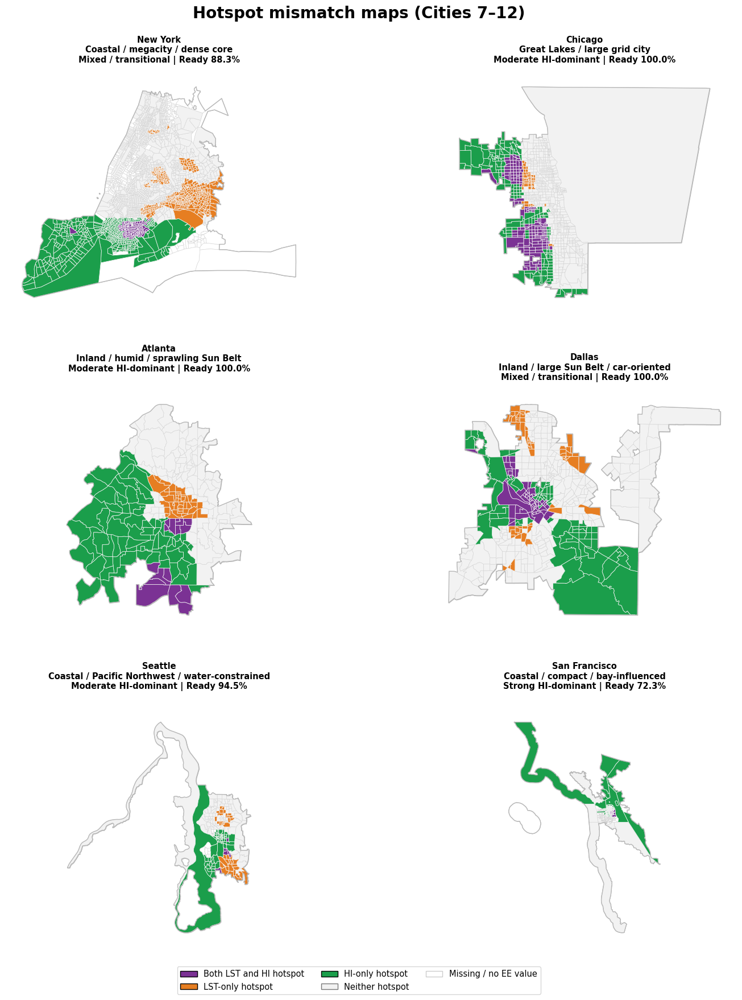

Saved: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_FIXED_12CITY_MAPS_V5/FIG1B_hotspot_mismatch_maps_cities_7_12_FINAL_FIXED_V5.png

QC table:
             city  n_plot_tracts  boundary_file_found  \
0         houston            549                False   
1         phoenix            332                False   
2       las_vegas            458                False   
3     los_angeles           1108                 True   
4           miami            129                 True   
5          boston            207                 True   
6        new_york           2365                 True   
7         chicago            872                 True   
8         atlanta            223                 True   
9          dallas            449                 True   
10        seattle            199                 True   
11  san_francisco            260                 True   

                                        boundary_file  


In [20]:
# =========================================================
# FINAL PATCH FOR THE 12 CITY HOTSPOT MAPS
# - use ONLY tract-level polygons
# - remove large context-only polygons
# - use each city's local *_tracts_boundary.gpkg as outline
# - regenerate ONLY the 2 map pages
# =========================================================

from pathlib import Path
import warnings
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

warnings.filterwarnings("ignore")

# -----------------------------
# paths
# -----------------------------
PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")

BASE = PROJECT / "outputs" / "pilot" / "alphaearth" / "twelve_city_final_figures"
GPKG = BASE / "twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg"
SUMMARY_CSV = BASE / "twelve_city_summary.csv"

OUTDIR = BASE / "FINAL_FIXED_12CITY_MAPS_V5"
OUTDIR.mkdir(parents=True, exist_ok=True)

print("Input GPKG exists:", GPKG.exists())
print("Input summary exists:", SUMMARY_CSV.exists())
print("Output folder:", OUTDIR)

# -----------------------------
# city order
# -----------------------------
CITY_ORDER = [
    "houston", "phoenix",
    "las_vegas", "los_angeles",
    "miami", "boston",
    "new_york", "chicago",
    "atlanta", "dallas",
    "seattle", "san_francisco"
]

# -----------------------------
# read data
# -----------------------------
gdf = gpd.read_file(GPKG)
summary = pd.read_csv(SUMMARY_CSV)

if gdf.crs is None:
    gdf = gdf.set_crs(4326)

gdf = gdf.to_crs(3857)
gdf["city"] = gdf["city"].astype(str)
summary["city"] = summary["city"].astype(str)

# clean mismatch labels
gdf["mismatch_class"] = gdf["mismatch_class"].astype(str).str.strip()
gdf["mismatch_class"] = gdf["mismatch_class"].replace({
    "Both hotspot": "Both LST and HI hotspot",
    "Both LST-HI hotspot": "Both LST and HI hotspot",
    "Both LST and HI hotspots": "Both LST and HI hotspot",
    "Missing / no EE value": "Missing",
    "nan": "Missing",
    "None": "Missing"
})

VALID_CLASSES = {
    "Both LST and HI hotspot",
    "LST-only hotspot",
    "HI-only hotspot",
    "Neither hotspot",
    "Missing"
}
gdf.loc[~gdf["mismatch_class"].isin(VALID_CLASSES), "mismatch_class"] = "Missing"

# geometry fix
def safe_make_valid(x):
    try:
        return x.make_valid()
    except Exception:
        return x.buffer(0)

gdf["geometry"] = safe_make_valid(gdf.geometry)

# -----------------------------
# style
# -----------------------------
COLORS = {
    "Both LST and HI hotspot": "#7B3294",   # purple
    "LST-only hotspot": "#E67E22",          # orange
    "HI-only hotspot": "#1B9E4B",           # green
    "Neither hotspot": "#F2F2F2",           # light gray
    "Missing": "#FFFFFF"                    # white
}

EDGE_BG = "#D3D3D3"
EDGE_HOT = "#F3F3F3"
OUTLINE_COLOR = "#B8B8B8"

# -----------------------------
# helpers
# -----------------------------
def find_boundary_file(city):
    """
    Find each city's local tract boundary file, e.g.
    data/processed/new_york/new_york_tracts_boundary.gpkg
    """
    city_dir = PROJECT / "data" / "processed" / city
    preferred = [
        city_dir / f"{city}_tracts_boundary.gpkg",
        city_dir / f"{city}_boundary.gpkg",
    ]
    for p in preferred:
        if p.exists():
            return p

    cands = sorted(city_dir.glob("*tracts_boundary*.gpkg"))
    if cands:
        return cands[0]

    cands = sorted(city_dir.glob("*boundary*.gpkg"))
    if cands:
        return cands[0]

    return None

def get_context_flag_column(df):
    candidates = [
        "large_context_only",
        "is_large_context_only",
        "context_only",
        "is_context_only",
        "large_context",
        "context_flag",
        "context_only_flag"
    ]
    for c in candidates:
        if c in df.columns:
            return c
    return None

CONTEXT_FLAG_COL = get_context_flag_column(gdf)
print("Detected context flag column:", CONTEXT_FLAG_COL)

def get_city_gdf(city):
    sub = gdf[gdf["city"] == city].copy()
    if sub.empty:
        raise ValueError(f"No rows found for city: {city}")

    # important: remove large context-only polygons
    if CONTEXT_FLAG_COL is not None:
        flag = pd.to_numeric(sub[CONTEXT_FLAG_COL], errors="coerce").fillna(0)
        sub = sub.loc[flag == 0].copy()

    sub["geometry"] = safe_make_valid(sub.geometry)

    if sub.empty:
        raise ValueError(f"After filtering context polygons, no tract rows remain for city: {city}")

    return sub

def get_city_boundary(city):
    """
    Use local city tract boundary as the outer city outline.
    If not found, fallback to dissolve tract polygons.
    """
    fp = find_boundary_file(city)
    if fp is not None and fp.exists():
        bd = gpd.read_file(fp)
        if bd.crs is None:
            bd = bd.set_crs(4326)
        bd = bd.to_crs(3857)
        bd["geometry"] = safe_make_valid(bd.geometry)
        bd = bd.dissolve()
        return bd

    # fallback: dissolve the tract polygons
    sub = get_city_gdf(city)
    bd = sub.dissolve()
    bd["geometry"] = safe_make_valid(bd.geometry)
    return bd

def get_summary_row(city):
    row = summary[summary["city"] == city]
    if row.empty:
        return {
            "city_label": city.replace("_", " ").title(),
            "city_context": "",
            "mechanism_type": "",
            "ready_pct": np.nan
        }
    return row.iloc[0]

def set_extent_from_boundary(ax, boundary):
    xmin, ymin, xmax, ymax = boundary.total_bounds
    w = max(xmax - xmin, 1)
    h = max(ymax - ymin, 1)

    # moderate padding so cities appear larger and clearer
    pad_x = max(w * 0.06, 1200)
    pad_y = max(h * 0.08, 1200)

    ax.set_xlim(xmin - pad_x, xmax + pad_x)
    ax.set_ylim(ymin - pad_y, ymax + pad_y)

def draw_city(ax, city):
    sub = get_city_gdf(city)
    boundary = get_city_boundary(city)
    row = get_summary_row(city)

    # 1) plot boundary silhouette first
    boundary.plot(
        ax=ax,
        facecolor="#FAFAFA",
        edgecolor=OUTLINE_COLOR,
        linewidth=0.9,
        zorder=1
    )

    # 2) plot all tract-level polygons (small cells)
    #    this avoids giant gray blocks and keeps city texture
    base = sub[sub["mismatch_class"] == "Neither hotspot"].copy()
    if not base.empty:
        base.plot(
            ax=ax,
            facecolor=COLORS["Neither hotspot"],
            edgecolor=EDGE_BG,
            linewidth=0.40,
            zorder=2
        )

    miss = sub[sub["mismatch_class"] == "Missing"].copy()
    if not miss.empty:
        miss.plot(
            ax=ax,
            facecolor=COLORS["Missing"],
            edgecolor=EDGE_BG,
            linewidth=0.40,
            zorder=3
        )

    for cls in ["LST-only hotspot", "HI-only hotspot", "Both LST and HI hotspot"]:
        part = sub[sub["mismatch_class"] == cls].copy()
        if not part.empty:
            part.plot(
                ax=ax,
                facecolor=COLORS[cls],
                edgecolor=EDGE_HOT,
                linewidth=0.55,
                zorder=4
            )

    # 3) re-draw boundary outline
    boundary.boundary.plot(
        ax=ax,
        color=OUTLINE_COLOR,
        linewidth=1.0,
        zorder=5
    )

    set_extent_from_boundary(ax, boundary)

    city_label = row["city_label"] if "city_label" in row else city.replace("_", " ").title()
    city_context = row["city_context"] if "city_context" in row else ""
    mechanism = row["mechanism_type"] if "mechanism_type" in row else ""
    ready_pct = float(row["ready_pct"]) if "ready_pct" in row and pd.notna(row["ready_pct"]) else np.nan

    title_lines = [str(city_label)]
    if pd.notna(city_context) and str(city_context).strip() != "":
        title_lines.append(str(city_context))
    mech_text = str(mechanism).strip() if pd.notna(mechanism) else ""
    if mech_text != "" and not np.isnan(ready_pct):
        title_lines.append(f"{mech_text} | Ready {ready_pct:.1f}%")
    elif mech_text != "":
        title_lines.append(mech_text)
    elif not np.isnan(ready_pct):
        title_lines.append(f"Ready {ready_pct:.1f}%")

    ax.set_title(
        "\n".join(title_lines),
        fontsize=10.5,
        fontweight="semibold",
        pad=10
    )

    ax.set_aspect("equal")
    ax.set_axis_off()

def make_page(cities, outfile, page_title):
    fig, axes = plt.subplots(3, 2, figsize=(15.2, 18.3))
    axes = axes.flatten()

    for ax, city in zip(axes, cities):
        draw_city(ax, city)

    handles = [
        Patch(facecolor=COLORS["Both LST and HI hotspot"], edgecolor="black", label="Both LST and HI hotspot"),
        Patch(facecolor=COLORS["LST-only hotspot"], edgecolor="black", label="LST-only hotspot"),
        Patch(facecolor=COLORS["HI-only hotspot"], edgecolor="black", label="HI-only hotspot"),
        Patch(facecolor=COLORS["Neither hotspot"], edgecolor="#777777", label="Neither hotspot"),
        Patch(facecolor=COLORS["Missing"], edgecolor="#CCCCCC", label="Missing / no EE value"),
    ]

    fig.suptitle(
        page_title,
        fontsize=20,
        fontweight="bold",
        y=0.982
    )

    fig.legend(
        handles=handles,
        loc="lower center",
        bbox_to_anchor=(0.5, 0.028),
        ncol=3,
        frameon=True,
        fontsize=10.5
    )

    fig.subplots_adjust(
        left=0.045,
        right=0.985,
        top=0.92,
        bottom=0.075,
        hspace=0.30,
        wspace=0.10
    )

    fig.savefig(outfile, dpi=650, bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close(fig)
    print("Saved:", outfile)

# -----------------------------
# regenerate ONLY the 2 map pages
# -----------------------------
page1 = CITY_ORDER[:6]
page2 = CITY_ORDER[6:]

make_page(
    page1,
    OUTDIR / "FIG1A_hotspot_mismatch_maps_cities_1_6_FINAL_FIXED_V5.png",
    "Hotspot mismatch maps (Cities 1–6)"
)

make_page(
    page2,
    OUTDIR / "FIG1B_hotspot_mismatch_maps_cities_7_12_FINAL_FIXED_V5.png",
    "Hotspot mismatch maps (Cities 7–12)"
)

# -----------------------------
# quick QC output
# -----------------------------
qc_rows = []
for city in CITY_ORDER:
    sub = get_city_gdf(city)
    boundary_fp = find_boundary_file(city)
    qc_rows.append({
        "city": city,
        "n_plot_tracts": len(sub),
        "boundary_file_found": boundary_fp is not None,
        "boundary_file": str(boundary_fp) if boundary_fp is not None else "fallback=dissolve_tracts"
    })

qc = pd.DataFrame(qc_rows)
qc.to_csv(OUTDIR / "FIG1_map_qc_v5.csv", index=False)

print("\nQC table:")
print(qc)

print("\nDONE. Open this folder:")
print(OUTDIR)

Input GPKG: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg
Output folder: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN
Rows: 7151
Columns:
['city', 'city_label', 'GEOID', 'lst_c', 'hi_c', 'hi_minus_lst', 'analysis_ready', 'lst_pct_city', 'hi_pct_city', 'lst_z_city', 'hi_z_city', 'hi_minus_lst_pct', 'hi_minus_lst_z', 'lst_hot_q75', 'hi_hot_q75', 'mismatch_class', 'priority_flag', 'city_context', 'ALAND', 'AWATER', 'COUNTYFP', 'FUNCSTAT', 'GEOIDFQ', 'INTPTLAT', 'INTPTLON', 'MTFCC', 'NAME', 'NAMELSAD', 'STATEFP', 'TRACTCE', 'centroid_in_city', 'intersects_city', 'state_fips', 'state_name', 'lst_pct', 'hi_pct', 'lst_hot', 'hi_hot', 'q75_lst_c', 'q75_hi_c', 'q75_hi_minus_lst_pct', 'geometry']
city_col: city
class_col: mismatch_class
lst_col: lst_c
hi_col: hi_c


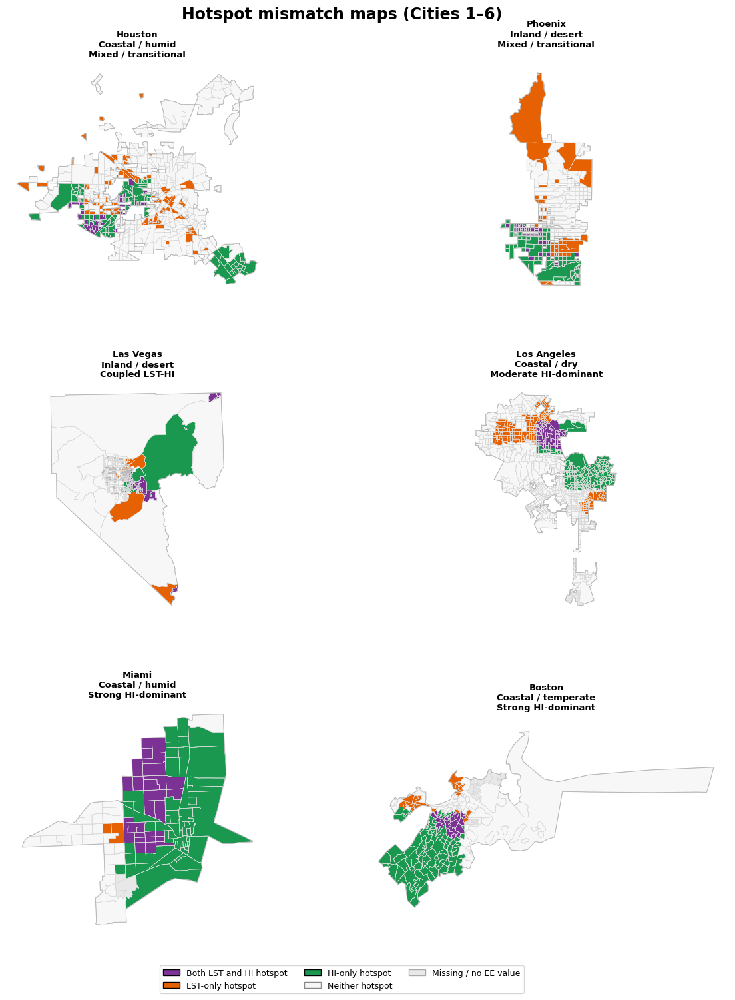

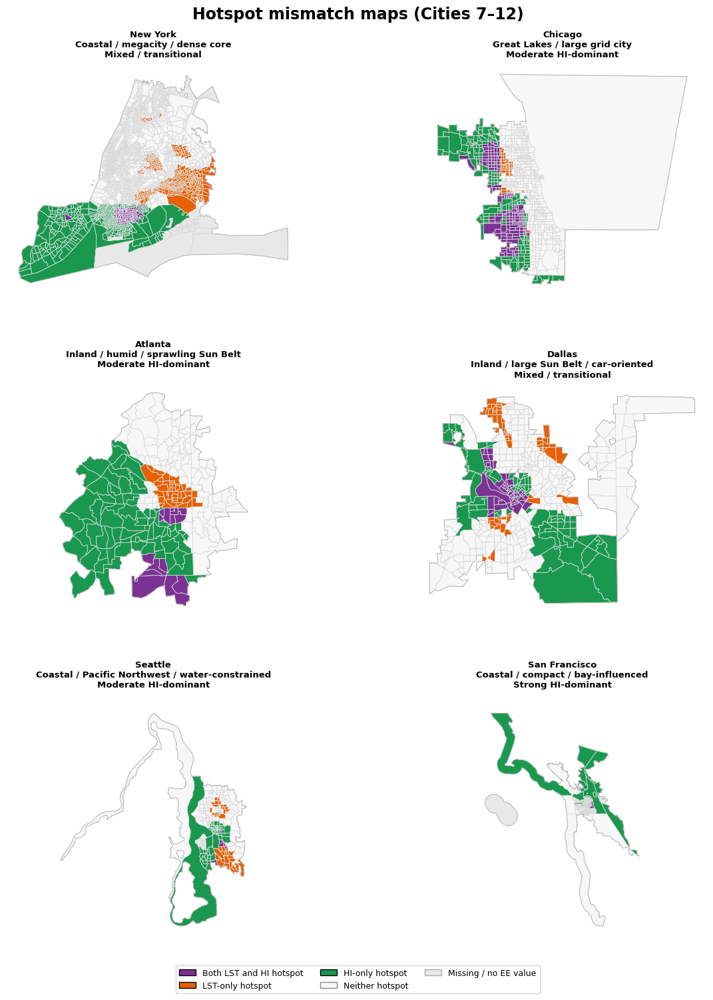


QC:


,city,n_tracts_plotted,both,lst_only,hi_only,neither,missing
0,houston,549,51,87,89,322,0
1,phoenix,332,36,47,61,188,0
2,las_vegas,458,74,41,41,302,0
3,los_angeles,1108,78,192,280,530,28
4,miami,129,29,3,65,28,4
5,boston,207,26,22,91,52,16
6,new_york,2365,121,401,408,1158,277
7,chicago,872,161,57,153,501,0
8,atlanta,223,15,41,72,95,0
9,dallas,449,56,57,84,252,0



Saved clean maps to:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN

Individual city maps:
- outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN/INDIV_houston_tract_level_clean.png
- outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN/INDIV_phoenix_tract_level_clean.png
- outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN/INDIV_las_vegas_tract_level_clean.png
- outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN/INDIV_los_angeles_tract_level_clean.png
- outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN/INDIV_miami_tract_level_clean.png
- outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN/INDIV_boston_tract_level_clean.png
- outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN/INDIV_new_york_tract_level_clean.pn

In [23]:
# ============================================================
# FINAL MAP FIX: use ONLY final combined tract-level GPKG
# Goal:
# 1) No weird PLACE/county boundary.
# 2) No huge blank caused by wrong extent.
# 3) Every city uses actual tract polygons from final combined layer.
# 4) Save clean page maps + individual city maps for checking.
# ============================================================

from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")

# Use final combined 12-city tract-level result.
INPUT_GPKG_CANDIDATES = [
    PROJECT / "outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg",
    PROJECT / "outputs/pilot/alphaearth/city_expansion_12city/twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg",
    PROJECT / "outputs/pilot/alphaearth/city_expansion_12city/step3_twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg",
    PROJECT / "outputs/pilot/alphaearth/city_expansion_12city/step2_new_6_city_lst_hi_combined.gpkg",
]

INPUT_GPKG = None
for p in INPUT_GPKG_CANDIDATES:
    if p.exists():
        INPUT_GPKG = p
        break

if INPUT_GPKG is None:
    raise FileNotFoundError("Cannot find final 12-city GPKG. Check the candidate paths.")

OUTDIR = PROJECT / "outputs/pilot/alphaearth/twelve_city_final_figures/FINAL_TRACT_LEVEL_MAPS_CLEAN"
OUTDIR.mkdir(parents=True, exist_ok=True)

print("Input GPKG:", INPUT_GPKG)
print("Output folder:", OUTDIR)

gdf = gpd.read_file(INPUT_GPKG)

print("Rows:", len(gdf))
print("Columns:")
print(list(gdf.columns))

# ------------------------------------------------------------
# Robust column detection
# ------------------------------------------------------------

def find_col(df, candidates):
    lower_map = {c.lower(): c for c in df.columns}
    for name in candidates:
        if name.lower() in lower_map:
            return lower_map[name.lower()]
    return None

city_col = find_col(gdf, ["city", "city_name", "city_slug"])
label_col = find_col(gdf, ["city_label", "label", "NAME"])
context_col = find_col(gdf, ["city_context", "context"])

if city_col is None:
    raise KeyError("Cannot find city column in GPKG.")

# mismatch class column: handle mismatch_class_x / mismatch_class_y too
class_candidates = [
    c for c in gdf.columns
    if ("mismatch" in c.lower() and "class" in c.lower())
    or ("hotspot" in c.lower() and "class" in c.lower())
]
if "mismatch_class" in gdf.columns:
    class_col = "mismatch_class"
elif len(class_candidates) > 0:
    class_col = class_candidates[0]
else:
    raise KeyError(f"Cannot find mismatch class column. Available columns: {list(gdf.columns)}")

lst_col = find_col(gdf, ["lst_c", "lst", "LST"])
hi_col = find_col(gdf, ["hi_c", "hi", "heat_index", "HI"])

ready_col = find_col(gdf, ["ready_pct", "analysis_ready_pct"])
mechanism_col = find_col(gdf, ["mechanism_type", "mechanism"])

print("city_col:", city_col)
print("class_col:", class_col)
print("lst_col:", lst_col)
print("hi_col:", hi_col)

# ------------------------------------------------------------
# Standardize city names and mismatch classes
# ------------------------------------------------------------

def slugify_city(x):
    return str(x).strip().lower().replace(" ", "_").replace("-", "_")

gdf["_city_slug"] = gdf[city_col].map(slugify_city)

CITY_ORDER = [
    "houston", "phoenix", "las_vegas", "los_angeles", "miami", "boston",
    "new_york", "chicago", "atlanta", "dallas", "seattle", "san_francisco"
]

CITY_LABELS = {
    "houston": "Houston",
    "phoenix": "Phoenix",
    "las_vegas": "Las Vegas",
    "los_angeles": "Los Angeles",
    "miami": "Miami",
    "boston": "Boston",
    "new_york": "New York",
    "chicago": "Chicago",
    "atlanta": "Atlanta",
    "dallas": "Dallas",
    "seattle": "Seattle",
    "san_francisco": "San Francisco",
}

CITY_CONTEXT = {
    "houston": "Coastal / humid",
    "phoenix": "Inland / desert",
    "las_vegas": "Inland / desert",
    "los_angeles": "Coastal / dry",
    "miami": "Coastal / humid",
    "boston": "Coastal / temperate",
    "new_york": "Coastal / megacity / dense core",
    "chicago": "Great Lakes / large grid city",
    "atlanta": "Inland / humid / sprawling Sun Belt",
    "dallas": "Inland / large Sun Belt / car-oriented",
    "seattle": "Coastal / Pacific Northwest / water-constrained",
    "san_francisco": "Coastal / compact / bay-influenced",
}

MECH = {
    "houston": "Mixed / transitional",
    "phoenix": "Mixed / transitional",
    "las_vegas": "Coupled LST-HI",
    "los_angeles": "Moderate HI-dominant",
    "miami": "Strong HI-dominant",
    "boston": "Strong HI-dominant",
    "new_york": "Mixed / transitional",
    "chicago": "Moderate HI-dominant",
    "atlanta": "Moderate HI-dominant",
    "dallas": "Mixed / transitional",
    "seattle": "Moderate HI-dominant",
    "san_francisco": "Strong HI-dominant",
}

def clean_class(x):
    if pd.isna(x):
        return "Neither hotspot"
    s = str(x).strip().lower()

    if "missing" in s or "no ee" in s or "no value" in s:
        return "Missing / no EE value"
    if "both" in s:
        return "Both LST and HI hotspot"
    if "lst" in s and "only" in s:
        return "LST-only hotspot"
    if ("hi" in s or "heat" in s) and "only" in s:
        return "HI-only hotspot"
    if "neither" in s or "other" in s:
        return "Neither hotspot"

    return str(x).strip()

gdf["_class"] = gdf[class_col].map(clean_class)

# If LST/HI value is missing, mark as missing.
if lst_col is not None and hi_col is not None:
    missing_mask = gdf[lst_col].isna() | gdf[hi_col].isna()
    gdf.loc[missing_mask, "_class"] = "Missing / no EE value"

# Clean geometries
gdf = gdf[gdf.geometry.notna()].copy()
gdf = gdf[~gdf.geometry.is_empty].copy()
gdf["geometry"] = gdf.geometry.buffer(0)

# ------------------------------------------------------------
# Styling
# ------------------------------------------------------------

COLORS = {
    "Both LST and HI hotspot": "#7B3294",   # purple
    "LST-only hotspot": "#E66101",          # orange
    "HI-only hotspot": "#1A9850",           # green
    "Neither hotspot": "#F7F7F7",           # near white
    "Missing / no EE value": "#E8E8E8",     # light gray
}

EDGE_BASE = "#D2D2D2"
EDGE_HOT = "white"

PLOT_ORDER = [
    "Neither hotspot",
    "Missing / no EE value",
    "LST-only hotspot",
    "HI-only hotspot",
    "Both LST and HI hotspot",
]

# ------------------------------------------------------------
# Prepare each city: only final tract-level polygons, no PLACE/county layer
# ------------------------------------------------------------

def city_subset(city):
    sub = gdf[gdf["_city_slug"] == city].copy()

    if len(sub) == 0:
        raise ValueError(f"No rows found for city: {city}")

    # Project each city to local projected CRS for better shape.
    if sub.crs is None:
        sub = sub.set_crs("EPSG:4326", allow_override=True)

    try:
        local_crs = sub.estimate_utm_crs()
        if local_crs is not None:
            sub = sub.to_crs(local_crs)
        else:
            sub = sub.to_crs("EPSG:3857")
    except Exception:
        sub = sub.to_crs("EPSG:3857")

    sub = sub[sub.geometry.notna() & (~sub.geometry.is_empty)].copy()
    sub["geometry"] = sub.geometry.buffer(0)

    return sub

def set_clean_extent(ax, sub, pad_frac=0.045):
    """
    Fix huge blank space:
    use exact tract-level city bounds, not external context boundary.
    """
    minx, miny, maxx, maxy = sub.total_bounds
    w = maxx - minx
    h = maxy - miny

    pad = max(w, h) * pad_frac

    ax.set_xlim(minx - pad, maxx + pad)
    ax.set_ylim(miny - pad, maxy + pad)
    ax.set_aspect("equal", adjustable="box")
    ax.axis("off")

def draw_city(ax, city):
    sub = city_subset(city)

    # Plot neither/missing first, then colored classes on top.
    for cls in PLOT_ORDER:
        part = sub[sub["_class"] == cls]
        if len(part) == 0:
            continue

        if cls in ["Neither hotspot", "Missing / no EE value"]:
            part.plot(
                ax=ax,
                facecolor=COLORS[cls],
                edgecolor=EDGE_BASE,
                linewidth=0.35,
                zorder=1,
            )
        else:
            part.plot(
                ax=ax,
                facecolor=COLORS[cls],
                edgecolor=EDGE_HOT,
                linewidth=0.32,
                zorder=3,
            )

    # Draw full tract grid on top so gray/white parts are visibly subdivided.
    sub.boundary.plot(
        ax=ax,
        color="#D9D9D9",
        linewidth=0.28,
        zorder=4,
    )

    # Stronger outer city outline, using dissolved tract boundary only.
    outline = sub.dissolve()
    outline.boundary.plot(
        ax=ax,
        color="#B8B8B8",
        linewidth=0.75,
        zorder=5,
    )

    ready_pct = None
    if ready_col is not None and ready_col in sub.columns:
        try:
            ready_pct = float(pd.to_numeric(sub[ready_col], errors="coerce").dropna().iloc[0])
        except Exception:
            ready_pct = None

    if ready_pct is None:
        ready_text = ""
    else:
        ready_text = f" | Ready {ready_pct:.1f}%"

    title = (
        f"{CITY_LABELS.get(city, city)}\n"
        f"{CITY_CONTEXT.get(city, '')}\n"
        f"{MECH.get(city, '')}{ready_text}"
    )

    ax.set_title(title, fontsize=9.5, fontweight="bold", pad=7)
    set_clean_extent(ax, sub)

    return {
        "city": city,
        "n_tracts": len(sub),
        "class_counts": sub["_class"].value_counts().to_dict(),
        "bounds": sub.total_bounds,
    }

def make_page(cities, outfile, suptitle):
    fig, axes = plt.subplots(3, 2, figsize=(12.5, 15.5))
    axes = axes.flatten()

    qc_rows = []
    for ax, city in zip(axes, cities):
        qc_rows.append(draw_city(ax, city))

    for ax in axes[len(cities):]:
        ax.axis("off")

    handles = [
        Patch(facecolor=COLORS["Both LST and HI hotspot"], edgecolor="black", label="Both LST and HI hotspot"),
        Patch(facecolor=COLORS["LST-only hotspot"], edgecolor="black", label="LST-only hotspot"),
        Patch(facecolor=COLORS["HI-only hotspot"], edgecolor="black", label="HI-only hotspot"),
        Patch(facecolor=COLORS["Neither hotspot"], edgecolor="#888888", label="Neither hotspot"),
        Patch(facecolor=COLORS["Missing / no EE value"], edgecolor="#AAAAAA", label="Missing / no EE value"),
    ]

    fig.legend(
        handles=handles,
        loc="lower center",
        ncol=3,
        frameon=True,
        fontsize=9,
        bbox_to_anchor=(0.5, 0.025)
    )

    fig.suptitle(suptitle, fontsize=17, fontweight="bold", y=0.985)

    # Enough top/bottom spacing so title and city labels do not overlap.
    plt.subplots_adjust(
        left=0.035,
        right=0.965,
        top=0.93,
        bottom=0.085,
        hspace=0.38,
        wspace=0.12
    )

    fig.savefig(outfile, dpi=320, bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close(fig)

    return qc_rows

def make_individual(city):
    sub = city_subset(city)

    fig, ax = plt.subplots(figsize=(7.2, 7.2))
    draw_city(ax, city)

    out = OUTDIR / f"INDIV_{city}_tract_level_clean.png"
    fig.savefig(out, dpi=330, bbox_inches="tight", facecolor="white")
    plt.close(fig)
    return out

# ------------------------------------------------------------
# Generate final clean maps
# ------------------------------------------------------------

page1 = CITY_ORDER[:6]
page2 = CITY_ORDER[6:]

qc1 = make_page(
    page1,
    OUTDIR / "FIG1A_hotspot_mismatch_maps_cities_1_6_TRACT_LEVEL_CLEAN.png",
    "Hotspot mismatch maps (Cities 1–6)"
)

qc2 = make_page(
    page2,
    OUTDIR / "FIG1B_hotspot_mismatch_maps_cities_7_12_TRACT_LEVEL_CLEAN.png",
    "Hotspot mismatch maps (Cities 7–12)"
)

# Also save individual maps for detailed checking.
individual_outputs = []
for city in CITY_ORDER:
    individual_outputs.append(make_individual(city))

# QC table
qc_table = []
for city in CITY_ORDER:
    sub = city_subset(city)
    counts = sub["_class"].value_counts().to_dict()
    qc_table.append({
        "city": city,
        "n_tracts_plotted": len(sub),
        "both": counts.get("Both LST and HI hotspot", 0),
        "lst_only": counts.get("LST-only hotspot", 0),
        "hi_only": counts.get("HI-only hotspot", 0),
        "neither": counts.get("Neither hotspot", 0),
        "missing": counts.get("Missing / no EE value", 0),
    })

qc_df = pd.DataFrame(qc_table)
qc_df.to_csv(OUTDIR / "tract_level_map_qc.csv", index=False)

print("\nQC:")
display(qc_df)

print("\nSaved clean maps to:")
print(OUTDIR)
print("\nIndividual city maps:")
for p in individual_outputs:
    print("-", p.relative_to(PROJECT))

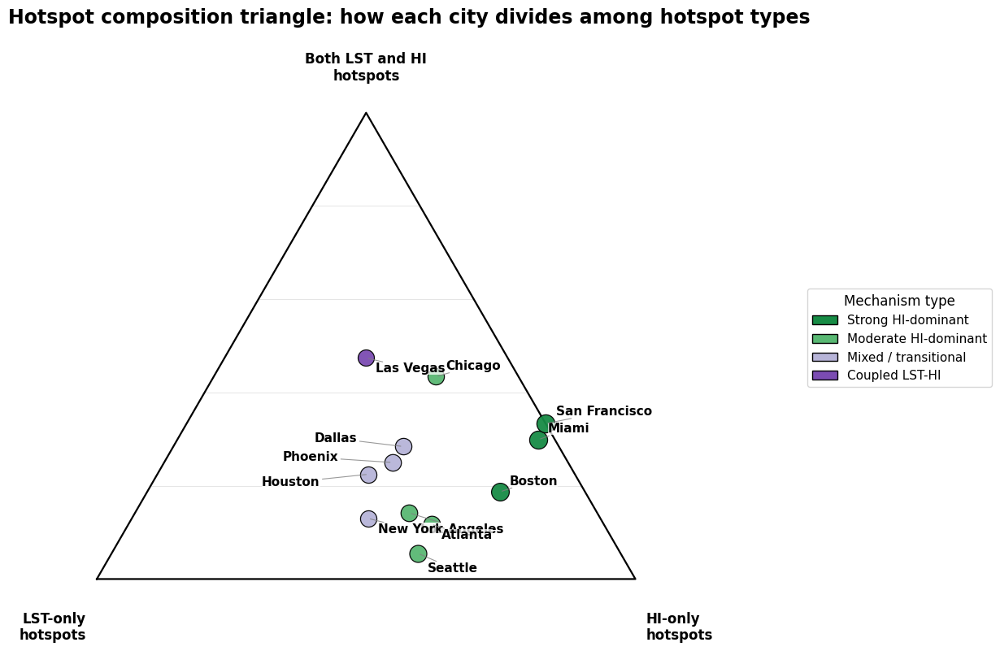

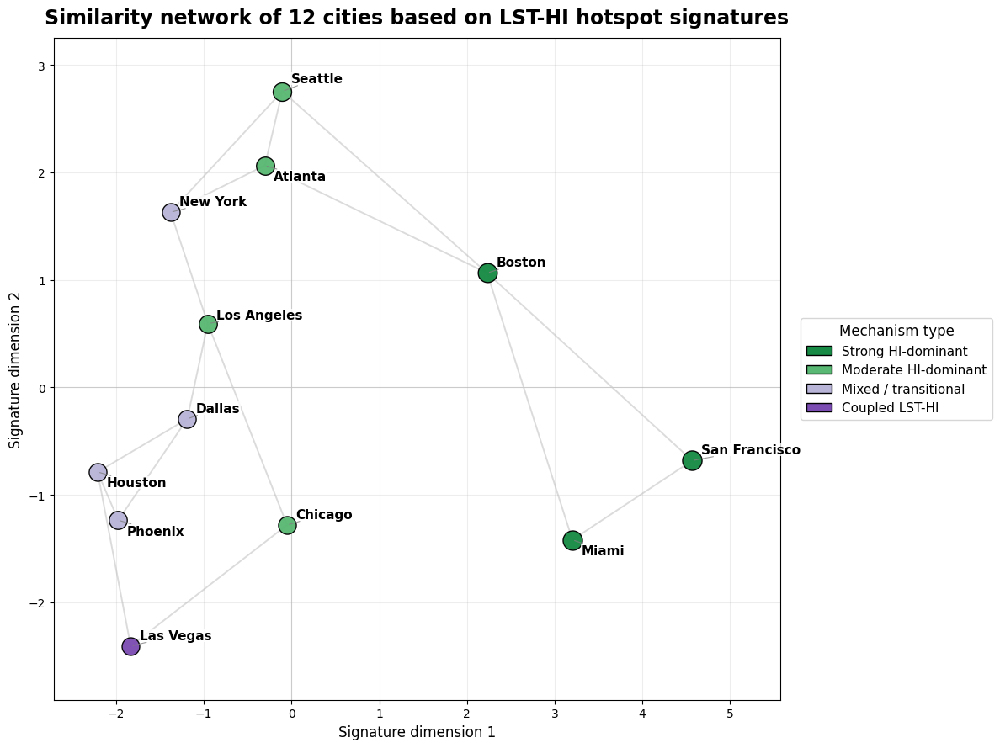

Saved:
- /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_relationship_story/FIG2_hotspot_composition_triangle_clean_v2.png
- /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_relationship_story/FIG4_city_signature_similarity_network_clean_v2.png


In [25]:
# ============================================================
# RE-DRAW ONLY THE LAST TWO FIGURES
# Goal:
# 1) Make similarity network cleaner like FIG1
# 2) Make hotspot composition triangle cleaner like FIG1
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ------------------------------------------------------------
# Safety check
# ------------------------------------------------------------
required_vars = ["df", "MECH_COLORS", "OUTDIR"]
for v in required_vars:
    if v not in globals():
        raise RuntimeError(f"Missing required variable: {v}. Please run the previous 12-city summary cell first.")

def color_for_mech(x):
    return MECH_COLORS.get(str(x), "#BBBBBB")

# ============================================================
# FIG A: CLEAN HOTSPOT COMPOSITION TRIANGLE
# ============================================================

tri_df = df.copy()

# Make sure needed columns exist
for c in ["both_pct", "lst_only_pct", "hi_only_pct"]:
    tri_df[c] = pd.to_numeric(tri_df[c], errors="coerce")

tri_df["hotspot_total_pct"] = tri_df["both_pct"] + tri_df["lst_only_pct"] + tri_df["hi_only_pct"]
tri_df = tri_df[tri_df["hotspot_total_pct"] > 0].copy()

# Shares among hotspot types
tri_df["both_share"] = tri_df["both_pct"] / tri_df["hotspot_total_pct"]
tri_df["lst_only_share"] = tri_df["lst_only_pct"] / tri_df["hotspot_total_pct"]
tri_df["hi_only_share"] = tri_df["hi_only_pct"] / tri_df["hotspot_total_pct"]

# Triangle coordinates
sqrt3 = np.sqrt(3)
tri_df["tri_x"] = tri_df["hi_only_share"] + 0.5 * tri_df["both_share"]
tri_df["tri_y"] = (sqrt3 / 2) * tri_df["both_share"]

fig, ax = plt.subplots(figsize=(12, 9))

# Triangle boundary
triangle_x = [0, 1, 0.5, 0]
triangle_y = [0, 0, sqrt3 / 2, 0]
ax.plot(triangle_x, triangle_y, color="black", linewidth=1.6, zorder=1)

# Optional light guide lines
for frac in [0.2, 0.4, 0.6, 0.8]:
    # parallel to base
    y = frac * sqrt3 / 2
    x_left = 0.5 * frac
    x_right = 1 - 0.5 * frac
    ax.plot([x_left, x_right], [y, y], color="lightgray", linewidth=0.7, alpha=0.6, zorder=0)

# Point sizes
tri_df["plot_size"] = 160 + tri_df["priority_pct"].fillna(0) * 1.8

# Plot points
for _, row in tri_df.iterrows():
    ax.scatter(
        row["tri_x"],
        row["tri_y"],
        s=row["plot_size"],
        color=color_for_mech(row["mechanism_type"]),
        edgecolor="black",
        linewidth=0.9,
        alpha=0.95,
        zorder=3
    )

# Manually tuned label offsets: clear like FIG1
tri_offsets = {
    "Houston": (-0.09, -0.015),
    "Phoenix": (-0.10,  0.010),
    "Las Vegas": (0.018, -0.020),
    "Los Angeles": (0.020, -0.030),
    "Miami": (0.018, 0.020),
    "Boston": (0.018, 0.020),
    "New York": (0.018, -0.020),
    "Chicago": (0.018, 0.020),
    "Atlanta": (0.018, -0.020),
    "Dallas": (-0.085, 0.015),
    "Seattle": (0.018, -0.028),
    "San Francisco": (0.020, 0.022),
}

# Add labels with leader lines
for _, row in tri_df.iterrows():
    label = row["city_label"]
    dx, dy = tri_offsets.get(label, (0.02, 0.02))
    ax.annotate(
        label,
        xy=(row["tri_x"], row["tri_y"]),
        xytext=(row["tri_x"] + dx, row["tri_y"] + dy),
        fontsize=11,
        fontweight="bold",
        ha="left" if dx >= 0 else "right",
        va="center",
        arrowprops=dict(arrowstyle="-", color="gray", lw=0.8, alpha=0.8),
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.75, pad=0.15),
        zorder=4
    )

# Corner labels: separated, not colliding with title
ax.text(
    -0.02, -0.06,
    "LST-only\nhotspots",
    ha="right", va="top",
    fontsize=12, fontweight="bold"
)

ax.text(
    1.02, -0.06,
    "HI-only\nhotspots",
    ha="left", va="top",
    fontsize=12, fontweight="bold"
)

ax.text(
    0.5, sqrt3 / 2 + 0.055,
    "Both LST and HI\nhotspots",
    ha="center", va="bottom",
    fontsize=12, fontweight="bold"
)

ax.set_title(
    "Hotspot composition triangle: how each city divides among hotspot types",
    fontsize=17,
    fontweight="bold",
    pad=22
)

ax.set_xlim(-0.12, 1.28)
ax.set_ylim(-0.09, sqrt3 / 2 + 0.12)
ax.set_aspect("equal")
ax.axis("off")

legend_handles = [
    Patch(facecolor=v, edgecolor="black", label=k)
    for k, v in MECH_COLORS.items()
    if k in tri_df["mechanism_type"].unique()
]
ax.legend(
    handles=legend_handles,
    title="Mechanism type",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=True,
    fontsize=11,
    title_fontsize=12
)

fig.tight_layout()
fig.savefig(OUTDIR / "FIG2_hotspot_composition_triangle_clean_v2.png", dpi=350, bbox_inches="tight")
plt.show()

# ============================================================
# FIG B: CLEAN SIMILARITY NETWORK
# ============================================================

network_metrics = [
    "mean_lst_c",
    "mean_hi_c",
    "lst_hi_corr",
    "both_pct",
    "lst_only_pct",
    "hi_only_pct",
    "hi_minus_lst_hotspot_pct",
    "priority_pct",
]

net_df = df.copy()
X = net_df[network_metrics].apply(pd.to_numeric, errors="coerce")
X = X.fillna(X.mean())

# Standardize
Xz = (X - X.mean()) / X.std(ddof=0)
Xz = Xz.replace([np.inf, -np.inf], 0).fillna(0)

# PCA-like 2D embedding using SVD
Xmat = Xz.values
U, S, Vt = np.linalg.svd(Xmat, full_matrices=False)
scores = U[:, :2] * S[:2]

net_df["PC1"] = scores[:, 0]
net_df["PC2"] = scores[:, 1]

# Pairwise distance
D = np.sqrt(((Xmat[:, None, :] - Xmat[None, :, :]) ** 2).sum(axis=2))

# Keep 2 nearest neighbors for each city
edges = []
for i in range(len(net_df)):
    nearest = np.argsort(D[i])[1:3]
    for j in nearest:
        a, b = sorted([i, j])
        edges.append((a, b, D[a, b]))

edges = pd.DataFrame(edges, columns=["i", "j", "distance"]).drop_duplicates()

fig, ax = plt.subplots(figsize=(12, 9))

# Draw edges first
for _, e in edges.iterrows():
    i = int(e["i"])
    j = int(e["j"])
    ax.plot(
        [net_df.loc[i, "PC1"], net_df.loc[j, "PC1"]],
        [net_df.loc[i, "PC2"], net_df.loc[j, "PC2"]],
        color="lightgray",
        linewidth=1.4,
        alpha=0.8,
        zorder=1
    )

# Point sizes
net_df["plot_size"] = 180 + net_df["priority_pct"].fillna(0) * 1.8

# Draw nodes
for _, row in net_df.iterrows():
    ax.scatter(
        row["PC1"],
        row["PC2"],
        s=row["plot_size"],
        color=color_for_mech(row["mechanism_type"]),
        edgecolor="black",
        linewidth=1.0,
        alpha=0.96,
        zorder=3
    )

# Manual label placement like FIG1
net_offsets = {
    "Houston": (0.10, -0.10),
    "Phoenix": (0.10, -0.10),
    "Las Vegas": (0.10, 0.10),
    "Los Angeles": (0.10, 0.08),
    "Miami": (0.10, -0.10),
    "Boston": (0.10, 0.10),
    "New York": (0.10, 0.10),
    "Chicago": (0.10, 0.10),
    "Atlanta": (0.10, -0.10),
    "Dallas": (0.10, 0.10),
    "Seattle": (0.10, 0.12),
    "San Francisco": (0.10, 0.10),
}

for _, row in net_df.iterrows():
    label = row["city_label"]
    dx, dy = net_offsets.get(label, (0.10, 0.10))
    ax.annotate(
        label,
        xy=(row["PC1"], row["PC2"]),
        xytext=(row["PC1"] + dx, row["PC2"] + dy),
        fontsize=11,
        fontweight="bold",
        ha="left",
        va="center",
        arrowprops=dict(arrowstyle="-", color="gray", lw=0.8, alpha=0.8),
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.78, pad=0.15),
        zorder=4
    )

ax.axhline(0, color="lightgray", linewidth=0.8, zorder=0)
ax.axvline(0, color="lightgray", linewidth=0.8, zorder=0)
ax.grid(True, alpha=0.22)

ax.set_xlabel("Signature dimension 1", fontsize=12)
ax.set_ylabel("Signature dimension 2", fontsize=12)
ax.set_title(
    "Similarity network of 12 cities based on LST-HI hotspot signatures",
    fontsize=17,
    fontweight="bold",
    pad=12
)

legend_handles = [
    Patch(facecolor=v, edgecolor="black", label=k)
    for k, v in MECH_COLORS.items()
    if k in net_df["mechanism_type"].unique()
]
ax.legend(
    handles=legend_handles,
    title="Mechanism type",
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    frameon=True,
    fontsize=11,
    title_fontsize=12
)

# More padding around points so text has room
xpad = 0.5
ypad = 0.5
ax.set_xlim(net_df["PC1"].min() - xpad, net_df["PC1"].max() + xpad * 2.0)
ax.set_ylim(net_df["PC2"].min() - ypad, net_df["PC2"].max() + ypad)

fig.tight_layout()
fig.savefig(OUTDIR / "FIG4_city_signature_similarity_network_clean_v2.png", dpi=350, bbox_inches="tight")
plt.show()

print("Saved:")
print("-", OUTDIR / "FIG2_hotspot_composition_triangle_clean_v2.png")
print("-", OUTDIR / "FIG4_city_signature_similarity_network_clean_v2.png")


TOP HI-SHIFT CITIES:


,city_label,city_context,mechanism_type,ready_pct,hi_only_pct,lst_only_pct,both_pct,hi_minus_lst_hotspot_pct,priority_pct,lst_hi_corr
0,San Francisco,Coastal / compact / bay-influenced,Strong HI-dominant,72.307692,53.191489,0.000000,26.595745,53.191489,53.723404,0.276261
1,Miami,Coastal / humid,Strong HI-dominant,96.899225,52.000000,2.400000,23.200000,49.600000,52.000000,0.213787
2,Boston,Coastal / temperate,Strong HI-dominant,92.270531,47.643979,11.518325,13.612565,36.125654,47.643979,0.000151
3,Atlanta,Inland / humid / sprawling Sun Belt,Moderate HI-dominant,100.000000,32.286996,18.385650,6.726457,13.901345,33.632287,-0.268548
4,Seattle,Coastal / Pacific Northwest / water-constrained,Moderate HI-dominant,94.472362,32.978723,21.808511,3.191489,11.170213,38.297872,-0.063721
5,Chicago,Great Lakes / large grid city,Moderate HI-dominant,100.000000,17.545872,6.536697,18.463303,11.009174,28.555046,0.631143
6,Los Angeles,Coastal / dry,Moderate HI-dominant,97.472924,25.925926,17.777778,7.222222,8.148148,32.407407,0.350232
7,Dallas,Inland / large Sun Belt / car-oriented,Mixed / transitional,100.000000,18.708241,12.694878,12.472160,6.013363,29.398664,0.108741



TOP LST-HI COUPLING CITIES:


,city_label,city_context,mechanism_type,ready_pct,lst_hi_corr,both_pct,hi_only_pct,lst_only_pct,priority_pct
11,Las Vegas,Inland / desert,Coupled LST-HI,100.000000,0.750205,16.157205,8.951965,8.951965,26.200873
5,Chicago,Great Lakes / large grid city,Moderate HI-dominant,100.000000,0.631143,18.463303,17.545872,6.536697,28.555046
6,Los Angeles,Coastal / dry,Moderate HI-dominant,97.472924,0.350232,7.222222,25.925926,17.777778,32.407407
9,Houston,Coastal / humid,Mixed / transitional,100.000000,0.341275,9.289617,16.211293,15.846995,28.051002
8,Phoenix,Inland / desert,Mixed / transitional,100.000000,0.291281,10.843373,18.373494,14.156627,31.927711
0,San Francisco,Coastal / compact / bay-influenced,Strong HI-dominant,72.307692,0.276261,26.595745,53.191489,0.000000,53.723404
1,Miami,Coastal / humid,Strong HI-dominant,96.899225,0.213787,23.200000,52.000000,2.400000,52.000000
7,Dallas,Inland / large Sun Belt / car-oriented,Mixed / transitional,100.000000,0.108741,12.472160,18.708241,12.694878,29.398664



TOP PRIORITY-TRACT CITIES:


,city_label,city_context,mechanism_type,ready_pct,priority_pct,hi_only_pct,lst_only_pct,both_pct,hi_minus_lst_hotspot_pct
0,San Francisco,Coastal / compact / bay-influenced,Strong HI-dominant,72.307692,53.723404,53.191489,0.000000,26.595745,53.191489
1,Miami,Coastal / humid,Strong HI-dominant,96.899225,52.000000,52.000000,2.400000,23.200000,49.600000
2,Boston,Coastal / temperate,Strong HI-dominant,92.270531,47.643979,47.643979,11.518325,13.612565,36.125654
4,Seattle,Coastal / Pacific Northwest / water-constrained,Moderate HI-dominant,94.472362,38.297872,32.978723,21.808511,3.191489,11.170213
3,Atlanta,Inland / humid / sprawling Sun Belt,Moderate HI-dominant,100.000000,33.632287,32.286996,18.385650,6.726457,13.901345
6,Los Angeles,Coastal / dry,Moderate HI-dominant,97.472924,32.407407,25.925926,17.777778,7.222222,8.148148
8,Phoenix,Inland / desert,Mixed / transitional,100.000000,31.927711,18.373494,14.156627,10.843373,4.216867
7,Dallas,Inland / large Sun Belt / car-oriented,Mixed / transitional,100.000000,29.398664,18.708241,12.694878,12.472160,6.013363



BROAD CONTEXT SUMMARY:


,broad_context,n_cities,mean_ready_pct,mean_hi_only_pct,mean_lst_only_pct,mean_both_pct,mean_hi_minus_lst,mean_priority_pct,mean_lst_hi_corr
0,Coastal / water-influenced,7,91.672894,35.355949,12.650941,12.700951,22.705007,39.951711,0.167327
1,Great Lakes,1,100.000000,17.545872,6.536697,18.463303,11.009174,28.555046,0.631143
2,Inland Sun Belt,2,100.000000,25.497618,15.540264,9.599309,9.957354,31.515475,-0.079903
3,Inland desert,2,100.000000,13.662730,11.554296,13.500289,2.108434,29.064292,0.520743



MOST SIMILAR CITY PAIRS:


,city_1,city_2,context_1,context_2,mechanism_1,mechanism_2,signature_distance,similarity_score
60,Phoenix,Houston,Inland / desert,Coastal / humid,Mixed / transitional,Mixed / transitional,1.245026,0.445429
57,Dallas,Houston,Inland / large Sun Belt / car-oriented,Coastal / humid,Mixed / transitional,Mixed / transitional,1.545605,0.392834
54,Los Angeles,New York,Coastal / dry,Coastal / megacity / dense core,Moderate HI-dominant,Mixed / transitional,1.642881,0.378375
30,Atlanta,Seattle,Inland / humid / sprawling Sun Belt,Coastal / Pacific Northwest / water-constrained,Moderate HI-dominant,Moderate HI-dominant,1.694780,0.371088
36,Atlanta,New York,Inland / humid / sprawling Sun Belt,Coastal / megacity / dense core,Moderate HI-dominant,Mixed / transitional,1.842856,0.351759
43,Seattle,New York,Coastal / Pacific Northwest / water-constrained,Coastal / megacity / dense core,Moderate HI-dominant,Mixed / transitional,1.893115,0.345648
64,Houston,Las Vegas,Coastal / humid,Inland / desert,Mixed / transitional,Coupled LST-HI,2.210955,0.311434
56,Dallas,Phoenix,Inland / large Sun Belt / car-oriented,Inland / desert,Mixed / transitional,Mixed / transitional,2.239236,0.308715
51,Los Angeles,Dallas,Coastal / dry,Inland / large Sun Belt / car-oriented,Moderate HI-dominant,Mixed / transitional,2.322737,0.300957
53,Los Angeles,Houston,Coastal / dry,Coastal / humid,Moderate HI-dominant,Mixed / transitional,2.382379,0.295650



MOST DIFFERENT CITY PAIRS:


,city_1,city_2,context_1,context_2,mechanism_1,mechanism_2,signature_distance,similarity_score
8,San Francisco,Houston,Coastal / compact / bay-influenced,Coastal / humid,Strong HI-dominant,Mixed / transitional,6.958970,0.125644
7,San Francisco,Phoenix,Coastal / compact / bay-influenced,Inland / desert,Strong HI-dominant,Mixed / transitional,6.892388,0.126704
10,San Francisco,Las Vegas,Coastal / compact / bay-influenced,Inland / desert,Strong HI-dominant,Coupled LST-HI,6.653453,0.130660
9,San Francisco,New York,Coastal / compact / bay-influenced,Coastal / megacity / dense core,Strong HI-dominant,Mixed / transitional,6.414573,0.134870
6,San Francisco,Dallas,Coastal / compact / bay-influenced,Inland / large Sun Belt / car-oriented,Strong HI-dominant,Mixed / transitional,6.044295,0.141959
19,Miami,New York,Coastal / humid,Coastal / megacity / dense core,Strong HI-dominant,Mixed / transitional,5.917715,0.144556
3,San Francisco,Seattle,Coastal / compact / bay-influenced,Coastal / Pacific Northwest / water-constrained,Strong HI-dominant,Moderate HI-dominant,5.854460,0.145890
2,San Francisco,Atlanta,Coastal / compact / bay-influenced,Inland / humid / sprawling Sun Belt,Strong HI-dominant,Moderate HI-dominant,5.834633,0.146314
5,San Francisco,Los Angeles,Coastal / compact / bay-influenced,Coastal / dry,Strong HI-dominant,Moderate HI-dominant,5.734915,0.148480
13,Miami,Seattle,Coastal / humid,Coastal / Pacific Northwest / water-constrained,Strong HI-dominant,Moderate HI-dominant,5.667771,0.149975


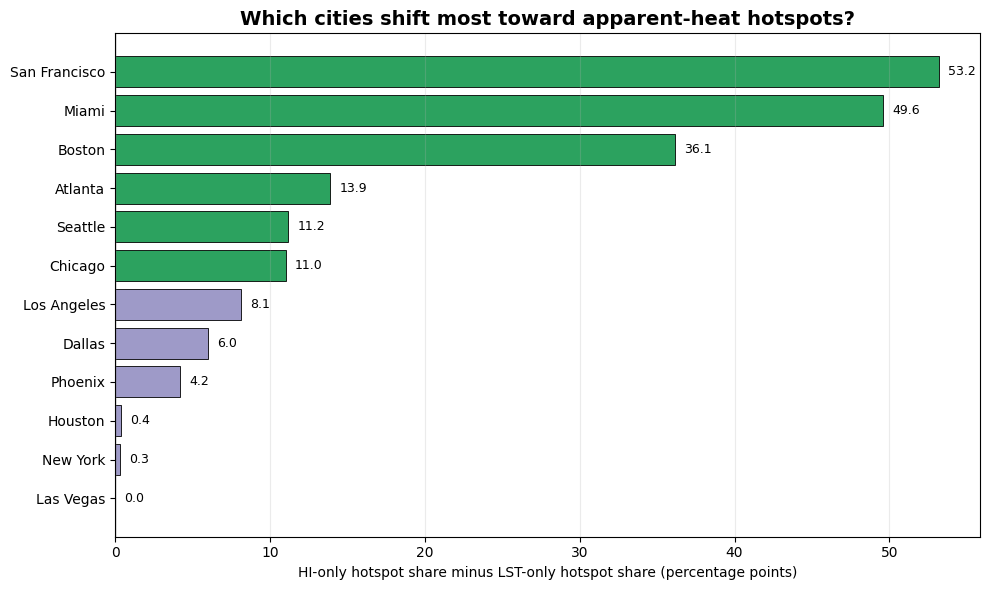

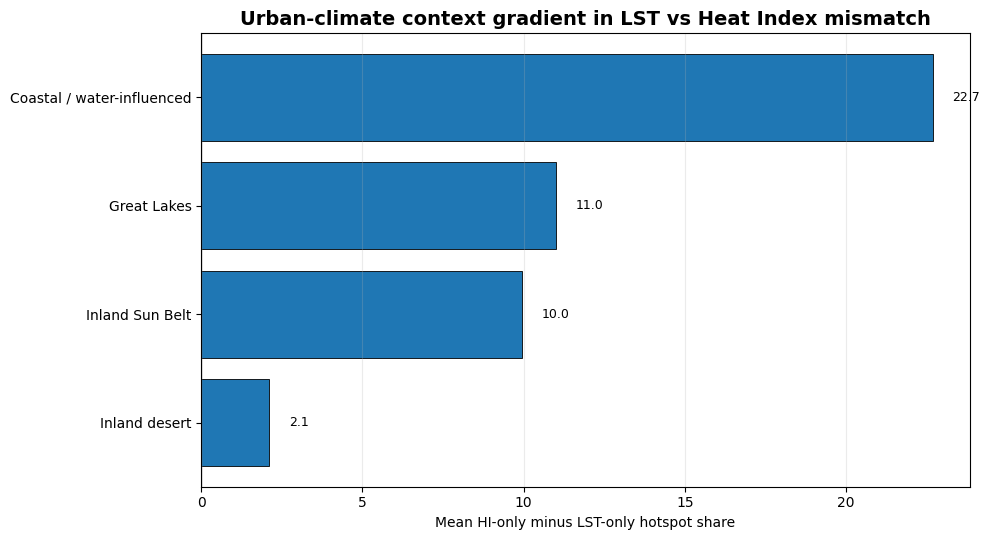


Saved story-mining outputs to:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_story_mining

Main files:
- /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_story_mining/01_rank_hi_shift.csv
- /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_story_mining/02_rank_lst_hi_coupling.csv
- /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_story_mining/03_rank_priority_tracts.csv
- /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_story_mining/04_broad_context_summary.csv
- /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_story_mining/05_pairwise_city_similarity.csv
- /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_story_mining/06_story_interpretation_notes.txt
- /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_story_

In [26]:
# ============================================================
# 12-city STORY MINING: find paper-level patterns
# No external data needed. Uses existing df if available.
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
OUTDIR = PROJECT / "outputs/pilot/alphaearth/twelve_city_story_mining"
OUTDIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 1. Load / standardize 12-city summary
# ------------------------------------------------------------
if "df" in globals() and isinstance(df, pd.DataFrame):
    story = df.copy()
else:
    candidates = [
        PROJECT / "outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv",
        PROJECT / "outputs/pilot/alphaearth/city_expansion_12city/step3_twelve_city_summary.csv",
        PROJECT / "outputs/pilot/alphaearth/city_expansion_12city/step2_new_6city_lst_hi_summary.csv",
    ]
    found = None
    for p in candidates:
        if p.exists():
            found = p
            break
    if found is None:
        raise FileNotFoundError("Could not find a 12-city summary CSV. Please run the previous 12-city summary cell first.")
    story = pd.read_csv(found)
    print("Loaded:", found)

# Clean column names
story.columns = [c.strip() for c in story.columns]

# Required columns check
required = [
    "city", "city_label", "city_context", "n_ready",
    "ready_pct", "mean_lst_c", "mean_hi_c", "lst_hi_corr",
    "both_pct", "lst_only_pct", "hi_only_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct", "mechanism_type"
]

missing = [c for c in required if c not in story.columns]
if missing:
    raise ValueError(f"Missing columns: {missing}\nAvailable columns: {list(story.columns)}")

num_cols = [
    "n_ready", "ready_pct", "mean_lst_c", "mean_hi_c", "lst_hi_corr",
    "both_pct", "lst_only_pct", "hi_only_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct"
]
for c in num_cols:
    story[c] = pd.to_numeric(story[c], errors="coerce")

story = story.sort_values("hi_minus_lst_hotspot_pct", ascending=False).reset_index(drop=True)

# ------------------------------------------------------------
# 2. Core ranking tables
# ------------------------------------------------------------
rank_hi_shift = story[
    ["city_label", "city_context", "mechanism_type", "ready_pct",
     "hi_only_pct", "lst_only_pct", "both_pct",
     "hi_minus_lst_hotspot_pct", "priority_pct", "lst_hi_corr"]
].sort_values("hi_minus_lst_hotspot_pct", ascending=False)

rank_coupling = story[
    ["city_label", "city_context", "mechanism_type", "ready_pct",
     "lst_hi_corr", "both_pct", "hi_only_pct", "lst_only_pct", "priority_pct"]
].sort_values("lst_hi_corr", ascending=False)

rank_priority = story[
    ["city_label", "city_context", "mechanism_type", "ready_pct",
     "priority_pct", "hi_only_pct", "lst_only_pct", "both_pct",
     "hi_minus_lst_hotspot_pct"]
].sort_values("priority_pct", ascending=False)

rank_hi_shift.to_csv(OUTDIR / "01_rank_hi_shift.csv", index=False)
rank_coupling.to_csv(OUTDIR / "02_rank_lst_hi_coupling.csv", index=False)
rank_priority.to_csv(OUTDIR / "03_rank_priority_tracts.csv", index=False)

print("\nTOP HI-SHIFT CITIES:")
display(rank_hi_shift.head(8))

print("\nTOP LST-HI COUPLING CITIES:")
display(rank_coupling.head(8))

print("\nTOP PRIORITY-TRACT CITIES:")
display(rank_priority.head(8))

# ------------------------------------------------------------
# 3. City-context group summary
# ------------------------------------------------------------
def broad_context(x):
    x = str(x).lower()
    if "coastal" in x or "bay" in x or "pacific" in x:
        return "Coastal / water-influenced"
    if "desert" in x:
        return "Inland desert"
    if "sun belt" in x:
        return "Inland Sun Belt"
    if "great lakes" in x:
        return "Great Lakes"
    return "Other / mixed"

story["broad_context"] = story["city_context"].apply(broad_context)

group_summary = (
    story.groupby("broad_context")
    .agg(
        n_cities=("city_label", "count"),
        mean_ready_pct=("ready_pct", "mean"),
        mean_hi_only_pct=("hi_only_pct", "mean"),
        mean_lst_only_pct=("lst_only_pct", "mean"),
        mean_both_pct=("both_pct", "mean"),
        mean_hi_minus_lst=("hi_minus_lst_hotspot_pct", "mean"),
        mean_priority_pct=("priority_pct", "mean"),
        mean_lst_hi_corr=("lst_hi_corr", "mean"),
    )
    .reset_index()
    .sort_values("mean_hi_minus_lst", ascending=False)
)

group_summary.to_csv(OUTDIR / "04_broad_context_summary.csv", index=False)

print("\nBROAD CONTEXT SUMMARY:")
display(group_summary)

# ------------------------------------------------------------
# 4. Pairwise similarity table
# ------------------------------------------------------------
metrics = [
    "mean_lst_c", "mean_hi_c", "lst_hi_corr",
    "both_pct", "lst_only_pct", "hi_only_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct"
]

X = story[metrics].apply(pd.to_numeric, errors="coerce")
X = X.fillna(X.mean())
Xz = (X - X.mean()) / X.std(ddof=0)
Xz = Xz.replace([np.inf, -np.inf], 0).fillna(0)

pairs = []
for i, j in combinations(range(len(story)), 2):
    dist = float(np.sqrt(((Xz.iloc[i] - Xz.iloc[j]) ** 2).sum()))
    pairs.append({
        "city_1": story.loc[i, "city_label"],
        "city_2": story.loc[j, "city_label"],
        "context_1": story.loc[i, "city_context"],
        "context_2": story.loc[j, "city_context"],
        "mechanism_1": story.loc[i, "mechanism_type"],
        "mechanism_2": story.loc[j, "mechanism_type"],
        "signature_distance": dist,
        "similarity_score": 1 / (1 + dist),
    })

pairs = pd.DataFrame(pairs).sort_values("signature_distance")
pairs.to_csv(OUTDIR / "05_pairwise_city_similarity.csv", index=False)

print("\nMOST SIMILAR CITY PAIRS:")
display(pairs.head(12))

print("\nMOST DIFFERENT CITY PAIRS:")
display(pairs.tail(12).sort_values("signature_distance", ascending=False))

# ------------------------------------------------------------
# 5. Make two simple but useful story figures
# ------------------------------------------------------------
# Fig A: ranked HI shift
fig, ax = plt.subplots(figsize=(10, 6))
plot_df = rank_hi_shift.sort_values("hi_minus_lst_hotspot_pct", ascending=True)

colors = [
    "#2ca25f" if v >= 10 else "#9e9ac8"
    for v in plot_df["hi_minus_lst_hotspot_pct"]
]

ax.barh(plot_df["city_label"], plot_df["hi_minus_lst_hotspot_pct"], color=colors, edgecolor="black", linewidth=0.6)
ax.axvline(0, color="gray", linewidth=1)
ax.set_xlabel("HI-only hotspot share minus LST-only hotspot share (percentage points)")
ax.set_title("Which cities shift most toward apparent-heat hotspots?", fontsize=14, fontweight="bold")

for y, val in enumerate(plot_df["hi_minus_lst_hotspot_pct"]):
    ax.text(val + 0.6, y, f"{val:.1f}", va="center", fontsize=9)

ax.grid(axis="x", alpha=0.25)
fig.tight_layout()
fig.savefig(OUTDIR / "FIG_story_rank_hi_shift.png", dpi=350, bbox_inches="tight")
plt.show()

# Fig B: context summary
fig, ax = plt.subplots(figsize=(10, 5.5))
gdf = group_summary.sort_values("mean_hi_minus_lst", ascending=True)

ax.barh(gdf["broad_context"], gdf["mean_hi_minus_lst"], edgecolor="black", linewidth=0.6)
ax.axvline(0, color="gray", linewidth=1)
ax.set_xlabel("Mean HI-only minus LST-only hotspot share")
ax.set_title("Urban-climate context gradient in LST vs Heat Index mismatch", fontsize=14, fontweight="bold")

for y, val in enumerate(gdf["mean_hi_minus_lst"]):
    ax.text(val + 0.6, y, f"{val:.1f}", va="center", fontsize=9)

ax.grid(axis="x", alpha=0.25)
fig.tight_layout()
fig.savefig(OUTDIR / "FIG_story_context_gradient.png", dpi=350, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------
# 6. Auto-generate interpretation notes
# ------------------------------------------------------------
top_hi = rank_hi_shift.head(4)["city_label"].tolist()
low_hi = rank_hi_shift.tail(4)["city_label"].tolist()
top_coupled = rank_coupling.head(3)["city_label"].tolist()
top_priority = rank_priority.head(4)["city_label"].tolist()
similar_pairs = pairs.head(6)[["city_1", "city_2", "signature_distance"]]

notes = []
notes.append("Twelve-city story mining notes")
notes.append("=" * 34)
notes.append("")
notes.append("Potential paper storyline:")
notes.append(
    "Across 12 U.S. cities, LST and Heat Index do not identify the same urban heat-risk geographies. "
    "The mismatch is not random: it varies systematically by coastal influence, humidity, desert setting, and urban form."
)
notes.append("")
notes.append("Strongest HI-shift cities:")
notes.append(", ".join(top_hi))
notes.append("")
notes.append("Lowest HI-shift / more balanced cities:")
notes.append(", ".join(low_hi))
notes.append("")
notes.append("Most coupled LST-HI cities:")
notes.append(", ".join(top_coupled))
notes.append("")
notes.append("Highest priority-tract cities:")
notes.append(", ".join(top_priority))
notes.append("")
notes.append("Most similar city pairs:")
for _, r in similar_pairs.iterrows():
    notes.append(f"- {r['city_1']} + {r['city_2']} | distance={r['signature_distance']:.2f}")
notes.append("")
notes.append("Important caution:")
notes.append(
    "Cities with lower ready_pct, especially San Francisco and New York if applicable, should be interpreted carefully. "
    "They can still reveal useful patterns, but the paper should report completeness and avoid overstating them."
)

notes_path = OUTDIR / "06_story_interpretation_notes.txt"
notes_path.write_text("\n".join(notes), encoding="utf-8")

print("\nSaved story-mining outputs to:")
print(OUTDIR)
print("\nMain files:")
for p in [
    "01_rank_hi_shift.csv",
    "02_rank_lst_hi_coupling.csv",
    "03_rank_priority_tracts.csv",
    "04_broad_context_summary.csv",
    "05_pairwise_city_similarity.csv",
    "06_story_interpretation_notes.txt",
    "FIG_story_rank_hi_shift.png",
    "FIG_story_context_gradient.png",
]:
    print("-", OUTDIR / p)

In [28]:
# ============================================================
# FIXED: 12-city deep relationship mining
# 不强制要求 mean_lst_c / mean_hi_c
# 重点：从 12 个城市里挖论文故事、城市关系、相似/差异机制
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np

pd.set_option("display.max_columns", 80)
pd.set_option("display.width", 180)
pd.set_option("display.max_colwidth", 60)

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")

OUTDIR = PROJECT / "outputs/pilot/alphaearth/twelve_city_deep_relationships"
OUTDIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 1. 找最合适的 12-city summary 表
# ------------------------------------------------------------
candidate_files = [
    PROJECT / "outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv",
    PROJECT / "outputs/pilot/alphaearth/city_expansion_12city/step3_twelve_city_summary.csv",
    PROJECT / "outputs/pilot/alphaearth/twelve_city_story_mining/01_rank_hi_shift.csv",
    PROJECT / "outputs/pilot/alphaearth/twelve_city_story_mining/01_city_story_groups.csv",
]

existing = [p for p in candidate_files if p.exists()]
if not existing:
    raise FileNotFoundError("No 12-city summary CSV found. Check the output folders.")

def standardize_columns(d):
    d = d.copy()
    d.columns = [c.strip() for c in d.columns]

    rename = {
        "city": "city_id",
        "hi_minus_lst": "hi_minus_lst_hotspot_pct",
        "mean_hi_minus_lst": "mean_hi_minus_lst",
        "mean_priority_pct": "priority_pct",
        "priority_tract_pct": "priority_pct",
        "lst_hi_correlation": "lst_hi_corr",
        "corr_lst_hi": "lst_hi_corr",
        "both": "both_pct",
        "hi_only": "hi_only_pct",
        "lst_only": "lst_only_pct",
    }
    d = d.rename(columns={k: v for k, v in rename.items() if k in d.columns})

    if "city_label" not in d.columns:
        if "city_id" in d.columns:
            d["city_label"] = (
                d["city_id"].astype(str)
                .str.replace("_", " ", regex=False)
                .str.title()
            )
        elif "city" in d.columns:
            d["city_label"] = (
                d["city"].astype(str)
                .str.replace("_", " ", regex=False)
                .str.title()
            )

    return d

tables = []
for p in existing:
    try:
        temp = pd.read_csv(p)
        temp = standardize_columns(temp)
        if "city_label" in temp.columns:
            ncity = temp["city_label"].nunique()
            useful_cols = [
                "city_context", "mechanism_type", "ready_pct",
                "hi_only_pct", "lst_only_pct", "both_pct",
                "hi_minus_lst_hotspot_pct", "priority_pct", "lst_hi_corr",
                "mean_lst_c", "mean_hi_c"
            ]
            score = ncity * 10 + sum(c in temp.columns for c in useful_cols)
            tables.append((score, ncity, p, temp))
    except Exception as e:
        print("Skipped:", p, "|", e)

if not tables:
    raise ValueError("Found CSVs, but none looked like a city-level summary table.")

tables = sorted(tables, key=lambda x: x[0], reverse=True)
score, ncity, summary_path, df = tables[0]

print("Using summary file:")
print(summary_path)
print("Number of cities:", ncity)
print("Columns:")
print(list(df.columns))

# 只保留 city-level rows
df = df.copy()
df["city_label"] = df["city_label"].astype(str)

# 如果有重复城市，保留信息最多的一行
df["_nonmissing_count"] = df.notna().sum(axis=1)
df = (
    df.sort_values("_nonmissing_count", ascending=False)
      .drop_duplicates("city_label", keep="first")
      .drop(columns=["_nonmissing_count"])
      .reset_index(drop=True)
)

# ------------------------------------------------------------
# 2. 检查核心列，不再强制 mean_lst_c / mean_hi_c
# ------------------------------------------------------------
required = [
    "city_label", "city_context", "mechanism_type",
    "ready_pct", "hi_only_pct", "lst_only_pct", "both_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct", "lst_hi_corr"
]

missing = [c for c in required if c not in df.columns]
if missing:
    raise ValueError(
        f"Still missing required columns: {missing}\n"
        f"Available columns: {list(df.columns)}"
    )

num_cols = [
    "ready_pct", "hi_only_pct", "lst_only_pct", "both_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct", "lst_hi_corr",
    "mean_lst_c", "mean_hi_c", "mean_hi_minus_lst",
    "neither_pct", "missing_pct"
]

for c in num_cols:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# ------------------------------------------------------------
# 3. 给城市做更有论文意义的分组
# ------------------------------------------------------------
def broad_context(x):
    x = str(x).lower()

    if "great lakes" in x:
        return "Great Lakes"
    if "desert" in x:
        return "Inland desert"
    if "sun belt" in x or "inland / humid" in x or "car-oriented" in x:
        return "Inland Sun Belt"
    if "coastal" in x or "pacific" in x or "water" in x or "bay" in x:
        return "Coastal / water-influenced"
    return "Other / transitional"

def story_group(row):
    gap = row["hi_minus_lst_hotspot_pct"]
    corr = row["lst_hi_corr"]

    if pd.isna(gap):
        return "Needs review"
    if gap >= 25:
        return "Strong apparent-heat shift"
    if gap >= 8:
        return "Moderate apparent-heat shift"
    if abs(gap) <= 6 and corr >= 0.45:
        return "Coupled / aligned"
    if abs(gap) <= 6:
        return "Mixed / transitional"
    if gap < -6:
        return "Surface-heat shift"
    return "Mixed / transitional"

def reliability_flag(row):
    ready = row["ready_pct"]
    if pd.isna(ready):
        return "Unknown completeness"
    if ready < 85:
        return "Use cautiously: lower data readiness"
    if ready < 95:
        return "Moderate completeness"
    return "High completeness"

def paper_role(row):
    group = row["story_group"]
    city = row["city_label"]

    if group == "Strong apparent-heat shift":
        return "Key apparent-heat case"
    if group == "Moderate apparent-heat shift":
        return "Intermediate apparent-heat case"
    if group == "Coupled / aligned":
        return "Coupled baseline case"
    if group == "Mixed / transitional":
        return "Transition case"
    return "Supplementary case"

df["broad_context"] = df["city_context"].apply(broad_context)
df["story_group"] = df.apply(story_group, axis=1)
df["reliability_flag"] = df.apply(reliability_flag, axis=1)
df["paper_role"] = df.apply(paper_role, axis=1)

# 排序：先看 apparent heat shift 最强的城市
df = df.sort_values("hi_minus_lst_hotspot_pct", ascending=False).reset_index(drop=True)

city_story_cols = [
    "city_label", "city_context", "broad_context",
    "mechanism_type", "story_group", "paper_role", "reliability_flag",
    "ready_pct", "hi_only_pct", "lst_only_pct", "both_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct", "lst_hi_corr"
]

city_story = df[city_story_cols].copy()
city_story.to_csv(OUTDIR / "01_city_deep_story_table.csv", index=False)

print("\n================ CITY DEEP STORY TABLE ================")
display(city_story)

# ------------------------------------------------------------
# 4. Context gradient：这就是论文最核心的关系之一
# ------------------------------------------------------------
context_summary = (
    df.groupby("broad_context")
      .agg(
          n_cities=("city_label", "count"),
          cities=("city_label", lambda x: ", ".join(x)),
          mean_hi_minus_lst=("hi_minus_lst_hotspot_pct", "mean"),
          mean_hi_only_pct=("hi_only_pct", "mean"),
          mean_lst_only_pct=("lst_only_pct", "mean"),
          mean_both_pct=("both_pct", "mean"),
          mean_priority_pct=("priority_pct", "mean"),
          mean_corr=("lst_hi_corr", "mean"),
          mean_ready_pct=("ready_pct", "mean"),
      )
      .reset_index()
      .sort_values("mean_hi_minus_lst", ascending=False)
)

context_summary.to_csv(OUTDIR / "02_context_gradient_summary.csv", index=False)

print("\n================ CONTEXT GRADIENT SUMMARY ================")
display(context_summary)

# ------------------------------------------------------------
# 5. 相似城市 / 差异城市：用已有指标做 signature distance
# ------------------------------------------------------------
feature_candidates = [
    "hi_only_pct",
    "lst_only_pct",
    "both_pct",
    "hi_minus_lst_hotspot_pct",
    "priority_pct",
    "lst_hi_corr",
    "ready_pct",
    "mean_lst_c",
    "mean_hi_c",
    "mean_hi_minus_lst",
]

features = [c for c in feature_candidates if c in df.columns]
print("\nFeatures used for city signature distance:")
print(features)

X = df[features].copy()
X = X.apply(pd.to_numeric, errors="coerce")
X = X.fillna(X.mean(numeric_only=True))

std = X.std(ddof=0).replace(0, 1)
Z = (X - X.mean()) / std
Z = Z.replace([np.inf, -np.inf], 0).fillna(0)

pairs = []
for i in range(len(df)):
    for j in range(i + 1, len(df)):
        dist = float(np.sqrt(((Z.iloc[i] - Z.iloc[j]) ** 2).sum()))
        sim = float(1 / (1 + dist))
        pairs.append({
            "city_1": df.loc[i, "city_label"],
            "city_2": df.loc[j, "city_label"],
            "context_1": df.loc[i, "broad_context"],
            "context_2": df.loc[j, "broad_context"],
            "story_1": df.loc[i, "story_group"],
            "story_2": df.loc[j, "story_group"],
            "gap_1": df.loc[i, "hi_minus_lst_hotspot_pct"],
            "gap_2": df.loc[j, "hi_minus_lst_hotspot_pct"],
            "corr_1": df.loc[i, "lst_hi_corr"],
            "corr_2": df.loc[j, "lst_hi_corr"],
            "signature_distance": dist,
            "similarity_score": sim,
        })

pairs = pd.DataFrame(pairs)
pairs_sorted = pairs.sort_values("signature_distance").reset_index(drop=True)
pairs_sorted.to_csv(OUTDIR / "03_city_similarity_pairs.csv", index=False)

print("\n================ MOST SIMILAR CITY PAIRS ================")
display(pairs_sorted.head(12))

print("\n================ MOST DIFFERENT CITY PAIRS ================")
display(pairs_sorted.tail(12).sort_values("signature_distance", ascending=False))

# ------------------------------------------------------------
# 6. 自动生成 paper storyline notes
# ------------------------------------------------------------
top_hi = df.sort_values("hi_minus_lst_hotspot_pct", ascending=False).head(5)
top_coupled = df.sort_values("lst_hi_corr", ascending=False).head(5)
top_priority = df.sort_values("priority_pct", ascending=False).head(5)
low_ready = df[df["ready_pct"] < 90].sort_values("ready_pct")

lines = []
lines.append("# Twelve-city deep relationship notes")
lines.append("")
lines.append("## Main paper direction")
lines.append(
    "The 12-city comparison suggests that LST and Heat Index do not identify identical hotspot geographies. "
    "The mismatch is structured by urban-climate context, with water-influenced/coastal cities showing stronger apparent-heat hotspot shifts, "
    "while desert and transitional cities show more coupled or mixed LST-HI patterns."
)
lines.append("")

lines.append("## Claim 1: apparent heat shift is strongest in selected coastal/water-influenced cities")
for _, r in top_hi.iterrows():
    lines.append(
        f"- {r['city_label']}: HI-only {r['hi_only_pct']:.1f}%, "
        f"LST-only {r['lst_only_pct']:.1f}%, "
        f"HI-LST gap {r['hi_minus_lst_hotspot_pct']:.1f} percentage points, "
        f"context = {r['city_context']}."
    )

lines.append("")
lines.append("## Claim 2: LST-HI coupling identifies a different kind of city")
for _, r in top_coupled.iterrows():
    lines.append(
        f"- {r['city_label']}: LST-HI correlation {r['lst_hi_corr']:.2f}, "
        f"gap {r['hi_minus_lst_hotspot_pct']:.1f} pp, "
        f"mechanism = {r['mechanism_type']}."
    )

lines.append("")
lines.append("## Claim 3: priority areas are not evenly distributed across city types")
for _, r in top_priority.iterrows():
    lines.append(
        f"- {r['city_label']}: priority tracts {r['priority_pct']:.1f}%, "
        f"HI-only {r['hi_only_pct']:.1f}%, LST-only {r['lst_only_pct']:.1f}%."
    )

lines.append("")
lines.append("## Claim 4: context-gradient pattern")
for _, r in context_summary.iterrows():
    lines.append(
        f"- {r['broad_context']}: mean HI-LST gap {r['mean_hi_minus_lst']:.1f} pp "
        f"across {int(r['n_cities'])} cities ({r['cities']})."
    )

lines.append("")
lines.append("## Claim 5: similar cities are not always geographically adjacent")
for _, r in pairs_sorted.head(8).iterrows():
    lines.append(
        f"- {r['city_1']} and {r['city_2']}: similarity {r['similarity_score']:.2f}; "
        f"contexts = {r['context_1']} vs {r['context_2']}; "
        f"stories = {r['story_1']} vs {r['story_2']}."
    )

lines.append("")
lines.append("## Data-readiness caution")
if len(low_ready) > 0:
    for _, r in low_ready.iterrows():
        lines.append(
            f"- {r['city_label']} has lower readiness ({r['ready_pct']:.1f}%), "
            f"so interpretation should be cautious."
        )
else:
    lines.append("- All cities have high readiness.")

lines.append("")
lines.append("## Strongest current paper storyline")
lines.append(
    "A strong paper framing is: surface temperature and apparent heat reveal different urban heat-risk mechanisms. "
    "Across 12 cities, apparent-heat hotspots are especially prominent in coastal/water-influenced cities, "
    "while some inland/desert cities show stronger LST-HI coupling. "
    "This suggests that relying only on LST may miss humid or water-influenced heat-risk geographies."
)

notes_path = OUTDIR / "04_paper_storyline_notes.md"
notes_path.write_text("\n".join(lines), encoding="utf-8")

print("\n================ PAPER STORY CLAIMS ================")
print("\n".join(lines[:70]))

print("\nSaved outputs to:")
print(OUTDIR)
print("\nKey files:")
for name in [
    "01_city_deep_story_table.csv",
    "02_context_gradient_summary.csv",
    "03_city_similarity_pairs.csv",
    "04_paper_storyline_notes.md",
]:
    print("-", OUTDIR / name)

Using summary file:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv
Number of cities: 12
Columns:
['city_id', 'city_label', 'city_context', 'n_total', 'n_ready', 'ready_pct', 'mean_lst_c', 'mean_hi_c', 'mean_hi_minus_lst', 'lst_hi_corr', 'both_pct', 'lst_only_pct', 'hi_only_pct', 'hi_minus_lst_hotspot_pct', 'neither_pct', 'missing_pct', 'priority_pct', 'mechanism_type']

================ CITY DEEP STORY TABLE ================


,city_label,city_context,broad_context,mechanism_type,story_group,paper_role,reliability_flag,ready_pct,hi_only_pct,lst_only_pct,both_pct,hi_minus_lst_hotspot_pct,priority_pct,lst_hi_corr
0,San Francisco,Coastal / compact / bay-influenced,Coastal / water-influenced,Strong HI-dominant,Strong apparent-heat shift,Key apparent-heat case,Use cautiously: lower data readiness,72.307692,53.191489,0.000000,26.595745,53.191489,53.723404,0.276261
1,Miami,Coastal / humid,Coastal / water-influenced,Strong HI-dominant,Strong apparent-heat shift,Key apparent-heat case,High completeness,96.899225,52.000000,2.400000,23.200000,49.600000,52.000000,0.213787
2,Boston,Coastal / temperate,Coastal / water-influenced,Strong HI-dominant,Strong apparent-heat shift,Key apparent-heat case,Moderate completeness,92.270531,47.643979,11.518325,13.612565,36.125654,47.643979,0.000151
3,Atlanta,Inland / humid / sprawling Sun Belt,Inland Sun Belt,Moderate HI-dominant,Moderate apparent-heat shift,Intermediate apparent-heat case,High completeness,100.000000,32.286996,18.385650,6.726457,13.901345,33.632287,-0.268548
4,Seattle,Coastal / Pacific Northwest / water-constrained,Coastal / water-influenced,Moderate HI-dominant,Moderate apparent-heat shift,Intermediate apparent-heat case,Moderate completeness,94.472362,32.978723,21.808511,3.191489,11.170213,38.297872,-0.063721
5,Chicago,Great Lakes / large grid city,Great Lakes,Moderate HI-dominant,Moderate apparent-heat shift,Intermediate apparent-heat case,High completeness,100.000000,17.545872,6.536697,18.463303,11.009174,28.555046,0.631143
6,Los Angeles,Coastal / dry,Coastal / water-influenced,Moderate HI-dominant,Moderate apparent-heat shift,Intermediate apparent-heat case,High completeness,97.472924,25.925926,17.777778,7.222222,8.148148,32.407407,0.350232
7,Dallas,Inland / large Sun Belt / car-oriented,Inland Sun Belt,Mixed / transitional,Mixed / transitional,Transition case,High completeness,100.000000,18.708241,12.694878,12.472160,6.013363,29.398664,0.108741
8,Phoenix,Inland / desert,Inland desert,Mixed / transitional,Mixed / transitional,Transition case,High completeness,100.000000,18.373494,14.156627,10.843373,4.216867,31.927711,0.291281
9,Houston,Coastal / humid,Coastal / water-influenced,Mixed / transitional,Mixed / transitional,Transition case,High completeness,100.000000,16.211293,15.846995,9.289617,0.364299,28.051002,0.341275



================ CONTEXT GRADIENT SUMMARY ================


,broad_context,n_cities,cities,mean_hi_minus_lst,mean_hi_only_pct,mean_lst_only_pct,mean_both_pct,mean_priority_pct,mean_corr,mean_ready_pct
0,Coastal / water-influenced,7,"San Francisco, Miami, Boston, Seattle, Los Angeles, Hous...",22.705007,35.355949,12.650941,12.700951,39.951711,0.167327,91.672894
1,Great Lakes,1,Chicago,11.009174,17.545872,6.536697,18.463303,28.555046,0.631143,100.000000
2,Inland Sun Belt,2,"Atlanta, Dallas",9.957354,25.497618,15.540264,9.599309,31.515475,-0.079903,100.000000
3,Inland desert,2,"Phoenix, Las Vegas",2.108434,13.662730,11.554296,13.500289,29.064292,0.520743,100.000000



Features used for city signature distance:
['hi_only_pct', 'lst_only_pct', 'both_pct', 'hi_minus_lst_hotspot_pct', 'priority_pct', 'lst_hi_corr', 'ready_pct', 'mean_lst_c', 'mean_hi_c', 'mean_hi_minus_lst']

================ MOST SIMILAR CITY PAIRS ================


,city_1,city_2,context_1,context_2,story_1,story_2,gap_1,gap_2,corr_1,corr_2,signature_distance,similarity_score
0,Atlanta,Seattle,Inland Sun Belt,Coastal / water-influenced,Moderate apparent-heat shift,Moderate apparent-heat shift,13.901345,11.170213,-0.268548,-0.063721,1.859363,0.349728
1,Seattle,New York,Coastal / water-influenced,Coastal / water-influenced,Moderate apparent-heat shift,Mixed / transitional,11.170213,0.335249,-0.063721,0.053302,2.053882,0.327452
2,Dallas,Houston,Inland Sun Belt,Coastal / water-influenced,Mixed / transitional,Mixed / transitional,6.013363,0.364299,0.108741,0.341275,2.117108,0.320810
3,Houston,Las Vegas,Coastal / water-influenced,Inland desert,Mixed / transitional,Coupled / aligned,0.364299,0.000000,0.341275,0.750205,2.246761,0.307999
4,Phoenix,Houston,Inland desert,Coastal / water-influenced,Mixed / transitional,Mixed / transitional,4.216867,0.364299,0.291281,0.341275,2.257407,0.306993
5,Atlanta,New York,Inland Sun Belt,Coastal / water-influenced,Moderate apparent-heat shift,Mixed / transitional,13.901345,0.335249,-0.268548,0.053302,2.403474,0.293817
6,Los Angeles,Houston,Coastal / water-influenced,Coastal / water-influenced,Moderate apparent-heat shift,Mixed / transitional,8.148148,0.364299,0.350232,0.341275,2.492160,0.286356
7,Los Angeles,New York,Coastal / water-influenced,Coastal / water-influenced,Moderate apparent-heat shift,Mixed / transitional,8.148148,0.335249,0.350232,0.053302,2.514322,0.284550
8,Atlanta,Dallas,Inland Sun Belt,Inland Sun Belt,Moderate apparent-heat shift,Mixed / transitional,13.901345,6.013363,-0.268548,0.108741,2.590283,0.278530
9,Chicago,Las Vegas,Great Lakes,Inland desert,Moderate apparent-heat shift,Coupled / aligned,11.009174,0.000000,0.631143,0.750205,2.590834,0.278487



================ MOST DIFFERENT CITY PAIRS ================


,city_1,city_2,context_1,context_2,story_1,story_2,gap_1,gap_2,corr_1,corr_2,signature_distance,similarity_score
65,San Francisco,Phoenix,Coastal / water-influenced,Inland desert,Strong apparent-heat shift,Mixed / transitional,53.191489,4.216867,0.276261,0.291281,8.082642,0.110100
64,San Francisco,Houston,Coastal / water-influenced,Coastal / water-influenced,Strong apparent-heat shift,Mixed / transitional,53.191489,0.364299,0.276261,0.341275,7.825235,0.113311
63,San Francisco,Las Vegas,Coastal / water-influenced,Inland desert,Strong apparent-heat shift,Coupled / aligned,53.191489,0.000000,0.276261,0.750205,7.585990,0.116469
62,San Francisco,Dallas,Coastal / water-influenced,Inland Sun Belt,Strong apparent-heat shift,Mixed / transitional,53.191489,6.013363,0.276261,0.108741,7.092487,0.123571
61,San Francisco,Atlanta,Coastal / water-influenced,Inland Sun Belt,Strong apparent-heat shift,Moderate apparent-heat shift,53.191489,13.901345,0.276261,-0.268548,6.878959,0.126920
60,San Francisco,New York,Coastal / water-influenced,Coastal / water-influenced,Strong apparent-heat shift,Mixed / transitional,53.191489,0.335249,0.276261,0.053302,6.749856,0.129035
59,Miami,Phoenix,Coastal / water-influenced,Inland desert,Strong apparent-heat shift,Mixed / transitional,49.600000,4.216867,0.213787,0.291281,6.679387,0.130219
58,San Francisco,Los Angeles,Coastal / water-influenced,Coastal / water-influenced,Strong apparent-heat shift,Moderate apparent-heat shift,53.191489,8.148148,0.276261,0.350232,6.665887,0.130448
57,San Francisco,Seattle,Coastal / water-influenced,Coastal / water-influenced,Strong apparent-heat shift,Moderate apparent-heat shift,53.191489,11.170213,0.276261,-0.063721,6.529658,0.132808
56,Miami,New York,Coastal / water-influenced,Coastal / water-influenced,Strong apparent-heat shift,Mixed / transitional,49.600000,0.335249,0.213787,0.053302,6.140055,0.140055



================ PAPER STORY CLAIMS ================
# Twelve-city deep relationship notes

## Main paper direction
The 12-city comparison suggests that LST and Heat Index do not identify identical hotspot geographies. The mismatch is structured by urban-climate context, with water-influenced/coastal cities showing stronger apparent-heat hotspot shifts, while desert and transitional cities show more coupled or mixed LST-HI patterns.

## Claim 1: apparent heat shift is strongest in selected coastal/water-influenced cities
- San Francisco: HI-only 53.2%, LST-only 0.0%, HI-LST gap 53.2 percentage points, context = Coastal / compact / bay-influenced.
- Miami: HI-only 52.0%, LST-only 2.4%, HI-LST gap 49.6 percentage points, context = Coastal / humid.
- Boston: HI-only 47.6%, LST-only 11.5%, HI-LST gap 36.1 percentage points, context = Coastal / temperate.
- Atlanta: HI-only 32.3%, LST-only 18.4%, HI-LST gap 13.9 percentage points, context = Inland / humid / sprawling Sun Belt.
- Seattle: H

In [29]:
# ============================================================
# STEP: 12-city paper-story robustness + hypothesis checks
# 目的：
# 1. 看 coastal/water-influenced 结论是不是稳定
# 2. 看 San Francisco / Miami 是否单独拉高结果
# 3. 输出可以写进论文的 claim candidates
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np

pd.set_option("display.max_columns", 100)
pd.set_option("display.width", 180)
pd.set_option("display.max_colwidth", 80)

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")

SUMMARY_PATH = PROJECT / "outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv"
OUTDIR = PROJECT / "outputs/pilot/alphaearth/twelve_city_paper_robustness"
OUTDIR.mkdir(parents=True, exist_ok=True)

if not SUMMARY_PATH.exists():
    raise FileNotFoundError(f"Cannot find summary file: {SUMMARY_PATH}")

df = pd.read_csv(SUMMARY_PATH)
df.columns = [c.strip() for c in df.columns]

print("Loaded:", SUMMARY_PATH)
print("Rows:", len(df))
print("Columns:", list(df.columns))

# ------------------------------------------------------------
# Standardize required columns
# ------------------------------------------------------------
rename = {
    "hi_minus_lst": "hi_minus_lst_hotspot_pct",
    "mean_hi_minus_lst": "mean_hi_minus_lst",
    "priority_tract_pct": "priority_pct",
    "corr_lst_hi": "lst_hi_corr",
}

df = df.rename(columns={k: v for k, v in rename.items() if k in df.columns})

if "hi_minus_lst_hotspot_pct" not in df.columns:
    df["hi_minus_lst_hotspot_pct"] = df["hi_only_pct"] - df["lst_only_pct"]

def broad_context(x):
    x = str(x).lower()
    if "great lakes" in x:
        return "Great Lakes"
    if "desert" in x:
        return "Inland desert"
    if "sun belt" in x or "car-oriented" in x or "inland / humid" in x:
        return "Inland Sun Belt"
    if "coastal" in x or "water" in x or "pacific" in x or "bay" in x:
        return "Coastal / water-influenced"
    return "Other / transitional"

df["broad_context"] = df["city_context"].apply(broad_context)

numeric_cols = [
    "ready_pct", "mean_lst_c", "mean_hi_c", "mean_hi_minus_lst",
    "lst_hi_corr", "both_pct", "hi_only_pct", "lst_only_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct"
]

for c in numeric_cols:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# Derived metrics
df["total_detected_hotspot_pct"] = df["both_pct"] + df["hi_only_pct"] + df["lst_only_pct"]
df["mismatch_pct"] = df["hi_only_pct"] + df["lst_only_pct"]
df["hi_dominance_ratio"] = (df["hi_only_pct"] + df["both_pct"]) / (df["lst_only_pct"] + df["both_pct"] + 1e-9)

def story_group(row):
    gap = row["hi_minus_lst_hotspot_pct"]
    corr = row["lst_hi_corr"]

    if gap >= 25:
        return "Strong HI-shift"
    elif gap >= 8:
        return "Moderate HI-shift"
    elif abs(gap) <= 6 and corr >= 0.45:
        return "Coupled LST-HI"
    elif abs(gap) <= 6:
        return "Mixed / transitional"
    else:
        return "LST-shift"

df["story_group"] = df.apply(story_group, axis=1)

# ------------------------------------------------------------
# 1. Core city ranking
# ------------------------------------------------------------
rank_cols = [
    "city_label", "city_context", "broad_context", "mechanism_type", "story_group",
    "ready_pct", "mean_lst_c", "mean_hi_c", "lst_hi_corr",
    "hi_only_pct", "lst_only_pct", "both_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct",
    "total_detected_hotspot_pct", "mismatch_pct", "hi_dominance_ratio"
]

rank_cols = [c for c in rank_cols if c in df.columns]

city_rank = (
    df[rank_cols]
    .sort_values("hi_minus_lst_hotspot_pct", ascending=False)
    .reset_index(drop=True)
)

city_rank.to_csv(OUTDIR / "01_city_rank_extended_metrics.csv", index=False)

print("\n================ 1. EXTENDED CITY RANKING ================")
display(city_rank)

# ------------------------------------------------------------
# 2. Context-level pattern
# ------------------------------------------------------------
context_summary = (
    df.groupby("broad_context")
      .agg(
          n_cities=("city_label", "count"),
          cities=("city_label", lambda x: ", ".join(x)),
          mean_hi_shift=("hi_minus_lst_hotspot_pct", "mean"),
          median_hi_shift=("hi_minus_lst_hotspot_pct", "median"),
          mean_hi_only=("hi_only_pct", "mean"),
          mean_lst_only=("lst_only_pct", "mean"),
          mean_both=("both_pct", "mean"),
          mean_priority=("priority_pct", "mean"),
          mean_corr=("lst_hi_corr", "mean"),
          mean_ready=("ready_pct", "mean"),
      )
      .reset_index()
      .sort_values("mean_hi_shift", ascending=False)
)

context_summary.to_csv(OUTDIR / "02_context_pattern_summary.csv", index=False)

print("\n================ 2. CONTEXT PATTERN SUMMARY ================")
display(context_summary)

# ------------------------------------------------------------
# 3. Robustness: leave-one-out
# 每次去掉一个城市，看 coastal / water-influenced 的平均 HI shift 是否还高
# ------------------------------------------------------------
rows = []

for removed_city in df["city_label"]:
    temp = df[df["city_label"] != removed_city].copy()

    coastal = temp[temp["broad_context"] == "Coastal / water-influenced"]
    noncoastal = temp[temp["broad_context"] != "Coastal / water-influenced"]

    coastal_mean = coastal["hi_minus_lst_hotspot_pct"].mean()
    noncoastal_mean = noncoastal["hi_minus_lst_hotspot_pct"].mean()
    diff = coastal_mean - noncoastal_mean

    rows.append({
        "removed_city": removed_city,
        "coastal_mean_hi_shift_without_city": coastal_mean,
        "noncoastal_mean_hi_shift_without_city": noncoastal_mean,
        "difference_coastal_minus_noncoastal": diff,
        "still_positive": diff > 0,
    })

leave_one_out = pd.DataFrame(rows).sort_values("difference_coastal_minus_noncoastal")

leave_one_out.to_csv(OUTDIR / "03_leave_one_out_context_robustness.csv", index=False)

print("\n================ 3. LEAVE-ONE-OUT ROBUSTNESS ================")
display(leave_one_out)

# ------------------------------------------------------------
# 4. Permutation-style descriptive check
# 小样本，不当作正式显著性结论，只用来检查 pattern 是否随机
# ------------------------------------------------------------
rng = np.random.default_rng(2026)

observed_coastal = df[df["broad_context"] == "Coastal / water-influenced"]["hi_minus_lst_hotspot_pct"].mean()
observed_noncoastal = df[df["broad_context"] != "Coastal / water-influenced"]["hi_minus_lst_hotspot_pct"].mean()
observed_diff = observed_coastal - observed_noncoastal

labels = (df["broad_context"] == "Coastal / water-influenced").to_numpy()
values = df["hi_minus_lst_hotspot_pct"].to_numpy()

perm_diffs = []
for _ in range(10000):
    shuffled = rng.permutation(labels)
    a = values[shuffled].mean()
    b = values[~shuffled].mean()
    perm_diffs.append(a - b)

perm_diffs = np.array(perm_diffs)

p_one_sided = (np.sum(perm_diffs >= observed_diff) + 1) / (len(perm_diffs) + 1)

hypothesis_check = pd.DataFrame([
    {
        "hypothesis": "Coastal / water-influenced cities have larger HI-only shift than other cities",
        "observed_coastal_mean": observed_coastal,
        "observed_noncoastal_mean": observed_noncoastal,
        "observed_difference": observed_diff,
        "permutation_p_descriptive": p_one_sided,
        "interpretation": "Pattern is stronger than most random reassignments" if p_one_sided < 0.10 else "Pattern exists but should be framed cautiously",
    }
])

hypothesis_check.to_csv(OUTDIR / "04_hypothesis_check_coastal_shift.csv", index=False)

print("\n================ 4. DESCRIPTIVE HYPOTHESIS CHECK ================")
display(hypothesis_check)

# ------------------------------------------------------------
# 5. Correlation table: what explains HI shift?
# ------------------------------------------------------------
corr_features = [
    "hi_minus_lst_hotspot_pct",
    "mean_lst_c",
    "mean_hi_c",
    "mean_hi_minus_lst",
    "lst_hi_corr",
    "hi_only_pct",
    "lst_only_pct",
    "both_pct",
    "priority_pct",
    "total_detected_hotspot_pct",
    "mismatch_pct",
    "hi_dominance_ratio",
    "ready_pct",
]

corr_features = [c for c in corr_features if c in df.columns]

corr_table = (
    df[corr_features]
    .corr(method="spearman")
    ["hi_minus_lst_hotspot_pct"]
    .sort_values(ascending=False)
    .reset_index()
)

corr_table.columns = ["metric", "spearman_corr_with_HI_shift"]

corr_table.to_csv(OUTDIR / "05_correlates_of_hi_shift.csv", index=False)

print("\n================ 5. CORRELATES OF HI SHIFT ================")
display(corr_table)

# ------------------------------------------------------------
# 6. Pairwise contrast table: 找最适合论文讲故事的 city contrasts
# ------------------------------------------------------------
def get_city(city):
    return df[df["city_label"].str.lower() == city.lower()].iloc[0]

contrast_pairs = [
    ("San Francisco", "Phoenix"),
    ("San Francisco", "Las Vegas"),
    ("Miami", "Houston"),
    ("Miami", "Phoenix"),
    ("Boston", "New York"),
    ("Atlanta", "Dallas"),
    ("Seattle", "Los Angeles"),
    ("Chicago", "Las Vegas"),
    ("Los Angeles", "New York"),
]

contrast_rows = []
for a, b in contrast_pairs:
    if a in set(df["city_label"]) and b in set(df["city_label"]):
        r1 = get_city(a)
        r2 = get_city(b)
        contrast_rows.append({
            "city_A": a,
            "city_B": b,
            "context_A": r1["city_context"],
            "context_B": r2["city_context"],
            "story_A": r1["story_group"],
            "story_B": r2["story_group"],
            "HI_shift_A": r1["hi_minus_lst_hotspot_pct"],
            "HI_shift_B": r2["hi_minus_lst_hotspot_pct"],
            "difference_A_minus_B": r1["hi_minus_lst_hotspot_pct"] - r2["hi_minus_lst_hotspot_pct"],
            "why_this_pair_matters": (
                "Strong contrast in apparent-heat shift"
                if abs(r1["hi_minus_lst_hotspot_pct"] - r2["hi_minus_lst_hotspot_pct"]) >= 20
                else "Moderate contrast / useful comparison"
            )
        })

contrast_table = pd.DataFrame(contrast_rows)
contrast_table.to_csv(OUTDIR / "06_key_city_contrasts_for_paper.csv", index=False)

print("\n================ 6. KEY CITY CONTRASTS ================")
display(contrast_table)

# ------------------------------------------------------------
# 7. Generate paper-ready notes
# ------------------------------------------------------------
top_hi = city_rank.head(5)
stable = leave_one_out["still_positive"].all()
min_diff = leave_one_out["difference_coastal_minus_noncoastal"].min()
max_diff = leave_one_out["difference_coastal_minus_noncoastal"].max()

notes = []

notes.append("# Twelve-city paper robustness notes")
notes.append("")
notes.append("## Main finding")
notes.append(
    "Across the 12-city comparison, Heat Index and LST do not identify the same hotspot geographies. "
    "The strongest apparent-heat shifts occur in several coastal or water-influenced cities, while inland desert cities are more coupled or transitional."
)
notes.append("")

notes.append("## Evidence 1: strongest HI-shift cities")
for _, r in top_hi.iterrows():
    notes.append(
        f"- {r['city_label']}: HI-only = {r['hi_only_pct']:.1f}%, "
        f"LST-only = {r['lst_only_pct']:.1f}%, "
        f"HI-LST hotspot gap = {r['hi_minus_lst_hotspot_pct']:.1f} pp, "
        f"context = {r['city_context']}."
    )

notes.append("")
notes.append("## Evidence 2: context gradient")
for _, r in context_summary.iterrows():
    notes.append(
        f"- {r['broad_context']}: mean HI-LST hotspot gap = {r['mean_hi_shift']:.1f} pp "
        f"across {int(r['n_cities'])} cities: {r['cities']}."
    )

notes.append("")
notes.append("## Evidence 3: robustness")
notes.append(
    f"Leave-one-out test: after removing each city one at a time, "
    f"the coastal/water-influenced minus non-coastal HI-shift difference ranges from "
    f"{min_diff:.1f} to {max_diff:.1f} percentage points."
)
if stable:
    notes.append(
        "This means the context-gradient pattern is not driven by a single city."
    )
else:
    notes.append(
        "The pattern weakens when certain cities are removed, so it should be framed as a pilot pattern requiring more cities."
    )

notes.append("")
notes.append("## Evidence 4: most useful paper contrasts")
for _, r in contrast_table.sort_values("difference_A_minus_B", key=lambda s: abs(s), ascending=False).head(6).iterrows():
    notes.append(
        f"- {r['city_A']} vs {r['city_B']}: HI-shift difference = "
        f"{r['difference_A_minus_B']:.1f} pp. "
        f"{r['city_A']} = {r['story_A']}; {r['city_B']} = {r['story_B']}."
    )

notes.append("")
notes.append("## Suggested paper framing")
notes.append(
    "A strong framing is that LST-based urban heat mapping may under-detect apparent-heat risk in humid, coastal, or water-influenced cities. "
    "The paper can argue that multi-city comparison reveals city-type-specific mismatch mechanisms between surface heat and human-experienced heat."
)

notes.append("")
notes.append("## Caution")
notes.append(
    "Because this is currently a 12-city analysis, claims should be framed as comparative/descriptive evidence rather than causal proof. "
    "The next step should expand the city sample and test whether the coastal/water-influenced gradient remains stable."
)

notes_path = OUTDIR / "07_paper_robustness_notes.md"
notes_path.write_text("\n".join(notes), encoding="utf-8")

print("\n================ PAPER ROBUSTNESS NOTES ================")
print("\n".join(notes))

print("\nSaved all outputs to:")
print(OUTDIR)

Loaded: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv
Rows: 12
Columns: ['city', 'city_label', 'city_context', 'n_total', 'n_ready', 'ready_pct', 'mean_lst_c', 'mean_hi_c', 'mean_hi_minus_lst', 'lst_hi_corr', 'both_pct', 'lst_only_pct', 'hi_only_pct', 'hi_minus_lst_hotspot_pct', 'neither_pct', 'missing_pct', 'priority_pct', 'mechanism_type']

================ 1. EXTENDED CITY RANKING ================


,city_label,city_context,broad_context,mechanism_type,story_group,ready_pct,mean_lst_c,mean_hi_c,lst_hi_corr,hi_only_pct,lst_only_pct,both_pct,hi_minus_lst_hotspot_pct,priority_pct,total_detected_hotspot_pct,mismatch_pct,hi_dominance_ratio
0,San Francisco,Coastal / compact / bay-influenced,Coastal / water-influenced,Strong HI-dominant,Strong HI-shift,72.307692,27.964186,16.245935,0.276261,53.191489,0.000000,26.595745,53.191489,53.723404,79.787234,53.191489,3.000000
1,Miami,Coastal / humid,Coastal / water-influenced,Strong HI-dominant,Strong HI-shift,96.899225,35.489864,32.540311,0.213787,52.000000,2.400000,23.200000,49.600000,52.000000,77.600000,54.400000,2.937500
2,Boston,Coastal / temperate,Coastal / water-influenced,Strong HI-dominant,Strong HI-shift,92.270531,31.839817,20.890031,0.000151,47.643979,11.518325,13.612565,36.125654,47.643979,72.774869,59.162304,2.437500
3,Atlanta,Inland / humid / sprawling Sun Belt,Inland Sun Belt,Moderate HI-dominant,Moderate HI-shift,100.000000,33.105076,25.569346,-0.268548,32.286996,18.385650,6.726457,13.901345,33.632287,57.399103,50.672646,1.553571
4,Seattle,Coastal / Pacific Northwest / water-constrained,Coastal / water-influenced,Moderate HI-dominant,Moderate HI-shift,94.472362,28.004607,18.962716,-0.063721,32.978723,21.808511,3.191489,11.170213,38.297872,57.978723,54.787234,1.446809
5,Chicago,Great Lakes / large grid city,Great Lakes,Moderate HI-dominant,Moderate HI-shift,100.000000,33.529735,21.349920,0.631143,17.545872,6.536697,18.463303,11.009174,28.555046,42.545872,24.082569,1.440367
6,Los Angeles,Coastal / dry,Coastal / water-influenced,Moderate HI-dominant,Moderate HI-shift,97.472924,39.580158,22.316720,0.350232,25.925926,17.777778,7.222222,8.148148,32.407407,50.925926,43.703704,1.325926
7,Dallas,Inland / large Sun Belt / car-oriented,Inland Sun Belt,Mixed / transitional,LST-shift,100.000000,39.230191,33.109788,0.108741,18.708241,12.694878,12.472160,6.013363,29.398664,43.875278,31.403118,1.238938
8,Phoenix,Inland / desert,Inland desert,Mixed / transitional,Mixed / transitional,100.000000,57.057313,33.287954,0.291281,18.373494,14.156627,10.843373,4.216867,31.927711,43.373494,32.530120,1.168675
9,Houston,Coastal / humid,Coastal / water-influenced,Mixed / transitional,Mixed / transitional,100.000000,47.943522,34.154682,0.341275,16.211293,15.846995,9.289617,0.364299,28.051002,41.347905,32.058288,1.014493



================ 2. CONTEXT PATTERN SUMMARY ================


,broad_context,n_cities,cities,mean_hi_shift,median_hi_shift,mean_hi_only,mean_lst_only,mean_both,mean_priority,mean_corr,mean_ready
0,Coastal / water-influenced,7,"Houston, Los Angeles, Miami, Boston, New York, Seattle, San Francisco",22.705007,11.170213,35.355949,12.650941,12.700951,39.951711,0.167327,91.672894
1,Great Lakes,1,Chicago,11.009174,11.009174,17.545872,6.536697,18.463303,28.555046,0.631143,100.000000
2,Inland Sun Belt,2,"Atlanta, Dallas",9.957354,9.957354,25.497618,15.540264,9.599309,31.515475,-0.079903,100.000000
3,Inland desert,2,"Phoenix, Las Vegas",2.108434,2.108434,13.662730,11.554296,13.500289,29.064292,0.520743,100.000000



================ 3. LEAVE-ONE-OUT ROBUSTNESS ================


,removed_city,coastal_mean_hi_shift_without_city,noncoastal_mean_hi_shift_without_city,difference_coastal_minus_noncoastal,still_positive
11,San Francisco,17.623927,7.028150,10.595777,True
4,Miami,18.222509,7.028150,11.194359,True
5,Boston,20.468233,7.028150,13.440083,True
2,Las Vegas,22.705007,8.785188,13.919820,True
1,Phoenix,22.705007,7.730971,14.974037,True
9,Dallas,22.705007,7.281847,15.423161,True
7,Chicago,22.705007,6.032894,16.672114,True
8,Atlanta,22.705007,5.309851,17.395156,True
10,Seattle,24.627473,7.028150,17.599323,True
3,Los Angeles,25.131151,7.028150,18.103001,True



================ 4. DESCRIPTIVE HYPOTHESIS CHECK ================


,hypothesis,observed_coastal_mean,observed_noncoastal_mean,observed_difference,permutation_p_descriptive,interpretation
0,Coastal / water-influenced cities have larger HI-only shift than other cities,22.705007,7.02815,15.676857,0.106789,Pattern exists but should be framed cautiously



================ 5. CORRELATES OF HI SHIFT ================


,metric,spearman_corr_with_HI_shift
0,hi_minus_lst_hotspot_pct,1.000000
1,hi_dominance_ratio,1.000000
2,priority_pct,0.944056
3,hi_only_pct,0.874126
4,total_detected_hotspot_pct,0.874126
5,mismatch_pct,0.748252
6,mean_hi_minus_lst,0.461538
7,both_pct,0.377622
8,lst_only_pct,-0.377622
9,lst_hi_corr,-0.426573



================ 6. KEY CITY CONTRASTS ================


,city_A,city_B,context_A,context_B,story_A,story_B,HI_shift_A,HI_shift_B,difference_A_minus_B,why_this_pair_matters
0,San Francisco,Phoenix,Coastal / compact / bay-influenced,Inland / desert,Strong HI-shift,Mixed / transitional,53.191489,4.216867,48.974622,Strong contrast in apparent-heat shift
1,San Francisco,Las Vegas,Coastal / compact / bay-influenced,Inland / desert,Strong HI-shift,Coupled LST-HI,53.191489,0.000000,53.191489,Strong contrast in apparent-heat shift
2,Miami,Houston,Coastal / humid,Coastal / humid,Strong HI-shift,Mixed / transitional,49.600000,0.364299,49.235701,Strong contrast in apparent-heat shift
3,Miami,Phoenix,Coastal / humid,Inland / desert,Strong HI-shift,Mixed / transitional,49.600000,4.216867,45.383133,Strong contrast in apparent-heat shift
4,Boston,New York,Coastal / temperate,Coastal / megacity / dense core,Strong HI-shift,Mixed / transitional,36.125654,0.335249,35.790405,Strong contrast in apparent-heat shift
5,Atlanta,Dallas,Inland / humid / sprawling Sun Belt,Inland / large Sun Belt / car-oriented,Moderate HI-shift,LST-shift,13.901345,6.013363,7.887982,Moderate contrast / useful comparison
6,Seattle,Los Angeles,Coastal / Pacific Northwest / water-constrained,Coastal / dry,Moderate HI-shift,Moderate HI-shift,11.170213,8.148148,3.022065,Moderate contrast / useful comparison
7,Chicago,Las Vegas,Great Lakes / large grid city,Inland / desert,Moderate HI-shift,Coupled LST-HI,11.009174,0.000000,11.009174,Moderate contrast / useful comparison
8,Los Angeles,New York,Coastal / dry,Coastal / megacity / dense core,Moderate HI-shift,Mixed / transitional,8.148148,0.335249,7.812899,Moderate contrast / useful comparison



================ PAPER ROBUSTNESS NOTES ================
# Twelve-city paper robustness notes

## Main finding
Across the 12-city comparison, Heat Index and LST do not identify the same hotspot geographies. The strongest apparent-heat shifts occur in several coastal or water-influenced cities, while inland desert cities are more coupled or transitional.

## Evidence 1: strongest HI-shift cities
- San Francisco: HI-only = 53.2%, LST-only = 0.0%, HI-LST hotspot gap = 53.2 pp, context = Coastal / compact / bay-influenced.
- Miami: HI-only = 52.0%, LST-only = 2.4%, HI-LST hotspot gap = 49.6 pp, context = Coastal / humid.
- Boston: HI-only = 47.6%, LST-only = 11.5%, HI-LST hotspot gap = 36.1 pp, context = Coastal / temperate.
- Atlanta: HI-only = 32.3%, LST-only = 18.4%, HI-LST hotspot gap = 13.9 pp, context = Inland / humid / sprawling Sun Belt.
- Seattle: HI-only = 33.0%, LST-only = 21.8%, HI-LST hotspot gap = 11.2 pp, context = Coastal / Pacific Northwest / water-constrained.

## Eviden

Loaded: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv
Rows: 12
Columns: ['city', 'city_label', 'city_context', 'n_total', 'n_ready', 'ready_pct', 'mean_lst_c', 'mean_hi_c', 'mean_hi_minus_lst', 'lst_hi_corr', 'both_pct', 'lst_only_pct', 'hi_only_pct', 'hi_minus_lst_hotspot_pct', 'neither_pct', 'missing_pct', 'priority_pct', 'mechanism_type']

================ TEACHER CITY STORY TABLE ================


,city_label,city_context,broad_context,mechanism_type,story_group,ready_pct,n_ready,mean_lst_c,mean_hi_c,lst_hi_corr,both_pct,hi_only_pct,lst_only_pct,hi_minus_lst_hotspot_pct,priority_pct,total_hotspot_pct,mismatch_pct
0,San Francisco,Coastal / compact / bay-influenced,Coastal / water-influenced,Strong HI-dominant,Strong apparent-heat shift,72.307692,188,27.964186,16.245935,0.276261,26.595745,53.191489,0.000000,53.191489,53.723404,79.787234,53.191489
1,Miami,Coastal / humid,Coastal / water-influenced,Strong HI-dominant,Strong apparent-heat shift,96.899225,125,35.489864,32.540311,0.213787,23.200000,52.000000,2.400000,49.600000,52.000000,77.600000,54.400000
2,Boston,Coastal / temperate,Coastal / water-influenced,Strong HI-dominant,Strong apparent-heat shift,92.270531,191,31.839817,20.890031,0.000151,13.612565,47.643979,11.518325,36.125654,47.643979,72.774869,59.162304
3,Atlanta,Inland / humid / sprawling Sun Belt,Inland Sun Belt,Moderate HI-dominant,Moderate apparent-heat shift,100.000000,223,33.105076,25.569346,-0.268548,6.726457,32.286996,18.385650,13.901345,33.632287,57.399103,50.672646
4,Seattle,Coastal / Pacific Northwest / water-constrained,Coastal / water-influenced,Moderate HI-dominant,Moderate apparent-heat shift,94.472362,188,28.004607,18.962716,-0.063721,3.191489,32.978723,21.808511,11.170213,38.297872,57.978723,54.787234
5,Chicago,Great Lakes / large grid city,Great Lakes,Moderate HI-dominant,Moderate apparent-heat shift,100.000000,872,33.529735,21.349920,0.631143,18.463303,17.545872,6.536697,11.009174,28.555046,42.545872,24.082569
6,Los Angeles,Coastal / dry,Coastal / water-influenced,Moderate HI-dominant,Moderate apparent-heat shift,97.472924,1080,39.580158,22.316720,0.350232,7.222222,25.925926,17.777778,8.148148,32.407407,50.925926,43.703704
7,Dallas,Inland / large Sun Belt / car-oriented,Inland Sun Belt,Mixed / transitional,LST-shift,100.000000,449,39.230191,33.109788,0.108741,12.472160,18.708241,12.694878,6.013363,29.398664,43.875278,31.403118
8,Phoenix,Inland / desert,Inland desert,Mixed / transitional,Mixed / transitional,100.000000,332,57.057313,33.287954,0.291281,10.843373,18.373494,14.156627,4.216867,31.927711,43.373494,32.530120
9,Houston,Coastal / humid,Coastal / water-influenced,Mixed / transitional,Mixed / transitional,100.000000,549,47.943522,34.154682,0.341275,9.289617,16.211293,15.846995,0.364299,28.051002,41.347905,32.058288



================ CONTEXT SUMMARY ================


,broad_context,n_cities,cities,mean_hi_shift,median_hi_shift,mean_hi_only,mean_lst_only,mean_both,mean_priority,mean_corr,mean_ready
0,Coastal / water-influenced,7,"Houston, Los Angeles, Miami, Boston, New York, Seattle, San Francisco",22.705007,11.170213,35.355949,12.650941,12.700951,39.951711,0.167327,91.672894
1,Great Lakes,1,Chicago,11.009174,11.009174,17.545872,6.536697,18.463303,28.555046,0.631143,100.000000
2,Inland Sun Belt,2,"Atlanta, Dallas",9.957354,9.957354,25.497618,15.540264,9.599309,31.515475,-0.079903,100.000000
3,Inland desert,2,"Phoenix, Las Vegas",2.108434,2.108434,13.662730,11.554296,13.500289,29.064292,0.520743,100.000000



================ SENSITIVITY CHECKS ================


,check,weighting,n_cities,coastal_mean_hi_shift,noncoastal_mean_hi_shift,difference_coastal_minus_noncoastal,still_positive
0,All 12 cities,equal-city,12,22.705007,7.028150,15.676857,True
1,All 12 cities,weighted by n_ready,12,7.915627,7.197943,0.717684,True
2,Exclude San Francisco,equal-city,11,17.623927,7.028150,10.595777,True
3,Exclude Miami,equal-city,11,18.222509,7.028150,11.194359,True
4,Exclude San Francisco + Miami,equal-city,10,11.228713,7.028150,4.200563,True
5,Only cities with ready_pct >= 90,equal-city,10,21.081663,7.028150,14.053513,True
6,Only cities with ready_pct >= 95,equal-city,8,19.370816,7.028150,12.342666,True



================ LEAVE-ONE-OUT ROBUSTNESS ================


,removed_city,n_cities,coastal_mean_hi_shift,noncoastal_mean_hi_shift,difference_coastal_minus_noncoastal,still_positive
11,San Francisco,11,17.623927,7.028150,10.595777,True
4,Miami,11,18.222509,7.028150,11.194359,True
5,Boston,11,20.468233,7.028150,13.440083,True
2,Las Vegas,11,22.705007,8.785188,13.919820,True
1,Phoenix,11,22.705007,7.730971,14.974037,True
9,Dallas,11,22.705007,7.281847,15.423161,True
7,Chicago,11,22.705007,6.032894,16.672114,True
8,Atlanta,11,22.705007,5.309851,17.395156,True
10,Seattle,11,24.627473,7.028150,17.599323,True
3,Los Angeles,11,25.131151,7.028150,18.103001,True



================ CORRELATES OF HI SHIFT ================


,metric,spearman_corr_with_HI_shift
0,hi_minus_lst_hotspot_pct,1.000000
1,priority_pct,0.944056
2,hi_only_pct,0.874126
3,total_hotspot_pct,0.874126
4,mismatch_pct,0.748252
5,mean_hi_minus_lst,0.461538
6,both_pct,0.377622
7,lst_only_pct,-0.377622
8,lst_hi_corr,-0.426573
9,ready_pct,-0.466541


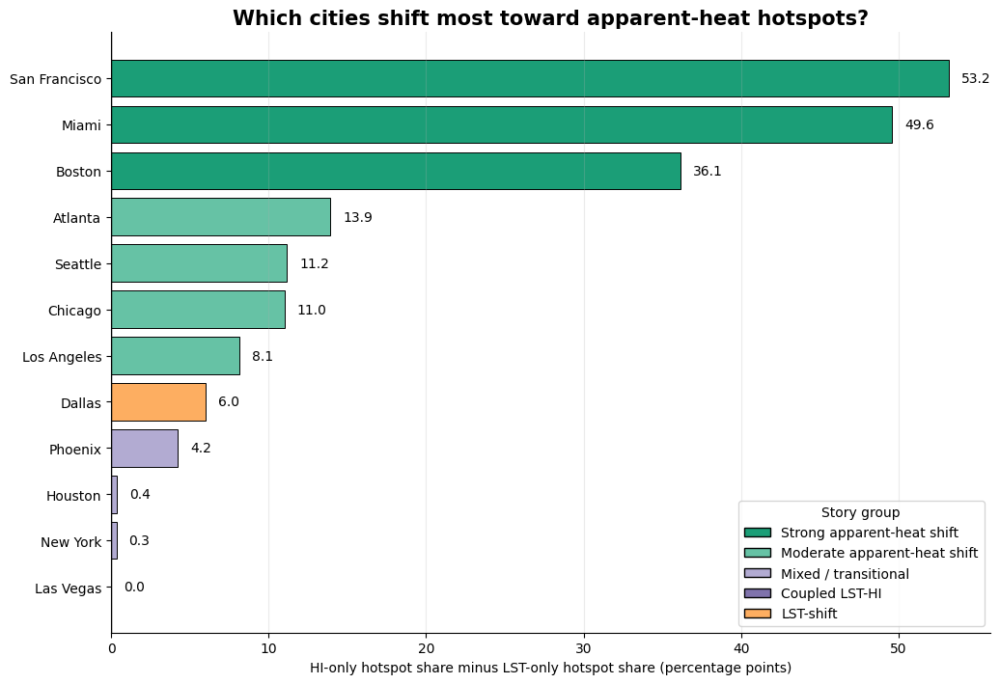

Saved figure: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/teacher_update_12city/FIG1_city_ranking_HI_minus_LST_hotspot_gap.png

================ TEACHER UPDATE NOTES ================
# 12-city LST vs Heat Index teacher update

## Current status
I expanded the comparison to 12 cities and organized the results into a city-level story table, context-level summaries, and robustness checks.

## Main finding
The strongest pattern is that coastal / water-influenced cities show a larger shift toward Heat-Index-only hotspots. The equal-city mean HI-only minus LST-only hotspot gap is 22.7 percentage points for coastal / water-influenced cities, compared with 7.0 percentage points for the other cities.

## Strongest apparent-heat shift cases
- San Francisco: HI-only 53.2%, LST-only 0.0%, gap 53.2 pp, context = Coastal / compact / bay-influenced.
- Miami: HI-only 52.0%, LST-only 2.4%, gap 49.6 pp, context = Coastal / humid.
- Boston: HI-only 47.6%, LST-only 11.5%, gap 3

In [31]:
# ============================================================
# Teacher update package for 12-city LST vs Heat Index story
# 目的：
# 1. 整理可以给老师汇报的主结论
# 2. 明确 robustness / caution
# 3. 生成一个简洁清晰的 ranking figure
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pd.set_option("display.max_columns", 100)
pd.set_option("display.width", 180)
pd.set_option("display.max_colwidth", 100)

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")

SUMMARY_PATH = PROJECT / "outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv"
OUTDIR = PROJECT / "outputs/pilot/alphaearth/teacher_update_12city"
OUTDIR.mkdir(parents=True, exist_ok=True)

if not SUMMARY_PATH.exists():
    raise FileNotFoundError(f"Cannot find: {SUMMARY_PATH}")

df = pd.read_csv(SUMMARY_PATH)
df.columns = [c.strip() for c in df.columns]

print("Loaded:", SUMMARY_PATH)
print("Rows:", len(df))
print("Columns:", list(df.columns))

# ------------------------------------------------------------
# Normalize / derive columns
# ------------------------------------------------------------
if "hi_minus_lst_hotspot_pct" not in df.columns:
    if {"hi_only_pct", "lst_only_pct"}.issubset(df.columns):
        df["hi_minus_lst_hotspot_pct"] = df["hi_only_pct"] - df["lst_only_pct"]
    else:
        raise ValueError("Need hi_only_pct and lst_only_pct to compute HI-LST hotspot gap.")

for c in [
    "ready_pct", "n_ready", "n_total",
    "mean_lst_c", "mean_hi_c", "mean_hi_minus_lst",
    "lst_hi_corr", "both_pct", "hi_only_pct", "lst_only_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct"
]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

def broad_context(x):
    x = str(x).lower()
    if "great lakes" in x:
        return "Great Lakes"
    if "desert" in x:
        return "Inland desert"
    if "sun belt" in x or "car-oriented" in x or "inland / humid" in x:
        return "Inland Sun Belt"
    if "coastal" in x or "water" in x or "bay" in x or "pacific" in x:
        return "Coastal / water-influenced"
    return "Other"

df["broad_context"] = df["city_context"].apply(broad_context)

def story_group(row):
    gap = row["hi_minus_lst_hotspot_pct"]
    corr = row.get("lst_hi_corr", np.nan)

    if gap >= 25:
        return "Strong apparent-heat shift"
    elif gap >= 8:
        return "Moderate apparent-heat shift"
    elif abs(gap) <= 6 and pd.notna(corr) and corr >= 0.45:
        return "Coupled LST-HI"
    elif abs(gap) <= 6:
        return "Mixed / transitional"
    else:
        return "LST-shift"

df["story_group"] = df.apply(story_group, axis=1)

df["total_hotspot_pct"] = df["both_pct"] + df["hi_only_pct"] + df["lst_only_pct"]
df["mismatch_pct"] = df["hi_only_pct"] + df["lst_only_pct"]

# ------------------------------------------------------------
# 1. Main teacher summary table
# ------------------------------------------------------------
teacher_cols = [
    "city_label", "city_context", "broad_context", "mechanism_type", "story_group",
    "ready_pct", "n_ready", "mean_lst_c", "mean_hi_c", "lst_hi_corr",
    "both_pct", "hi_only_pct", "lst_only_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct", "total_hotspot_pct", "mismatch_pct"
]
teacher_cols = [c for c in teacher_cols if c in df.columns]

teacher_table = (
    df[teacher_cols]
    .sort_values("hi_minus_lst_hotspot_pct", ascending=False)
    .reset_index(drop=True)
)

teacher_table.to_csv(OUTDIR / "01_teacher_city_story_table.csv", index=False)

print("\n================ TEACHER CITY STORY TABLE ================")
display(teacher_table)

# ------------------------------------------------------------
# 2. Context summary: equal-city weighted
# ------------------------------------------------------------
context_summary = (
    df.groupby("broad_context")
      .agg(
          n_cities=("city_label", "count"),
          cities=("city_label", lambda x: ", ".join(x)),
          mean_hi_shift=("hi_minus_lst_hotspot_pct", "mean"),
          median_hi_shift=("hi_minus_lst_hotspot_pct", "median"),
          mean_hi_only=("hi_only_pct", "mean"),
          mean_lst_only=("lst_only_pct", "mean"),
          mean_both=("both_pct", "mean"),
          mean_priority=("priority_pct", "mean"),
          mean_corr=("lst_hi_corr", "mean"),
          mean_ready=("ready_pct", "mean"),
      )
      .reset_index()
      .sort_values("mean_hi_shift", ascending=False)
)

context_summary.to_csv(OUTDIR / "02_context_summary_equal_city_weight.csv", index=False)

print("\n================ CONTEXT SUMMARY ================")
display(context_summary)

# ------------------------------------------------------------
# 3. Robustness / sensitivity checks
# ------------------------------------------------------------
def coastal_difference(temp, label, weight_col=None):
    coastal = temp[temp["broad_context"] == "Coastal / water-influenced"].copy()
    other = temp[temp["broad_context"] != "Coastal / water-influenced"].copy()

    if weight_col is None:
        coastal_mean = coastal["hi_minus_lst_hotspot_pct"].mean()
        other_mean = other["hi_minus_lst_hotspot_pct"].mean()
        weighting = "equal-city"
    else:
        coastal_mean = np.average(
            coastal["hi_minus_lst_hotspot_pct"],
            weights=coastal[weight_col]
        )
        other_mean = np.average(
            other["hi_minus_lst_hotspot_pct"],
            weights=other[weight_col]
        )
        weighting = f"weighted by {weight_col}"

    return {
        "check": label,
        "weighting": weighting,
        "n_cities": len(temp),
        "coastal_mean_hi_shift": coastal_mean,
        "noncoastal_mean_hi_shift": other_mean,
        "difference_coastal_minus_noncoastal": coastal_mean - other_mean,
        "still_positive": coastal_mean - other_mean > 0,
    }

checks = []

checks.append(coastal_difference(df, "All 12 cities", None))

if "n_ready" in df.columns:
    checks.append(coastal_difference(df, "All 12 cities", "n_ready"))

checks.append(coastal_difference(df[df["city_label"] != "San Francisco"], "Exclude San Francisco", None))
checks.append(coastal_difference(df[df["city_label"] != "Miami"], "Exclude Miami", None))
checks.append(coastal_difference(df[~df["city_label"].isin(["San Francisco", "Miami"])], "Exclude San Francisco + Miami", None))
checks.append(coastal_difference(df[df["ready_pct"] >= 90], "Only cities with ready_pct >= 90", None))
checks.append(coastal_difference(df[df["ready_pct"] >= 95], "Only cities with ready_pct >= 95", None))

sensitivity = pd.DataFrame(checks)
sensitivity.to_csv(OUTDIR / "03_sensitivity_checks.csv", index=False)

print("\n================ SENSITIVITY CHECKS ================")
display(sensitivity)

# ------------------------------------------------------------
# 4. Leave-one-out table
# ------------------------------------------------------------
loo_rows = []

for city in df["city_label"]:
    temp = df[df["city_label"] != city].copy()
    loo_rows.append(coastal_difference(temp, f"Remove {city}", None))

leave_one_out = pd.DataFrame(loo_rows)
leave_one_out["removed_city"] = leave_one_out["check"].str.replace("Remove ", "", regex=False)
leave_one_out = leave_one_out[
    [
        "removed_city", "n_cities",
        "coastal_mean_hi_shift",
        "noncoastal_mean_hi_shift",
        "difference_coastal_minus_noncoastal",
        "still_positive"
    ]
].sort_values("difference_coastal_minus_noncoastal")

leave_one_out.to_csv(OUTDIR / "04_leave_one_out_robustness.csv", index=False)

print("\n================ LEAVE-ONE-OUT ROBUSTNESS ================")
display(leave_one_out)

# ------------------------------------------------------------
# 5. Correlates: what tracks the HI shift?
# ------------------------------------------------------------
corr_cols = [
    "hi_minus_lst_hotspot_pct", "priority_pct", "hi_only_pct", "lst_only_pct",
    "both_pct", "total_hotspot_pct", "mismatch_pct",
    "lst_hi_corr", "ready_pct", "mean_lst_c", "mean_hi_c", "mean_hi_minus_lst"
]
corr_cols = [c for c in corr_cols if c in df.columns]

corr_table = (
    df[corr_cols]
    .corr(method="spearman")["hi_minus_lst_hotspot_pct"]
    .sort_values(ascending=False)
    .reset_index()
)
corr_table.columns = ["metric", "spearman_corr_with_HI_shift"]

corr_table.to_csv(OUTDIR / "05_correlates_of_hi_shift.csv", index=False)

print("\n================ CORRELATES OF HI SHIFT ================")
display(corr_table)

# ------------------------------------------------------------
# 6. Simple clean figure: city ranking by HI-LST hotspot gap
# 这张比复杂地图更适合给老师快速看主线
# ------------------------------------------------------------
plot_df = teacher_table.copy()
plot_df = plot_df.sort_values("hi_minus_lst_hotspot_pct", ascending=True)

color_map = {
    "Strong apparent-heat shift": "#1b9e77",
    "Moderate apparent-heat shift": "#66c2a5",
    "Mixed / transitional": "#b2abd2",
    "Coupled LST-HI": "#8073ac",
    "LST-shift": "#fdae61",
}

colors = [color_map.get(x, "#999999") for x in plot_df["story_group"]]

fig, ax = plt.subplots(figsize=(10.5, 7.2))

bars = ax.barh(
    plot_df["city_label"],
    plot_df["hi_minus_lst_hotspot_pct"],
    color=colors,
    edgecolor="black",
    linewidth=0.7
)

ax.axvline(0, color="black", linewidth=1)
ax.set_xlabel("HI-only hotspot share minus LST-only hotspot share (percentage points)")
ax.set_title(
    "Which cities shift most toward apparent-heat hotspots?",
    fontsize=15,
    fontweight="bold"
)

for bar, value in zip(bars, plot_df["hi_minus_lst_hotspot_pct"]):
    x = bar.get_width()
    y = bar.get_y() + bar.get_height() / 2
    ax.text(
        x + 0.8 if x >= 0 else x - 0.8,
        y,
        f"{value:.1f}",
        va="center",
        ha="left" if x >= 0 else "right",
        fontsize=10
    )

ax.grid(axis="x", alpha=0.25)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

from matplotlib.patches import Patch

legend_items = [
    Patch(facecolor=color, edgecolor="black", label=label)
    for label, color in color_map.items()
    if label in set(plot_df["story_group"])
]
ax.legend(
    handles=legend_items,
    title="Story group",
    loc="lower right",
    frameon=True
)

fig.tight_layout()

fig_path = OUTDIR / "FIG1_city_ranking_HI_minus_LST_hotspot_gap.png"
fig.savefig(fig_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved figure:", fig_path)

# ------------------------------------------------------------
# 7. Paper / advisor notes
# ------------------------------------------------------------
coastal_row = context_summary[context_summary["broad_context"] == "Coastal / water-influenced"].iloc[0]
noncoastal_mean = df[df["broad_context"] != "Coastal / water-influenced"]["hi_minus_lst_hotspot_pct"].mean()
main_diff = coastal_row["mean_hi_shift"] - noncoastal_mean

min_loo = leave_one_out["difference_coastal_minus_noncoastal"].min()
max_loo = leave_one_out["difference_coastal_minus_noncoastal"].max()
all_loo_positive = leave_one_out["still_positive"].all()

top3 = teacher_table.head(3)

notes = []
notes.append("# 12-city LST vs Heat Index teacher update")
notes.append("")
notes.append("## Current status")
notes.append(
    "I expanded the comparison to 12 cities and organized the results into a city-level story table, "
    "context-level summaries, and robustness checks."
)
notes.append("")
notes.append("## Main finding")
notes.append(
    f"The strongest pattern is that coastal / water-influenced cities show a larger shift toward "
    f"Heat-Index-only hotspots. The equal-city mean HI-only minus LST-only hotspot gap is "
    f"{coastal_row['mean_hi_shift']:.1f} percentage points for coastal / water-influenced cities, "
    f"compared with {noncoastal_mean:.1f} percentage points for the other cities."
)
notes.append("")
notes.append("## Strongest apparent-heat shift cases")
for _, r in top3.iterrows():
    notes.append(
        f"- {r['city_label']}: HI-only {r['hi_only_pct']:.1f}%, "
        f"LST-only {r['lst_only_pct']:.1f}%, "
        f"gap {r['hi_minus_lst_hotspot_pct']:.1f} pp, "
        f"context = {r['city_context']}."
    )
notes.append("")
notes.append("## Robustness")
notes.append(
    f"The leave-one-out check stays positive for every removed city. "
    f"The coastal-minus-noncoastal difference ranges from {min_loo:.1f} to {max_loo:.1f} pp."
)
if all_loo_positive:
    notes.append(
        "This suggests the context-gradient pattern is not caused by a single outlier city."
    )
notes.append("")
notes.append("## Important caution")
notes.append(
    "This is still a 12-city descriptive comparison, so I should frame the result as a robust pilot pattern, "
    "not as causal proof or a final statistically significant conclusion."
)
notes.append("")
notes.append("## Possible paper story")
notes.append(
    "A strong paper direction is: LST-based urban heat mapping may under-detect apparent-heat risk in "
    "humid, coastal, or water-influenced cities. The mismatch between LST and Heat Index appears to be "
    "structured by urban-climate context, rather than being random across cities."
)
notes.append("")
notes.append("## Suggested next step")
notes.append(
    "The next analytical step is to expand the city sample using a structured typology: coastal humid, "
    "coastal dry, Great Lakes, inland desert, and inland humid / Sun Belt cities. This would test whether "
    "the 12-city pattern remains stable at a larger scale."
)

notes_path = OUTDIR / "06_teacher_update_notes.md"
notes_path.write_text("\n".join(notes), encoding="utf-8")

print("\n================ TEACHER UPDATE NOTES ================")
print("\n".join(notes))

print("\nAll outputs saved to:")
print(OUTDIR)

In [32]:
# ============================================================
# FINAL 12-CITY STORY AUDIT + SPATIAL MORPHOLOGY MINING
# 目的：
# 1. 明确 city-level vs tract-weighted pattern
# 2. 找出哪些城市真正驱动 apparent-heat shift
# 3. 从 GPKG 中计算空间形态指标：
#    - HI-only vs LST-only 是否更 peripheral / central
#    - HI-only 是否更 fragmented / concentrated
#    - HI-only 与 LST-only 空间中心是否分离
# 4. 输出老师汇报用 tables + markdown notes
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import geopandas as gpd

pd.set_option("display.max_columns", 120)
pd.set_option("display.width", 220)
pd.set_option("display.max_colwidth", 120)

PROJECT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
BASE = PROJECT / "outputs/pilot/alphaearth"
OUTDIR = BASE / "teacher_update_12city_final_audit"
OUTDIR.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------
def find_first_existing(patterns):
    for pat in patterns:
        matches = sorted(PROJECT.glob(pat))
        if matches:
            return matches[-1]
    return None

def clean_city_label(x):
    x = str(x)
    mapping = {
        "san_francisco": "San Francisco",
        "new_york": "New York",
        "los_angeles": "Los Angeles",
        "las_vegas": "Las Vegas",
        "houston": "Houston",
        "phoenix": "Phoenix",
        "miami": "Miami",
        "boston": "Boston",
        "chicago": "Chicago",
        "atlanta": "Atlanta",
        "dallas": "Dallas",
        "seattle": "Seattle",
    }
    if x in mapping:
        return mapping[x]
    return x.replace("_", " ").title()

def broad_context(x):
    x = str(x).lower()
    if "great lakes" in x:
        return "Great Lakes"
    if "desert" in x:
        return "Inland desert"
    if "sun belt" in x or "car-oriented" in x or "inland / humid" in x:
        return "Inland Sun Belt"
    if "coastal" in x or "water" in x or "bay" in x or "pacific" in x:
        return "Coastal / water-influenced"
    return "Other"

def story_group(row):
    gap = row["hi_minus_lst_hotspot_pct"]
    corr = row.get("lst_hi_corr", np.nan)

    if gap >= 25:
        return "Strong HI-shift"
    elif gap >= 8:
        return "Moderate HI-shift"
    elif abs(gap) <= 6 and pd.notna(corr) and corr >= 0.45:
        return "Coupled LST-HI"
    elif abs(gap) <= 6:
        return "Mixed / transitional"
    else:
        return "LST-shift"

def weighted_mean(x, w):
    x = pd.to_numeric(x, errors="coerce")
    w = pd.to_numeric(w, errors="coerce")
    ok = x.notna() & w.notna() & (w > 0)
    if ok.sum() == 0:
        return np.nan
    return np.average(x[ok], weights=w[ok])

def normalize_class(v):
    s = str(v).lower().strip()

    if "both" in s and "lst" in s and "hi" in s:
        return "Both LST and HI hotspot"
    if ("hi-only" in s) or ("hi only" in s) or ("heat-index-only" in s) or ("heat index only" in s):
        return "HI-only hotspot"
    if ("lst-only" in s) or ("lst only" in s):
        return "LST-only hotspot"
    if "neither" in s:
        return "Neither hotspot"
    if "missing" in s or "no ee" in s or "nan" in s:
        return "Missing / no EE value"
    return str(v)

def union_all_safe(geoms):
    try:
        return geoms.union_all()
    except Exception:
        return geoms.unary_union

# ------------------------------------------------------------
# 1. Load city summary
# ------------------------------------------------------------
SUMMARY_PATH = find_first_existing([
    "outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv",
    "outputs/pilot/alphaearth/teacher_update_12city/01_teacher_city_story_table.csv",
    "outputs/pilot/alphaearth/twelve_city_story_mining/*.csv",
    "outputs/pilot/alphaearth/**/twelve_city_summary.csv",
])

if SUMMARY_PATH is None:
    raise FileNotFoundError("Cannot find twelve_city_summary.csv. Please check output folders.")

df = pd.read_csv(SUMMARY_PATH)
df.columns = [c.strip() for c in df.columns]

if "city_label" not in df.columns:
    if "city" in df.columns:
        df["city_label"] = df["city"].apply(clean_city_label)
    elif "city_id" in df.columns:
        df["city_label"] = df["city_id"].apply(clean_city_label)
    else:
        raise ValueError(f"Cannot find city column. Columns are: {list(df.columns)}")

if "city_context" not in df.columns:
    df["city_context"] = "Unknown"

if "hi_minus_lst_hotspot_pct" not in df.columns:
    df["hi_minus_lst_hotspot_pct"] = df["hi_only_pct"] - df["lst_only_pct"]

numeric_cols = [
    "ready_pct", "n_ready", "n_total",
    "mean_lst_c", "mean_hi_c", "mean_hi_minus_lst",
    "lst_hi_corr", "both_pct", "hi_only_pct", "lst_only_pct",
    "hi_minus_lst_hotspot_pct", "priority_pct",
]
for c in numeric_cols:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

df["broad_context"] = df["city_context"].apply(broad_context)
df["story_group"] = df.apply(story_group, axis=1)
df["total_detected_hotspot_pct"] = df["both_pct"] + df["hi_only_pct"] + df["lst_only_pct"]
df["mismatch_pct"] = df["hi_only_pct"] + df["lst_only_pct"]
df["hi_dominance_ratio"] = (df["hi_only_pct"] + 1) / (df["lst_only_pct"] + 1)

print("Loaded summary:", SUMMARY_PATH)
print("Number of cities:", len(df))
print("Cities:", sorted(df["city_label"].unique()))

# ------------------------------------------------------------
# 2. Unit-of-analysis audit
# ------------------------------------------------------------
coastal = df[df["broad_context"] == "Coastal / water-influenced"].copy()
noncoastal = df[df["broad_context"] != "Coastal / water-influenced"].copy()

unit_rows = []

unit_rows.append({
    "analysis": "Equal-city weighting",
    "coastal_mean_gap": coastal["hi_minus_lst_hotspot_pct"].mean(),
    "noncoastal_mean_gap": noncoastal["hi_minus_lst_hotspot_pct"].mean(),
    "coastal_minus_noncoastal": coastal["hi_minus_lst_hotspot_pct"].mean() - noncoastal["hi_minus_lst_hotspot_pct"].mean(),
    "interpretation": "City-level typology pattern"
})

if "n_ready" in df.columns:
    unit_rows.append({
        "analysis": "Tract-weighted by n_ready",
        "coastal_mean_gap": weighted_mean(coastal["hi_minus_lst_hotspot_pct"], coastal["n_ready"]),
        "noncoastal_mean_gap": weighted_mean(noncoastal["hi_minus_lst_hotspot_pct"], noncoastal["n_ready"]),
        "coastal_minus_noncoastal": weighted_mean(coastal["hi_minus_lst_hotspot_pct"], coastal["n_ready"]) - weighted_mean(noncoastal["hi_minus_lst_hotspot_pct"], noncoastal["n_ready"]),
        "interpretation": "Tract-level pooled pattern; large cities dominate"
    })

unit_audit = pd.DataFrame(unit_rows)
unit_audit.to_csv(OUTDIR / "01_unit_of_analysis_audit.csv", index=False)

print("\n================ 1. UNIT-OF-ANALYSIS AUDIT ================")
display(unit_audit)

# Contribution table: why tract-weighted result changes
if "n_ready" in df.columns:
    contrib = df.copy()
    contrib["city_weight_among_all_ready_tracts"] = contrib["n_ready"] / contrib["n_ready"].sum()
    contrib["weighted_gap_contribution_all"] = contrib["city_weight_among_all_ready_tracts"] * contrib["hi_minus_lst_hotspot_pct"]

    coastal_total_ready = coastal["n_ready"].sum()
    contrib["city_weight_within_coastal_ready_tracts"] = np.where(
        contrib["broad_context"] == "Coastal / water-influenced",
        contrib["n_ready"] / coastal_total_ready,
        np.nan
    )
    contrib["weighted_gap_contribution_within_coastal"] = (
        contrib["city_weight_within_coastal_ready_tracts"] * contrib["hi_minus_lst_hotspot_pct"]
    )

    contrib_cols = [
        "city_label", "broad_context", "city_context", "story_group",
        "n_ready", "ready_pct", "hi_minus_lst_hotspot_pct",
        "city_weight_among_all_ready_tracts",
        "weighted_gap_contribution_all",
        "city_weight_within_coastal_ready_tracts",
        "weighted_gap_contribution_within_coastal",
    ]

    contrib = contrib[contrib_cols].sort_values("n_ready", ascending=False)
    contrib.to_csv(OUTDIR / "02_city_weight_contribution_diagnostic.csv", index=False)

    print("\n================ 2. CITY WEIGHT CONTRIBUTION DIAGNOSTIC ================")
    display(contrib)

# ------------------------------------------------------------
# 3. Context pattern summary
# ------------------------------------------------------------
context_summary = (
    df.groupby("broad_context")
      .agg(
          n_cities=("city_label", "count"),
          cities=("city_label", lambda x: ", ".join(x)),
          mean_gap=("hi_minus_lst_hotspot_pct", "mean"),
          median_gap=("hi_minus_lst_hotspot_pct", "median"),
          mean_hi_only=("hi_only_pct", "mean"),
          mean_lst_only=("lst_only_pct", "mean"),
          mean_both=("both_pct", "mean"),
          mean_total_detected_hotspot=("total_detected_hotspot_pct", "mean"),
          mean_mismatch=("mismatch_pct", "mean"),
          mean_corr=("lst_hi_corr", "mean"),
          mean_ready=("ready_pct", "mean"),
      )
      .reset_index()
      .sort_values("mean_gap", ascending=False)
)

context_summary.to_csv(OUTDIR / "03_context_pattern_summary.csv", index=False)

print("\n================ 3. CONTEXT PATTERN SUMMARY ================")
display(context_summary)

# ------------------------------------------------------------
# 4. Leave-one-out and key caution flags
# ------------------------------------------------------------
loo = []
for city in df["city_label"]:
    temp = df[df["city_label"] != city].copy()
    c = temp[temp["broad_context"] == "Coastal / water-influenced"]
    n = temp[temp["broad_context"] != "Coastal / water-influenced"]

    loo.append({
        "removed_city": city,
        "n_cities_remaining": len(temp),
        "coastal_mean_gap_without_city": c["hi_minus_lst_hotspot_pct"].mean(),
        "noncoastal_mean_gap_without_city": n["hi_minus_lst_hotspot_pct"].mean(),
        "difference_without_city": c["hi_minus_lst_hotspot_pct"].mean() - n["hi_minus_lst_hotspot_pct"].mean(),
        "still_positive": (c["hi_minus_lst_hotspot_pct"].mean() - n["hi_minus_lst_hotspot_pct"].mean()) > 0
    })

loo = pd.DataFrame(loo).sort_values("difference_without_city")
loo.to_csv(OUTDIR / "04_leave_one_out_city_level.csv", index=False)

print("\n================ 4. LEAVE-ONE-OUT CITY-LEVEL ROBUSTNESS ================")
display(loo)

flags = df.copy()
flags["data_readiness_flag"] = np.where(
    flags["ready_pct"] < 80,
    "Caution: ready_pct < 80",
    np.where(flags["ready_pct"] < 95, "Moderate caution: ready_pct < 95", "High completeness")
)
flags["story_caution"] = np.where(
    (flags["hi_minus_lst_hotspot_pct"] >= 25) & (flags["ready_pct"] < 80),
    "Strong result but lower data readiness",
    np.where(flags["hi_minus_lst_hotspot_pct"] >= 25, "Strong apparent-heat case", "Standard")
)

flag_cols = [
    "city_label", "city_context", "broad_context", "story_group",
    "ready_pct", "n_ready", "hi_only_pct", "lst_only_pct",
    "hi_minus_lst_hotspot_pct", "data_readiness_flag", "story_caution"
]
flags[flag_cols].sort_values("hi_minus_lst_hotspot_pct", ascending=False).to_csv(
    OUTDIR / "05_city_caution_flags.csv", index=False
)

print("\n================ 5. CITY CAUTION FLAGS ================")
display(flags[flag_cols].sort_values("hi_minus_lst_hotspot_pct", ascending=False))

# ------------------------------------------------------------
# 5. Spatial morphology mining from GPKG
# ------------------------------------------------------------
GPKG_PATH = find_first_existing([
    "outputs/pilot/alphaearth/twelve_city_final_figures/*mismatch*GIS_READY*.gpkg",
    "outputs/pilot/alphaearth/twelve_city_final_figures/*.gpkg",
    "outputs/pilot/alphaearth/city_expansion_12city/*.gpkg",
    "outputs/pilot/alphaearth/**/twelve_city*GIS_READY*.gpkg",
    "outputs/pilot/alphaearth/**/twelve_city*.gpkg",
])

spatial_city_metrics = pd.DataFrame()
spatial_class_metrics = pd.DataFrame()

if GPKG_PATH is None:
    print("\nWARNING: No 12-city GPKG found. Skipping spatial morphology.")
else:
    print("\nReading GPKG:", GPKG_PATH)
    gdf = gpd.read_file(GPKG_PATH)
    print("GPKG rows:", len(gdf))
    print("GPKG columns:", list(gdf.columns))

    # Find city column
    possible_city_cols = ["city_label", "city", "city_id", "CITY", "CITY_ID"]
    city_col = next((c for c in possible_city_cols if c in gdf.columns), None)
    if city_col is None:
        raise ValueError(f"Cannot find city column in GPKG. Columns: {list(gdf.columns)}")

    gdf["city_label"] = gdf[city_col].apply(clean_city_label)

    # Find class column
    possible_class_cols = ["mismatch_class", "hotspot_class", "class", "mismatch", "hotspot_type"]
    class_col = next((c for c in possible_class_cols if c in gdf.columns), None)

    if class_col is None:
        # Try to search object columns for expected labels
        for c in gdf.select_dtypes(include="object").columns:
            vals = gdf[c].dropna().astype(str).str.lower().head(500).tolist()
            joined = " ".join(vals)
            if ("hi-only" in joined or "hi only" in joined) and ("lst-only" in joined or "lst only" in joined):
                class_col = c
                break

    if class_col is None:
        raise ValueError(
            "Cannot find mismatch class column in GPKG. "
            f"Available columns: {list(gdf.columns)}"
        )

    gdf["class_norm"] = gdf[class_col].apply(normalize_class)

    if gdf.crs is None:
        raise ValueError("GPKG has no CRS. Need CRS for spatial metrics.")

    # Use CONUS Albers for area/distance
    gdf_proj = gdf.to_crs("EPSG:5070").copy()
    gdf_proj["area_km2"] = gdf_proj.geometry.area / 1e6

    # Merge summary info
    keep_summary = [
        "city_label", "city_context", "broad_context", "story_group", "mechanism_type",
        "ready_pct", "hi_minus_lst_hotspot_pct", "lst_hi_corr"
    ]
    keep_summary = [c for c in keep_summary if c in df.columns]

    gdf_proj = gdf_proj.merge(
        df[keep_summary].drop_duplicates("city_label"),
        on="city_label",
        how="left"
    )

    city_rows = []
    class_rows = []

    valid_classes = [
        "Both LST and HI hotspot",
        "HI-only hotspot",
        "LST-only hotspot",
        "Neither hotspot",
    ]

    for city, sub0 in gdf_proj.groupby("city_label"):
        sub0 = sub0.copy()
        sub = sub0[sub0["class_norm"].isin(valid_classes)].copy()

        if len(sub) == 0:
            continue

        city_union = union_all_safe(sub.geometry)
        city_center = city_union.centroid
        rep_points = sub.geometry.representative_point()
        sub["_dist_km"] = rep_points.distance(city_center) / 1000.0
        max_dist = sub["_dist_km"].max()
        if max_dist == 0 or pd.isna(max_dist):
            max_dist = 1
        sub["_radial_norm"] = sub["_dist_km"] / max_dist

        total_area = sub["area_km2"].sum()

        def class_subset(cls):
            return sub[sub["class_norm"] == cls].copy()

        def class_area_pct(cls):
            temp = class_subset(cls)
            if len(temp) == 0 or total_area == 0:
                return np.nan
            return temp["area_km2"].sum() / total_area * 100

        def class_mean_radial(cls):
            temp = class_subset(cls)
            if len(temp) == 0:
                return np.nan
            return weighted_mean(temp["_radial_norm"], temp["area_km2"])

        def class_largest_patch_pct(cls):
            temp = class_subset(cls)
            if len(temp) == 0:
                return np.nan
            u = union_all_safe(temp.geometry)
            if u.geom_type == "Polygon":
                parts = [u]
            elif u.geom_type == "MultiPolygon":
                parts = list(u.geoms)
            else:
                parts = [geom for geom in getattr(u, "geoms", []) if geom.geom_type in ["Polygon", "MultiPolygon"]]

            if len(parts) == 0:
                return np.nan

            areas = np.array([p.area / 1e6 for p in parts])
            total = temp["area_km2"].sum()
            if total == 0:
                return np.nan
            return areas.max() / total * 100

        def class_component_count(cls):
            temp = class_subset(cls)
            if len(temp) == 0:
                return 0
            u = union_all_safe(temp.geometry)
            if u.geom_type == "Polygon":
                return 1
            if u.geom_type == "MultiPolygon":
                return len(list(u.geoms))
            return len([geom for geom in getattr(u, "geoms", []) if geom.geom_type in ["Polygon", "MultiPolygon"]])

        def class_centroid(cls):
            temp = class_subset(cls)
            if len(temp) == 0:
                return None
            return union_all_safe(temp.geometry).centroid

        hi_cent = class_centroid("HI-only hotspot")
        lst_cent = class_centroid("LST-only hotspot")
        if hi_cent is not None and lst_cent is not None:
            hi_lst_centroid_distance_km = hi_cent.distance(lst_cent) / 1000.0
        else:
            hi_lst_centroid_distance_km = np.nan

        hi_radial = class_mean_radial("HI-only hotspot")
        lst_radial = class_mean_radial("LST-only hotspot")
        hi_minus_lst_radial = hi_radial - lst_radial if pd.notna(hi_radial) and pd.notna(lst_radial) else np.nan

        if pd.isna(hi_minus_lst_radial):
            radial_interpretation = "Cannot compare"
        elif hi_minus_lst_radial > 0.08:
            radial_interpretation = "HI-only more peripheral"
        elif hi_minus_lst_radial < -0.08:
            radial_interpretation = "HI-only more central"
        else:
            radial_interpretation = "Similar radial position"

        summary_row = df[df["city_label"] == city]
        if len(summary_row) > 0:
            summary_row = summary_row.iloc[0]
            city_context_value = summary_row.get("city_context", "")
            broad_context_value = summary_row.get("broad_context", "")
            story_group_value = summary_row.get("story_group", "")
            mechanism_value = summary_row.get("mechanism_type", "")
            ready_value = summary_row.get("ready_pct", np.nan)
            gap_value = summary_row.get("hi_minus_lst_hotspot_pct", np.nan)
        else:
            city_context_value = ""
            broad_context_value = ""
            story_group_value = ""
            mechanism_value = ""
            ready_value = np.nan
            gap_value = np.nan

        city_rows.append({
            "city_label": city,
            "city_context": city_context_value,
            "broad_context": broad_context_value,
            "story_group": story_group_value,
            "mechanism_type": mechanism_value,
            "ready_pct": ready_value,
            "hi_minus_lst_hotspot_pct": gap_value,
            "n_valid_tracts": len(sub),
            "total_area_km2": total_area,
            "hi_only_area_pct": class_area_pct("HI-only hotspot"),
            "lst_only_area_pct": class_area_pct("LST-only hotspot"),
            "both_area_pct": class_area_pct("Both LST and HI hotspot"),
            "neither_area_pct": class_area_pct("Neither hotspot"),
            "hi_only_mean_radial_norm": hi_radial,
            "lst_only_mean_radial_norm": lst_radial,
            "hi_minus_lst_radial_norm": hi_minus_lst_radial,
            "radial_interpretation": radial_interpretation,
            "hi_lst_centroid_distance_km": hi_lst_centroid_distance_km,
            "hi_only_components": class_component_count("HI-only hotspot"),
            "lst_only_components": class_component_count("LST-only hotspot"),
            "both_components": class_component_count("Both LST and HI hotspot"),
            "hi_only_largest_patch_pct": class_largest_patch_pct("HI-only hotspot"),
            "lst_only_largest_patch_pct": class_largest_patch_pct("LST-only hotspot"),
        })

        for cls in valid_classes:
            temp = class_subset(cls)
            if len(temp) == 0:
                continue

            class_rows.append({
                "city_label": city,
                "class": cls,
                "n_tracts": len(temp),
                "area_km2": temp["area_km2"].sum(),
                "area_pct": temp["area_km2"].sum() / total_area * 100 if total_area > 0 else np.nan,
                "mean_radial_norm": weighted_mean(temp["_radial_norm"], temp["area_km2"]),
                "component_count": class_component_count(cls),
                "largest_patch_pct": class_largest_patch_pct(cls),
            })

    spatial_city_metrics = pd.DataFrame(city_rows)
    spatial_class_metrics = pd.DataFrame(class_rows)

    spatial_city_metrics = spatial_city_metrics.sort_values("hi_minus_lst_hotspot_pct", ascending=False)

    spatial_city_metrics.to_csv(OUTDIR / "06_spatial_morphology_city_metrics.csv", index=False)
    spatial_class_metrics.to_csv(OUTDIR / "07_spatial_morphology_class_metrics.csv", index=False)

    print("\n================ 6. SPATIAL MORPHOLOGY CITY METRICS ================")
    display(spatial_city_metrics)

    print("\n================ 7. SPATIAL CLASS METRICS ================")
    display(spatial_class_metrics.head(40))

# ------------------------------------------------------------
# 6. Write final teacher-facing interpretation notes
# ------------------------------------------------------------
equal_gap = unit_audit.loc[unit_audit["analysis"] == "Equal-city weighting", "coastal_minus_noncoastal"].iloc[0]
tract_gap = unit_audit.loc[unit_audit["analysis"] == "Tract-weighted by n_ready", "coastal_minus_noncoastal"].iloc[0] if "Tract-weighted by n_ready" in unit_audit["analysis"].values else np.nan

top_shift = df.sort_values("hi_minus_lst_hotspot_pct", ascending=False).head(5)
lowest_shift = df.sort_values("hi_minus_lst_hotspot_pct", ascending=True).head(4)

min_loo = loo["difference_without_city"].min()
max_loo = loo["difference_without_city"].max()

notes = []
notes.append("# Final 12-city story audit")
notes.append("")
notes.append("## Core finding")
notes.append(
    f"At the city level, coastal / water-influenced cities show a stronger shift toward Heat-Index-only hotspots. "
    f"The equal-city coastal-minus-noncoastal difference is {equal_gap:.1f} percentage points."
)
if pd.notna(tract_gap):
    notes.append(
        f"However, when cities are weighted by the number of analysis-ready tracts, the difference is {tract_gap:.1f} percentage points. "
        f"This means the result should be framed as a city-level typology pattern, not as a pooled tract-level effect."
    )

notes.append("")
notes.append("## Strongest apparent-heat shift cases")
for _, r in top_shift.iterrows():
    notes.append(
        f"- {r['city_label']}: gap = {r['hi_minus_lst_hotspot_pct']:.1f} pp, "
        f"HI-only = {r['hi_only_pct']:.1f}%, LST-only = {r['lst_only_pct']:.1f}%, "
        f"context = {r['city_context']}, ready = {r['ready_pct']:.1f}%."
    )

notes.append("")
notes.append("## Coupled or transitional cases")
for _, r in lowest_shift.iterrows():
    notes.append(
        f"- {r['city_label']}: gap = {r['hi_minus_lst_hotspot_pct']:.1f} pp, "
        f"LST-HI corr = {r['lst_hi_corr']:.2f}, context = {r['city_context']}."
    )

notes.append("")
notes.append("## Robustness")
notes.append(
    f"The leave-one-out city-level pattern remains positive after removing each city. "
    f"The coastal-minus-noncoastal difference ranges from {min_loo:.1f} to {max_loo:.1f} pp."
)

notes.append("")
notes.append("## Main caution")
notes.append(
    "San Francisco is one of the strongest apparent-heat shift cases but has lower data readiness than most other cities. "
    "Therefore, it should be used as an important case, but the result should not depend only on San Francisco."
)

if len(spatial_city_metrics) > 0:
    notes.append("")
    notes.append("## Spatial morphology direction")
    spatial_top = spatial_city_metrics.sort_values("hi_minus_lst_hotspot_pct", ascending=False).head(5)
    for _, r in spatial_top.iterrows():
        notes.append(
            f"- {r['city_label']}: radial pattern = {r['radial_interpretation']}, "
            f"HI-LST centroid distance = {r['hi_lst_centroid_distance_km']:.1f} km, "
            f"HI-only largest patch = {r['hi_only_largest_patch_pct']:.1f}%."
        )

notes.append("")
notes.append("## Suggested paper framing")
notes.append(
    "The paper should frame the result as a multi-city comparison of how LST and Heat Index identify different hotspot geographies. "
    "The strongest story is not simply that coastal cities are hotter, but that some coastal or water-influenced cities show a stronger apparent-heat hotspot signature that LST alone may miss."
)

notes.append("")
notes.append("## Suggested next action before writing")
notes.append(
    "Before expanding to many more cities, use this 12-city audit to discuss the unit-of-analysis issue with the advisor: "
    "city-level pattern is strong, while tract-weighted pooled pattern is weaker. "
    "If the advisor agrees, the next expansion should be targeted by typology rather than random city addition."
)

notes_path = OUTDIR / "08_final_teacher_story_notes.md"
notes_path.write_text("\n".join(notes), encoding="utf-8")

print("\n================ FINAL TEACHER STORY NOTES ================")
print("\n".join(notes))

print("\nSaved all final-audit outputs to:")
print(OUTDIR)

Loaded summary: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv
Number of cities: 12
Cities: ['Atlanta', 'Boston', 'Chicago', 'Dallas', 'Houston', 'Las Vegas', 'Los Angeles', 'Miami', 'New York', 'Phoenix', 'San Francisco', 'Seattle']

================ 1. UNIT-OF-ANALYSIS AUDIT ================


,analysis,coastal_mean_gap,noncoastal_mean_gap,coastal_minus_noncoastal,interpretation
0,Equal-city weighting,22.705007,7.028150,15.676857,City-level typology pattern
1,Tract-weighted by n_ready,7.915627,7.197943,0.717684,Tract-level pooled pattern; large cities dominate



================ 2. CITY WEIGHT CONTRIBUTION DIAGNOSTIC ================


,city_label,broad_context,city_context,story_group,n_ready,ready_pct,hi_minus_lst_hotspot_pct,city_weight_among_all_ready_tracts,weighted_gap_contribution_all,city_weight_within_coastal_ready_tracts,weighted_gap_contribution_within_coastal
6,New York,Coastal / water-influenced,Coastal / megacity / dense core,Mixed / transitional,2088,88.287526,0.335249,0.309654,0.103811,0.473577,0.158766
3,Los Angeles,Coastal / water-influenced,Coastal / dry,Moderate HI-shift,1080,97.472924,8.148148,0.160166,1.305057,0.244954,1.995917
7,Chicago,Great Lakes,Great Lakes / large grid city,Moderate HI-shift,872,100.000000,11.009174,0.129319,1.423699,NaN,NaN
0,Houston,Coastal / water-influenced,Coastal / humid,Mixed / transitional,549,100.000000,0.364299,0.081418,0.029660,0.124518,0.045362
2,Las Vegas,Inland desert,Inland / desert,Coupled LST-HI,458,100.000000,0.000000,0.067922,0.000000,NaN,NaN
9,Dallas,Inland Sun Belt,Inland / large Sun Belt / car-oriented,LST-shift,449,100.000000,6.013363,0.066588,0.400415,NaN,NaN
1,Phoenix,Inland desert,Inland / desert,Mixed / transitional,332,100.000000,4.216867,0.049236,0.207623,NaN,NaN
8,Atlanta,Inland Sun Belt,Inland / humid / sprawling Sun Belt,Moderate HI-shift,223,100.000000,13.901345,0.033071,0.459736,NaN,NaN
5,Boston,Coastal / water-influenced,Coastal / temperate,Strong HI-shift,191,92.270531,36.125654,0.028326,1.023283,0.043320,1.564981
10,Seattle,Coastal / water-influenced,Coastal / Pacific Northwest / water-constrained,Moderate HI-shift,188,94.472362,11.170213,0.027881,0.311434,0.042640,0.476298



================ 3. CONTEXT PATTERN SUMMARY ================


,broad_context,n_cities,cities,mean_gap,median_gap,mean_hi_only,mean_lst_only,mean_both,mean_total_detected_hotspot,mean_mismatch,mean_corr,mean_ready
0,Coastal / water-influenced,7,"Houston, Los Angeles, Miami, Boston, New York, Seattle, San Francisco",22.705007,11.170213,35.355949,12.650941,12.700951,60.707841,48.006890,0.167327,91.672894
1,Great Lakes,1,Chicago,11.009174,11.009174,17.545872,6.536697,18.463303,42.545872,24.082569,0.631143,100.000000
2,Inland Sun Belt,2,"Atlanta, Dallas",9.957354,9.957354,25.497618,15.540264,9.599309,50.637191,41.037882,-0.079903,100.000000
3,Inland desert,2,"Phoenix, Las Vegas",2.108434,2.108434,13.662730,11.554296,13.500289,38.717315,25.217025,0.520743,100.000000



================ 4. LEAVE-ONE-OUT CITY-LEVEL ROBUSTNESS ================


,removed_city,n_cities_remaining,coastal_mean_gap_without_city,noncoastal_mean_gap_without_city,difference_without_city,still_positive
11,San Francisco,11,17.623927,7.028150,10.595777,True
4,Miami,11,18.222509,7.028150,11.194359,True
5,Boston,11,20.468233,7.028150,13.440083,True
2,Las Vegas,11,22.705007,8.785188,13.919820,True
1,Phoenix,11,22.705007,7.730971,14.974037,True
9,Dallas,11,22.705007,7.281847,15.423161,True
7,Chicago,11,22.705007,6.032894,16.672114,True
8,Atlanta,11,22.705007,5.309851,17.395156,True
10,Seattle,11,24.627473,7.028150,17.599323,True
3,Los Angeles,11,25.131151,7.028150,18.103001,True



================ 5. CITY CAUTION FLAGS ================


,city_label,city_context,broad_context,story_group,ready_pct,n_ready,hi_only_pct,lst_only_pct,hi_minus_lst_hotspot_pct,data_readiness_flag,story_caution
11,San Francisco,Coastal / compact / bay-influenced,Coastal / water-influenced,Strong HI-shift,72.307692,188,53.191489,0.000000,53.191489,Caution: ready_pct < 80,Strong result but lower data readiness
4,Miami,Coastal / humid,Coastal / water-influenced,Strong HI-shift,96.899225,125,52.000000,2.400000,49.600000,High completeness,Strong apparent-heat case
5,Boston,Coastal / temperate,Coastal / water-influenced,Strong HI-shift,92.270531,191,47.643979,11.518325,36.125654,Moderate caution: ready_pct < 95,Strong apparent-heat case
8,Atlanta,Inland / humid / sprawling Sun Belt,Inland Sun Belt,Moderate HI-shift,100.000000,223,32.286996,18.385650,13.901345,High completeness,Standard
10,Seattle,Coastal / Pacific Northwest / water-constrained,Coastal / water-influenced,Moderate HI-shift,94.472362,188,32.978723,21.808511,11.170213,Moderate caution: ready_pct < 95,Standard
7,Chicago,Great Lakes / large grid city,Great Lakes,Moderate HI-shift,100.000000,872,17.545872,6.536697,11.009174,High completeness,Standard
3,Los Angeles,Coastal / dry,Coastal / water-influenced,Moderate HI-shift,97.472924,1080,25.925926,17.777778,8.148148,High completeness,Standard
9,Dallas,Inland / large Sun Belt / car-oriented,Inland Sun Belt,LST-shift,100.000000,449,18.708241,12.694878,6.013363,High completeness,Standard
1,Phoenix,Inland / desert,Inland desert,Mixed / transitional,100.000000,332,18.373494,14.156627,4.216867,High completeness,Standard
0,Houston,Coastal / humid,Coastal / water-influenced,Mixed / transitional,100.000000,549,16.211293,15.846995,0.364299,High completeness,Standard



Reading GPKG: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_lstadaptive_heat_index_mismatch_GIS_READY.gpkg
GPKG rows: 7151
GPKG columns: ['city', 'city_label', 'GEOID', 'lst_c', 'hi_c', 'hi_minus_lst', 'analysis_ready', 'lst_pct_city', 'hi_pct_city', 'lst_z_city', 'hi_z_city', 'hi_minus_lst_pct', 'hi_minus_lst_z', 'lst_hot_q75', 'hi_hot_q75', 'mismatch_class', 'priority_flag', 'city_context', 'ALAND', 'AWATER', 'COUNTYFP', 'FUNCSTAT', 'GEOIDFQ', 'INTPTLAT', 'INTPTLON', 'MTFCC', 'NAME', 'NAMELSAD', 'STATEFP', 'TRACTCE', 'centroid_in_city', 'intersects_city', 'state_fips', 'state_name', 'lst_pct', 'hi_pct', 'lst_hot', 'hi_hot', 'q75_lst_c', 'q75_hi_c', 'q75_hi_minus_lst_pct', 'geometry']

================ 6. SPATIAL MORPHOLOGY CITY METRICS ================


,city_label,city_context,broad_context,story_group,mechanism_type,ready_pct,hi_minus_lst_hotspot_pct,n_valid_tracts,total_area_km2,hi_only_area_pct,lst_only_area_pct,both_area_pct,neither_area_pct,hi_only_mean_radial_norm,lst_only_mean_radial_norm,hi_minus_lst_radial_norm,radial_interpretation,hi_lst_centroid_distance_km,hi_only_components,lst_only_components,both_components,hi_only_largest_patch_pct,lst_only_largest_patch_pct
10,San Francisco,Coastal / compact / bay-influenced,Coastal / water-influenced,Strong HI-shift,Strong HI-dominant,72.307692,53.191489,188,2042.637743,53.026576,NaN,0.936486,46.036938,0.767428,NaN,NaN,Cannot compare,NaN,3,0,1,51.368951,NaN
7,Miami,Coastal / humid,Coastal / water-influenced,Strong HI-shift,Strong HI-dominant,96.899225,49.600000,125,116.716252,54.674545,1.716977,19.160818,24.447659,0.439614,0.347826,0.091787,HI-only more peripheral,5.433060,1,1,2,100.000000,100.000000
1,Boston,Coastal / temperate,Coastal / water-influenced,Strong HI-shift,Strong HI-dominant,92.270531,36.125654,191,269.462474,25.898817,3.485264,3.679210,66.936709,0.726580,0.578221,0.148358,HI-only more peripheral,8.253209,4,5,2,95.012569,48.442812
0,Atlanta,Inland / humid / sprawling Sun Belt,Inland Sun Belt,Moderate HI-shift,Moderate HI-dominant,100.000000,13.901345,223,592.938039,46.621804,6.071690,8.646382,38.660124,0.530504,0.289370,0.241134,HI-only more peripheral,9.849763,1,1,2,100.000000,100.000000
11,Seattle,Coastal / Pacific Northwest / water-constrained,Coastal / water-influenced,Moderate HI-shift,Moderate HI-dominant,94.472362,11.170213,188,886.602628,36.667514,8.154107,0.876841,54.301538,0.403323,0.673472,-0.270150,HI-only more central,9.169772,1,5,3,100.000000,71.015718
2,Chicago,Great Lakes / large grid city,Great Lakes,Moderate HI-shift,Moderate HI-dominant,100.000000,11.009174,872,2545.660480,10.932196,1.000860,6.102989,81.963954,0.781726,0.520057,0.261669,HI-only more peripheral,6.653870,6,4,6,55.366738,76.277117
6,Los Angeles,Coastal / dry,Coastal / water-influenced,Moderate HI-shift,Moderate HI-dominant,97.472924,8.148148,1080,1214.010990,17.769321,13.483879,6.112242,62.634558,0.306238,0.385171,-0.078932,Similar radial position,16.848643,3,3,1,79.174746,77.965194
3,Dallas,Inland / large Sun Belt / car-oriented,Inland Sun Belt,LST-shift,Mixed / transitional,100.000000,6.013363,449,1858.654097,32.380069,5.644438,5.703896,56.271597,0.450196,0.419119,0.031077,Similar radial position,20.717062,7,6,3,71.629847,33.999642
9,Phoenix,Inland / desert,Inland desert,Mixed / transitional,Mixed / transitional,100.000000,4.216867,332,1443.280819,20.600041,36.183720,3.975019,39.241221,0.721219,0.703571,0.017649,Similar radial position,39.878579,5,11,10,49.655635,56.324355
4,Houston,Coastal / humid,Coastal / water-influenced,Mixed / transitional,Mixed / transitional,100.000000,0.364299,549,1472.236736,15.662497,9.169544,2.987004,72.180954,0.560440,0.360631,0.199810,HI-only more peripheral,9.923693,12,40,17,35.625054,10.939498



================ 7. SPATIAL CLASS METRICS ================


,city_label,class,n_tracts,area_km2,area_pct,mean_radial_norm,component_count,largest_patch_pct
0,Atlanta,Both LST and HI hotspot,15,51.267689,8.646382,0.648206,2,80.073664
1,Atlanta,HI-only hotspot,72,276.438408,46.621804,0.530504,1,100.000000
2,Atlanta,LST-only hotspot,41,36.001361,6.071690,0.289370,1,100.000000
3,Atlanta,Neither hotspot,95,229.230581,38.660124,0.638740,2,95.267011
4,Boston,Both LST and HI hotspot,26,9.914090,3.679210,0.438780,2,97.718855
5,Boston,HI-only hotspot,91,69.787594,25.898817,0.726580,4,95.012569
6,Boston,LST-only hotspot,22,9.391478,3.485264,0.578221,5,48.442812
7,Boston,Neither hotspot,52,180.369311,66.936709,0.301261,2,99.826751
8,Chicago,Both LST and HI hotspot,161,155.361382,6.102989,0.678085,6,63.219395
9,Chicago,HI-only hotspot,153,278.296603,10.932196,0.781726,6,55.366738



================ FINAL TEACHER STORY NOTES ================
# Final 12-city story audit

## Core finding
At the city level, coastal / water-influenced cities show a stronger shift toward Heat-Index-only hotspots. The equal-city coastal-minus-noncoastal difference is 15.7 percentage points.
However, when cities are weighted by the number of analysis-ready tracts, the difference is 0.7 percentage points. This means the result should be framed as a city-level typology pattern, not as a pooled tract-level effect.

## Strongest apparent-heat shift cases
- San Francisco: gap = 53.2 pp, HI-only = 53.2%, LST-only = 0.0%, context = Coastal / compact / bay-influenced, ready = 72.3%.
- Miami: gap = 49.6 pp, HI-only = 52.0%, LST-only = 2.4%, context = Coastal / humid, ready = 96.9%.
- Boston: gap = 36.1 pp, HI-only = 47.6%, LST-only = 11.5%, context = Coastal / temperate, ready = 92.3%.
- Atlanta: gap = 13.9 pp, HI-only = 32.3%, LST-only = 18.4%, context = Inland / humid / sprawling Sun Belt, rea

In [33]:
# ============================================================
# FINAL 12-CITY STORY MINING AUDIT
# Goal:
# 1) explain what the added 6 cities contributed
# 2) separate city-level story from tract-weighted caution
# 3) create teacher-ready evidence tables + notes
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import textwrap

pd.set_option("display.max_columns", 120)
pd.set_option("display.width", 220)

# -----------------------------
# 0. Find project root + inputs
# -----------------------------
def find_project_root(start=Path.cwd()):
    for p in [start] + list(start.parents):
        if (p / "outputs").exists() and (p / "notebooks").exists():
            return p
    return start

ROOT = find_project_root()

summary_candidates = [
    ROOT / "outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv",
    ROOT / "outputs/pilot/alphaearth/teacher_update_12city/teacher_city_story_table.csv",
    ROOT / "outputs/pilot/alphaearth/twelve_city_story_mining/01_city_story_groups.csv",
    ROOT / "outputs/pilot/alphaearth/twelve_city_story_mining/01_rank_hi_shift.csv",
]

summary_path = None
for p in summary_candidates:
    if p.exists():
        summary_path = p
        break

if summary_path is None:
    raise FileNotFoundError(
        "Could not find a 12-city summary CSV. Checked:\n"
        + "\n".join(str(p) for p in summary_candidates)
    )

df = pd.read_csv(summary_path)
print("Loaded:", summary_path)
print("Rows:", len(df))
print("Columns:", list(df.columns))

OUTDIR = ROOT / "outputs/pilot/alphaearth/final_12city_teacher_story_audit"
OUTDIR.mkdir(parents=True, exist_ok=True)

# -----------------------------
# 1. Robust column handling
# -----------------------------
def pick_col(options, required=True):
    for c in options:
        if c in df.columns:
            return c
    if required:
        raise ValueError(f"Missing required column. Tried: {options}\nAvailable: {list(df.columns)}")
    return None

city_col = pick_col(["city", "city_id", "city_label"])
label_col = pick_col(["city_label", "city", "city_id"])
context_col = pick_col(["city_context"], required=False)
broad_col = pick_col(["broad_context"], required=False)

gap_col = pick_col([
    "hi_minus_lst_hotspot_pct",
    "hi_minus_lst_hotspot_share",
    "hi_minus_lst_gap",
    "hi_minus_lst"
])

hi_only_col = pick_col(["hi_only_pct", "HI-only hotspot", "hi_only"])
lst_only_col = pick_col(["lst_only_pct", "LST-only hotspot", "lst_only"])
both_col = pick_col(["both_pct", "both_lst_hi_pct", "Both LST and HI hotspot"], required=False)
corr_col = pick_col(["lst_hi_corr", "lst_hi_correlation"], required=False)
ready_col = pick_col(["ready_pct"], required=False)
nready_col = pick_col(["n_ready", "n_valid_tracts", "n_plot_tracts"], required=False)
mean_lst_col = pick_col(["mean_lst_c", "mean_lst"], required=False)
mean_hi_col = pick_col(["mean_hi_c", "mean_hi"], required=False)
priority_col = pick_col(["priority_pct"], required=False)
mismatch_col = pick_col(["mismatch_pct"], required=False)
total_hotspot_col = pick_col(["total_hotspot_pct", "total_detected_hotspot_pct"], required=False)

# Normalize city_id
def clean_city_id(x):
    return str(x).strip().lower().replace(" ", "_")

df["city_id_clean"] = df[city_col].apply(clean_city_id)

# If city_label is weird / duplicated, force nice names from city_id when needed
nice_names = {
    "houston": "Houston",
    "phoenix": "Phoenix",
    "las_vegas": "Las Vegas",
    "los_angeles": "Los Angeles",
    "miami": "Miami",
    "boston": "Boston",
    "new_york": "New York",
    "chicago": "Chicago",
    "atlanta": "Atlanta",
    "dallas": "Dallas",
    "seattle": "Seattle",
    "san_francisco": "San Francisco",
}
df["city_label_clean"] = df["city_id_clean"].map(nice_names).fillna(df[label_col].astype(str))

# -----------------------------
# 2. Derive broad context if needed
# -----------------------------
def derive_broad_context(row):
    cid = row["city_id_clean"]
    ctx = str(row[context_col]) if context_col else ""

    if broad_col and pd.notna(row[broad_col]):
        return row[broad_col]

    if cid == "chicago":
        return "Great Lakes"
    if cid in ["phoenix", "las_vegas"]:
        return "Inland desert"
    if cid in ["atlanta", "dallas"]:
        return "Inland Sun Belt"
    if "coastal" in ctx.lower() or cid in ["houston", "los_angeles", "miami", "boston", "new_york", "seattle", "san_francisco"]:
        return "Coastal / water-influenced"
    return "Other / check"

df["broad_context_final"] = df.apply(derive_broad_context, axis=1)

# -----------------------------
# 3. Story group classification
# -----------------------------
def classify_story(row):
    gap = row[gap_col]
    corr = row[corr_col] if corr_col else np.nan

    if gap >= 30:
        return "Strong HI-shift"
    if gap >= 8:
        return "Moderate HI-shift"
    if pd.notna(corr) and abs(gap) <= 2 and corr >= 0.45:
        return "Coupled LST-HI"
    if gap <= -3:
        return "LST-shift"
    return "Mixed / transitional"

if "story_group" in df.columns:
    df["story_group_final"] = df["story_group"]
else:
    df["story_group_final"] = df.apply(classify_story, axis=1)

old6 = {"houston", "phoenix", "las_vegas", "los_angeles", "miami", "boston"}
df["expansion_group"] = np.where(df["city_id_clean"].isin(old6), "Original 6", "Added 6")

# -----------------------------
# 4. Key derived metrics
# -----------------------------
if nready_col is not None:
    df["city_weight_among_all_ready_tracts"] = df[nready_col] / df[nready_col].sum()
else:
    df["city_weight_among_all_ready_tracts"] = np.nan

df["weighted_gap_contribution_all"] = df[gap_col] * df["city_weight_among_all_ready_tracts"]

# HI dominance ratio: how much HI-only exceeds LST-only
df["hi_dominance_ratio"] = np.where(
    df[lst_only_col] > 0,
    df[hi_only_col] / df[lst_only_col],
    np.nan
)

# Total detected hotspots
if total_hotspot_col:
    df["total_detected_hotspot_pct_final"] = df[total_hotspot_col]
else:
    base = df[hi_only_col] + df[lst_only_col]
    if both_col:
        base = base + df[both_col]
    df["total_detected_hotspot_pct_final"] = base

# Data readiness flags
if ready_col:
    def readiness_flag(x):
        if x < 80:
            return "Caution: ready_pct < 80"
        if x < 95:
            return "Moderate caution: ready_pct < 95"
        return "High completeness"
    df["data_readiness_flag"] = df[ready_col].apply(readiness_flag)
else:
    df["data_readiness_flag"] = "No ready_pct column"

# -----------------------------
# 5. Table A: Added 6 contribution
# -----------------------------
metric_cols = [gap_col, hi_only_col, lst_only_col]
if both_col:
    metric_cols.append(both_col)
if corr_col:
    metric_cols.append(corr_col)
if ready_col:
    metric_cols.append(ready_col)
if nready_col:
    metric_cols.append(nready_col)

added_vs_original = (
    df.groupby("expansion_group")
      .agg(
          n_cities=("city_id_clean", "count"),
          cities=("city_label_clean", lambda x: ", ".join(x)),
          mean_HI_minus_LST_gap=(gap_col, "mean"),
          median_HI_minus_LST_gap=(gap_col, "median"),
          mean_HI_only=(hi_only_col, "mean"),
          mean_LST_only=(lst_only_col, "mean"),
          mean_total_detected_hotspot=("total_detected_hotspot_pct_final", "mean"),
          mean_ready=(ready_col, "mean") if ready_col else (gap_col, "count"),
      )
      .reset_index()
)

added_city_roles = df[df["expansion_group"] == "Added 6"].copy()
added_city_roles = added_city_roles.sort_values(gap_col, ascending=False)

role_cols = [
    "city_label_clean",
    "broad_context_final",
    "story_group_final",
    gap_col,
    hi_only_col,
    lst_only_col,
    "total_detected_hotspot_pct_final",
]
if corr_col:
    role_cols.append(corr_col)
if ready_col:
    role_cols.append(ready_col)
if nready_col:
    role_cols.append(nready_col)
role_cols += ["data_readiness_flag"]

added_city_roles_out = added_city_roles[role_cols]

# -----------------------------
# 6. Table B: Unit-of-analysis audit
# -----------------------------
coastal_mask = df["broad_context_final"].eq("Coastal / water-influenced")

def wavg(s, w):
    s = pd.to_numeric(s, errors="coerce")
    w = pd.to_numeric(w, errors="coerce")
    ok = s.notna() & w.notna() & (w > 0)
    if ok.sum() == 0:
        return np.nan
    return np.average(s[ok], weights=w[ok])

equal_city_coastal = df.loc[coastal_mask, gap_col].mean()
equal_city_noncoastal = df.loc[~coastal_mask, gap_col].mean()
equal_city_diff = equal_city_coastal - equal_city_noncoastal

if nready_col:
    weighted_coastal = wavg(df.loc[coastal_mask, gap_col], df.loc[coastal_mask, nready_col])
    weighted_noncoastal = wavg(df.loc[~coastal_mask, gap_col], df.loc[~coastal_mask, nready_col])
    weighted_diff = weighted_coastal - weighted_noncoastal
else:
    weighted_coastal = weighted_noncoastal = weighted_diff = np.nan

unit_audit = pd.DataFrame([
    {
        "analysis": "Equal-city weighting",
        "question_answered": "Do city types differ when each city counts equally?",
        "coastal_mean_gap": equal_city_coastal,
        "noncoastal_mean_gap": equal_city_noncoastal,
        "coastal_minus_noncoastal": equal_city_diff,
        "interpretation": "City-level typology pattern",
    },
    {
        "analysis": "Tract-weighted by n_ready",
        "question_answered": "Do coastal tracts dominate after large cities get more weight?",
        "coastal_mean_gap": weighted_coastal,
        "noncoastal_mean_gap": weighted_noncoastal,
        "coastal_minus_noncoastal": weighted_diff,
        "interpretation": "Pooled tract-level pattern; large cities dominate",
    },
])

# City weight diagnostic
weight_cols = [
    "city_label_clean",
    "broad_context_final",
    "story_group_final",
]
if nready_col:
    weight_cols.append(nready_col)
weight_cols += [
    gap_col,
    "city_weight_among_all_ready_tracts",
    "weighted_gap_contribution_all",
]

city_weight_diag = (
    df[weight_cols]
    .sort_values("city_weight_among_all_ready_tracts", ascending=False)
)

# -----------------------------
# 7. Table C: Context summary
# -----------------------------
context_summary = (
    df.groupby("broad_context_final")
      .agg(
          n_cities=("city_id_clean", "count"),
          cities=("city_label_clean", lambda x: ", ".join(x)),
          mean_gap=(gap_col, "mean"),
          median_gap=(gap_col, "median"),
          mean_HI_only=(hi_only_col, "mean"),
          mean_LST_only=(lst_only_col, "mean"),
          mean_total_detected_hotspot=("total_detected_hotspot_pct_final", "mean"),
          mean_ready=(ready_col, "mean") if ready_col else (gap_col, "count"),
      )
      .reset_index()
      .sort_values("mean_gap", ascending=False)
)

# -----------------------------
# 8. Table D: Leave-one-out robustness
# -----------------------------
loo_rows = []
for _, row in df.iterrows():
    removed = row["city_label_clean"]
    sub = df[df["city_label_clean"] != removed].copy()
    cmask = sub["broad_context_final"].eq("Coastal / water-influenced")
    cmean = sub.loc[cmask, gap_col].mean()
    nmean = sub.loc[~cmask, gap_col].mean()
    loo_rows.append({
        "removed_city": removed,
        "n_cities_remaining": len(sub),
        "coastal_mean_gap_without_city": cmean,
        "noncoastal_mean_gap_without_city": nmean,
        "difference_without_city": cmean - nmean,
        "still_positive": (cmean - nmean) > 0,
    })

leave_one_out = pd.DataFrame(loo_rows).sort_values("difference_without_city")

# -----------------------------
# 9. Table E: Most useful paper contrasts
# -----------------------------
def get_city(city_id):
    out = df[df["city_id_clean"].eq(city_id)]
    if out.empty:
        return None
    return out.iloc[0]

contrast_pairs = [
    ("san_francisco", "phoenix", "Strong coastal/bay apparent-heat case vs inland desert mixed case"),
    ("miami", "houston", "Both humid/coastal, but Miami is HI-shift while Houston is mixed"),
    ("boston", "new_york", "Both northeastern/coastal, but Boston is strong HI-shift while New York is large mixed/caution case"),
    ("atlanta", "dallas", "Both inland Sun Belt, but Atlanta is more HI-shift than Dallas"),
    ("chicago", "las_vegas", "High LST-HI coupling comparison across Great Lakes vs desert"),
    ("seattle", "los_angeles", "Coastal/water-influenced moderate HI-shift contrast"),
]

contrast_rows = []
for a, b, why in contrast_pairs:
    ra = get_city(a)
    rb = get_city(b)
    if ra is None or rb is None:
        continue
    contrast_rows.append({
        "city_A": ra["city_label_clean"],
        "city_B": rb["city_label_clean"],
        "context_A": ra["broad_context_final"],
        "context_B": rb["broad_context_final"],
        "story_A": ra["story_group_final"],
        "story_B": rb["story_group_final"],
        "gap_A": ra[gap_col],
        "gap_B": rb[gap_col],
        "gap_difference_A_minus_B": ra[gap_col] - rb[gap_col],
        "why_this_pair_matters": why,
    })

key_contrasts = pd.DataFrame(contrast_rows)

# -----------------------------
# 10. Optional: one diagnostic figure only
# -----------------------------
fig, ax = plt.subplots(figsize=(10, 6))
plot_df = city_weight_diag.sort_values("city_weight_among_all_ready_tracts", ascending=True)

ax.barh(
    plot_df["city_label_clean"],
    plot_df["city_weight_among_all_ready_tracts"] * 100
)

for i, (_, r) in enumerate(plot_df.iterrows()):
    ax.text(
        r["city_weight_among_all_ready_tracts"] * 100 + 0.4,
        i,
        f"gap={r[gap_col]:.1f}",
        va="center",
        fontsize=9
    )

ax.set_xlabel("Share of all analysis-ready tracts (%)")
ax.set_title("Why tract-weighted results differ: large cities dominate pooled analysis")
ax.grid(axis="x", alpha=0.25)
fig.tight_layout()

fig_path = OUTDIR / "FIG_unit_of_analysis_city_weight_diagnostic.png"
fig.savefig(fig_path, dpi=300, bbox_inches="tight")
plt.close(fig)

# -----------------------------
# 11. Save outputs
# -----------------------------
files = {
    "01_added_vs_original_summary.csv": added_vs_original,
    "02_added_city_roles.csv": added_city_roles_out,
    "03_unit_of_analysis_audit.csv": unit_audit,
    "04_city_weight_diagnostic.csv": city_weight_diag,
    "05_context_summary.csv": context_summary,
    "06_leave_one_out_robustness.csv": leave_one_out,
    "07_key_paper_contrasts.csv": key_contrasts,
}

for name, table in files.items():
    table.to_csv(OUTDIR / name, index=False)

# -----------------------------
# 12. Teacher-ready notes
# -----------------------------
top_hi = df.sort_values(gap_col, ascending=False).head(5)
coupled = df.sort_values(corr_col, ascending=False).head(4) if corr_col else pd.DataFrame()
top_weights = city_weight_diag.head(4)

notes = []

notes.append("# Final 12-city LST vs Heat Index story audit\n")

notes.append("## 1. Main paper-level finding\n")
notes.append(
    f"At the city level, coastal / water-influenced cities show a stronger shift toward Heat-Index-only hotspots. "
    f"The equal-city coastal-minus-noncoastal gap is {equal_city_diff:.1f} percentage points. "
    f"This supports a city-typology interpretation: LST-based hotspot mapping may under-detect apparent-heat risk "
    f"in selected humid, coastal, or water-influenced urban contexts.\n"
)

notes.append("## 2. Important unit-of-analysis caution\n")
notes.append(
    f"When cities are weighted by the number of analysis-ready tracts, the coastal-minus-noncoastal gap becomes "
    f"{weighted_diff:.1f} percentage points. This does not invalidate the city-level result. It means the result "
    f"is stronger as a city-type comparison than as a pooled-tract claim. Large cities such as "
    f"{', '.join(top_weights['city_label_clean'].astype(str).head(4))} carry substantial weight in the pooled analysis.\n"
)

notes.append("## 3. What the added six cities contributed\n")
for _, r in added_city_roles_out.iterrows():
    notes.append(
        f"- {r['city_label_clean']}: {r['broad_context_final']}, {r['story_group_final']}, "
        f"HI-LST gap = {r[gap_col]:.1f} pp, HI-only = {r[hi_only_col]:.1f}%, "
        f"LST-only = {r[lst_only_col]:.1f}%."
    )
notes.append("")

notes.append("## 4. Strongest apparent-heat shift cases\n")
for _, r in top_hi.iterrows():
    notes.append(
        f"- {r['city_label_clean']}: gap = {r[gap_col]:.1f} pp, "
        f"HI-only = {r[hi_only_col]:.1f}%, LST-only = {r[lst_only_col]:.1f}%, "
        f"context = {r['broad_context_final']}, readiness = {r[ready_col]:.1f}%."
        if ready_col else
        f"- {r['city_label_clean']}: gap = {r[gap_col]:.1f} pp, "
        f"HI-only = {r[hi_only_col]:.1f}%, LST-only = {r[lst_only_col]:.1f}%, "
        f"context = {r['broad_context_final']}."
    )
notes.append("")

if corr_col:
    notes.append("## 5. Coupled / aligned cases\n")
    for _, r in coupled.iterrows():
        notes.append(
            f"- {r['city_label_clean']}: LST-HI correlation = {r[corr_col]:.2f}, "
            f"gap = {r[gap_col]:.1f} pp, story = {r['story_group_final']}."
        )
    notes.append("")

notes.append("## 6. Robustness\n")
notes.append(
    f"Leave-one-out robustness check: the coastal-minus-noncoastal city-level gap remains positive after removing each city. "
    f"The smallest remaining gap is {leave_one_out['difference_without_city'].min():.1f} pp and the largest is "
    f"{leave_one_out['difference_without_city'].max():.1f} pp. This suggests the city-level pattern is not driven by only one city.\n"
)

notes.append("## 7. Suggested teacher update wording\n")
notes.append(
    "I expanded the analysis from 6 to 12 cities and organized the results into city-level story groups. "
    "The main emerging pattern is that coastal or water-influenced cities tend to show stronger Heat-Index-only hotspot shifts, "
    "especially San Francisco, Miami, and Boston. However, I also checked the unit-of-analysis issue: when the comparison is "
    "weighted by the number of analysis-ready tracts, the difference becomes much smaller because large cities such as New York "
    "and Los Angeles dominate the pooled result. Therefore, I think the current strongest story is a city-typology pattern rather "
    "than a pooled tract-level causal claim. I also ran leave-one-out checks, and the city-level coastal-minus-noncoastal pattern "
    "remains positive after removing each city."
)

notes_path = OUTDIR / "08_teacher_story_notes.md"
notes_path.write_text("\n".join(notes), encoding="utf-8")

# -----------------------------
# 13. Print key outputs
# -----------------------------
print("\n================ A. ADDED 6 VS ORIGINAL 6 ================")
display(added_vs_original)

print("\n================ B. ADDED CITY ROLES ================")
display(added_city_roles_out)

print("\n================ C. UNIT OF ANALYSIS AUDIT ================")
display(unit_audit)

print("\n================ D. CITY WEIGHT DIAGNOSTIC ================")
display(city_weight_diag)

print("\n================ E. CONTEXT SUMMARY ================")
display(context_summary)

print("\n================ F. LEAVE-ONE-OUT ROBUSTNESS ================")
display(leave_one_out)

print("\n================ G. KEY PAPER CONTRASTS ================")
display(key_contrasts)

print("\nSaved outputs to:")
print(OUTDIR)
print("\nKey notes file:")
print(notes_path)
print("\nDiagnostic figure:")
print(fig_path)

Loaded: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/twelve_city_final_figures/twelve_city_summary.csv
Rows: 12
Columns: ['city', 'city_label', 'city_context', 'n_total', 'n_ready', 'ready_pct', 'mean_lst_c', 'mean_hi_c', 'mean_hi_minus_lst', 'lst_hi_corr', 'both_pct', 'lst_only_pct', 'hi_only_pct', 'hi_minus_lst_hotspot_pct', 'neither_pct', 'missing_pct', 'priority_pct', 'mechanism_type']

================ A. ADDED 6 VS ORIGINAL 6 ================


,expansion_group,n_cities,cities,mean_HI_minus_LST_gap,median_HI_minus_LST_gap,mean_HI_only,mean_LST_only,mean_total_detected_hotspot,mean_ready
0,Added 6,6,"New York, Chicago, Atlanta, Dallas, Seattle, San Francisco",15.936806,11.089694,29.041925,13.105119,54.354407,92.511263
1,Original 6,6,"Houston, Phoenix, Las Vegas, Los Angeles, Miami, Boston",16.409161,6.182508,28.184443,11.775281,53.347222,97.773780



================ B. ADDED CITY ROLES ================


,city_label_clean,broad_context_final,story_group_final,hi_minus_lst_hotspot_pct,hi_only_pct,lst_only_pct,total_detected_hotspot_pct_final,lst_hi_corr,ready_pct,n_ready,data_readiness_flag
11,San Francisco,Coastal / water-influenced,Strong HI-shift,53.191489,53.191489,0.000000,79.787234,0.276261,72.307692,188,Caution: ready_pct < 80
8,Atlanta,Inland Sun Belt,Moderate HI-shift,13.901345,32.286996,18.385650,57.399103,-0.268548,100.000000,223,High completeness
10,Seattle,Coastal / water-influenced,Moderate HI-shift,11.170213,32.978723,21.808511,57.978723,-0.063721,94.472362,188,Moderate caution: ready_pct < 95
7,Chicago,Great Lakes,Moderate HI-shift,11.009174,17.545872,6.536697,42.545872,0.631143,100.000000,872,High completeness
9,Dallas,Inland Sun Belt,Mixed / transitional,6.013363,18.708241,12.694878,43.875278,0.108741,100.000000,449,High completeness
6,New York,Coastal / water-influenced,Mixed / transitional,0.335249,19.540230,19.204981,44.540230,0.053302,88.287526,2088,Moderate caution: ready_pct < 95



================ C. UNIT OF ANALYSIS AUDIT ================


,analysis,question_answered,coastal_mean_gap,noncoastal_mean_gap,coastal_minus_noncoastal,interpretation
0,Equal-city weighting,Do city types differ when each city counts equally?,22.705007,7.028150,15.676857,City-level typology pattern
1,Tract-weighted by n_ready,Do coastal tracts dominate after large cities get more weight?,7.915627,7.197943,0.717684,Pooled tract-level pattern; large cities dominate



================ D. CITY WEIGHT DIAGNOSTIC ================


,city_label_clean,broad_context_final,story_group_final,n_ready,hi_minus_lst_hotspot_pct,city_weight_among_all_ready_tracts,weighted_gap_contribution_all
6,New York,Coastal / water-influenced,Mixed / transitional,2088,0.335249,0.309654,0.103811
3,Los Angeles,Coastal / water-influenced,Moderate HI-shift,1080,8.148148,0.160166,1.305057
7,Chicago,Great Lakes,Moderate HI-shift,872,11.009174,0.129319,1.423699
0,Houston,Coastal / water-influenced,Mixed / transitional,549,0.364299,0.081418,0.029660
2,Las Vegas,Inland desert,Coupled LST-HI,458,0.000000,0.067922,0.000000
9,Dallas,Inland Sun Belt,Mixed / transitional,449,6.013363,0.066588,0.400415
1,Phoenix,Inland desert,Mixed / transitional,332,4.216867,0.049236,0.207623
8,Atlanta,Inland Sun Belt,Moderate HI-shift,223,13.901345,0.033071,0.459736
5,Boston,Coastal / water-influenced,Strong HI-shift,191,36.125654,0.028326,1.023283
10,Seattle,Coastal / water-influenced,Moderate HI-shift,188,11.170213,0.027881,0.311434



================ E. CONTEXT SUMMARY ================


,broad_context_final,n_cities,cities,mean_gap,median_gap,mean_HI_only,mean_LST_only,mean_total_detected_hotspot,mean_ready
0,Coastal / water-influenced,7,"Houston, Los Angeles, Miami, Boston, New York, Seattle, San Francisco",22.705007,11.170213,35.355949,12.650941,60.707841,91.672894
1,Great Lakes,1,Chicago,11.009174,11.009174,17.545872,6.536697,42.545872,100.000000
2,Inland Sun Belt,2,"Atlanta, Dallas",9.957354,9.957354,25.497618,15.540264,50.637191,100.000000
3,Inland desert,2,"Phoenix, Las Vegas",2.108434,2.108434,13.662730,11.554296,38.717315,100.000000



================ F. LEAVE-ONE-OUT ROBUSTNESS ================


,removed_city,n_cities_remaining,coastal_mean_gap_without_city,noncoastal_mean_gap_without_city,difference_without_city,still_positive
11,San Francisco,11,17.623927,7.028150,10.595777,True
4,Miami,11,18.222509,7.028150,11.194359,True
5,Boston,11,20.468233,7.028150,13.440083,True
2,Las Vegas,11,22.705007,8.785188,13.919820,True
1,Phoenix,11,22.705007,7.730971,14.974037,True
9,Dallas,11,22.705007,7.281847,15.423161,True
7,Chicago,11,22.705007,6.032894,16.672114,True
8,Atlanta,11,22.705007,5.309851,17.395156,True
10,Seattle,11,24.627473,7.028150,17.599323,True
3,Los Angeles,11,25.131151,7.028150,18.103001,True



================ G. KEY PAPER CONTRASTS ================


,city_A,city_B,context_A,context_B,story_A,story_B,gap_A,gap_B,gap_difference_A_minus_B,why_this_pair_matters
0,San Francisco,Phoenix,Coastal / water-influenced,Inland desert,Strong HI-shift,Mixed / transitional,53.191489,4.216867,48.974622,Strong coastal/bay apparent-heat case vs inland desert mixed case
1,Miami,Houston,Coastal / water-influenced,Coastal / water-influenced,Strong HI-shift,Mixed / transitional,49.600000,0.364299,49.235701,"Both humid/coastal, but Miami is HI-shift while Houston is mixed"
2,Boston,New York,Coastal / water-influenced,Coastal / water-influenced,Strong HI-shift,Mixed / transitional,36.125654,0.335249,35.790405,"Both northeastern/coastal, but Boston is strong HI-shift while New York is large mixed/caution case"
3,Atlanta,Dallas,Inland Sun Belt,Inland Sun Belt,Moderate HI-shift,Mixed / transitional,13.901345,6.013363,7.887982,"Both inland Sun Belt, but Atlanta is more HI-shift than Dallas"
4,Chicago,Las Vegas,Great Lakes,Inland desert,Moderate HI-shift,Coupled LST-HI,11.009174,0.000000,11.009174,High LST-HI coupling comparison across Great Lakes vs desert
5,Seattle,Los Angeles,Coastal / water-influenced,Coastal / water-influenced,Moderate HI-shift,Moderate HI-shift,11.170213,8.148148,3.022065,Coastal/water-influenced moderate HI-shift contrast



Saved outputs to:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/final_12city_teacher_story_audit

Key notes file:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/final_12city_teacher_story_audit/08_teacher_story_notes.md

Diagnostic figure:
/Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/final_12city_teacher_story_audit/FIG_unit_of_analysis_city_weight_diagnostic.png


In [39]:
# ============================================================
# FINAL 12-CITY MAP COLOR FIX
# Goal:
# 1. Fix gray/white contrast
# 2. Stop rejecting valid Las Vegas tract file
# 3. Avoid accidentally using demo/poverty files
# 4. Generate clean Cities 1-6 and Cities 7-12 map panels
# ============================================================

from pathlib import Path
import textwrap
import warnings

import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

warnings.filterwarnings("ignore")

# ------------------------------------------------------------
# 0. PATHS
# ------------------------------------------------------------

ROOT = Path("/Users/yufeizhou/Desktop/heat-exposure-compare")
OUTDIR = ROOT / "outputs/pilot/alphaearth/final_12city_maps_colorfix_FINAL"
OUTDIR.mkdir(parents=True, exist_ok=True)

print("ROOT:", ROOT)
print("OUTDIR:", OUTDIR)

# ------------------------------------------------------------
# 1. CITY ORDER
# ------------------------------------------------------------

CITY_ORDER = [
    "Houston",
    "Phoenix",
    "Las Vegas",
    "Los Angeles",
    "Miami",
    "Boston",
    "San Francisco",
    "Atlanta",
    "Seattle",
    "Chicago",
    "Dallas",
    "New York",
]

GROUP_A = CITY_ORDER[:6]
GROUP_B = CITY_ORDER[6:]

SLUG = {
    "Houston": "houston",
    "Phoenix": "phoenix",
    "Las Vegas": "las_vegas",
    "Los Angeles": "los_angeles",
    "Miami": "miami",
    "Boston": "boston",
    "San Francisco": "san_francisco",
    "Atlanta": "atlanta",
    "Seattle": "seattle",
    "Chicago": "chicago",
    "Dallas": "dallas",
    "New York": "new_york",
}

# ------------------------------------------------------------
# 2. STRONGER COLORS
# ------------------------------------------------------------

COLORS = {
    "Both LST and HI hotspot": "#6A1B9A",   # deep purple
    "HI-only hotspot": "#009E73",           # clear green
    "LST-only hotspot": "#E69F00",          # clear orange
    "Neither hotspot": "#FFFFFF",           # true white
    "Missing / no EE value": "#BDBDBD",     # much darker gray than neither
}

EDGES = {
    "Both LST and HI hotspot": "#FFFFFF",
    "HI-only hotspot": "#FFFFFF",
    "LST-only hotspot": "#FFFFFF",
    "Neither hotspot": "#D9D9D9",
    "Missing / no EE value": "#7A7A7A",
}

CLASS_ORDER = [
    "Neither hotspot",
    "Missing / no EE value",
    "LST-only hotspot",
    "HI-only hotspot",
    "Both LST and HI hotspot",
]

# ------------------------------------------------------------
# 3. LOAD STORY TABLE FOR TITLES
# ------------------------------------------------------------

story_candidates = [
    ROOT / "outputs/pilot/alphaearth/teacher_update_12city/01_teacher_city_story_table.csv",
    ROOT / "outputs/pilot/alphaearth/final_12city_teacher_story_audit/01_teacher_city_story_table.csv",
    ROOT / "outputs/pilot/alphaearth/final_12city_teacher_story_audit/01_city_story_table.csv",
    ROOT / "outputs/pilot/alphaearth/twelve_city_deep_relationships/01_city_story_table.csv",
    ROOT / "outputs/pilot/alphaearth/twelve_city_summary.csv",
]

story_df = None
for p in story_candidates:
    if p.exists():
        story_df = pd.read_csv(p)
        print("[OK] Story table loaded:", p)
        break

if story_df is None:
    story_df = pd.DataFrame()
    print("[Warning] No story table found. Titles will use city names only.")

story_df.columns = [str(c).strip() for c in story_df.columns]

def wrap_text(x, width=28):
    if pd.isna(x):
        return ""
    return "\n".join(textwrap.wrap(str(x), width=width))

def get_story_row(city):
    if story_df.empty:
        return None

    possible_city_cols = ["city_label_clean", "city_label", "city"]
    city_col = None

    for c in possible_city_cols:
        if c in story_df.columns:
            city_col = c
            break

    if city_col is None:
        return None

    sub = story_df[
        story_df[city_col].astype(str).str.strip().str.lower() == city.lower()
    ]

    if sub.empty:
        return None

    return sub.iloc[0]

def make_title(city):
    row = get_story_row(city)

    if row is None:
        return city

    context = ""
    mechanism = ""

    for c in ["city_context", "city_context_final", "broad_context", "broad_context_final"]:
        if c in row.index and pd.notna(row[c]):
            context = str(row[c])
            break

    for c in ["mechanism_type", "story_group", "story_group_final"]:
        if c in row.index and pd.notna(row[c]):
            mechanism = str(row[c])
            break

    lines = [city]

    if context:
        lines.append(wrap_text(context, 30))

    if mechanism:
        lines.append(wrap_text(mechanism, 30))

    return "\n".join(lines)

# ------------------------------------------------------------
# 4. COLUMN DETECTION HELPERS
# ------------------------------------------------------------

def normalize_class(x):
    if pd.isna(x):
        return "Missing / no EE value"

    s = str(x).strip().lower()

    if "missing" in s or "no ee" in s or "no value" in s or "nan" == s:
        return "Missing / no EE value"

    if "neither" in s:
        return "Neither hotspot"

    if "both" in s:
        return "Both LST and HI hotspot"

    if "hi-only" in s or "hi only" in s or "heat-index-only" in s or "heat index only" in s:
        return "HI-only hotspot"

    if "lst-only" in s or "lst only" in s or "surface-temperature-only" in s or "surface temperature only" in s:
        return "LST-only hotspot"

    return "Missing / no EE value"

def find_existing_class_col(gdf):
    lower_to_real = {str(c).lower(): c for c in gdf.columns}

    preferred = [
        "plot_class",
        "_plot_class",
        "hotspot_class",
        "hotspot_class_final",
        "mismatch_class",
        "mismatch_type",
        "class",
        "hotspot_type",
        "hotspot_category",
    ]

    for c in preferred:
        if c in lower_to_real:
            return lower_to_real[c]

    # Text column containing known class words
    for c in gdf.columns:
        if c == "geometry":
            continue

        if gdf[c].dtype == "object":
            sample = gdf[c].dropna().astype(str).str.lower().head(300)
            joined = " ".join(sample.tolist())

            if (
                "hi-only" in joined
                or "hi only" in joined
                or "lst-only" in joined
                or "lst only" in joined
                or "both lst" in joined
                or "neither hotspot" in joined
            ):
                return c

    return None

def is_bool_like(series):
    s = series.dropna()

    if len(s) == 0:
        return False

    if s.dtype == bool:
        return True

    if pd.api.types.is_numeric_dtype(s):
        vals = set(pd.Series(s.unique()).dropna().astype(float).round(8).tolist())
        return vals.issubset({0.0, 1.0})

    vals = set(s.astype(str).str.strip().str.lower().unique().tolist())
    allowed = {"true", "false", "t", "f", "yes", "no", "y", "n", "1", "0"}
    return vals.issubset(allowed)

def to_bool(series):
    if series.dtype == bool:
        return series.fillna(False)

    if pd.api.types.is_numeric_dtype(series):
        return series.fillna(0).astype(float) > 0

    s = series.astype(str).str.strip().str.lower()
    return s.isin(["true", "t", "yes", "y", "1"])

def find_bool_hotspot_cols(gdf):
    lst_candidates = []
    hi_candidates = []

    for c in gdf.columns:
        if c == "geometry":
            continue

        lc = str(c).lower()

        # Avoid city-level percent/share fields
        if any(bad in lc for bad in ["pct", "percent", "share", "ratio", "corr", "gap"]):
            continue

        looks_hot = (
            "hotspot" in lc
            or "hot" in lc
            or "top10" in lc
            or "top_10" in lc
            or "p90" in lc
            or "q90" in lc
        )

        if not looks_hot:
            continue

        if not is_bool_like(gdf[c]):
            continue

        if "lst" in lc:
            lst_candidates.append(c)

        if (
            "hi" in lc
            or "heat_index" in lc
            or "heatindex" in lc
        ):
            hi_candidates.append(c)

    def col_score(c):
        lc = str(c).lower()
        score = 0
        if "hotspot" in lc:
            score += 10
        if "top" in lc or "p90" in lc or "q90" in lc:
            score += 5
        return score

    lst_candidates = sorted(lst_candidates, key=col_score, reverse=True)
    hi_candidates = sorted(hi_candidates, key=col_score, reverse=True)

    if lst_candidates and hi_candidates:
        return lst_candidates[0], hi_candidates[0]

    return None, None

def find_value_cols(gdf):
    lst_candidates = []
    hi_candidates = []

    bad_tokens = [
        "pct",
        "percent",
        "share",
        "ratio",
        "corr",
        "gap",
        "minus",
        "only",
        "both",
        "total",
        "count",
        "n_",
        "area",
        "pop",
        "income",
        "weight",
        "rank",
    ]

    for c in gdf.columns:
        if c == "geometry":
            continue

        if not pd.api.types.is_numeric_dtype(gdf[c]):
            continue

        lc = str(c).lower()

        if any(bad in lc for bad in bad_tokens):
            continue

        if "lst" in lc:
            lst_candidates.append(c)

        if (
            "hi" in lc
            or "heat_index" in lc
            or "heatindex" in lc
        ):
            hi_candidates.append(c)

    def lst_score(c):
        lc = str(c).lower()
        score = 0
        if "mean_lst_c" in lc:
            score += 100
        if "mean_lst" in lc:
            score += 80
        if "lst_c" in lc:
            score += 70
        if lc == "lst":
            score += 60
        return score

    def hi_score(c):
        lc = str(c).lower()
        score = 0
        if "mean_hi_c" in lc:
            score += 100
        if "mean_hi" in lc:
            score += 80
        if "hi_c" in lc:
            score += 70
        if "heat_index" in lc:
            score += 70
        if lc == "hi":
            score += 60
        return score

    lst_candidates = sorted(lst_candidates, key=lst_score, reverse=True)
    hi_candidates = sorted(hi_candidates, key=hi_score, reverse=True)

    if lst_candidates and hi_candidates:
        return lst_candidates[0], hi_candidates[0]

    return None, None

def classify_city_gdf(gdf, city):
    gdf = gdf.copy()

    class_col = find_existing_class_col(gdf)
    if class_col is not None:
        print(f"[{city}] classify by existing class column: {class_col}")
        gdf["_plot_class"] = gdf[class_col].apply(normalize_class)
        return gdf

    lst_bool, hi_bool = find_bool_hotspot_cols(gdf)
    if lst_bool is not None and hi_bool is not None:
        print(f"[{city}] classify by bool hotspot columns: {lst_bool}, {hi_bool}")

        lst = to_bool(gdf[lst_bool])
        hi = to_bool(gdf[hi_bool])

        gdf["_plot_class"] = "Neither hotspot"
        gdf.loc[lst & hi, "_plot_class"] = "Both LST and HI hotspot"
        gdf.loc[(~lst) & hi, "_plot_class"] = "HI-only hotspot"
        gdf.loc[lst & (~hi), "_plot_class"] = "LST-only hotspot"

        missing = gdf[lst_bool].isna() | gdf[hi_bool].isna()
        gdf.loc[missing, "_plot_class"] = "Missing / no EE value"

        return gdf

    lst_val, hi_val = find_value_cols(gdf)
    if lst_val is not None and hi_val is not None:
        print(f"[{city}] classify by top 10% value columns: {lst_val}, {hi_val}")

        valid = gdf[lst_val].notna() & gdf[hi_val].notna()

        if valid.sum() == 0:
            gdf["_plot_class"] = "Missing / no EE value"
            return gdf

        lst_thr = gdf.loc[valid, lst_val].quantile(0.90)
        hi_thr = gdf.loc[valid, hi_val].quantile(0.90)

        lst = gdf[lst_val] >= lst_thr
        hi = gdf[hi_val] >= hi_thr

        gdf["_plot_class"] = "Neither hotspot"
        gdf.loc[lst & hi, "_plot_class"] = "Both LST and HI hotspot"
        gdf.loc[(~lst) & hi, "_plot_class"] = "HI-only hotspot"
        gdf.loc[lst & (~hi), "_plot_class"] = "LST-only hotspot"
        gdf.loc[~valid, "_plot_class"] = "Missing / no EE value"

        return gdf

    print(f"[Warning] {city}: could not find hotspot/value columns. Marking all as Missing.")
    print("Available columns:", list(gdf.columns))
    gdf["_plot_class"] = "Missing / no EE value"
    return gdf

# ------------------------------------------------------------
# 5. FIND CITY GPKG FILES
# ------------------------------------------------------------

def candidate_paths_for_city(city):
    slug = SLUG[city]

    search_roots = [
        ROOT / "data/processed",
        ROOT / "data_processed",
        ROOT / "notebooks/data_processed",
        ROOT / "outputs/pilot/alphaearth",
    ]

    patterns = [
        f"**/*{slug}*.gpkg",
    ]

    if city == "Las Vegas":
        patterns += ["**/*vegas*.gpkg"]
    elif city == "Los Angeles":
        patterns += ["**/*los*angeles*.gpkg"]
    elif city == "San Francisco":
        patterns += ["**/*san*francisco*.gpkg", "**/*sf*.gpkg"]
    elif city == "New York":
        patterns += ["**/*new*york*.gpkg", "**/*nyc*.gpkg"]

    paths = []

    for root in search_roots:
        if not root.exists():
            continue

        for pat in patterns:
            paths.extend(root.glob(pat))

    paths = sorted(set(paths))
    return paths

def is_bad_source_file(path):
    s = str(path).lower()

    # Important:
    # Do NOT reject "tracts_projected".
    # Las Vegas valid file may be named las_vegas_tracts_projected.gpkg.
    hard_bad = [
        "demo",
        "poverty",
        "income_only",
        "demographic_only",
        "boundary_only",
    ]

    return any(x in s for x in hard_bad)

def score_gpkg(gdf, path):
    score = 0
    s = str(path).lower()

    class_col = find_existing_class_col(gdf)
    lst_bool, hi_bool = find_bool_hotspot_cols(gdf)
    lst_val, hi_val = find_value_cols(gdf)

    if class_col is not None:
        score += 1000

    if lst_bool is not None and hi_bool is not None:
        score += 900

    if lst_val is not None and hi_val is not None:
        score += 600

    if "hotcompare" in s:
        score += 120
    if "lst_hi" in s:
        score += 110
    if "with_lst_hi" in s:
        score += 100
    if "hotspot" in s:
        score += 90
    if "master" in s:
        score += 50
    if "tracts_projected" in s:
        score += 30

    score += min(len(gdf), 3000) / 100

    return score

def pick_city_gpkg(city):
    paths = candidate_paths_for_city(city)

    if not paths:
        raise FileNotFoundError(f"No .gpkg candidate found for {city}")

    print("\n" + "=" * 80)
    print(city)
    print("All candidate files found:")
    for p in paths:
        print(" ", p)

    usable = []

    for p in paths:
        if is_bad_source_file(p):
            print("[Reject bad source]", p)
            continue

        try:
            gdf = gpd.read_file(p)
        except Exception as e:
            print("[Reject unreadable]", p, e)
            continue

        if len(gdf) == 0:
            print("[Reject empty]", p)
            continue

        if "geometry" not in gdf.columns:
            print("[Reject no geometry]", p)
            continue

        score = score_gpkg(gdf, p)
        usable.append((score, p, gdf))

    if not usable:
        raise FileNotFoundError(
            f"No usable .gpkg found for {city}. "
            f"All candidates were bad/unreadable/empty."
        )

    usable = sorted(usable, key=lambda x: x[0], reverse=True)
    best_score, best_path, best_gdf = usable[0]

    print("[USE]", best_path)
    print("score:", best_score)
    print("rows:", len(best_gdf), "cols:", len(best_gdf.columns))
    print("columns:", list(best_gdf.columns))

    return best_gdf, best_path

city_gdfs = {}
city_sources = {}

for city in CITY_ORDER:
    gdf, source = pick_city_gpkg(city)
    gdf = classify_city_gdf(gdf, city)

    gdf = gdf[gdf.geometry.notna()].copy()
    gdf = gdf[~gdf.geometry.is_empty].copy()

    try:
        gdf["geometry"] = gdf.geometry.buffer(0)
    except Exception:
        pass

    city_gdfs[city] = gdf
    city_sources[city] = source

print("\n[OK] All city GeoDataFrames loaded and classified.")

# ------------------------------------------------------------
# 6. PLOT FUNCTIONS
# ------------------------------------------------------------

def set_extent(ax, gdf, pad=0.035):
    xmin, ymin, xmax, ymax = gdf.total_bounds

    dx = xmax - xmin
    dy = ymax - ymin

    if dx <= 0:
        dx = 1
    if dy <= 0:
        dy = 1

    ax.set_xlim(xmin - dx * pad, xmax + dx * pad)
    ax.set_ylim(ymin - dy * pad, ymax + dy * pad)

def draw_city(ax, city):
    gdf = city_gdfs[city]

    for cls in CLASS_ORDER:
        sub = gdf[gdf["_plot_class"] == cls]

        if sub.empty:
            continue

        lw = 0.22
        if cls in ["Neither hotspot", "Missing / no EE value"]:
            lw = 0.35

        sub.plot(
            ax=ax,
            color=COLORS[cls],
            edgecolor=EDGES[cls],
            linewidth=lw,
            zorder=2,
        )

    # city outline
    try:
        gdf.dissolve().boundary.plot(
            ax=ax,
            color="#404040",
            linewidth=0.65,
            zorder=5,
        )
    except Exception:
        pass

    ax.set_title(
        make_title(city),
        fontsize=8.8,
        fontweight="bold",
        pad=7,
    )

    ax.set_axis_off()
    ax.set_aspect("equal")
    set_extent(ax, gdf, pad=0.035)

def legend_handles():
    return [
        Patch(facecolor=COLORS["Both LST and HI hotspot"], edgecolor="black", label="Both LST and HI hotspot"),
        Patch(facecolor=COLORS["HI-only hotspot"], edgecolor="black", label="HI-only hotspot"),
        Patch(facecolor=COLORS["LST-only hotspot"], edgecolor="black", label="LST-only hotspot"),
        Patch(facecolor=COLORS["Neither hotspot"], edgecolor="#999999", label="Neither hotspot"),
        Patch(facecolor=COLORS["Missing / no EE value"], edgecolor="#666666", label="Missing / no EE value"),
    ]

def save_city_panel(city_list, stem, title):
    fig, axes = plt.subplots(
        3,
        2,
        figsize=(12.8, 15.5),
        facecolor="white",
    )

    axes = axes.flatten()

    for ax, city in zip(axes, city_list):
        draw_city(ax, city)

    for ax in axes[len(city_list):]:
        ax.set_axis_off()

    fig.suptitle(
        title,
        fontsize=16,
        fontweight="bold",
        y=0.985,
    )

    fig.legend(
        handles=legend_handles(),
        loc="lower center",
        ncol=3,
        fontsize=9,
        frameon=True,
        bbox_to_anchor=(0.5, 0.025),
    )

    plt.subplots_adjust(
        left=0.025,
        right=0.975,
        top=0.94,
        bottom=0.095,
        hspace=0.30,
        wspace=0.06,
    )

    out_png = OUTDIR / f"{stem}.png"
    out_pdf = OUTDIR / f"{stem}.pdf"

    fig.savefig(out_png, dpi=350, bbox_inches="tight", facecolor="white")
    fig.savefig(out_pdf, dpi=350, bbox_inches="tight", facecolor="white")

    plt.close(fig)

    print("[Saved PNG]", out_png)
    print("[Saved PDF]", out_pdf)

# ------------------------------------------------------------
# 7. SAVE FIGURES
# ------------------------------------------------------------

save_city_panel(
    GROUP_A,
    "FIG1A_hotspot_mismatch_maps_cities_1_6_COLORFIX_FINAL",
    "Hotspot mismatch maps (Cities 1–6)",
)

save_city_panel(
    GROUP_B,
    "FIG1B_hotspot_mismatch_maps_cities_7_12_COLORFIX_FINAL",
    "Hotspot mismatch maps (Cities 7–12)",
)

# ------------------------------------------------------------
# 8. QC TABLE
# ------------------------------------------------------------

qc_rows = []

for city in CITY_ORDER:
    gdf = city_gdfs[city]
    counts = gdf["_plot_class"].value_counts().to_dict()

    row = {
        "city": city,
        "source_file": str(city_sources[city]),
        "n_tracts": len(gdf),
    }

    for cls in [
        "Both LST and HI hotspot",
        "HI-only hotspot",
        "LST-only hotspot",
        "Neither hotspot",
        "Missing / no EE value",
    ]:
        row[cls] = counts.get(cls, 0)

    qc_rows.append(row)

qc = pd.DataFrame(qc_rows)
qc_path = OUTDIR / "QC_city_source_and_class_counts_COLORFIX_FINAL.csv"
qc.to_csv(qc_path, index=False)

print("\n[Saved QC]", qc_path)

print("\nOpen these:")
print(f"open '{OUTDIR / 'FIG1A_hotspot_mismatch_maps_cities_1_6_COLORFIX_FINAL.png'}'")
print(f"open '{OUTDIR / 'FIG1B_hotspot_mismatch_maps_cities_7_12_COLORFIX_FINAL.png'}'")
print(f"open '{qc_path}'")

ROOT: /Users/yufeizhou/Desktop/heat-exposure-compare
OUTDIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/final_12city_maps_colorfix_FINAL
[OK] Story table loaded: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/teacher_update_12city/01_teacher_city_story_table.csv

Houston
All candidate files found:
  /Users/yufeizhou/Desktop/heat-exposure-compare/data_processed/houston/houston_city_boundary.gpkg
  /Users/yufeizhou/Desktop/heat-exposure-compare/data_processed/houston/houston_city_tracts.gpkg
  /Users/yufeizhou/Desktop/heat-exposure-compare/data_processed/houston/houston_master_demo.gpkg
  /Users/yufeizhou/Desktop/heat-exposure-compare/data_processed/houston/houston_master_demo_clean.gpkg
  /Users/yufeizhou/Desktop/heat-exposure-compare/data_processed/houston/houston_master_demo_poverty.gpkg
  /Users/yufeizhou/Desktop/heat-exposure-compare/data_processed/houston/houston_master_gistar.gpkg
  /Users/yufeizhou/Desktop/heat-exposure-compar

In [1]:
# ============================================================
# COMPLETE AlphaEarth A00-A63 for remaining 10 cities
# Goal:
#   Build tract-level files matching Houston/Phoenix:
#   GEOID + existing LST/HI/demo/hotspot columns + A00-A63
#
# Output:
#   outputs/pilot/alphaearth/alphaearth_12city_completion_2024/
# ============================================================

from pathlib import Path
import re
import shutil
import warnings

import pandas as pd
import geopandas as gpd
import numpy as np

warnings.filterwarnings("ignore")

# -----------------------------
# 0. CONFIG
# -----------------------------
ROOT = Path.home() / "Desktop" / "heat-exposure-compare"

DATA_DIR_CANDIDATES = [
    ROOT / "data_processed",
    ROOT / "data" / "processed",
    ROOT / "outputs" / "pilot" / "alphaearth",
]

OUTDIR = ROOT / "outputs" / "pilot" / "alphaearth" / "alphaearth_12city_completion_2024"
CSV_DIR = OUTDIR / "00_city_csv_with_alphaearth"
GPKG_DIR = OUTDIR / "01_city_gpkg_with_alphaearth"
SCHEMA_DIR = OUTDIR / "02_schema_and_qc"

for d in [CSV_DIR, GPKG_DIR, SCHEMA_DIR]:
    d.mkdir(parents=True, exist_ok=True)

YEAR = 2024
A_BANDS = [f"A{i:02d}" for i in range(64)]

CITY_INFO = {
    "houston": "Houston",
    "phoenix": "Phoenix",
    "las_vegas": "Las Vegas",
    "los_angeles": "Los Angeles",
    "miami": "Miami",
    "boston": "Boston",
    "san_francisco": "San Francisco",
    "atlanta": "Atlanta",
    "seattle": "Seattle",
    "chicago": "Chicago",
    "dallas": "Dallas",
    "new_york": "New York",
}

# 现在只补这 10 个；Houston/Phoenix 已有正确 AlphaEarth 文件
TARGET_CITIES = [
    "las_vegas",
    "los_angeles",
    "miami",
    "boston",
    "san_francisco",
    "atlanta",
    "seattle",
    "chicago",
    "dallas",
    "new_york",
]

print("ROOT:", ROOT)
print("OUTDIR:", OUTDIR)
print("Target cities:", TARGET_CITIES)


# -----------------------------
# 1. Earth Engine setup
# -----------------------------
import ee
import geemap

try:
    ee.Initialize()
    print("[OK] Earth Engine initialized.")
except Exception:
    print("[INFO] Earth Engine not initialized. Starting authentication...")
    ee.Authenticate()
    ee.Initialize()
    print("[OK] Earth Engine initialized after authentication.")

embeddings = (
    ee.ImageCollection("GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL")
    .filterDate(f"{YEAR}-01-01", f"{YEAR + 1}-01-01")
)

alpha_img = ee.Image(embeddings.first()).select(A_BANDS)

print("[OK] Loaded AlphaEarth / Satellite Embedding image for year:", YEAR)


# -----------------------------
# 2. Helper functions
# -----------------------------
BAD_FILE_KEYWORDS = [
    "boundary",
    "city_boundary",
    "poverty",
    "demo_only",
    "demographics_only",
    "statewide_backup",
    "candidate",
    "candidates_top",
]

GOOD_FILE_KEYWORDS = [
    "master_lst_hi_hotcompare",
    "master_lST_hi_hotcompare",
    "lst_hi_hotcompare",
    "hotcompare",
    "master_with_lst_hi",
    "master_with_lst",
    "master_lst",
    "rq1_compare",
    "tracts_projected",
    "city_tracts",
]


def normalize_city_slug(s):
    s = str(s).strip().lower()
    s = re.sub(r"[^a-z0-9]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def safe_read_vector(path):
    """
    Read a vector file robustly.
    For gpkg with multiple layers, try default first.
    """
    try:
        gdf = gpd.read_file(path)
        if len(gdf) > 0 and "geometry" in gdf.columns:
            return gdf
    except Exception:
        pass

    # Try pyogrio layers if default read failed
    try:
        import pyogrio
        layers = pyogrio.list_layers(path)
        for layer_name in layers[:, 0]:
            try:
                gdf = gpd.read_file(path, layer=layer_name)
                if len(gdf) > 0 and "geometry" in gdf.columns:
                    return gdf
            except Exception:
                continue
    except Exception:
        pass

    return None


def geoid_from_columns(gdf):
    cols = list(gdf.columns)
    lower_map = {c.lower(): c for c in cols}

    if "geoid" in lower_map:
        return gdf[lower_map["geoid"]].astype(str).str.zfill(11)

    required = ["statefp", "countyfp", "tractce"]
    if all(c in lower_map for c in required):
        return (
            gdf[lower_map["statefp"]].astype(str).str.zfill(2)
            + gdf[lower_map["countyfp"]].astype(str).str.zfill(3)
            + gdf[lower_map["tractce"]].astype(str).str.zfill(6)
        )

    raise ValueError(f"Cannot find GEOID columns. Available columns: {cols}")


def score_candidate_file(path, gdf):
    name = path.name.lower()
    cols = [c.lower() for c in gdf.columns]

    score = 0

    for kw in GOOD_FILE_KEYWORDS:
        if kw.lower() in name:
            score += 25

    for kw in BAD_FILE_KEYWORDS:
        if kw.lower() in name:
            score -= 80

    if len(gdf) >= 50:
        score += 20
    if len(gdf) >= 100:
        score += 10

    if any("geoid" == c for c in cols) or all(c in cols for c in ["statefp", "countyfp", "tractce"]):
        score += 30

    if any("lst" in c for c in cols):
        score += 40
    if any(c == "hi" or "heat_index" in c or c.startswith("hi_") or c.endswith("_hi") for c in cols):
        score += 40
    if any("hotspot" in c or "mismatch" in c for c in cols):
        score += 35
    if any("income" in c or "poverty" in c or "population" in c or "education" in c for c in cols):
        score += 20

    if any(c in A_BANDS for c in gdf.columns):
        score += 100

    return score


def find_best_city_vector(city_slug):
    """
    Find best tract-level vector file for city.
    Prefers files with LST/HI/hotspot/demo columns.
    Falls back to tract geometry if that is all available.
    """
    city_name = CITY_INFO[city_slug]
    possible_dirs = []

    for base in DATA_DIR_CANDIDATES:
        possible_dirs += [
            base / city_slug,
            base / city_slug.replace("_", " "),
            base,
        ]

    possible_dirs = [p for p in possible_dirs if p.exists()]

    all_paths = []
    for d in possible_dirs:
        for ext in ["*.gpkg", "*.geojson", "*.shp"]:
            all_paths.extend(list(d.rglob(ext)))

    # Keep files whose path mentions city slug/name when possible
    city_tokens = city_slug.split("_")
    filtered = []
    for p in all_paths:
        pstr = str(p).lower()
        if city_slug in pstr or all(tok in pstr for tok in city_tokens):
            filtered.append(p)

    if not filtered:
        filtered = all_paths

    candidates = []
    print("\n" + "=" * 80)
    print(f"[SEARCH] {city_name}")
    print(f"Candidate files found: {len(filtered)}")

    for p in filtered:
        gdf = safe_read_vector(p)
        if gdf is None or len(gdf) == 0 or "geometry" not in gdf.columns:
            continue

        try:
            # check GEOID availability
            _ = geoid_from_columns(gdf.head(5).copy())
            has_geoid = True
        except Exception:
            has_geoid = False

        if not has_geoid:
            continue

        score = score_candidate_file(p, gdf)
        candidates.append((score, p, len(gdf), len(gdf.columns), list(gdf.columns)))

    if not candidates:
        raise FileNotFoundError(
            f"No usable tract-level vector file found for {city_name}. "
            f"Need a file with geometry and GEOID/statefp/countyfp/tractce."
        )

    candidates = sorted(candidates, key=lambda x: x[0], reverse=True)

    print("Top candidates:")
    for score, p, nrow, ncol, cols in candidates[:8]:
        print(f"  score={score:>4} | rows={nrow:<5} cols={ncol:<3} | {p}")

    best_score, best_path, _, _, _ = candidates[0]
    best_gdf = safe_read_vector(best_path)

    print(f"[USE] {city_name}: {best_path}")
    print(f"      score={best_score}, rows={len(best_gdf)}, cols={len(best_gdf.columns)}")

    return best_gdf, best_path, best_score


def clean_gdf_for_ee(gdf, city_slug):
    gdf = gdf.copy()

    # Basic geometry cleaning
    gdf = gdf[gdf.geometry.notna()].copy()
    gdf = gdf[~gdf.geometry.is_empty].copy()

    # Fix invalid geometries carefully
    try:
        gdf["geometry"] = gdf.geometry.buffer(0)
    except Exception:
        pass

    gdf["GEOID"] = geoid_from_columns(gdf)
    gdf["city_slug"] = city_slug
    gdf["city_label"] = CITY_INFO[city_slug]

    # Drop duplicate GEOIDs if any
    before = len(gdf)
    gdf = gdf.drop_duplicates(subset=["GEOID"]).copy()
    after = len(gdf)
    if before != after:
        print(f"[WARN] Dropped duplicate GEOIDs: {before - after}")

    # Earth Engine needs EPSG:4326
    if gdf.crs is None:
        print("[WARN] CRS missing. Assuming EPSG:4326.")
        gdf = gdf.set_crs("EPSG:4326")
    else:
        gdf = gdf.to_crs("EPSG:4326")

    return gdf


def gdf_to_ee_fc(gdf):
    small = gdf[["GEOID", "geometry"]].copy()

    try:
        return geemap.geopandas_to_ee(small)
    except Exception:
        return geemap.gdf_to_ee(small)


def get_alphaearth_for_city(gdf, city_slug, scale=10, tile_scale=4):
    """
    Reduce 2024 AlphaEarth A00-A63 to tract mean.
    """
    city_name = CITY_INFO[city_slug]
    print(f"[EE] Reducing AlphaEarth bands for {city_name} ...")

    fc = gdf_to_ee_fc(gdf)

    reduced = alpha_img.reduceRegions(
        collection=fc,
        reducer=ee.Reducer.mean(),
        scale=scale,
        tileScale=tile_scale,
    ).select(["GEOID"] + A_BANDS)

    # Pull table back to local dataframe
    df_ae = geemap.ee_to_df(reduced)

    # Standardize
    df_ae["GEOID"] = df_ae["GEOID"].astype(str).str.zfill(11)
    for b in A_BANDS:
        if b in df_ae.columns:
            df_ae[b] = pd.to_numeric(df_ae[b], errors="coerce")

    missing_bands = [b for b in A_BANDS if b not in df_ae.columns]
    if missing_bands:
        raise ValueError(f"{city_name}: missing AlphaEarth bands: {missing_bands[:10]} ...")

    nonempty = df_ae[A_BANDS].notna().any(axis=0).sum()
    print(f"[OK] {city_name}: rows={len(df_ae)}, nonempty A bands={nonempty}/64")

    return df_ae


def save_city_outputs(gdf, df_ae, city_slug, source_path):
    city_name = CITY_INFO[city_slug]

    # Remove old A columns if accidentally present, then join fresh A00-A63
    drop_a = [c for c in gdf.columns if c in A_BANDS]
    if drop_a:
        gdf = gdf.drop(columns=drop_a)

    out = gdf.merge(df_ae[["GEOID"] + A_BANDS], on="GEOID", how="left")

    # Useful centroid columns for ML / GeoShapley
    centroid = out.to_crs("EPSG:5070").geometry.centroid
    centroid_wgs = gpd.GeoSeries(centroid, crs="EPSG:5070").to_crs("EPSG:4326")
    out["centroid_lon"] = centroid_wgs.x
    out["centroid_lat"] = centroid_wgs.y

    # Save GPKG
    gpkg_path = GPKG_DIR / f"{city_slug}_tracts_heat_ready_with_alphaearth.gpkg"
    out.to_file(gpkg_path, driver="GPKG")

    # Save CSV with geometry WKT for sharing
    csv_path = CSV_DIR / f"{city_slug}_tracts_heat_ready_with_alphaearth.csv"
    csv_df = out.copy()
    csv_df["geometry_wkt"] = csv_df.geometry.to_wkt()
    csv_df = pd.DataFrame(csv_df.drop(columns="geometry"))
    csv_df.to_csv(csv_path, index=False)

    # QC row
    qc = {
        "city_slug": city_slug,
        "city_label": city_name,
        "source_file": str(source_path),
        "csv_output": str(csv_path),
        "gpkg_output": str(gpkg_path),
        "rows": len(out),
        "cols": len(out.columns),
        "n_A_cols": len([c for c in out.columns if c in A_BANDS]),
        "n_nonempty_A_cols": int(out[A_BANDS].notna().any(axis=0).sum()),
        "n_rows_with_complete_A64": int(out[A_BANDS].notna().all(axis=1).sum()),
        "pct_rows_with_complete_A64": float(out[A_BANDS].notna().all(axis=1).mean() * 100),
        "has_lst_col": any("lst" in c.lower() for c in out.columns),
        "has_hi_col": any(
            c.lower() == "hi"
            or "heat_index" in c.lower()
            or c.lower().startswith("hi_")
            or c.lower().endswith("_hi")
            for c in out.columns
        ),
        "has_hotspot_or_mismatch_col": any(
            "hotspot" in c.lower() or "mismatch" in c.lower()
            for c in out.columns
        ),
        "has_demo_col": any(
            "income" in c.lower()
            or "poverty" in c.lower()
            or "population" in c.lower()
            or "education" in c.lower()
            for c in out.columns
        ),
    }

    print(f"[SAVE] {city_name}")
    print("  CSV :", csv_path)
    print("  GPKG:", gpkg_path)
    print(
        f"  A64 complete rows: {qc['n_rows_with_complete_A64']}/{qc['rows']} "
        f"({qc['pct_rows_with_complete_A64']:.1f}%)"
    )

    return qc


# -----------------------------
# 3. Run all target cities
# -----------------------------
qc_rows = []
failed = []

for city_slug in TARGET_CITIES:
    try:
        gdf_raw, source_path, source_score = find_best_city_vector(city_slug)
        gdf = clean_gdf_for_ee(gdf_raw, city_slug)
        df_ae = get_alphaearth_for_city(gdf, city_slug, scale=10, tile_scale=4)
        qc = save_city_outputs(gdf, df_ae, city_slug, source_path)
        qc["source_score"] = source_score
        qc_rows.append(qc)

    except Exception as e:
        print("\n" + "!" * 80)
        print(f"[FAILED] {CITY_INFO.get(city_slug, city_slug)}")
        print(type(e).__name__, ":", e)
        print("!" * 80 + "\n")
        failed.append({"city_slug": city_slug, "city_label": CITY_INFO.get(city_slug, city_slug), "error": str(e)})


# -----------------------------
# 4. Save schema / QC
# -----------------------------
qc_df = pd.DataFrame(qc_rows)
failed_df = pd.DataFrame(failed)

qc_path = SCHEMA_DIR / "alphaearth_12city_completion_qc.csv"
qc_df.to_csv(qc_path, index=False)

failed_path = SCHEMA_DIR / "alphaearth_12city_completion_failed.csv"
failed_df.to_csv(failed_path, index=False)

# Full column schema by city
schema_rows = []
for csv_file in sorted(CSV_DIR.glob("*_tracts_heat_ready_with_alphaearth.csv")):
    city_slug = csv_file.name.replace("_tracts_heat_ready_with_alphaearth.csv", "")
    df_head = pd.read_csv(csv_file, nrows=5)
    for i, col in enumerate(df_head.columns):
        schema_rows.append({
            "city_slug": city_slug,
            "file": str(csv_file),
            "column_order": i,
            "column_name": col,
            "is_alphaearth_A00_A63": col in A_BANDS,
        })

schema_df = pd.DataFrame(schema_rows)
schema_path = SCHEMA_DIR / "full_column_schema_by_city.csv"
schema_df.to_csv(schema_path, index=False)

# Numeric column summary for Chenchen
numeric_rows = []
for csv_file in sorted(CSV_DIR.glob("*_tracts_heat_ready_with_alphaearth.csv")):
    city_slug = csv_file.name.replace("_tracts_heat_ready_with_alphaearth.csv", "")
    df = pd.read_csv(csv_file, nrows=200)
    numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
    numeric_rows.append({
        "city_slug": city_slug,
        "file": str(csv_file),
        "n_numeric_columns_first_200_rows": len(numeric_cols),
        "n_alphaearth_columns": len([c for c in numeric_cols if c in A_BANDS]),
        "first_numeric_columns": ", ".join(numeric_cols[:30]),
    })

numeric_df = pd.DataFrame(numeric_rows)
numeric_path = SCHEMA_DIR / "numeric_columns_summary_for_factor_analysis.csv"
numeric_df.to_csv(numeric_path, index=False)

# README for Chenchen
readme_path = OUTDIR / "README_for_chenchen.md"
with open(readme_path, "w") as f:
    f.write(f"""# AlphaEarth 64D completion for 12-city heat exposure project

This folder contains tract-level files for the additional cities with AlphaEarth / Google Satellite Embedding features.

## Main files

CSV files:
- `00_city_csv_with_alphaearth/*_tracts_heat_ready_with_alphaearth.csv`

GPKG files with geometry:
- `01_city_gpkg_with_alphaearth/*_tracts_heat_ready_with_alphaearth.gpkg`

Schema and QC:
- `02_schema_and_qc/alphaearth_12city_completion_qc.csv`
- `02_schema_and_qc/full_column_schema_by_city.csv`
- `02_schema_and_qc/numeric_columns_summary_for_factor_analysis.csv`

## AlphaEarth columns

The AlphaEarth / Satellite Embedding columns are:

`A00` to `A63`

These are tract-level mean values extracted from the {YEAR} Google Satellite Embedding annual image.

## Suggested use

For dimensionality reduction:
- Use columns `A00` to `A63`.
- Optionally merge with LST, HI, hotspot, demographic, and centroid columns.

For SHAP / GeoShapley:
- Use target variables such as hotspot class, HI-only hotspot indicator, LST-only hotspot indicator, or HI-minus-LST gap.
- Use predictors from AlphaEarth dimensions and selected demographic / spatial covariates.

## Notes

Houston and Phoenix already had AlphaEarth files before. This run targets the remaining 10 cities:
{", ".join([CITY_INFO[c] for c in TARGET_CITIES])}
""")

# Zip everything
zip_base = OUTDIR
zip_path = shutil.make_archive(str(zip_base), "zip", root_dir=OUTDIR)

print("\n" + "=" * 80)
print("DONE")
print("=" * 80)
print("Output folder:")
print(OUTDIR)
print("\nZip file:")
print(zip_path)
print("\nQC file:")
print(qc_path)
print("\nSchema file:")
print(schema_path)
print("\nFailed file:")
print(failed_path)

if len(failed) > 0:
    print("\nWARNING: Some cities failed:")
    print(failed_df)
else:
    print("\nAll target cities completed successfully.")

print("\nRun this in terminal to open:")
print(f"open '{OUTDIR}'")

ROOT: /Users/yufeizhou/Desktop/heat-exposure-compare
OUTDIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/alphaearth_12city_completion_2024
Target cities: ['las_vegas', 'los_angeles', 'miami', 'boston', 'san_francisco', 'atlanta', 'seattle', 'chicago', 'dallas', 'new_york']
[OK] Earth Engine initialized.
[OK] Loaded AlphaEarth / Satellite Embedding image for year: 2024

[SEARCH] Las Vegas
Candidate files found: 11
Top candidates:
  score= 195 | rows=535   cols=31  | /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/share_for_chenchen_10cities_no_houston_phoenix/01_spatial_gpkg_or_vector/las_vegas__las_vegas_analysis_ready.gpkg
  score=  85 | rows=535   cols=15  | /Users/yufeizhou/Desktop/heat-exposure-compare/data_processed/las_vegas/las_vegas_tracts_projected.gpkg
  score=  85 | rows=535   cols=15  | /Users/yufeizhou/Desktop/heat-exposure-compare/data_processed/las_vegas/las_vegas_tracts_projected.gpkg
  score=  85 | rows=535   cols=15 

In [4]:
# ============================================================
# QUICK FINAL FIX: combine already-created 10 city A64 files
# Fixes CRS mismatch: NAD83 vs WGS84
# Does NOT rerun Earth Engine
# ============================================================

from pathlib import Path
import json
import shutil
import numpy as np
import pandas as pd
import geopandas as gpd

ROOT = Path.home() / "Desktop" / "heat-exposure-compare"

OUTDIR = ROOT / "outputs" / "pilot" / "alphaearth" / "alphaearth_10cities_A64_FINAL"
CSV_DIR = OUTDIR / "00_city_csv_with_alphaearth"
GPKG_DIR = OUTDIR / "01_city_gpkg_with_alphaearth"
SCHEMA_DIR = OUTDIR / "02_schema_and_qc"
SCHEMA_DIR.mkdir(parents=True, exist_ok=True)

CITY_SLUGS = [
    "las_vegas",
    "los_angeles",
    "miami",
    "boston",
    "san_francisco",
    "atlanta",
    "seattle",
    "chicago",
    "dallas",
    "new_york",
]

CITY_LABELS = {
    "las_vegas": "Las Vegas",
    "los_angeles": "Los Angeles",
    "miami": "Miami",
    "boston": "Boston",
    "san_francisco": "San Francisco",
    "atlanta": "Atlanta",
    "seattle": "Seattle",
    "chicago": "Chicago",
    "dallas": "Dallas",
    "new_york": "New York",
}

A_COLS = [f"A{i:02d}" for i in range(64)]

print("OUTDIR:", OUTDIR)
print("CSV_DIR:", CSV_DIR)
print("GPKG_DIR:", GPKG_DIR)


# ============================================================
# 1. CHECK INDIVIDUAL CSV FILES
# ============================================================

csv_dfs = []
qc_rows = []
missing_files = []
bad_files = []

for slug in CITY_SLUGS:
    city = CITY_LABELS[slug]
    csv_path = CSV_DIR / f"{slug}_tracts_heat_ready_with_alphaearth.csv"

    if not csv_path.exists():
        missing_files.append(str(csv_path))
        continue

    df = pd.read_csv(csv_path, low_memory=False)

    missing_A = [c for c in A_COLS if c not in df.columns]
    n_rows = len(df)

    if missing_A:
        bad_files.append({
            "city_slug": slug,
            "city_label": city,
            "problem": f"missing A columns: {missing_A[:10]}",
            "path": str(csv_path),
        })
        continue

    n_nonempty_A_cols = int(df[A_COLS].notna().any(axis=0).sum())
    n_rows_any_A = int(df[A_COLS].notna().any(axis=1).sum())
    n_rows_complete_A64 = int(df[A_COLS].notna().all(axis=1).sum())

    if "city_slug" not in df.columns:
        df["city_slug"] = slug
    if "city_label" not in df.columns:
        df["city_label"] = city

    qc_rows.append({
        "city_slug": slug,
        "city_label": city,
        "csv_path": str(csv_path),
        "rows": n_rows,
        "n_A_cols": 64,
        "n_nonempty_A_cols": n_nonempty_A_cols,
        "n_rows_any_A": n_rows_any_A,
        "n_rows_complete_A64": n_rows_complete_A64,
        "pct_rows_any_A": round(100 * n_rows_any_A / n_rows, 2) if n_rows else 0,
        "pct_rows_complete_A64": round(100 * n_rows_complete_A64 / n_rows, 2) if n_rows else 0,
    })

    csv_dfs.append(df)

qc_df = pd.DataFrame(qc_rows)
qc_path = SCHEMA_DIR / "alphaearth_10cities_A64_qc_FINAL_AFTER_CRS_FIX.csv"
qc_df.to_csv(qc_path, index=False)

print("\n==================== CSV QC ====================")
print(qc_df.to_string(index=False))

if missing_files:
    print("\nMissing CSV files:")
    for p in missing_files:
        print("-", p)

if bad_files:
    print("\nBad CSV files:")
    print(pd.DataFrame(bad_files).to_string(index=False))

if missing_files or bad_files:
    raise RuntimeError(
        "Some city CSV files are missing or incomplete. "
        "Do not send yet. Check the missing/bad list above."
    )

if len(csv_dfs) != len(CITY_SLUGS):
    raise RuntimeError(f"Only found {len(csv_dfs)} / {len(CITY_SLUGS)} city CSVs.")

# Strict A64 check
bad_qc = qc_df[
    (qc_df["n_nonempty_A_cols"] != 64)
    | (qc_df["n_rows_any_A"] <= 0)
]

if len(bad_qc) > 0:
    print("\nIncomplete A64 QC:")
    print(bad_qc.to_string(index=False))
    raise RuntimeError("Some cities do not have complete non-empty A00-A63 columns.")

print("\n✅ CSV check passed: all 10 cities have A00-A63.")


# ============================================================
# 2. COMBINE CSV FILES
# ============================================================

combined_csv_df = pd.concat(csv_dfs, ignore_index=True, sort=False)

combined_csv_path = OUTDIR / "ALL_10cities_tracts_heat_ready_with_alphaearth.csv"
combined_csv_df.to_csv(combined_csv_path, index=False)

print("\n✅ Saved combined CSV:")
print(combined_csv_path)
print("Rows:", len(combined_csv_df))
print("Columns:", len(combined_csv_df.columns))


# ============================================================
# 3. FULL SCHEMA + NUMERIC SUMMARY
# ============================================================

schema_rows = []
for c in combined_csv_df.columns:
    sample_vals = combined_csv_df[c].dropna().astype(str).unique()[:5]
    schema_rows.append({
        "column": c,
        "dtype": str(combined_csv_df[c].dtype),
        "non_null_count": int(combined_csv_df[c].notna().sum()),
        "missing_count": int(combined_csv_df[c].isna().sum()),
        "example_values": "; ".join(sample_vals),
        "is_alphaearth_A00_A63": c in A_COLS,
    })

schema_df = pd.DataFrame(schema_rows)
schema_path = SCHEMA_DIR / "full_column_schema_ALL_10cities.csv"
schema_df.to_csv(schema_path, index=False)

numeric_cols = combined_csv_df.select_dtypes(include=[np.number]).columns.tolist()
numeric_rows = []

for c in numeric_cols:
    s = combined_csv_df[c]
    numeric_rows.append({
        "column": c,
        "dtype": str(s.dtype),
        "non_null_count": int(s.notna().sum()),
        "missing_count": int(s.isna().sum()),
        "mean": s.mean(skipna=True),
        "std": s.std(skipna=True),
        "min": s.min(skipna=True),
        "median": s.median(skipna=True),
        "max": s.max(skipna=True),
        "is_alphaearth_A00_A63": c in A_COLS,
    })

numeric_df = pd.DataFrame(numeric_rows)
numeric_path = SCHEMA_DIR / "numeric_columns_summary_for_factor_analysis.csv"
numeric_df.to_csv(numeric_path, index=False)

print("\n✅ Saved schema files:")
print(schema_path)
print(numeric_path)


# ============================================================
# 4. COMBINE GPKG FILES AFTER FIXING CRS
# ============================================================

def clean_object_for_gpkg(x):
    if x is None:
        return None
    if isinstance(x, float) and np.isnan(x):
        return None
    if isinstance(x, (list, dict, tuple, set)):
        return json.dumps(list(x) if isinstance(x, set) else x, ensure_ascii=False)
    return x

gpkg_gdfs = []
gpkg_missing = []

for slug in CITY_SLUGS:
    city = CITY_LABELS[slug]
    gpkg_path = GPKG_DIR / f"{slug}_tracts_heat_ready_with_alphaearth.gpkg"

    if not gpkg_path.exists():
        gpkg_missing.append(str(gpkg_path))
        continue

    gdf = gpd.read_file(gpkg_path)

    if gdf.empty:
        raise RuntimeError(f"{city} GPKG is empty: {gpkg_path}")

    if gdf.crs is None:
        print(f"[WARN] {city}: CRS missing, assuming EPSG:4326.")
        gdf = gdf.set_crs("EPSG:4326", allow_override=True)
    else:
        print(f"[CRS] {city}: {gdf.crs} -> EPSG:4326")
        gdf = gdf.to_crs("EPSG:4326")

    if "city_slug" not in gdf.columns:
        gdf["city_slug"] = slug
    if "city_label" not in gdf.columns:
        gdf["city_label"] = city

    gpkg_gdfs.append(gdf)

if gpkg_missing:
    print("\nMissing GPKG files:")
    for p in gpkg_missing:
        print("-", p)
    raise RuntimeError("Some city GPKG files are missing.")

combined_gdf = gpd.GeoDataFrame(
    pd.concat(gpkg_gdfs, ignore_index=True, sort=False),
    geometry="geometry",
    crs="EPSG:4326",
)

# Clean object columns before writing GPKG
for c in combined_gdf.columns:
    if c == combined_gdf.geometry.name:
        continue
    if combined_gdf[c].dtype == "object":
        combined_gdf[c] = combined_gdf[c].apply(clean_object_for_gpkg)

combined_gpkg_path = OUTDIR / "ALL_10cities_tracts_heat_ready_with_alphaearth.gpkg"

if combined_gpkg_path.exists():
    combined_gpkg_path.unlink()

combined_gdf.to_file(
    combined_gpkg_path,
    layer="all_10_cities",
    driver="GPKG",
)

print("\n✅ Saved combined GPKG:")
print(combined_gpkg_path)
print("Rows:", len(combined_gdf))
print("CRS:", combined_gdf.crs)


# ============================================================
# 5. MANIFEST + README
# ============================================================

manifest_rows = []

for slug in CITY_SLUGS:
    manifest_rows.append({
        "city_slug": slug,
        "city_label": CITY_LABELS[slug],
        "csv_file": str(CSV_DIR / f"{slug}_tracts_heat_ready_with_alphaearth.csv"),
        "gpkg_file": str(GPKG_DIR / f"{slug}_tracts_heat_ready_with_alphaearth.gpkg"),
        "status": "success",
    })

manifest_df = pd.DataFrame(manifest_rows)
manifest_path = OUTDIR / "00_manifest_10cities_alphaearth_files.csv"
manifest_df.to_csv(manifest_path, index=False)

readme_path = OUTDIR / "README_for_chenchen.md"
readme_path.write_text(
f"""# AlphaEarth A64 tract-level files for 10 additional cities

These files are for the 10 cities excluding Houston and Phoenix.

Houston and Phoenix already exist from the earlier AlphaEarth workflow:
- houston_tracts_heat_ready_with_alphaearth.csv
- phoenix_tracts_heat_ready_with_alphaearth.csv

## Main files to use

1. ALL_10cities_tracts_heat_ready_with_alphaearth.csv  
   Combined non-spatial CSV for dimensionality reduction / factor analysis / SHAP.

2. ALL_10cities_tracts_heat_ready_with_alphaearth.gpkg  
   Combined spatial GeoPackage for GeoShapley or spatial analysis.

3. 00_city_csv_with_alphaearth/  
   Individual CSV files by city.

4. 01_city_gpkg_with_alphaearth/  
   Individual spatial GPKG files by city.

5. 02_schema_and_qc/full_column_schema_ALL_10cities.csv  
   Full schema.

6. 02_schema_and_qc/numeric_columns_summary_for_factor_analysis.csv  
   Numeric columns summary.

7. 02_schema_and_qc/alphaearth_10cities_A64_qc_FINAL_AFTER_CRS_FIX.csv  
   QC check confirming A00-A63.

## AlphaEarth columns

A00 to A63 are the 64-dimensional AlphaEarth / Satellite Embedding features.

## Note

The previous error was only a CRS mismatch during final spatial concatenation.
It has been fixed here by converting all GPKG geometries to EPSG:4326 before merging.
""",
encoding="utf-8"
)

print("\n✅ Saved manifest and README:")
print(manifest_path)
print(readme_path)


# ============================================================
# 6. ZIP PACKAGE
# ============================================================

zip_path = str(OUTDIR) + ".zip"

if Path(zip_path).exists():
    Path(zip_path).unlink()

zip_created = shutil.make_archive(str(OUTDIR), "zip", root_dir=OUTDIR)

print("\n==================== FINAL DONE ====================")
print("Output folder:")
print(OUTDIR)
print("\nZip file:")
print(zip_created)

print("\nOpen folder with:")
print(f"open '{OUTDIR}'")

print("\n✅ FINAL SUCCESS: 10 cities are complete and combined.")
print("Send this zip to Chenchen:")
print(zip_created)

OUTDIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/alphaearth_10cities_A64_FINAL
CSV_DIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/alphaearth_10cities_A64_FINAL/00_city_csv_with_alphaearth
GPKG_DIR: /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/alphaearth_10cities_A64_FINAL/01_city_gpkg_with_alphaearth

==================== CSV QC ====================
    city_slug    city_label                                                                                                                                                                              csv_path  rows  n_A_cols  n_nonempty_A_cols  n_rows_any_A  n_rows_complete_A64  pct_rows_any_A  pct_rows_complete_A64
    las_vegas     Las Vegas     /Users/yufeizhou/Desktop/heat-exposure-compare/outputs/pilot/alphaearth/alphaearth_10cities_A64_FINAL/00_city_csv_with_alphaearth/las_vegas_tracts_heat_ready_with_alphaearth.csv   458        64                